#IMPORTING

In [ ]:
# Mount Google Drive to Colab
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!pip install Pillow


In [ ]:
!pip install python-docx


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 17.2 MB/s eta 0:00:00


In [ ]:
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"

#GETTING THE STABLE DIFFUSION MODEL

In [ ]:
!git clone https://github.com/huggingface/diffusers $PROJECT_ROOT/diffusers

fatal: destination path '/content/drive/MyDrive/fashion-diffusion/diffusers' already exists and is not an empty directory.


In [ ]:
!pip install -e $PROJECT_ROOT/diffusers
!pip show diffusers
#!pip install torch torchvision torchaudio
!pip install diffusers[torch]
!pip install transformers
!pip show diffusers

Obtaining file:///content/drive/MyDrive/fashion-diffusion/diffusers
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for diffusers (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.30.0.dev0-0.editable-py3-none-any.whl size=11123 sha256=a314fc1bb3c106d275f2705a9d3bda09644e2d1d0dc9fd500036507d2993a3a6
  Stored in directory: /tmp/pip-ephem-wheel-cache-65isbs0t/wheels/f2/65/b7/f63f98ac25bd420eb3924f6e81c3e000a257d6d6c4f7833c74
Successfully built diffusers
Name: diffusers
Version: 0.30.0.dev0
Summary: State-of-the-art diffusion in PyTorch and JAX.
Home-page: https://github.com/huggingface/diffusers
Author: The Hugging Face team (past and future) with the help of all our contributors (https://github.com/huggingface/diffusers/graphs/contributors)
Author-email: diffusers@huggingface.co
Lic

In [ ]:
!pip uninstall diffusers -y
!pip install diffusers[torch]

Found existing installation: diffusers 0.30.0.dev0
Uninstalling diffusers-0.30.0.dev0:
  Successfully uninstalled diffusers-0.30.0.dev0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 83.5 MB/s eta 0:00:00


##IMPORTING LIBRARIES

In [ ]:
import os
import json
from docx import Document
from PIL import Image
import shutil
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from transformers import CLIPTokenizer
from diffusers import DiffusionPipeline
from sklearn.model_selection import train_test_split
from torch.cuda.amp import GradScaler, autocast
from tqdm import tqdm
import matplotlib.pyplot as plt
from torch.optim.lr_scheduler import ReduceLROnPlateau
import logging
import numpy as np
from skimage.metrics import structural_similarity as ssim
from torchvision.transforms import functional as TF
import cv2
from skimage.color import rgb2lab, rgb2gray
from sklearn.metrics import pairwise_distances
from collections import Counter

##TESTING OUT THE PRETRAINED MODEL WITH FASHION PROMPTS

True


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

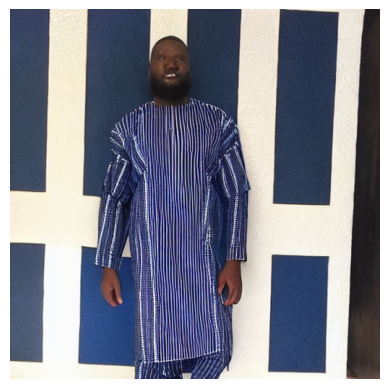

In [ ]:
import matplotlib.pyplot as plt
import torch
import os
import shutil
import json
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from transformers import CLIPTokenizer
from PIL import Image
from diffusers import DiffusionPipeline

# Verify CUDA availability
print(torch.cuda.is_available())  # Should print: True

# Load the stable diffusion pipeline
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipeline.to("cuda")

# Define the refined text prompt
text_prompt = "a gentleman is wearing very dark Blue longsleeve Kaftan with a single horizontal white and green stripes accross the chest, the pants is very dark blue and its Handcrafted in Nigeria, this sharply cut kaftan is effortlessly classic and a must have for any African man who wants to impress"
# Generate the image
result = pipeline(text_prompt).images[0]

# Display the generated image using matplotlib
plt.imshow(result)
plt.axis('off')
plt.show()


## MODEL ARCHITECTURE: UNET

In [ ]:
# # Load the pipeline
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)

# Access and print U-Net model architecture
print("UNet Model Architecture:")
print(pipeline.unet)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

UNet Model Architecture:
UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linea

##MODEL ARCHITECTURE: VAE

In [ ]:
# Access and print VAE model architecture
print("\nVAE Model Architecture:")
print(pipeline.vae)



VAE Model Architecture:
AutoencoderKL(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, af

##MODEL ARCHITECTURE: CLIPTextModel

In [ ]:
# Access and print Text Encoder architecture
print("\nText Encoder Architecture:")
print(pipeline.text_encoder)


Text Encoder Architecture:
CLIPTextModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm

#PREPARING THE DATASET

In [ ]:
!pip install python-docx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 18.3 MB/s eta 0:00:00


##CONVERTING FROM WORD DOCUMENT TO METADATA.JSONL FILE

In [ ]:
# Define the project root and paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
doc_path = os.path.join(PROJECT_ROOT, "African_dataset.docx")
jsonl_path = os.path.join(PROJECT_ROOT, "copyAfricametadata.jsonl")

# Function to convert Word document to JSONL format
def convert_docx_to_jsonl(doc_path, jsonl_path):
    try:
        # Read the Word document
        doc = Document(doc_path)
        data = []

        description = None
        file_name = None

        for para in doc.paragraphs:
            text = para.text.strip()
            if text.lower().startswith("description:"):
                description = text.replace("Description:", "").replace("description:", "").strip()
            elif "image id:" in text.lower():
                file_name = (text.lower()
                             .replace("image id:", "")
                             .replace("#", "")
                             .strip())
                if description and file_name:
                    entry = {
                        "text": description,
                        "file_name": file_name
                    }
                    data.append(entry)
                    description = None
                    file_name = None

        # Write to JSONL file
        with open(jsonl_path, 'w') as jsonl_file:
            for entry in data:
                jsonl_file.write(json.dumps(entry) + '\n')

        print(f"Successfully converted {doc_path} to {jsonl_path}")
        print(f"Total number of entries: {len(data)}")
    except Exception as e:
        print(f"Error during conversion: {e}")

# Function to read and print a few lines from a JSONL file
def print_few_lines_from_jsonl(jsonl_path, num_lines=5):
    try:
        with open(jsonl_path, 'r') as file:
            lines = file.readlines()
            print(f"Total number of entries: {len(lines)}")
            for line in lines[:num_lines]:
                print(json.loads(line))
    except Exception as e:
        print(f"Error reading file: {e}")

# Check if JSONL file already exists
if os.path.exists(jsonl_path):
    print(f"{jsonl_path} already exists. Skipping conversion.")
else:
    # Convert the Word document to JSONL
    convert_docx_to_jsonl(doc_path, jsonl_path)

# Print a few lines from the JSONL file
print_few_lines_from_jsonl(jsonl_path)



/content/drive/MyDrive/fashion-diffusion/copyAfricametadata.jsonl already exists. Skipping conversion.
Total number of entries: 8005
{'text': 'The lady is wearing a red African-inspired chiffon kimono designed for maternity, plus size, and curves. It features a front zipper closure and comes with a waist belt for added style. Perfect for a sexy streetwear look.', 'file_name': 'image4.png'}
{'text': 'The lady is wearing a Cisse Bogolan cloak made from Bògòlanfini (Mudcloth) fabric originating from Mali and handcrafted in Ghana. This unisex, one-size lightweight piece is crafted from hand-woven Malian cotton fabric featuring natural tiny spaces and pulls at the seams where panels are sewn together, adding unique charm and personality. The black cloak includes inner strings for closure and deep comfortable pockets, making it perfect for casual streetwear.', 'file_name': 'image5.png'}
{'text': 'The lady is wearing a red long shirt-cut dress featuring a love umbrella and butterfly print mad

In [ ]:
import os

# Define the project root and new image folder path
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
new_image_folder_path = os.path.join(PROJECT_ROOT, "InFashAiv1_images")

# Get list of image files in the new folder
try:
    image_files_in_new_folder = os.listdir(new_image_folder_path)
    total_images_in_new_folder = len(image_files_in_new_folder)
    print(f"Total number of images in {new_image_folder_path}: {total_images_in_new_folder}")
except FileNotFoundError:
    print(f"Error: The directory {new_image_folder_path} does not exist.")


Total number of images in /content/drive/MyDrive/fashion-diffusion/InFashAiv1_images: 8005


##CONVERTING IMAGES FROM RGB TO RGBA

In [ ]:
# Define the project root and paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
image_folder_path = os.path.join(PROJECT_ROOT, "InFashAiv1_images")
jsonl_path = os.path.join(PROJECT_ROOT, "copyAfricametadata.jsonl")
status_file_path = os.path.join(PROJECT_ROOT, "conversion_status.txt")

# Load the JSON Lines file to get image filenames and metadata
def load_json_metadata(jsonl_path):
    with open(jsonl_path, 'r') as file:
        return [json.loads(line) for line in file]

# Function to get filenames from metadata
def get_filenames_from_metadata(jsonl_path):
    metadata = load_json_metadata(jsonl_path)
    filenames = {entry['file_name'] for entry in metadata}
    return filenames

# Function to get filenames from image folder
def get_filenames_from_folder(folder_path):
    filenames = {file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))}
    return filenames

# Load the status file to check if the conversion process has already been done
def load_conversion_status(status_file_path):
    return os.path.exists(status_file_path)

# Save the status indicating that the conversion process has been completed
def save_conversion_status(status_file_path):
    with open(status_file_path, 'w') as file:
        file.write("Conversion completed.")

# Convert images to RGBA format and save as PNG in the same folder
def convert_images_to_rgba_and_save_as_png(image_folder_path):
    for file in os.listdir(image_folder_path):
        if file.lower().endswith('.jpg'):
            file_path = os.path.join(image_folder_path, file)
            with Image.open(file_path) as img:
                rgba_image = img.convert("RGBA")
                new_filename = os.path.splitext(file)[0] + ".png"
                new_file_path = os.path.join(image_folder_path, new_filename)
                rgba_image.save(new_file_path)

# Get the list of valid filenames from metadata
valid_filenames = get_filenames_from_metadata(jsonl_path)

# Get the list of filenames in the image folder
folder_filenames = get_filenames_from_folder(image_folder_path)

# Find images present in the folder but not in the metadata
images_not_in_metadata = folder_filenames - valid_filenames

# Find images present in the metadata but not in the folder
images_not_in_folder = valid_filenames - folder_filenames

# Print the results
print(f"Total number of images in folder: {len(folder_filenames)}")
print(f"Total number of filenames in metadata: {len(valid_filenames)}")
print(f"Number of images in folder but not in metadata: {len(images_not_in_metadata)}")
print(f"Number of images in metadata but not in folder: {len(images_not_in_folder)}")

print("\nImages in folder but not in metadata:")
for image in images_not_in_metadata:
    print(image)

print("\nImages in metadata but not in folder:")
for image in images_not_in_folder:
    print(image)

# Check if the conversion process has already been done
if not load_conversion_status(status_file_path):
    # Convert images to RGBA format and save as PNG
    convert_images_to_rgba_and_save_as_png(image_folder_path)
    # Save the status indicating that the conversion process has been completed
    save_conversion_status(status_file_path)
    print("Conversion to RGBA and saving as PNG completed.")
else:
    print("Conversion to RGBA and saving as PNG has already been completed. Skipping process.")



Total number of images in folder: 8005
Total number of filenames in metadata: 8005
Number of images in folder but not in metadata: 0
Number of images in metadata but not in folder: 0

Images in folder but not in metadata:

Images in metadata but not in folder:
Conversion to RGBA and saving as PNG has already been completed. Skipping process.


#TRAINING LOOP

##3500 SUBSET

In [ ]:

def convert_rgb_to_rgba(image_path):
    with Image.open(image_path) as img:
        if img.mode != 'RGBA':
            # Convert image to RGBA if not already in RGBA mode
            rgba_image = img.convert('RGBA')
            return rgba_image
        return img

def save_converted_image(image, original_path):
    # Change file extension to .png for RGBA images
    base, _ = os.path.splitext(original_path)
    new_path = f"{base}.png"

    image.save(new_path)
    print(f"Saved image: {new_path}")

def process_images(image_dir):
    # Iterate over all files in the directory
    for filename in os.listdir(image_dir):
        file_path = os.path.join(image_dir, filename)
        # Process only image files with .jpg extension
        if os.path.isfile(file_path) and filename.lower().endswith('.jpg'):
            rgba_image = convert_rgb_to_rgba(file_path)
            save_converted_image(rgba_image, file_path)
            # Optionally, delete the original JPG file
            os.remove(file_path)

    print("Image conversion process complete.")



# Transformations for images
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5, 0.5), (0.5, 0.5, 0.5, 0.5))  # Normalize for 4 channels (RGBA)
])

class FashionDataset(Dataset):
    def __init__(self, image_paths, captions, tokenizer, transform=None):
        self.image_paths = image_paths
        self.captions = captions
        self.tokenizer = tokenizer
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        caption = self.captions[idx]

        image = Image.open(image_path).convert("RGBA")  # Convert to RGBA
        if self.transform:
            image = self.transform(image)

        inputs = self.tokenizer(caption, return_tensors="pt", padding="max_length", truncation=True, max_length=77)
        input_ids = inputs["input_ids"].squeeze(0)
        attention_mask = inputs["attention_mask"].squeeze(0)

        return image, input_ids, attention_mask


jsonl_path = os.path.join(PROJECT_ROOT, "InFashAIv1_images2_subset3500", "metadata.jsonl")
image_dir = os.path.join(PROJECT_ROOT, "InFashAIv1_images2_subset3500")

# Function to load metadata
def load_metadata(jsonl_path):
    image_paths = []
    captions = []
    with open(jsonl_path, 'r') as file:
        for line in file:
            data = json.loads(line)
            image_paths.append(data['file_name'])  # 'file_name' is the key for the image file path
            captions.append(data['text'])         # 'text' is the key for the caption
    return image_paths, captions

# Load metadata
image_paths, captions = load_metadata(jsonl_path)

# Prepend the image directory to the image paths
image_paths = [os.path.join(image_dir, img) for img in image_paths]

# Split data into training and validation sets
image_paths_train, image_paths_val, captions_train, captions_val = train_test_split(
    image_paths, captions, test_size=0.2, random_state=42
)

# Load the pre-trained Stable Diffusion model
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipeline.to("cuda")  # Ensure the model is moved to GPU

# Access the necessary components from the pipeline
tokenizer = pipeline.tokenizer
clip_model = pipeline.text_encoder
vae = pipeline.vae
unet = pipeline.unet
noise_scheduler = pipeline.scheduler  # Correctly initialize the noise_scheduler


# Assuming `image_paths_train`, `captions_train`, `tokenizer`, `image_paths_val`, and `captions_val` are defined
# Create datasets for training and validation
train_dataset = FashionDataset(image_paths_train, captions_train, tokenizer, transform)
val_dataset = FashionDataset(image_paths_val, captions_val, tokenizer, transform)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

No checkpoint found at /content/drive/MyDrive/fashion-diffusion/checkpoint/checkpoint_epoch_1huh.pth, starting from epoch 1


Epoch 1/10:   1%|          | 32/2825 [01:08<1:38:51,  2.12s/it]

accumulating gradients


Epoch 1/10:   2%|▏         | 64/2825 [02:19<1:45:57,  2.30s/it]

accumulating gradients


Epoch 1/10:   3%|▎         | 96/2825 [03:26<1:40:23,  2.21s/it]

accumulating gradients


Epoch 1/10:   5%|▍         | 128/2825 [04:35<1:34:38,  2.11s/it]

accumulating gradients


Epoch 1/10:   6%|▌         | 160/2825 [05:44<1:35:44,  2.16s/it]

accumulating gradients


Epoch 1/10:   7%|▋         | 192/2825 [06:51<1:27:18,  1.99s/it]

accumulating gradients


Epoch 1/10:   8%|▊         | 224/2825 [07:59<1:28:56,  2.05s/it]

accumulating gradients


Epoch 1/10:   9%|▉         | 256/2825 [09:07<1:26:52,  2.03s/it]

accumulating gradients


Epoch 1/10:  10%|█         | 288/2825 [10:16<1:34:53,  2.24s/it]

accumulating gradients


Epoch 1/10:  11%|█▏        | 320/2825 [11:24<1:30:43,  2.17s/it]

accumulating gradients


Epoch 1/10:  12%|█▏        | 352/2825 [12:33<1:28:59,  2.16s/it]

accumulating gradients


Epoch 1/10:  14%|█▎        | 384/2825 [13:43<1:28:59,  2.19s/it]

accumulating gradients


Epoch 1/10:  15%|█▍        | 416/2825 [14:50<1:23:39,  2.08s/it]

accumulating gradients


Epoch 1/10:  16%|█▌        | 448/2825 [15:58<1:19:47,  2.01s/it]

accumulating gradients


Epoch 1/10:  17%|█▋        | 480/2825 [17:06<1:29:25,  2.29s/it]

accumulating gradients


Epoch 1/10:  18%|█▊        | 512/2825 [18:14<1:17:18,  2.01s/it]

accumulating gradients


Epoch 1/10:  19%|█▉        | 544/2825 [19:23<1:15:37,  1.99s/it]

accumulating gradients


Epoch 1/10:  20%|██        | 576/2825 [20:30<1:18:06,  2.08s/it]

accumulating gradients


Epoch 1/10:  22%|██▏       | 608/2825 [21:37<1:19:12,  2.14s/it]

accumulating gradients


Epoch 1/10:  23%|██▎       | 640/2825 [22:45<1:18:31,  2.16s/it]

accumulating gradients


Epoch 1/10:  24%|██▍       | 672/2825 [23:52<1:15:34,  2.11s/it]

accumulating gradients


Epoch 1/10:  25%|██▍       | 704/2825 [25:00<1:16:15,  2.16s/it]

accumulating gradients


Epoch 1/10:  26%|██▌       | 736/2825 [26:06<1:11:06,  2.04s/it]

accumulating gradients


Epoch 1/10:  27%|██▋       | 768/2825 [27:15<1:17:31,  2.26s/it]

accumulating gradients


Epoch 1/10:  28%|██▊       | 800/2825 [28:22<1:13:06,  2.17s/it]

accumulating gradients


Epoch 1/10:  29%|██▉       | 832/2825 [29:28<1:07:15,  2.02s/it]

accumulating gradients


Epoch 1/10:  31%|███       | 864/2825 [30:36<1:13:18,  2.24s/it]

accumulating gradients


Epoch 1/10:  32%|███▏      | 896/2825 [31:44<1:10:18,  2.19s/it]

accumulating gradients


Epoch 1/10:  33%|███▎      | 928/2825 [32:53<1:09:21,  2.19s/it]

accumulating gradients


Epoch 1/10:  34%|███▍      | 960/2825 [34:01<1:06:58,  2.15s/it]

accumulating gradients


Epoch 1/10:  35%|███▌      | 992/2825 [35:07<1:05:55,  2.16s/it]

accumulating gradients


Epoch 1/10:  36%|███▌      | 1024/2825 [36:15<1:02:37,  2.09s/it]

accumulating gradients


Epoch 1/10:  37%|███▋      | 1056/2825 [37:21<1:00:09,  2.04s/it]

accumulating gradients


Epoch 1/10:  39%|███▊      | 1088/2825 [38:28<1:02:14,  2.15s/it]

accumulating gradients


Epoch 1/10:  40%|███▉      | 1120/2825 [39:34<1:00:51,  2.14s/it]

accumulating gradients


Epoch 1/10:  41%|████      | 1152/2825 [40:41<58:44,  2.11s/it]

accumulating gradients


Epoch 1/10:  42%|████▏     | 1184/2825 [41:47<56:48,  2.08s/it]

accumulating gradients


Epoch 1/10:  43%|████▎     | 1216/2825 [42:56<56:45,  2.12s/it]

accumulating gradients


Epoch 1/10:  44%|████▍     | 1248/2825 [44:04<58:21,  2.22s/it]

accumulating gradients


Epoch 1/10:  45%|████▌     | 1280/2825 [45:11<55:47,  2.17s/it]

accumulating gradients


Epoch 1/10:  46%|████▋     | 1312/2825 [46:17<55:23,  2.20s/it]

accumulating gradients


Epoch 1/10:  48%|████▊     | 1344/2825 [47:24<49:57,  2.02s/it]

accumulating gradients


Epoch 1/10:  49%|████▊     | 1376/2825 [48:29<49:51,  2.06s/it]

accumulating gradients


Epoch 1/10:  50%|████▉     | 1408/2825 [49:34<50:44,  2.15s/it]

accumulating gradients


Epoch 1/10:  51%|█████     | 1440/2825 [50:41<49:00,  2.12s/it]

accumulating gradients


Epoch 1/10:  52%|█████▏    | 1472/2825 [51:51<48:39,  2.16s/it]

accumulating gradients


Epoch 1/10:  53%|█████▎    | 1504/2825 [52:57<47:49,  2.17s/it]

accumulating gradients


Epoch 1/10:  54%|█████▍    | 1536/2825 [54:03<46:31,  2.17s/it]

accumulating gradients


Epoch 1/10:  56%|█████▌    | 1568/2825 [55:11<45:54,  2.19s/it]

accumulating gradients


Epoch 1/10:  57%|█████▋    | 1600/2825 [56:18<43:56,  2.15s/it]

accumulating gradients


Epoch 1/10:  58%|█████▊    | 1632/2825 [57:26<43:31,  2.19s/it]

accumulating gradients


Epoch 1/10:  59%|█████▉    | 1664/2825 [58:31<38:39,  2.00s/it]

accumulating gradients


Epoch 1/10:  60%|██████    | 1696/2825 [59:38<42:31,  2.26s/it]

accumulating gradients


Epoch 1/10:  61%|██████    | 1728/2825 [1:00:46<38:53,  2.13s/it]

accumulating gradients


Epoch 1/10:  62%|██████▏   | 1760/2825 [1:01:52<37:59,  2.14s/it]

accumulating gradients


Epoch 1/10:  63%|██████▎   | 1792/2825 [1:02:59<35:22,  2.05s/it]

accumulating gradients


Epoch 1/10:  65%|██████▍   | 1824/2825 [1:04:04<34:01,  2.04s/it]

accumulating gradients


Epoch 1/10:  66%|██████▌   | 1856/2825 [1:05:11<34:07,  2.11s/it]

accumulating gradients


Epoch 1/10:  67%|██████▋   | 1888/2825 [1:06:16<33:08,  2.12s/it]

accumulating gradients


Epoch 1/10:  68%|██████▊   | 1920/2825 [1:07:21<30:34,  2.03s/it]

accumulating gradients


Epoch 1/10:  69%|██████▉   | 1952/2825 [1:08:28<30:49,  2.12s/it]

accumulating gradients


Epoch 1/10:  70%|███████   | 1984/2825 [1:09:34<28:57,  2.07s/it]

accumulating gradients


Epoch 1/10:  71%|███████▏  | 2016/2825 [1:10:41<28:39,  2.13s/it]

accumulating gradients


Epoch 1/10:  72%|███████▏  | 2048/2825 [1:11:47<27:15,  2.10s/it]

accumulating gradients


Epoch 1/10:  74%|███████▎  | 2080/2825 [1:12:53<26:39,  2.15s/it]

accumulating gradients


Epoch 1/10:  75%|███████▍  | 2112/2825 [1:13:59<25:17,  2.13s/it]

accumulating gradients


Epoch 1/10:  76%|███████▌  | 2144/2825 [1:15:08<26:08,  2.30s/it]

accumulating gradients


Epoch 1/10:  77%|███████▋  | 2176/2825 [1:16:13<22:45,  2.10s/it]

accumulating gradients


Epoch 1/10:  78%|███████▊  | 2208/2825 [1:17:20<22:47,  2.22s/it]

accumulating gradients


Epoch 1/10:  79%|███████▉  | 2240/2825 [1:18:27<21:37,  2.22s/it]

accumulating gradients


Epoch 1/10:  80%|████████  | 2272/2825 [1:19:35<18:22,  1.99s/it]

accumulating gradients


Epoch 1/10:  82%|████████▏ | 2304/2825 [1:20:42<19:08,  2.20s/it]

accumulating gradients


Epoch 1/10:  83%|████████▎ | 2336/2825 [1:21:48<17:21,  2.13s/it]

accumulating gradients


Epoch 1/10:  84%|████████▍ | 2368/2825 [1:22:54<15:47,  2.07s/it]

accumulating gradients


Epoch 1/10:  85%|████████▍ | 2400/2825 [1:24:00<14:13,  2.01s/it]

accumulating gradients


Epoch 1/10:  86%|████████▌ | 2432/2825 [1:25:08<13:50,  2.11s/it]

accumulating gradients


Epoch 1/10:  87%|████████▋ | 2464/2825 [1:26:15<13:15,  2.20s/it]

accumulating gradients


Epoch 1/10:  88%|████████▊ | 2496/2825 [1:27:22<12:03,  2.20s/it]

accumulating gradients


Epoch 1/10:  89%|████████▉ | 2528/2825 [1:28:30<11:04,  2.24s/it]

accumulating gradients


Epoch 1/10:  91%|█████████ | 2560/2825 [1:29:38<09:10,  2.08s/it]

accumulating gradients


Epoch 1/10:  92%|█████████▏| 2592/2825 [1:30:45<08:17,  2.13s/it]

accumulating gradients


Epoch 1/10:  93%|█████████▎| 2624/2825 [1:31:52<07:07,  2.13s/it]

accumulating gradients


Epoch 1/10:  94%|█████████▍| 2656/2825 [1:32:58<06:03,  2.15s/it]

accumulating gradients


Epoch 1/10:  95%|█████████▌| 2688/2825 [1:34:02<04:38,  2.03s/it]

accumulating gradients


Epoch 1/10:  96%|█████████▋| 2720/2825 [1:35:08<03:41,  2.11s/it]

accumulating gradients


Epoch 1/10:  97%|█████████▋| 2752/2825 [1:36:14<02:33,  2.10s/it]

accumulating gradients


Epoch 1/10:  99%|█████████▊| 2784/2825 [1:37:20<01:30,  2.21s/it]

accumulating gradients


Epoch 1/10: 100%|█████████▉| 2816/2825 [1:38:24<00:17,  1.94s/it]

accumulating gradients


Epoch 1/10: 100%|██████████| 2825/2825 [1:38:44<00:00,  2.10s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [42:24<00:00,  3.60s/it]


Epoch 1/10, Train Loss: 0.0134, Validation Loss: 0.0119
Disk usage: 156 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

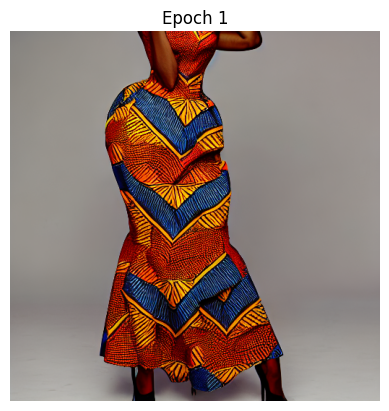

Epoch 2/10:   1%|          | 32/2825 [00:49<1:12:44,  1.56s/it]

accumulating gradients


Epoch 2/10:   2%|▏         | 64/2825 [01:39<1:11:58,  1.56s/it]

accumulating gradients


Epoch 2/10:   3%|▎         | 96/2825 [02:28<1:11:16,  1.57s/it]

accumulating gradients


Epoch 2/10:   5%|▍         | 128/2825 [03:18<1:10:32,  1.57s/it]

accumulating gradients


Epoch 2/10:   6%|▌         | 160/2825 [04:07<1:09:30,  1.57s/it]

accumulating gradients


Epoch 2/10:   7%|▋         | 192/2825 [04:57<1:08:37,  1.56s/it]

accumulating gradients


Epoch 2/10:   8%|▊         | 224/2825 [05:47<1:08:07,  1.57s/it]

accumulating gradients


Epoch 2/10:   9%|▉         | 256/2825 [06:36<1:07:17,  1.57s/it]

accumulating gradients


Epoch 2/10:  10%|█         | 288/2825 [07:26<1:06:30,  1.57s/it]

accumulating gradients


Epoch 2/10:  11%|█▏        | 320/2825 [08:15<1:05:27,  1.57s/it]

accumulating gradients


Epoch 2/10:  12%|█▏        | 352/2825 [09:05<1:04:38,  1.57s/it]

accumulating gradients


Epoch 2/10:  14%|█▎        | 384/2825 [09:54<1:04:16,  1.58s/it]

accumulating gradients


Epoch 2/10:  15%|█▍        | 416/2825 [10:44<1:02:56,  1.57s/it]

accumulating gradients


Epoch 2/10:  16%|█▌        | 448/2825 [11:34<1:01:58,  1.56s/it]

accumulating gradients


Epoch 2/10:  17%|█▋        | 480/2825 [12:23<1:01:16,  1.57s/it]

accumulating gradients


Epoch 2/10:  18%|█▊        | 512/2825 [13:13<1:00:46,  1.58s/it]

accumulating gradients


Epoch 2/10:  19%|█▉        | 544/2825 [14:02<59:43,  1.57s/it]

accumulating gradients


Epoch 2/10:  20%|██        | 576/2825 [14:52<58:34,  1.56s/it]

accumulating gradients


Epoch 2/10:  22%|██▏       | 608/2825 [15:41<57:53,  1.57s/it]

accumulating gradients


Epoch 2/10:  23%|██▎       | 640/2825 [16:31<57:03,  1.57s/it]

accumulating gradients


Epoch 2/10:  24%|██▍       | 672/2825 [17:20<56:07,  1.56s/it]

accumulating gradients


Epoch 2/10:  25%|██▍       | 704/2825 [18:10<55:23,  1.57s/it]

accumulating gradients


Epoch 2/10:  26%|██▌       | 736/2825 [19:00<54:25,  1.56s/it]

accumulating gradients


Epoch 2/10:  27%|██▋       | 768/2825 [19:49<53:57,  1.57s/it]

accumulating gradients


Epoch 2/10:  28%|██▊       | 800/2825 [20:39<52:53,  1.57s/it]

accumulating gradients


Epoch 2/10:  29%|██▉       | 832/2825 [21:28<52:01,  1.57s/it]

accumulating gradients


Epoch 2/10:  31%|███       | 864/2825 [22:18<51:10,  1.57s/it]

accumulating gradients


Epoch 2/10:  32%|███▏      | 896/2825 [23:07<50:29,  1.57s/it]

accumulating gradients


Epoch 2/10:  33%|███▎      | 928/2825 [23:57<49:45,  1.57s/it]

accumulating gradients


Epoch 2/10:  34%|███▍      | 960/2825 [24:47<48:46,  1.57s/it]

accumulating gradients


Epoch 2/10:  35%|███▌      | 992/2825 [25:36<48:03,  1.57s/it]

accumulating gradients


Epoch 2/10:  36%|███▌      | 1024/2825 [26:26<46:59,  1.57s/it]

accumulating gradients


Epoch 2/10:  37%|███▋      | 1056/2825 [27:16<46:10,  1.57s/it]

accumulating gradients


Epoch 2/10:  39%|███▊      | 1088/2825 [28:05<45:31,  1.57s/it]

accumulating gradients


Epoch 2/10:  40%|███▉      | 1120/2825 [28:55<44:30,  1.57s/it]

accumulating gradients


Epoch 2/10:  41%|████      | 1152/2825 [29:44<43:33,  1.56s/it]

accumulating gradients


Epoch 2/10:  42%|████▏     | 1184/2825 [30:34<42:51,  1.57s/it]

accumulating gradients


Epoch 2/10:  43%|████▎     | 1216/2825 [31:23<41:53,  1.56s/it]

accumulating gradients


Epoch 2/10:  44%|████▍     | 1248/2825 [32:13<41:21,  1.57s/it]

accumulating gradients


Epoch 2/10:  45%|████▌     | 1280/2825 [33:02<40:15,  1.56s/it]

accumulating gradients


Epoch 2/10:  46%|████▋     | 1312/2825 [33:52<39:43,  1.58s/it]

accumulating gradients


Epoch 2/10:  48%|████▊     | 1344/2825 [34:41<38:38,  1.57s/it]

accumulating gradients


Epoch 2/10:  49%|████▊     | 1376/2825 [35:31<37:59,  1.57s/it]

accumulating gradients


Epoch 2/10:  50%|████▉     | 1408/2825 [36:21<37:01,  1.57s/it]

accumulating gradients


Epoch 2/10:  51%|█████     | 1440/2825 [37:10<36:09,  1.57s/it]

accumulating gradients


Epoch 2/10:  52%|█████▏    | 1472/2825 [38:00<35:22,  1.57s/it]

accumulating gradients


Epoch 2/10:  53%|█████▎    | 1504/2825 [38:49<34:26,  1.56s/it]

accumulating gradients


Epoch 2/10:  54%|█████▍    | 1536/2825 [39:39<34:00,  1.58s/it]

accumulating gradients


Epoch 2/10:  56%|█████▌    | 1568/2825 [40:28<32:46,  1.56s/it]

accumulating gradients


Epoch 2/10:  57%|█████▋    | 1600/2825 [41:18<31:56,  1.56s/it]

accumulating gradients


Epoch 2/10:  58%|█████▊    | 1632/2825 [42:07<31:07,  1.57s/it]

accumulating gradients


Epoch 2/10:  59%|█████▉    | 1664/2825 [42:57<30:19,  1.57s/it]

accumulating gradients


Epoch 2/10:  60%|██████    | 1696/2825 [43:47<29:27,  1.57s/it]

accumulating gradients


Epoch 2/10:  61%|██████    | 1728/2825 [44:36<28:40,  1.57s/it]

accumulating gradients


Epoch 2/10:  62%|██████▏   | 1760/2825 [45:26<27:49,  1.57s/it]

accumulating gradients


Epoch 2/10:  63%|██████▎   | 1792/2825 [46:15<27:02,  1.57s/it]

accumulating gradients


Epoch 2/10:  65%|██████▍   | 1824/2825 [47:05<26:09,  1.57s/it]

accumulating gradients


Epoch 2/10:  66%|██████▌   | 1856/2825 [47:54<25:22,  1.57s/it]

accumulating gradients


Epoch 2/10:  67%|██████▋   | 1888/2825 [48:44<24:28,  1.57s/it]

accumulating gradients


Epoch 2/10:  68%|██████▊   | 1920/2825 [49:33<23:40,  1.57s/it]

accumulating gradients


Epoch 2/10:  69%|██████▉   | 1952/2825 [50:23<22:45,  1.56s/it]

accumulating gradients


Epoch 2/10:  70%|███████   | 1984/2825 [51:12<21:58,  1.57s/it]

accumulating gradients


Epoch 2/10:  71%|███████▏  | 2016/2825 [52:02<21:07,  1.57s/it]

accumulating gradients


Epoch 2/10:  72%|███████▏  | 2048/2825 [52:52<20:22,  1.57s/it]

accumulating gradients


Epoch 2/10:  74%|███████▎  | 2080/2825 [53:41<19:32,  1.57s/it]

accumulating gradients


Epoch 2/10:  75%|███████▍  | 2112/2825 [54:31<18:36,  1.57s/it]

accumulating gradients


Epoch 2/10:  76%|███████▌  | 2144/2825 [55:20<17:45,  1.56s/it]

accumulating gradients


Epoch 2/10:  77%|███████▋  | 2176/2825 [56:10<16:59,  1.57s/it]

accumulating gradients


Epoch 2/10:  78%|███████▊  | 2208/2825 [56:59<16:06,  1.57s/it]

accumulating gradients


Epoch 2/10:  79%|███████▉  | 2240/2825 [57:49<15:15,  1.57s/it]

accumulating gradients


Epoch 2/10:  80%|████████  | 2272/2825 [58:39<14:31,  1.58s/it]

accumulating gradients


Epoch 2/10:  82%|████████▏ | 2304/2825 [59:28<13:39,  1.57s/it]

accumulating gradients


Epoch 2/10:  83%|████████▎ | 2336/2825 [1:00:18<12:44,  1.56s/it]

accumulating gradients


Epoch 2/10:  84%|████████▍ | 2368/2825 [1:01:07<11:58,  1.57s/it]

accumulating gradients


Epoch 2/10:  85%|████████▍ | 2400/2825 [1:01:57<11:05,  1.57s/it]

accumulating gradients


Epoch 2/10:  86%|████████▌ | 2432/2825 [1:02:47<10:13,  1.56s/it]

accumulating gradients


Epoch 2/10:  87%|████████▋ | 2464/2825 [1:03:36<09:25,  1.57s/it]

accumulating gradients


Epoch 2/10:  88%|████████▊ | 2496/2825 [1:04:26<08:36,  1.57s/it]

accumulating gradients


Epoch 2/10:  89%|████████▉ | 2528/2825 [1:05:15<07:45,  1.57s/it]

accumulating gradients


Epoch 2/10:  91%|█████████ | 2560/2825 [1:06:05<06:55,  1.57s/it]

accumulating gradients


Epoch 2/10:  92%|█████████▏| 2592/2825 [1:06:54<06:05,  1.57s/it]

accumulating gradients


Epoch 2/10:  93%|█████████▎| 2624/2825 [1:07:44<05:16,  1.58s/it]

accumulating gradients


Epoch 2/10:  94%|█████████▍| 2656/2825 [1:08:34<04:24,  1.57s/it]

accumulating gradients


Epoch 2/10:  95%|█████████▌| 2688/2825 [1:09:23<03:35,  1.57s/it]

accumulating gradients


Epoch 2/10:  96%|█████████▋| 2720/2825 [1:10:13<02:44,  1.57s/it]

accumulating gradients


Epoch 2/10:  97%|█████████▋| 2752/2825 [1:11:03<01:54,  1.56s/it]

accumulating gradients


Epoch 2/10:  99%|█████████▊| 2784/2825 [1:11:52<01:04,  1.57s/it]

accumulating gradients


Epoch 2/10: 100%|█████████▉| 2816/2825 [1:12:42<00:14,  1.57s/it]

accumulating gradients


Epoch 2/10: 100%|██████████| 2825/2825 [1:12:56<00:00,  1.55s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [35:45<00:00,  3.03s/it]


Epoch 2/10, Train Loss: 0.0114, Validation Loss: 0.0117
Disk usage: 147 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

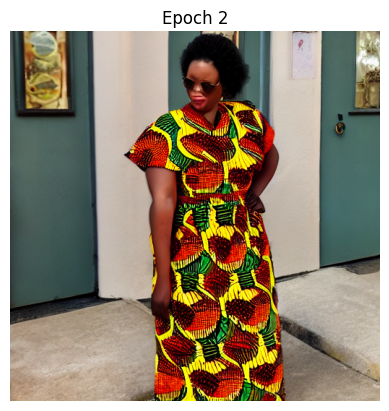

Epoch 3/10:   1%|          | 32/2825 [00:49<1:12:50,  1.56s/it]

accumulating gradients


Epoch 3/10:   2%|▏         | 64/2825 [01:39<1:12:03,  1.57s/it]

accumulating gradients


Epoch 3/10:   3%|▎         | 96/2825 [02:28<1:11:32,  1.57s/it]

accumulating gradients


Epoch 3/10:   5%|▍         | 128/2825 [03:18<1:10:43,  1.57s/it]

accumulating gradients


Epoch 3/10:   6%|▌         | 160/2825 [04:08<1:09:36,  1.57s/it]

accumulating gradients


Epoch 3/10:   7%|▋         | 192/2825 [04:57<1:08:49,  1.57s/it]

accumulating gradients


Epoch 3/10:   8%|▊         | 224/2825 [05:47<1:08:03,  1.57s/it]

accumulating gradients


Epoch 3/10:   9%|▉         | 256/2825 [06:36<1:07:28,  1.58s/it]

accumulating gradients


Epoch 3/10:  10%|█         | 288/2825 [07:26<1:06:09,  1.56s/it]

accumulating gradients


Epoch 3/10:  11%|█▏        | 320/2825 [08:16<1:05:32,  1.57s/it]

accumulating gradients


Epoch 3/10:  12%|█▏        | 352/2825 [09:05<1:04:20,  1.56s/it]

accumulating gradients


Epoch 3/10:  14%|█▎        | 384/2825 [09:55<1:03:55,  1.57s/it]

accumulating gradients


Epoch 3/10:  15%|█▍        | 416/2825 [10:44<1:03:02,  1.57s/it]

accumulating gradients


Epoch 3/10:  16%|█▌        | 448/2825 [11:34<1:01:55,  1.56s/it]

accumulating gradients


Epoch 3/10:  17%|█▋        | 480/2825 [12:23<1:01:37,  1.58s/it]

accumulating gradients


Epoch 3/10:  18%|█▊        | 512/2825 [13:13<1:00:17,  1.56s/it]

accumulating gradients


Epoch 3/10:  19%|█▉        | 544/2825 [14:02<59:33,  1.57s/it]

accumulating gradients


Epoch 3/10:  20%|██        | 576/2825 [14:52<58:36,  1.56s/it]

accumulating gradients


Epoch 3/10:  22%|██▏       | 608/2825 [15:42<57:58,  1.57s/it]

accumulating gradients


Epoch 3/10:  23%|██▎       | 640/2825 [16:31<57:07,  1.57s/it]

accumulating gradients


Epoch 3/10:  24%|██▍       | 672/2825 [17:21<56:15,  1.57s/it]

accumulating gradients


Epoch 3/10:  25%|██▍       | 704/2825 [18:10<55:14,  1.56s/it]

accumulating gradients


Epoch 3/10:  26%|██▌       | 736/2825 [19:00<54:24,  1.56s/it]

accumulating gradients


Epoch 3/10:  27%|██▋       | 768/2825 [19:50<53:57,  1.57s/it]

accumulating gradients


Epoch 3/10:  28%|██▊       | 800/2825 [20:39<52:54,  1.57s/it]

accumulating gradients


Epoch 3/10:  29%|██▉       | 832/2825 [21:29<52:00,  1.57s/it]

accumulating gradients


Epoch 3/10:  31%|███       | 864/2825 [22:18<51:14,  1.57s/it]

accumulating gradients


Epoch 3/10:  32%|███▏      | 896/2825 [23:08<50:20,  1.57s/it]

accumulating gradients


Epoch 3/10:  33%|███▎      | 928/2825 [23:58<49:53,  1.58s/it]

accumulating gradients


Epoch 3/10:  34%|███▍      | 960/2825 [24:47<48:42,  1.57s/it]

accumulating gradients


Epoch 3/10:  35%|███▌      | 992/2825 [25:37<47:48,  1.56s/it]

accumulating gradients


Epoch 3/10:  36%|███▌      | 1024/2825 [26:26<46:58,  1.56s/it]

accumulating gradients


Epoch 3/10:  37%|███▋      | 1056/2825 [27:16<46:16,  1.57s/it]

accumulating gradients


Epoch 3/10:  39%|███▊      | 1088/2825 [28:06<45:12,  1.56s/it]

accumulating gradients


Epoch 3/10:  40%|███▉      | 1120/2825 [28:55<44:37,  1.57s/it]

accumulating gradients


Epoch 3/10:  41%|████      | 1152/2825 [29:45<43:37,  1.56s/it]

accumulating gradients


Epoch 3/10:  42%|████▏     | 1184/2825 [30:34<42:48,  1.57s/it]

accumulating gradients


Epoch 3/10:  43%|████▎     | 1216/2825 [31:24<42:00,  1.57s/it]

accumulating gradients


Epoch 3/10:  44%|████▍     | 1248/2825 [32:14<41:10,  1.57s/it]

accumulating gradients


Epoch 3/10:  45%|████▌     | 1280/2825 [33:03<40:21,  1.57s/it]

accumulating gradients


Epoch 3/10:  46%|████▋     | 1312/2825 [33:53<39:34,  1.57s/it]

accumulating gradients


Epoch 3/10:  48%|████▊     | 1344/2825 [34:42<38:43,  1.57s/it]

accumulating gradients


Epoch 3/10:  49%|████▊     | 1376/2825 [35:32<37:48,  1.57s/it]

accumulating gradients


Epoch 3/10:  50%|████▉     | 1408/2825 [36:21<36:58,  1.57s/it]

accumulating gradients


Epoch 3/10:  51%|█████     | 1440/2825 [37:11<36:09,  1.57s/it]

accumulating gradients


Epoch 3/10:  52%|█████▏    | 1472/2825 [38:01<35:15,  1.56s/it]

accumulating gradients


Epoch 3/10:  53%|█████▎    | 1504/2825 [38:50<34:23,  1.56s/it]

accumulating gradients


Epoch 3/10:  54%|█████▍    | 1536/2825 [39:40<33:42,  1.57s/it]

accumulating gradients


Epoch 3/10:  56%|█████▌    | 1568/2825 [40:29<32:57,  1.57s/it]

accumulating gradients


Epoch 3/10:  57%|█████▋    | 1600/2825 [41:19<32:07,  1.57s/it]

accumulating gradients


Epoch 3/10:  58%|█████▊    | 1632/2825 [42:08<31:06,  1.56s/it]

accumulating gradients


Epoch 3/10:  59%|█████▉    | 1664/2825 [42:58<30:25,  1.57s/it]

accumulating gradients


Epoch 3/10:  60%|██████    | 1696/2825 [43:48<29:30,  1.57s/it]

accumulating gradients


Epoch 3/10:  61%|██████    | 1728/2825 [44:37<28:35,  1.56s/it]

accumulating gradients


Epoch 3/10:  62%|██████▏   | 1760/2825 [45:27<27:50,  1.57s/it]

accumulating gradients


Epoch 3/10:  63%|██████▎   | 1792/2825 [46:16<26:57,  1.57s/it]

accumulating gradients


Epoch 3/10:  65%|██████▍   | 1824/2825 [47:06<26:07,  1.57s/it]

accumulating gradients


Epoch 3/10:  66%|██████▌   | 1856/2825 [47:55<25:16,  1.57s/it]

accumulating gradients


Epoch 3/10:  67%|██████▋   | 1888/2825 [48:45<24:27,  1.57s/it]

accumulating gradients


Epoch 3/10:  68%|██████▊   | 1920/2825 [49:35<23:42,  1.57s/it]

accumulating gradients


Epoch 3/10:  69%|██████▉   | 1952/2825 [50:24<22:46,  1.57s/it]

accumulating gradients


Epoch 3/10:  70%|███████   | 1984/2825 [51:14<21:56,  1.57s/it]

accumulating gradients


Epoch 3/10:  71%|███████▏  | 2016/2825 [52:03<21:04,  1.56s/it]

accumulating gradients


Epoch 3/10:  72%|███████▏  | 2048/2825 [52:53<20:13,  1.56s/it]

accumulating gradients


Epoch 3/10:  74%|███████▎  | 2080/2825 [53:42<19:25,  1.56s/it]

accumulating gradients


Epoch 3/10:  75%|███████▍  | 2112/2825 [54:32<18:37,  1.57s/it]

accumulating gradients


Epoch 3/10:  76%|███████▌  | 2144/2825 [55:21<17:48,  1.57s/it]

accumulating gradients


Epoch 3/10:  77%|███████▋  | 2176/2825 [56:11<16:56,  1.57s/it]

accumulating gradients


Epoch 3/10:  78%|███████▊  | 2208/2825 [57:01<16:09,  1.57s/it]

accumulating gradients


Epoch 3/10:  79%|███████▉  | 2240/2825 [57:50<15:15,  1.56s/it]

accumulating gradients


Epoch 3/10:  80%|████████  | 2272/2825 [58:40<14:27,  1.57s/it]

accumulating gradients


Epoch 3/10:  82%|████████▏ | 2304/2825 [59:30<13:39,  1.57s/it]

accumulating gradients


Epoch 3/10:  83%|████████▎ | 2336/2825 [1:00:19<12:50,  1.57s/it]

accumulating gradients


Epoch 3/10:  84%|████████▍ | 2368/2825 [1:01:09<11:54,  1.56s/it]

accumulating gradients


Epoch 3/10:  85%|████████▍ | 2400/2825 [1:01:58<11:08,  1.57s/it]

accumulating gradients


Epoch 3/10:  86%|████████▌ | 2432/2825 [1:02:48<10:14,  1.56s/it]

accumulating gradients


Epoch 3/10:  87%|████████▋ | 2464/2825 [1:03:38<09:25,  1.57s/it]

accumulating gradients


Epoch 3/10:  88%|████████▊ | 2496/2825 [1:04:27<08:35,  1.57s/it]

accumulating gradients


Epoch 3/10:  89%|████████▉ | 2528/2825 [1:05:17<07:50,  1.59s/it]

accumulating gradients


Epoch 3/10:  91%|█████████ | 2560/2825 [1:06:07<06:55,  1.57s/it]

accumulating gradients


Epoch 3/10:  92%|█████████▏| 2592/2825 [1:06:56<06:04,  1.56s/it]

accumulating gradients


Epoch 3/10:  93%|█████████▎| 2624/2825 [1:07:46<05:14,  1.57s/it]

accumulating gradients


Epoch 3/10:  94%|█████████▍| 2656/2825 [1:08:35<04:25,  1.57s/it]

accumulating gradients


Epoch 3/10:  95%|█████████▌| 2688/2825 [1:09:25<03:34,  1.56s/it]

accumulating gradients


Epoch 3/10:  96%|█████████▋| 2720/2825 [1:10:15<02:44,  1.57s/it]

accumulating gradients


Epoch 3/10:  97%|█████████▋| 2752/2825 [1:11:04<01:54,  1.56s/it]

accumulating gradients


Epoch 3/10:  99%|█████████▊| 2784/2825 [1:11:54<01:04,  1.56s/it]

accumulating gradients


Epoch 3/10: 100%|█████████▉| 2816/2825 [1:12:43<00:14,  1.56s/it]

accumulating gradients


Epoch 3/10: 100%|██████████| 2825/2825 [1:12:57<00:00,  1.55s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [35:45<00:00,  3.04s/it]


Epoch 3/10, Train Loss: 0.0108, Validation Loss: 0.0092
Disk usage: 138 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

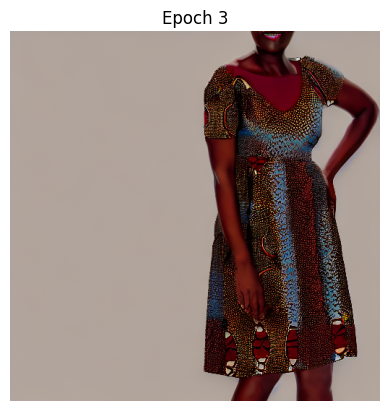

Epoch 4/10:   1%|          | 32/2825 [00:49<1:13:15,  1.57s/it]

accumulating gradients


Epoch 4/10:   2%|▏         | 64/2825 [01:39<1:12:18,  1.57s/it]

accumulating gradients


Epoch 4/10:   3%|▎         | 96/2825 [02:28<1:11:12,  1.57s/it]

accumulating gradients


Epoch 4/10:   5%|▍         | 128/2825 [03:18<1:10:25,  1.57s/it]

accumulating gradients


Epoch 4/10:   6%|▌         | 160/2825 [04:07<1:09:33,  1.57s/it]

accumulating gradients


Epoch 4/10:   7%|▋         | 192/2825 [04:57<1:08:41,  1.57s/it]

accumulating gradients


Epoch 4/10:   8%|▊         | 224/2825 [05:47<1:07:56,  1.57s/it]

accumulating gradients


Epoch 4/10:   9%|▉         | 256/2825 [06:36<1:07:23,  1.57s/it]

accumulating gradients


Epoch 4/10:  10%|█         | 288/2825 [07:26<1:06:24,  1.57s/it]

accumulating gradients


Epoch 4/10:  11%|█▏        | 320/2825 [08:16<1:05:43,  1.57s/it]

accumulating gradients


Epoch 4/10:  12%|█▏        | 352/2825 [09:05<1:04:32,  1.57s/it]

accumulating gradients


Epoch 4/10:  14%|█▎        | 384/2825 [09:55<1:03:49,  1.57s/it]

accumulating gradients


Epoch 4/10:  15%|█▍        | 416/2825 [10:44<1:02:53,  1.57s/it]

accumulating gradients


Epoch 4/10:  16%|█▌        | 448/2825 [11:34<1:02:05,  1.57s/it]

accumulating gradients


Epoch 4/10:  17%|█▋        | 480/2825 [12:24<1:01:36,  1.58s/it]

accumulating gradients


Epoch 4/10:  18%|█▊        | 512/2825 [13:13<1:00:35,  1.57s/it]

accumulating gradients


Epoch 4/10:  19%|█▉        | 544/2825 [14:03<59:56,  1.58s/it]

accumulating gradients


Epoch 4/10:  20%|██        | 576/2825 [14:52<58:45,  1.57s/it]

accumulating gradients


Epoch 4/10:  22%|██▏       | 608/2825 [15:42<58:13,  1.58s/it]

accumulating gradients


Epoch 4/10:  23%|██▎       | 640/2825 [16:32<57:04,  1.57s/it]

accumulating gradients


Epoch 4/10:  24%|██▍       | 672/2825 [17:21<56:09,  1.57s/it]

accumulating gradients


Epoch 4/10:  25%|██▍       | 704/2825 [18:11<55:17,  1.56s/it]

accumulating gradients


Epoch 4/10:  26%|██▌       | 736/2825 [19:00<54:35,  1.57s/it]

accumulating gradients


Epoch 4/10:  27%|██▋       | 768/2825 [19:50<53:46,  1.57s/it]

accumulating gradients


Epoch 4/10:  28%|██▊       | 800/2825 [20:39<52:48,  1.56s/it]

accumulating gradients


Epoch 4/10:  29%|██▉       | 832/2825 [21:29<52:15,  1.57s/it]

accumulating gradients


Epoch 4/10:  31%|███       | 864/2825 [22:19<51:14,  1.57s/it]

accumulating gradients


Epoch 4/10:  32%|███▏      | 896/2825 [23:08<50:19,  1.57s/it]

accumulating gradients


Epoch 4/10:  33%|███▎      | 928/2825 [23:58<49:34,  1.57s/it]

accumulating gradients


Epoch 4/10:  34%|███▍      | 960/2825 [24:47<48:37,  1.56s/it]

accumulating gradients


Epoch 4/10:  35%|███▌      | 992/2825 [25:37<47:53,  1.57s/it]

accumulating gradients


Epoch 4/10:  36%|███▌      | 1024/2825 [26:27<46:58,  1.57s/it]

accumulating gradients


Epoch 4/10:  37%|███▋      | 1056/2825 [27:16<46:07,  1.56s/it]

accumulating gradients


Epoch 4/10:  39%|███▊      | 1088/2825 [28:06<45:23,  1.57s/it]

accumulating gradients


Epoch 4/10:  40%|███▉      | 1120/2825 [28:55<44:37,  1.57s/it]

accumulating gradients


Epoch 4/10:  41%|████      | 1152/2825 [29:45<43:42,  1.57s/it]

accumulating gradients


Epoch 4/10:  42%|████▏     | 1184/2825 [30:35<42:57,  1.57s/it]

accumulating gradients


Epoch 4/10:  43%|████▎     | 1216/2825 [31:24<42:04,  1.57s/it]

accumulating gradients


Epoch 4/10:  44%|████▍     | 1248/2825 [32:14<41:06,  1.56s/it]

accumulating gradients


Epoch 4/10:  45%|████▌     | 1280/2825 [33:03<40:23,  1.57s/it]

accumulating gradients


Epoch 4/10:  46%|████▋     | 1312/2825 [33:53<39:35,  1.57s/it]

accumulating gradients


Epoch 4/10:  48%|████▊     | 1344/2825 [34:42<38:46,  1.57s/it]

accumulating gradients


Epoch 4/10:  49%|████▊     | 1376/2825 [35:32<37:51,  1.57s/it]

accumulating gradients


Epoch 4/10:  50%|████▉     | 1408/2825 [36:22<37:09,  1.57s/it]

accumulating gradients


Epoch 4/10:  51%|█████     | 1440/2825 [37:11<36:06,  1.56s/it]

accumulating gradients


Epoch 4/10:  52%|█████▏    | 1472/2825 [38:01<35:27,  1.57s/it]

accumulating gradients


Epoch 4/10:  53%|█████▎    | 1504/2825 [38:50<34:24,  1.56s/it]

accumulating gradients


Epoch 4/10:  54%|█████▍    | 1536/2825 [39:40<33:43,  1.57s/it]

accumulating gradients


Epoch 4/10:  56%|█████▌    | 1568/2825 [40:29<32:46,  1.56s/it]

accumulating gradients


Epoch 4/10:  57%|█████▋    | 1600/2825 [41:19<31:53,  1.56s/it]

accumulating gradients


Epoch 4/10:  58%|█████▊    | 1632/2825 [42:08<31:06,  1.56s/it]

accumulating gradients


Epoch 4/10:  59%|█████▉    | 1664/2825 [42:58<30:33,  1.58s/it]

accumulating gradients


Epoch 4/10:  60%|██████    | 1696/2825 [43:48<29:38,  1.58s/it]

accumulating gradients


Epoch 4/10:  61%|██████    | 1728/2825 [44:37<28:41,  1.57s/it]

accumulating gradients


Epoch 4/10:  62%|██████▏   | 1760/2825 [45:27<27:56,  1.57s/it]

accumulating gradients


Epoch 4/10:  63%|██████▎   | 1792/2825 [46:17<27:02,  1.57s/it]

accumulating gradients


Epoch 4/10:  65%|██████▍   | 1824/2825 [47:06<26:10,  1.57s/it]

accumulating gradients


Epoch 4/10:  66%|██████▌   | 1856/2825 [47:56<25:19,  1.57s/it]

accumulating gradients


Epoch 4/10:  67%|██████▋   | 1888/2825 [48:45<24:34,  1.57s/it]

accumulating gradients


Epoch 4/10:  68%|██████▊   | 1920/2825 [49:35<23:36,  1.57s/it]

accumulating gradients


Epoch 4/10:  69%|██████▉   | 1952/2825 [50:25<22:47,  1.57s/it]

accumulating gradients


Epoch 4/10:  70%|███████   | 1984/2825 [51:14<21:56,  1.57s/it]

accumulating gradients


Epoch 4/10:  71%|███████▏  | 2016/2825 [52:04<21:05,  1.56s/it]

accumulating gradients


Epoch 4/10:  72%|███████▏  | 2048/2825 [52:53<20:20,  1.57s/it]

accumulating gradients


Epoch 4/10:  74%|███████▎  | 2080/2825 [53:43<19:27,  1.57s/it]

accumulating gradients


Epoch 4/10:  75%|███████▍  | 2112/2825 [54:33<18:35,  1.56s/it]

accumulating gradients


Epoch 4/10:  76%|███████▌  | 2144/2825 [55:22<17:45,  1.56s/it]

accumulating gradients


Epoch 4/10:  77%|███████▋  | 2176/2825 [56:12<16:53,  1.56s/it]

accumulating gradients


Epoch 4/10:  78%|███████▊  | 2208/2825 [57:01<16:06,  1.57s/it]

accumulating gradients


Epoch 4/10:  79%|███████▉  | 2240/2825 [57:51<15:15,  1.56s/it]

accumulating gradients


Epoch 4/10:  80%|████████  | 2272/2825 [58:40<14:26,  1.57s/it]

accumulating gradients


Epoch 4/10:  82%|████████▏ | 2304/2825 [59:30<13:40,  1.57s/it]

accumulating gradients


Epoch 4/10:  83%|████████▎ | 2336/2825 [1:00:20<12:44,  1.56s/it]

accumulating gradients


Epoch 4/10:  84%|████████▍ | 2368/2825 [1:01:09<11:55,  1.57s/it]

accumulating gradients


Epoch 4/10:  85%|████████▍ | 2400/2825 [1:01:59<11:05,  1.57s/it]

accumulating gradients


Epoch 4/10:  86%|████████▌ | 2432/2825 [1:02:48<10:18,  1.57s/it]

accumulating gradients


Epoch 4/10:  87%|████████▋ | 2464/2825 [1:03:38<09:26,  1.57s/it]

accumulating gradients


Epoch 4/10:  88%|████████▊ | 2496/2825 [1:04:27<08:35,  1.57s/it]

accumulating gradients


Epoch 4/10:  89%|████████▉ | 2528/2825 [1:05:17<07:46,  1.57s/it]

accumulating gradients


Epoch 4/10:  91%|█████████ | 2560/2825 [1:06:07<06:56,  1.57s/it]

accumulating gradients


Epoch 4/10:  92%|█████████▏| 2592/2825 [1:06:56<06:05,  1.57s/it]

accumulating gradients


Epoch 4/10:  93%|█████████▎| 2624/2825 [1:07:46<05:14,  1.57s/it]

accumulating gradients


Epoch 4/10:  94%|█████████▍| 2656/2825 [1:08:35<04:24,  1.57s/it]

accumulating gradients


Epoch 4/10:  95%|█████████▌| 2688/2825 [1:09:25<03:34,  1.56s/it]

accumulating gradients


Epoch 4/10:  96%|█████████▋| 2720/2825 [1:10:15<02:44,  1.56s/it]

accumulating gradients


Epoch 4/10:  97%|█████████▋| 2752/2825 [1:11:04<01:54,  1.56s/it]

accumulating gradients


Epoch 4/10:  99%|█████████▊| 2784/2825 [1:11:54<01:04,  1.57s/it]

accumulating gradients


Epoch 4/10: 100%|█████████▉| 2816/2825 [1:12:43<00:14,  1.57s/it]

accumulating gradients


Epoch 4/10: 100%|██████████| 2825/2825 [1:12:57<00:00,  1.55s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [35:45<00:00,  3.03s/it]


Epoch 4/10, Train Loss: 0.0102, Validation Loss: 0.0104
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

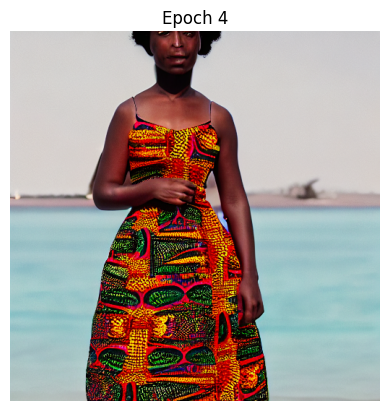

Epoch 5/10:   1%|          | 32/2825 [00:49<1:12:40,  1.56s/it]

accumulating gradients


Epoch 5/10:   2%|▏         | 64/2825 [01:39<1:12:13,  1.57s/it]

accumulating gradients


Epoch 5/10:   3%|▎         | 96/2825 [02:28<1:11:18,  1.57s/it]

accumulating gradients


Epoch 5/10:   5%|▍         | 128/2825 [03:18<1:10:57,  1.58s/it]

accumulating gradients


Epoch 5/10:   6%|▌         | 160/2825 [04:08<1:09:29,  1.56s/it]

accumulating gradients


Epoch 5/10:   7%|▋         | 192/2825 [04:58<1:09:10,  1.58s/it]

accumulating gradients


Epoch 5/10:   8%|▊         | 224/2825 [05:48<1:07:46,  1.56s/it]

accumulating gradients


Epoch 5/10:   9%|▉         | 256/2825 [06:38<1:07:31,  1.58s/it]

accumulating gradients


Epoch 5/10:  10%|█         | 288/2825 [07:27<1:06:37,  1.58s/it]

accumulating gradients


Epoch 5/10:  11%|█▏        | 320/2825 [08:17<1:05:21,  1.57s/it]

accumulating gradients


Epoch 5/10:  12%|█▏        | 352/2825 [09:06<1:04:30,  1.56s/it]

accumulating gradients


Epoch 5/10:  14%|█▎        | 384/2825 [09:56<1:03:44,  1.57s/it]

accumulating gradients


Epoch 5/10:  15%|█▍        | 416/2825 [10:47<1:04:54,  1.62s/it]

accumulating gradients


Epoch 5/10:  16%|█▌        | 448/2825 [11:37<1:02:10,  1.57s/it]

accumulating gradients


Epoch 5/10:  17%|█▋        | 480/2825 [12:28<1:01:50,  1.58s/it]

accumulating gradients


Epoch 5/10:  18%|█▊        | 512/2825 [13:17<1:00:31,  1.57s/it]

accumulating gradients


Epoch 5/10:  19%|█▉        | 544/2825 [14:08<59:31,  1.57s/it]

accumulating gradients


Epoch 5/10:  20%|██        | 576/2825 [14:58<58:53,  1.57s/it]

accumulating gradients


Epoch 5/10:  22%|██▏       | 608/2825 [15:47<57:50,  1.57s/it]

accumulating gradients


Epoch 5/10:  23%|██▎       | 640/2825 [16:37<56:58,  1.56s/it]

accumulating gradients


Epoch 5/10:  24%|██▍       | 672/2825 [17:26<56:15,  1.57s/it]

accumulating gradients


Epoch 5/10:  25%|██▍       | 704/2825 [18:16<55:18,  1.56s/it]

accumulating gradients


Epoch 5/10:  26%|██▌       | 736/2825 [19:06<54:32,  1.57s/it]

accumulating gradients


Epoch 5/10:  27%|██▋       | 768/2825 [19:55<53:51,  1.57s/it]

accumulating gradients


Epoch 5/10:  28%|██▊       | 800/2825 [20:45<56:07,  1.66s/it]

accumulating gradients


Epoch 5/10:  29%|██▉       | 832/2825 [21:35<52:02,  1.57s/it]

accumulating gradients


Epoch 5/10:  31%|███       | 864/2825 [22:25<52:51,  1.62s/it]

accumulating gradients


Epoch 5/10:  32%|███▏      | 896/2825 [23:15<50:15,  1.56s/it]

accumulating gradients


Epoch 5/10:  33%|███▎      | 928/2825 [24:05<49:49,  1.58s/it]

accumulating gradients


Epoch 5/10:  34%|███▍      | 960/2825 [24:55<53:55,  1.73s/it]

accumulating gradients


Epoch 5/10:  35%|███▌      | 992/2825 [25:44<47:55,  1.57s/it]

accumulating gradients


Epoch 5/10:  36%|███▌      | 1024/2825 [26:35<47:08,  1.57s/it]

accumulating gradients


Epoch 5/10:  37%|███▋      | 1056/2825 [27:25<46:11,  1.57s/it]

accumulating gradients


Epoch 5/10:  39%|███▊      | 1088/2825 [28:15<45:11,  1.56s/it]

accumulating gradients


Epoch 5/10:  40%|███▉      | 1120/2825 [29:06<44:45,  1.58s/it]

accumulating gradients


Epoch 5/10:  41%|████      | 1152/2825 [29:55<43:37,  1.56s/it]

accumulating gradients


Epoch 5/10:  42%|████▏     | 1184/2825 [30:45<42:45,  1.56s/it]

accumulating gradients


Epoch 5/10:  43%|████▎     | 1216/2825 [31:34<41:57,  1.56s/it]

accumulating gradients


Epoch 5/10:  44%|████▍     | 1248/2825 [32:24<41:07,  1.56s/it]

accumulating gradients


Epoch 5/10:  45%|████▌     | 1280/2825 [33:14<40:58,  1.59s/it]

accumulating gradients


Epoch 5/10:  46%|████▋     | 1312/2825 [34:04<39:30,  1.57s/it]

accumulating gradients


Epoch 5/10:  48%|████▊     | 1344/2825 [34:53<38:37,  1.56s/it]

accumulating gradients


Epoch 5/10:  49%|████▊     | 1376/2825 [35:43<37:49,  1.57s/it]

accumulating gradients


Epoch 5/10:  50%|████▉     | 1408/2825 [36:33<39:13,  1.66s/it]

accumulating gradients


Epoch 5/10:  51%|█████     | 1440/2825 [37:23<36:42,  1.59s/it]

accumulating gradients


Epoch 5/10:  52%|█████▏    | 1472/2825 [38:13<35:23,  1.57s/it]

accumulating gradients


Epoch 5/10:  53%|█████▎    | 1504/2825 [39:03<34:38,  1.57s/it]

accumulating gradients


Epoch 5/10:  54%|█████▍    | 1536/2825 [39:53<33:54,  1.58s/it]

accumulating gradients


Epoch 5/10:  56%|█████▌    | 1568/2825 [40:42<32:54,  1.57s/it]

accumulating gradients


Epoch 5/10:  57%|█████▋    | 1600/2825 [41:32<32:02,  1.57s/it]

accumulating gradients


Epoch 5/10:  58%|█████▊    | 1632/2825 [42:22<31:21,  1.58s/it]

accumulating gradients


Epoch 5/10:  59%|█████▉    | 1664/2825 [43:11<30:15,  1.56s/it]

accumulating gradients


Epoch 5/10:  60%|██████    | 1696/2825 [44:01<29:28,  1.57s/it]

accumulating gradients


Epoch 5/10:  61%|██████    | 1728/2825 [44:50<28:41,  1.57s/it]

accumulating gradients


Epoch 5/10:  62%|██████▏   | 1760/2825 [45:40<27:46,  1.56s/it]

accumulating gradients


Epoch 5/10:  63%|██████▎   | 1792/2825 [46:29<27:02,  1.57s/it]

accumulating gradients


Epoch 5/10:  65%|██████▍   | 1824/2825 [47:19<26:11,  1.57s/it]

accumulating gradients


Epoch 5/10:  66%|██████▌   | 1856/2825 [48:10<25:41,  1.59s/it]

accumulating gradients


Epoch 5/10:  67%|██████▋   | 1888/2825 [49:00<24:28,  1.57s/it]

accumulating gradients


Epoch 5/10:  68%|██████▊   | 1920/2825 [49:51<23:40,  1.57s/it]

accumulating gradients


Epoch 5/10:  69%|██████▉   | 1952/2825 [50:41<22:58,  1.58s/it]

accumulating gradients


Epoch 5/10:  70%|███████   | 1984/2825 [51:31<22:04,  1.57s/it]

accumulating gradients


Epoch 5/10:  71%|███████▏  | 2016/2825 [52:21<21:05,  1.56s/it]

accumulating gradients


Epoch 5/10:  72%|███████▏  | 2048/2825 [53:10<20:18,  1.57s/it]

accumulating gradients


Epoch 5/10:  74%|███████▎  | 2080/2825 [54:00<19:30,  1.57s/it]

accumulating gradients


Epoch 5/10:  75%|███████▍  | 2112/2825 [54:50<18:36,  1.57s/it]

accumulating gradients


Epoch 5/10:  76%|███████▌  | 2144/2825 [55:39<17:46,  1.57s/it]

accumulating gradients


Epoch 5/10:  77%|███████▋  | 2176/2825 [56:29<16:54,  1.56s/it]

accumulating gradients


Epoch 5/10:  78%|███████▊  | 2208/2825 [57:18<16:05,  1.56s/it]

accumulating gradients


Epoch 5/10:  79%|███████▉  | 2240/2825 [58:08<15:16,  1.57s/it]

accumulating gradients


Epoch 5/10:  80%|████████  | 2272/2825 [58:58<14:28,  1.57s/it]

accumulating gradients


Epoch 5/10:  82%|████████▏ | 2304/2825 [59:48<13:35,  1.57s/it]

accumulating gradients


Epoch 5/10:  83%|████████▎ | 2336/2825 [1:00:37<12:45,  1.56s/it]

accumulating gradients


Epoch 5/10:  84%|████████▍ | 2368/2825 [1:01:27<11:56,  1.57s/it]

accumulating gradients


Epoch 5/10:  85%|████████▍ | 2400/2825 [1:02:18<11:04,  1.56s/it]

accumulating gradients


Epoch 5/10:  86%|████████▌ | 2432/2825 [1:03:07<10:16,  1.57s/it]

accumulating gradients


Epoch 5/10:  87%|████████▋ | 2464/2825 [1:03:57<09:25,  1.57s/it]

accumulating gradients


Epoch 5/10:  88%|████████▊ | 2496/2825 [1:04:47<08:36,  1.57s/it]

accumulating gradients


Epoch 5/10:  89%|████████▉ | 2528/2825 [1:05:36<07:47,  1.57s/it]

accumulating gradients


Epoch 5/10:  91%|█████████ | 2560/2825 [1:06:27<06:55,  1.57s/it]

accumulating gradients


Epoch 5/10:  92%|█████████▏| 2592/2825 [1:07:17<06:05,  1.57s/it]

accumulating gradients


Epoch 5/10:  93%|█████████▎| 2624/2825 [1:08:06<05:13,  1.56s/it]

accumulating gradients


Epoch 5/10:  94%|█████████▍| 2656/2825 [1:08:56<04:24,  1.56s/it]

accumulating gradients


Epoch 5/10:  95%|█████████▌| 2688/2825 [1:09:45<03:35,  1.58s/it]

accumulating gradients


Epoch 5/10:  96%|█████████▋| 2720/2825 [1:10:36<02:44,  1.56s/it]

accumulating gradients


Epoch 5/10:  97%|█████████▋| 2752/2825 [1:11:25<01:54,  1.57s/it]

accumulating gradients


Epoch 5/10:  99%|█████████▊| 2784/2825 [1:12:15<01:04,  1.57s/it]

accumulating gradients


Epoch 5/10: 100%|█████████▉| 2816/2825 [1:13:04<00:14,  1.57s/it]

accumulating gradients


Epoch 5/10: 100%|██████████| 2825/2825 [1:13:18<00:00,  1.56s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [35:46<00:00,  3.04s/it]


Epoch 5/10, Train Loss: 0.0101, Validation Loss: 0.0105
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

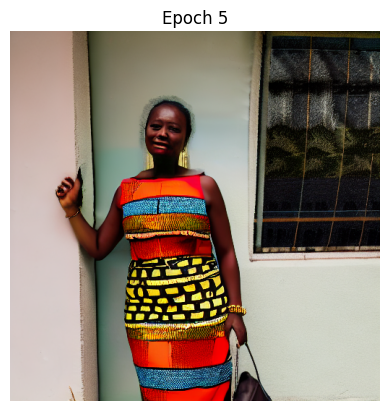

Epoch 6/10:   1%|          | 32/2825 [00:49<1:13:01,  1.57s/it]

accumulating gradients


Epoch 6/10:   2%|▏         | 64/2825 [01:39<1:11:55,  1.56s/it]

accumulating gradients


Epoch 6/10:   3%|▎         | 96/2825 [02:28<1:11:21,  1.57s/it]

accumulating gradients


Epoch 6/10:   5%|▍         | 128/2825 [03:18<1:11:13,  1.58s/it]

accumulating gradients


Epoch 6/10:   6%|▌         | 160/2825 [04:08<1:09:35,  1.57s/it]

accumulating gradients


Epoch 6/10:   7%|▋         | 192/2825 [04:57<1:09:13,  1.58s/it]

accumulating gradients


Epoch 6/10:   8%|▊         | 224/2825 [05:47<1:08:00,  1.57s/it]

accumulating gradients


Epoch 6/10:   9%|▉         | 256/2825 [06:37<1:07:12,  1.57s/it]

accumulating gradients


Epoch 6/10:  10%|█         | 288/2825 [07:27<1:06:03,  1.56s/it]

accumulating gradients


Epoch 6/10:  11%|█▏        | 320/2825 [08:16<1:05:21,  1.57s/it]

accumulating gradients


Epoch 6/10:  12%|█▏        | 352/2825 [09:07<1:05:10,  1.58s/it]

accumulating gradients


Epoch 6/10:  14%|█▎        | 384/2825 [09:56<1:03:40,  1.57s/it]

accumulating gradients


Epoch 6/10:  15%|█▍        | 416/2825 [10:46<1:03:10,  1.57s/it]

accumulating gradients


Epoch 6/10:  16%|█▌        | 448/2825 [11:36<1:01:56,  1.56s/it]

accumulating gradients


Epoch 6/10:  17%|█▋        | 480/2825 [12:26<1:01:14,  1.57s/it]

accumulating gradients


Epoch 6/10:  18%|█▊        | 512/2825 [13:16<1:00:22,  1.57s/it]

accumulating gradients


Epoch 6/10:  19%|█▉        | 544/2825 [14:06<59:38,  1.57s/it]

accumulating gradients


Epoch 6/10:  20%|██        | 576/2825 [14:56<58:40,  1.57s/it]

accumulating gradients


Epoch 6/10:  22%|██▏       | 608/2825 [15:46<57:47,  1.56s/it]

accumulating gradients


Epoch 6/10:  23%|██▎       | 640/2825 [16:35<57:01,  1.57s/it]

accumulating gradients


Epoch 6/10:  24%|██▍       | 672/2825 [17:25<56:13,  1.57s/it]

accumulating gradients


Epoch 6/10:  25%|██▍       | 704/2825 [18:14<55:23,  1.57s/it]

accumulating gradients


Epoch 6/10:  26%|██▌       | 736/2825 [19:04<54:33,  1.57s/it]

accumulating gradients


Epoch 6/10:  27%|██▋       | 768/2825 [19:54<53:55,  1.57s/it]

accumulating gradients


Epoch 6/10:  28%|██▊       | 800/2825 [20:44<52:58,  1.57s/it]

accumulating gradients


Epoch 6/10:  29%|██▉       | 832/2825 [21:34<52:15,  1.57s/it]

accumulating gradients


Epoch 6/10:  31%|███       | 864/2825 [22:23<51:27,  1.57s/it]

accumulating gradients


Epoch 6/10:  32%|███▏      | 896/2825 [23:13<50:21,  1.57s/it]

accumulating gradients


Epoch 6/10:  33%|███▎      | 928/2825 [24:02<49:40,  1.57s/it]

accumulating gradients


Epoch 6/10:  34%|███▍      | 960/2825 [24:52<48:48,  1.57s/it]

accumulating gradients


Epoch 6/10:  35%|███▌      | 992/2825 [25:42<47:57,  1.57s/it]

accumulating gradients


Epoch 6/10:  36%|███▌      | 1024/2825 [26:31<46:57,  1.56s/it]

accumulating gradients


Epoch 6/10:  37%|███▋      | 1056/2825 [27:21<46:10,  1.57s/it]

accumulating gradients


Epoch 6/10:  39%|███▊      | 1088/2825 [28:10<45:39,  1.58s/it]

accumulating gradients


Epoch 6/10:  40%|███▉      | 1120/2825 [29:00<44:37,  1.57s/it]

accumulating gradients


Epoch 6/10:  41%|████      | 1152/2825 [29:50<43:39,  1.57s/it]

accumulating gradients


Epoch 6/10:  42%|████▏     | 1184/2825 [30:39<42:50,  1.57s/it]

accumulating gradients


Epoch 6/10:  43%|████▎     | 1216/2825 [31:29<42:01,  1.57s/it]

accumulating gradients


Epoch 6/10:  44%|████▍     | 1248/2825 [32:18<41:06,  1.56s/it]

accumulating gradients


Epoch 6/10:  45%|████▌     | 1280/2825 [33:08<40:13,  1.56s/it]

accumulating gradients


Epoch 6/10:  46%|████▋     | 1312/2825 [33:57<39:43,  1.58s/it]

accumulating gradients


Epoch 6/10:  48%|████▊     | 1344/2825 [34:47<38:40,  1.57s/it]

accumulating gradients


Epoch 6/10:  49%|████▊     | 1376/2825 [35:37<38:07,  1.58s/it]

accumulating gradients


Epoch 6/10:  50%|████▉     | 1408/2825 [36:26<37:01,  1.57s/it]

accumulating gradients


Epoch 6/10:  51%|█████     | 1440/2825 [37:16<36:17,  1.57s/it]

accumulating gradients


Epoch 6/10:  52%|█████▏    | 1472/2825 [38:05<35:21,  1.57s/it]

accumulating gradients


Epoch 6/10:  53%|█████▎    | 1504/2825 [38:55<34:37,  1.57s/it]

accumulating gradients


Epoch 6/10:  54%|█████▍    | 1536/2825 [39:45<33:36,  1.56s/it]

accumulating gradients


Epoch 6/10:  56%|█████▌    | 1568/2825 [40:35<32:51,  1.57s/it]

accumulating gradients


Epoch 6/10:  57%|█████▋    | 1600/2825 [41:24<31:58,  1.57s/it]

accumulating gradients


Epoch 6/10:  58%|█████▊    | 1632/2825 [42:14<31:08,  1.57s/it]

accumulating gradients


Epoch 6/10:  59%|█████▉    | 1664/2825 [43:04<30:15,  1.56s/it]

accumulating gradients


Epoch 6/10:  60%|██████    | 1696/2825 [43:53<29:35,  1.57s/it]

accumulating gradients


Epoch 6/10:  61%|██████    | 1728/2825 [44:43<28:37,  1.57s/it]

accumulating gradients


Epoch 6/10:  62%|██████▏   | 1760/2825 [45:33<27:52,  1.57s/it]

accumulating gradients


Epoch 6/10:  63%|██████▎   | 1792/2825 [46:22<27:00,  1.57s/it]

accumulating gradients


Epoch 6/10:  65%|██████▍   | 1824/2825 [47:12<26:15,  1.57s/it]

accumulating gradients


Epoch 6/10:  66%|██████▌   | 1856/2825 [48:01<25:14,  1.56s/it]

accumulating gradients


Epoch 6/10:  67%|██████▋   | 1888/2825 [48:51<24:24,  1.56s/it]

accumulating gradients


Epoch 6/10:  68%|██████▊   | 1920/2825 [49:41<23:42,  1.57s/it]

accumulating gradients


Epoch 6/10:  69%|██████▉   | 1952/2825 [50:31<22:52,  1.57s/it]

accumulating gradients


Epoch 6/10:  70%|███████   | 1984/2825 [51:21<21:58,  1.57s/it]

accumulating gradients


Epoch 6/10:  71%|███████▏  | 2016/2825 [52:11<21:18,  1.58s/it]

accumulating gradients


Epoch 6/10:  72%|███████▏  | 2048/2825 [53:00<20:18,  1.57s/it]

accumulating gradients


Epoch 6/10:  74%|███████▎  | 2080/2825 [53:50<19:26,  1.57s/it]

accumulating gradients


Epoch 6/10:  75%|███████▍  | 2112/2825 [54:39<18:35,  1.56s/it]

accumulating gradients


Epoch 6/10:  76%|███████▌  | 2144/2825 [55:29<17:45,  1.57s/it]

accumulating gradients


Epoch 6/10:  77%|███████▋  | 2176/2825 [56:18<16:54,  1.56s/it]

accumulating gradients


Epoch 6/10:  78%|███████▊  | 2208/2825 [57:08<16:07,  1.57s/it]

accumulating gradients


Epoch 6/10:  79%|███████▉  | 2240/2825 [57:58<15:17,  1.57s/it]

accumulating gradients


Epoch 6/10:  80%|████████  | 2272/2825 [58:47<14:27,  1.57s/it]

accumulating gradients


Epoch 6/10:  82%|████████▏ | 2304/2825 [59:37<13:36,  1.57s/it]

accumulating gradients


Epoch 6/10:  83%|████████▎ | 2336/2825 [1:00:27<12:46,  1.57s/it]

accumulating gradients


Epoch 6/10:  84%|████████▍ | 2368/2825 [1:01:16<11:55,  1.57s/it]

accumulating gradients


Epoch 6/10:  85%|████████▍ | 2400/2825 [1:02:06<11:09,  1.57s/it]

accumulating gradients


Epoch 6/10:  86%|████████▌ | 2432/2825 [1:02:55<10:17,  1.57s/it]

accumulating gradients


Epoch 6/10:  87%|████████▋ | 2464/2825 [1:03:45<09:25,  1.57s/it]

accumulating gradients


Epoch 6/10:  88%|████████▊ | 2496/2825 [1:04:35<08:38,  1.58s/it]

accumulating gradients


Epoch 6/10:  89%|████████▉ | 2528/2825 [1:05:24<07:46,  1.57s/it]

accumulating gradients


Epoch 6/10:  91%|█████████ | 2560/2825 [1:06:14<06:56,  1.57s/it]

accumulating gradients


Epoch 6/10:  92%|█████████▏| 2592/2825 [1:07:04<06:05,  1.57s/it]

accumulating gradients


Epoch 6/10:  93%|█████████▎| 2624/2825 [1:07:53<05:15,  1.57s/it]

accumulating gradients


Epoch 6/10:  94%|█████████▍| 2656/2825 [1:08:43<04:25,  1.57s/it]

accumulating gradients


Epoch 6/10:  95%|█████████▌| 2688/2825 [1:09:32<03:34,  1.57s/it]

accumulating gradients


Epoch 6/10:  96%|█████████▋| 2720/2825 [1:10:23<02:44,  1.57s/it]

accumulating gradients


Epoch 6/10:  97%|█████████▋| 2752/2825 [1:11:12<01:54,  1.56s/it]

accumulating gradients


Epoch 6/10:  99%|█████████▊| 2784/2825 [1:12:02<01:04,  1.57s/it]

accumulating gradients


Epoch 6/10: 100%|█████████▉| 2816/2825 [1:12:51<00:14,  1.57s/it]

accumulating gradients


Epoch 6/10: 100%|██████████| 2825/2825 [1:13:05<00:00,  1.55s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [35:47<00:00,  3.04s/it]


Epoch 6/10, Train Loss: 0.0099, Validation Loss: 0.0109
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

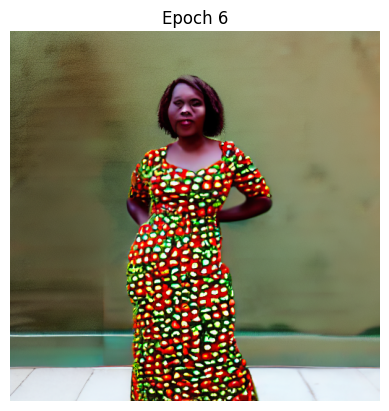

Epoch 7/10:   1%|          | 32/2825 [00:50<1:13:06,  1.57s/it]

accumulating gradients


Epoch 7/10:   2%|▏         | 64/2825 [01:42<1:12:12,  1.57s/it]

accumulating gradients


Epoch 7/10:   3%|▎         | 96/2825 [02:33<1:14:10,  1.63s/it]

accumulating gradients


Epoch 7/10:   5%|▍         | 128/2825 [03:26<1:10:34,  1.57s/it]

accumulating gradients


Epoch 7/10:   6%|▌         | 160/2825 [04:20<1:46:28,  2.40s/it]

accumulating gradients


Epoch 7/10:   7%|▋         | 192/2825 [05:13<1:09:53,  1.59s/it]

accumulating gradients


Epoch 7/10:   8%|▊         | 224/2825 [06:06<1:10:24,  1.62s/it]

accumulating gradients


Epoch 7/10:   9%|▉         | 256/2825 [06:57<1:08:15,  1.59s/it]

accumulating gradients


Epoch 7/10:  10%|█         | 288/2825 [07:50<1:06:24,  1.57s/it]

accumulating gradients


Epoch 7/10:  11%|█▏        | 320/2825 [08:42<1:06:17,  1.59s/it]

accumulating gradients


Epoch 7/10:  12%|█▏        | 352/2825 [09:34<1:08:13,  1.66s/it]

accumulating gradients


Epoch 7/10:  14%|█▎        | 384/2825 [10:24<1:05:44,  1.62s/it]

accumulating gradients


Epoch 7/10:  15%|█▍        | 416/2825 [11:15<1:04:12,  1.60s/it]

accumulating gradients


Epoch 7/10:  16%|█▌        | 448/2825 [12:06<1:04:41,  1.63s/it]

accumulating gradients


Epoch 7/10:  17%|█▋        | 480/2825 [12:57<1:01:27,  1.57s/it]

accumulating gradients


Epoch 7/10:  18%|█▊        | 512/2825 [13:47<1:04:07,  1.66s/it]

accumulating gradients


Epoch 7/10:  19%|█▉        | 544/2825 [14:39<59:56,  1.58s/it]

accumulating gradients


Epoch 7/10:  20%|██        | 576/2825 [15:30<1:00:35,  1.62s/it]

accumulating gradients


Epoch 7/10:  22%|██▏       | 608/2825 [16:21<57:46,  1.56s/it]

accumulating gradients


Epoch 7/10:  23%|██▎       | 640/2825 [17:13<1:02:30,  1.72s/it]

accumulating gradients


Epoch 7/10:  24%|██▍       | 672/2825 [18:05<56:13,  1.57s/it]

accumulating gradients


Epoch 7/10:  25%|██▍       | 704/2825 [18:56<56:49,  1.61s/it]

accumulating gradients


Epoch 7/10:  26%|██▌       | 736/2825 [19:49<58:07,  1.67s/it]

accumulating gradients


Epoch 7/10:  27%|██▋       | 768/2825 [20:41<54:16,  1.58s/it]

accumulating gradients


Epoch 7/10:  28%|██▊       | 800/2825 [21:32<53:13,  1.58s/it]

accumulating gradients


Epoch 7/10:  29%|██▉       | 832/2825 [22:21<52:17,  1.57s/it]

accumulating gradients


Epoch 7/10:  31%|███       | 864/2825 [23:13<52:02,  1.59s/it]

accumulating gradients


Epoch 7/10:  32%|███▏      | 896/2825 [24:07<54:19,  1.69s/it]

accumulating gradients


Epoch 7/10:  33%|███▎      | 928/2825 [24:58<54:26,  1.72s/it]

accumulating gradients


Epoch 7/10:  34%|███▍      | 960/2825 [25:51<54:58,  1.77s/it]

accumulating gradients


Epoch 7/10:  35%|███▌      | 992/2825 [26:40<47:52,  1.57s/it]

accumulating gradients


Epoch 7/10:  36%|███▌      | 1024/2825 [27:34<47:40,  1.59s/it]

accumulating gradients


Epoch 7/10:  37%|███▋      | 1056/2825 [28:25<49:17,  1.67s/it]

accumulating gradients


Epoch 7/10:  39%|███▊      | 1088/2825 [29:17<50:50,  1.76s/it]

accumulating gradients


Epoch 7/10:  40%|███▉      | 1120/2825 [30:06<44:27,  1.56s/it]

accumulating gradients


Epoch 7/10:  41%|████      | 1152/2825 [30:58<43:53,  1.57s/it]

accumulating gradients


Epoch 7/10:  42%|████▏     | 1184/2825 [31:48<42:49,  1.57s/it]

accumulating gradients


Epoch 7/10:  43%|████▎     | 1216/2825 [32:41<44:37,  1.66s/it]

accumulating gradients


Epoch 7/10:  44%|████▍     | 1248/2825 [33:34<43:35,  1.66s/it]

accumulating gradients


Epoch 7/10:  45%|████▌     | 1280/2825 [34:28<40:52,  1.59s/it]

accumulating gradients


Epoch 7/10:  46%|████▋     | 1312/2825 [35:18<39:29,  1.57s/it]

accumulating gradients


Epoch 7/10:  48%|████▊     | 1344/2825 [36:09<39:20,  1.59s/it]

accumulating gradients


Epoch 7/10:  49%|████▊     | 1376/2825 [36:59<37:55,  1.57s/it]

accumulating gradients


Epoch 7/10:  50%|████▉     | 1408/2825 [37:51<37:12,  1.58s/it]

accumulating gradients


Epoch 7/10:  51%|█████     | 1440/2825 [38:42<37:59,  1.65s/it]

accumulating gradients


Epoch 7/10:  52%|█████▏    | 1472/2825 [39:34<36:10,  1.60s/it]

accumulating gradients


Epoch 7/10:  53%|█████▎    | 1504/2825 [40:24<34:32,  1.57s/it]

accumulating gradients


Epoch 7/10:  54%|█████▍    | 1536/2825 [41:15<33:37,  1.57s/it]

accumulating gradients


Epoch 7/10:  56%|█████▌    | 1568/2825 [42:07<34:32,  1.65s/it]

accumulating gradients


Epoch 7/10:  57%|█████▋    | 1600/2825 [42:58<32:20,  1.58s/it]

accumulating gradients


Epoch 7/10:  58%|█████▊    | 1632/2825 [43:51<32:57,  1.66s/it]

accumulating gradients


Epoch 7/10:  59%|█████▉    | 1664/2825 [44:43<30:20,  1.57s/it]

accumulating gradients


Epoch 7/10:  60%|██████    | 1696/2825 [45:35<32:04,  1.70s/it]

accumulating gradients


Epoch 7/10:  61%|██████    | 1728/2825 [46:26<28:44,  1.57s/it]

accumulating gradients


Epoch 7/10:  62%|██████▏   | 1760/2825 [47:16<27:50,  1.57s/it]

accumulating gradients


Epoch 7/10:  63%|██████▎   | 1792/2825 [48:07<27:41,  1.61s/it]

accumulating gradients


Epoch 7/10:  65%|██████▍   | 1824/2825 [49:00<28:26,  1.71s/it]

accumulating gradients


Epoch 7/10:  66%|██████▌   | 1856/2825 [49:49<25:21,  1.57s/it]

accumulating gradients


Epoch 7/10:  67%|██████▋   | 1888/2825 [50:41<24:38,  1.58s/it]

accumulating gradients


Epoch 7/10:  68%|██████▊   | 1920/2825 [51:32<23:55,  1.59s/it]

accumulating gradients


Epoch 7/10:  69%|██████▉   | 1952/2825 [52:23<22:48,  1.57s/it]

accumulating gradients


Epoch 7/10:  70%|███████   | 1984/2825 [53:15<22:58,  1.64s/it]

accumulating gradients


Epoch 7/10:  71%|███████▏  | 2016/2825 [54:06<21:46,  1.61s/it]

accumulating gradients


Epoch 7/10:  72%|███████▏  | 2048/2825 [54:58<22:58,  1.77s/it]

accumulating gradients


Epoch 7/10:  74%|███████▎  | 2080/2825 [55:50<20:15,  1.63s/it]

accumulating gradients


Epoch 7/10:  75%|███████▍  | 2112/2825 [56:42<19:42,  1.66s/it]

accumulating gradients


Epoch 7/10:  76%|███████▌  | 2144/2825 [57:33<17:51,  1.57s/it]

accumulating gradients


Epoch 7/10:  77%|███████▋  | 2176/2825 [58:24<16:56,  1.57s/it]

accumulating gradients


Epoch 7/10:  78%|███████▊  | 2208/2825 [59:17<16:10,  1.57s/it]

accumulating gradients


Epoch 7/10:  79%|███████▉  | 2240/2825 [1:00:09<15:29,  1.59s/it]

accumulating gradients


Epoch 7/10:  80%|████████  | 2272/2825 [1:00:58<14:23,  1.56s/it]

accumulating gradients


Epoch 7/10:  82%|████████▏ | 2304/2825 [1:01:49<13:39,  1.57s/it]

accumulating gradients


Epoch 7/10:  83%|████████▎ | 2336/2825 [1:02:40<12:45,  1.57s/it]

accumulating gradients


Epoch 7/10:  84%|████████▍ | 2368/2825 [1:03:30<11:57,  1.57s/it]

accumulating gradients


Epoch 7/10:  85%|████████▍ | 2400/2825 [1:04:23<12:27,  1.76s/it]

accumulating gradients


Epoch 7/10:  86%|████████▌ | 2432/2825 [1:05:13<10:18,  1.57s/it]

accumulating gradients


Epoch 7/10:  87%|████████▋ | 2464/2825 [1:06:04<09:25,  1.57s/it]

accumulating gradients


Epoch 7/10:  88%|████████▊ | 2496/2825 [1:06:53<08:37,  1.57s/it]

accumulating gradients


Epoch 7/10:  89%|████████▉ | 2528/2825 [1:07:47<07:54,  1.60s/it]

accumulating gradients


Epoch 7/10:  91%|█████████ | 2560/2825 [1:08:37<06:55,  1.57s/it]

accumulating gradients


Epoch 7/10:  92%|█████████▏| 2592/2825 [1:09:28<06:16,  1.62s/it]

accumulating gradients


Epoch 7/10:  93%|█████████▎| 2624/2825 [1:10:18<05:15,  1.57s/it]

accumulating gradients


Epoch 7/10:  94%|█████████▍| 2656/2825 [1:11:08<04:25,  1.57s/it]

accumulating gradients


Epoch 7/10:  95%|█████████▌| 2688/2825 [1:11:59<03:40,  1.61s/it]

accumulating gradients


Epoch 7/10:  96%|█████████▋| 2720/2825 [1:12:50<02:45,  1.57s/it]

accumulating gradients


Epoch 7/10:  97%|█████████▋| 2752/2825 [1:13:42<01:54,  1.57s/it]

accumulating gradients


Epoch 7/10:  99%|█████████▊| 2784/2825 [1:14:32<01:04,  1.57s/it]

accumulating gradients


Epoch 7/10: 100%|█████████▉| 2816/2825 [1:15:24<00:14,  1.64s/it]

accumulating gradients


Epoch 7/10: 100%|██████████| 2825/2825 [1:15:40<00:00,  1.61s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [35:48<00:00,  3.04s/it]


Epoch 7/10, Train Loss: 0.0100, Validation Loss: 0.0109
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

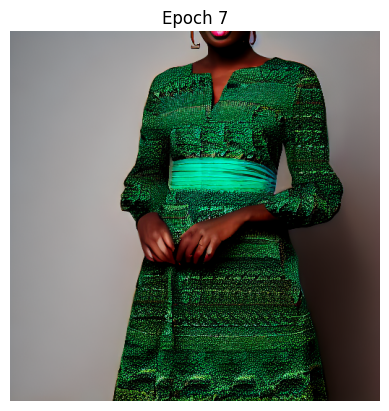

Epoch 8/10:   1%|          | 32/2825 [00:49<1:13:01,  1.57s/it]

accumulating gradients


Epoch 8/10:   2%|▏         | 64/2825 [01:40<1:12:21,  1.57s/it]

accumulating gradients


Epoch 8/10:   3%|▎         | 96/2825 [02:30<1:11:04,  1.56s/it]

accumulating gradients


Epoch 8/10:   5%|▍         | 128/2825 [03:19<1:10:43,  1.57s/it]

accumulating gradients


Epoch 8/10:   6%|▌         | 160/2825 [04:10<1:09:37,  1.57s/it]

accumulating gradients


Epoch 8/10:   7%|▋         | 192/2825 [04:59<1:08:40,  1.56s/it]

accumulating gradients


Epoch 8/10:   8%|▊         | 224/2825 [05:49<1:07:55,  1.57s/it]

accumulating gradients


Epoch 8/10:   9%|▉         | 256/2825 [06:38<1:06:59,  1.56s/it]

accumulating gradients


Epoch 8/10:  10%|█         | 288/2825 [07:28<1:06:46,  1.58s/it]

accumulating gradients


Epoch 8/10:  11%|█▏        | 320/2825 [08:18<1:05:20,  1.57s/it]

accumulating gradients


Epoch 8/10:  12%|█▏        | 352/2825 [09:08<1:04:37,  1.57s/it]

accumulating gradients


Epoch 8/10:  14%|█▎        | 384/2825 [09:58<1:03:58,  1.57s/it]

accumulating gradients


Epoch 8/10:  15%|█▍        | 416/2825 [10:48<1:02:50,  1.57s/it]

accumulating gradients


Epoch 8/10:  16%|█▌        | 448/2825 [11:38<1:02:03,  1.57s/it]

accumulating gradients


Epoch 8/10:  17%|█▋        | 480/2825 [12:28<1:01:45,  1.58s/it]

accumulating gradients


Epoch 8/10:  18%|█▊        | 512/2825 [13:19<1:00:39,  1.57s/it]

accumulating gradients


Epoch 8/10:  19%|█▉        | 544/2825 [14:09<59:53,  1.58s/it]

accumulating gradients


Epoch 8/10:  20%|██        | 576/2825 [14:59<58:46,  1.57s/it]

accumulating gradients


Epoch 8/10:  22%|██▏       | 608/2825 [15:48<57:47,  1.56s/it]

accumulating gradients


Epoch 8/10:  23%|██▎       | 640/2825 [16:39<57:07,  1.57s/it]

accumulating gradients


Epoch 8/10:  24%|██▍       | 672/2825 [17:28<56:17,  1.57s/it]

accumulating gradients


Epoch 8/10:  25%|██▍       | 704/2825 [18:18<55:54,  1.58s/it]

accumulating gradients


Epoch 8/10:  26%|██▌       | 736/2825 [19:07<54:41,  1.57s/it]

accumulating gradients


Epoch 8/10:  27%|██▋       | 768/2825 [19:57<54:01,  1.58s/it]

accumulating gradients


Epoch 8/10:  28%|██▊       | 800/2825 [20:48<53:16,  1.58s/it]

accumulating gradients


Epoch 8/10:  29%|██▉       | 832/2825 [21:38<52:23,  1.58s/it]

accumulating gradients


Epoch 8/10:  31%|███       | 864/2825 [22:29<51:24,  1.57s/it]

accumulating gradients


Epoch 8/10:  32%|███▏      | 896/2825 [23:19<50:22,  1.57s/it]

accumulating gradients


Epoch 8/10:  33%|███▎      | 928/2825 [24:08<49:33,  1.57s/it]

accumulating gradients


Epoch 8/10:  34%|███▍      | 960/2825 [24:58<48:44,  1.57s/it]

accumulating gradients


Epoch 8/10:  35%|███▌      | 992/2825 [25:48<48:07,  1.58s/it]

accumulating gradients


Epoch 8/10:  36%|███▌      | 1024/2825 [26:38<47:02,  1.57s/it]

accumulating gradients


Epoch 8/10:  37%|███▋      | 1056/2825 [27:28<46:23,  1.57s/it]

accumulating gradients


Epoch 8/10:  39%|███▊      | 1088/2825 [28:18<45:16,  1.56s/it]

accumulating gradients


Epoch 8/10:  40%|███▉      | 1120/2825 [29:07<44:29,  1.57s/it]

accumulating gradients


Epoch 8/10:  41%|████      | 1152/2825 [29:58<43:38,  1.56s/it]

accumulating gradients


Epoch 8/10:  42%|████▏     | 1184/2825 [30:47<43:01,  1.57s/it]

accumulating gradients


Epoch 8/10:  43%|████▎     | 1216/2825 [31:37<41:57,  1.56s/it]

accumulating gradients


Epoch 8/10:  44%|████▍     | 1248/2825 [32:26<41:08,  1.57s/it]

accumulating gradients


Epoch 8/10:  45%|████▌     | 1280/2825 [33:17<40:24,  1.57s/it]

accumulating gradients


Epoch 8/10:  46%|████▋     | 1312/2825 [34:06<39:30,  1.57s/it]

accumulating gradients


Epoch 8/10:  48%|████▊     | 1344/2825 [34:57<38:44,  1.57s/it]

accumulating gradients


Epoch 8/10:  49%|████▊     | 1376/2825 [35:46<37:51,  1.57s/it]

accumulating gradients


Epoch 8/10:  50%|████▉     | 1408/2825 [36:36<36:56,  1.56s/it]

accumulating gradients


Epoch 8/10:  51%|█████     | 1440/2825 [37:26<36:12,  1.57s/it]

accumulating gradients


Epoch 8/10:  52%|█████▏    | 1472/2825 [38:16<35:28,  1.57s/it]

accumulating gradients


Epoch 8/10:  53%|█████▎    | 1504/2825 [39:09<34:49,  1.58s/it]

accumulating gradients


Epoch 8/10:  54%|█████▍    | 1536/2825 [39:59<33:49,  1.57s/it]

accumulating gradients


Epoch 8/10:  56%|█████▌    | 1568/2825 [40:49<34:38,  1.65s/it]

accumulating gradients


Epoch 8/10:  57%|█████▋    | 1600/2825 [41:39<31:56,  1.56s/it]

accumulating gradients


Epoch 8/10:  58%|█████▊    | 1632/2825 [42:28<31:17,  1.57s/it]

accumulating gradients


Epoch 8/10:  59%|█████▉    | 1664/2825 [43:18<30:21,  1.57s/it]

accumulating gradients


Epoch 8/10:  60%|██████    | 1696/2825 [44:08<29:32,  1.57s/it]

accumulating gradients


Epoch 8/10:  61%|██████    | 1728/2825 [44:59<28:53,  1.58s/it]

accumulating gradients


Epoch 8/10:  62%|██████▏   | 1760/2825 [45:49<27:47,  1.57s/it]

accumulating gradients


Epoch 8/10:  63%|██████▎   | 1792/2825 [46:40<27:03,  1.57s/it]

accumulating gradients


Epoch 8/10:  65%|██████▍   | 1824/2825 [47:29<26:06,  1.57s/it]

accumulating gradients


Epoch 8/10:  66%|██████▌   | 1856/2825 [48:20<25:23,  1.57s/it]

accumulating gradients


Epoch 8/10:  67%|██████▋   | 1888/2825 [49:10<24:51,  1.59s/it]

accumulating gradients


Epoch 8/10:  68%|██████▊   | 1920/2825 [50:00<23:40,  1.57s/it]

accumulating gradients


Epoch 8/10:  69%|██████▉   | 1952/2825 [50:49<22:50,  1.57s/it]

accumulating gradients


Epoch 8/10:  70%|███████   | 1984/2825 [51:39<21:57,  1.57s/it]

accumulating gradients


Epoch 8/10:  71%|███████▏  | 2016/2825 [52:29<21:04,  1.56s/it]

accumulating gradients


Epoch 8/10:  72%|███████▏  | 2048/2825 [53:19<21:10,  1.64s/it]

accumulating gradients


Epoch 8/10:  74%|███████▎  | 2080/2825 [54:09<19:34,  1.58s/it]

accumulating gradients


Epoch 8/10:  75%|███████▍  | 2112/2825 [54:59<18:41,  1.57s/it]

accumulating gradients


Epoch 8/10:  76%|███████▌  | 2144/2825 [55:49<17:49,  1.57s/it]

accumulating gradients


Epoch 8/10:  77%|███████▋  | 2176/2825 [56:40<17:16,  1.60s/it]

accumulating gradients


Epoch 8/10:  78%|███████▊  | 2208/2825 [57:30<16:09,  1.57s/it]

accumulating gradients


Epoch 8/10:  79%|███████▉  | 2240/2825 [58:21<15:35,  1.60s/it]

accumulating gradients


Epoch 8/10:  80%|████████  | 2272/2825 [59:10<14:27,  1.57s/it]

accumulating gradients


Epoch 8/10:  82%|████████▏ | 2304/2825 [1:00:00<13:39,  1.57s/it]

accumulating gradients


Epoch 8/10:  83%|████████▎ | 2336/2825 [1:00:51<13:16,  1.63s/it]

accumulating gradients


Epoch 8/10:  84%|████████▍ | 2368/2825 [1:01:41<11:55,  1.57s/it]

accumulating gradients


Epoch 8/10:  85%|████████▍ | 2400/2825 [1:02:31<11:11,  1.58s/it]

accumulating gradients


Epoch 8/10:  86%|████████▌ | 2432/2825 [1:03:20<10:16,  1.57s/it]

accumulating gradients


Epoch 8/10:  87%|████████▋ | 2464/2825 [1:04:11<10:01,  1.67s/it]

accumulating gradients


Epoch 8/10:  88%|████████▊ | 2496/2825 [1:05:01<08:38,  1.58s/it]

accumulating gradients


Epoch 8/10:  89%|████████▉ | 2528/2825 [1:05:50<07:47,  1.57s/it]

accumulating gradients


Epoch 8/10:  91%|█████████ | 2560/2825 [1:06:40<06:55,  1.57s/it]

accumulating gradients


Epoch 8/10:  92%|█████████▏| 2592/2825 [1:07:30<06:06,  1.57s/it]

accumulating gradients


Epoch 8/10:  93%|█████████▎| 2624/2825 [1:08:20<05:17,  1.58s/it]

accumulating gradients


Epoch 8/10:  94%|█████████▍| 2656/2825 [1:09:10<04:24,  1.57s/it]

accumulating gradients


Epoch 8/10:  95%|█████████▌| 2688/2825 [1:09:59<03:35,  1.57s/it]

accumulating gradients


Epoch 8/10:  96%|█████████▋| 2720/2825 [1:10:50<03:04,  1.76s/it]

accumulating gradients


Epoch 8/10:  97%|█████████▋| 2752/2825 [1:11:40<01:54,  1.57s/it]

accumulating gradients


Epoch 8/10:  99%|█████████▊| 2784/2825 [1:12:31<01:04,  1.58s/it]

accumulating gradients


Epoch 8/10: 100%|█████████▉| 2816/2825 [1:13:20<00:14,  1.58s/it]

accumulating gradients


Epoch 8/10: 100%|██████████| 2825/2825 [1:13:34<00:00,  1.56s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [35:49<00:00,  3.04s/it]


Epoch 8/10, Train Loss: 0.0093, Validation Loss: 0.0091
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

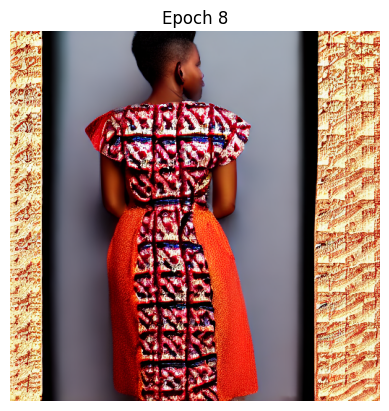

Epoch 9/10:   1%|          | 32/2825 [00:51<1:24:13,  1.81s/it]

accumulating gradients


Epoch 9/10:   2%|▏         | 64/2825 [01:41<1:12:13,  1.57s/it]

accumulating gradients


Epoch 9/10:   3%|▎         | 96/2825 [02:31<1:11:27,  1.57s/it]

accumulating gradients


Epoch 9/10:   5%|▍         | 128/2825 [03:21<1:10:28,  1.57s/it]

accumulating gradients


Epoch 9/10:   6%|▌         | 160/2825 [04:11<1:09:44,  1.57s/it]

accumulating gradients


Epoch 9/10:   7%|▋         | 192/2825 [05:01<1:08:48,  1.57s/it]

accumulating gradients


Epoch 9/10:   8%|▊         | 224/2825 [05:51<1:07:52,  1.57s/it]

accumulating gradients


Epoch 9/10:   9%|▉         | 256/2825 [06:41<1:07:37,  1.58s/it]

accumulating gradients


Epoch 9/10:  10%|█         | 288/2825 [07:31<1:06:20,  1.57s/it]

accumulating gradients


Epoch 9/10:  11%|█▏        | 320/2825 [08:21<1:05:39,  1.57s/it]

accumulating gradients


Epoch 9/10:  12%|█▏        | 352/2825 [09:11<1:05:05,  1.58s/it]

accumulating gradients


Epoch 9/10:  14%|█▎        | 384/2825 [10:01<1:05:50,  1.62s/it]

accumulating gradients


Epoch 9/10:  15%|█▍        | 416/2825 [10:52<1:04:09,  1.60s/it]

accumulating gradients


Epoch 9/10:  16%|█▌        | 448/2825 [11:43<1:02:21,  1.57s/it]

accumulating gradients


Epoch 9/10:  17%|█▋        | 480/2825 [12:32<1:01:09,  1.56s/it]

accumulating gradients


Epoch 9/10:  18%|█▊        | 512/2825 [13:23<1:07:34,  1.75s/it]

accumulating gradients


Epoch 9/10:  19%|█▉        | 544/2825 [14:13<59:49,  1.57s/it]

accumulating gradients


Epoch 9/10:  20%|██        | 576/2825 [15:03<59:14,  1.58s/it]

accumulating gradients


Epoch 9/10:  22%|██▏       | 608/2825 [15:53<58:23,  1.58s/it]

accumulating gradients


Epoch 9/10:  23%|██▎       | 640/2825 [16:43<57:07,  1.57s/it]

accumulating gradients


Epoch 9/10:  24%|██▍       | 672/2825 [17:34<56:28,  1.57s/it]

accumulating gradients


Epoch 9/10:  25%|██▍       | 704/2825 [18:25<1:01:21,  1.74s/it]

accumulating gradients


Epoch 9/10:  26%|██▌       | 736/2825 [19:15<54:59,  1.58s/it]

accumulating gradients


Epoch 9/10:  27%|██▋       | 768/2825 [20:06<53:53,  1.57s/it]

accumulating gradients


Epoch 9/10:  28%|██▊       | 800/2825 [20:55<52:49,  1.57s/it]

accumulating gradients


Epoch 9/10:  29%|██▉       | 832/2825 [21:45<52:06,  1.57s/it]

accumulating gradients


Epoch 9/10:  31%|███       | 864/2825 [22:34<51:07,  1.56s/it]

accumulating gradients


Epoch 9/10:  32%|███▏      | 896/2825 [23:25<51:42,  1.61s/it]

accumulating gradients


Epoch 9/10:  33%|███▎      | 928/2825 [24:15<49:26,  1.56s/it]

accumulating gradients


Epoch 9/10:  34%|███▍      | 960/2825 [25:05<48:47,  1.57s/it]

accumulating gradients


Epoch 9/10:  35%|███▌      | 992/2825 [25:55<47:48,  1.56s/it]

accumulating gradients


Epoch 9/10:  36%|███▌      | 1024/2825 [26:46<53:02,  1.77s/it]

accumulating gradients


Epoch 9/10:  37%|███▋      | 1056/2825 [27:36<46:06,  1.56s/it]

accumulating gradients


Epoch 9/10:  39%|███▊      | 1088/2825 [28:25<45:15,  1.56s/it]

accumulating gradients


Epoch 9/10:  40%|███▉      | 1120/2825 [29:15<44:42,  1.57s/it]

accumulating gradients


Epoch 9/10:  41%|████      | 1152/2825 [30:06<44:35,  1.60s/it]

accumulating gradients


Epoch 9/10:  42%|████▏     | 1184/2825 [30:57<44:31,  1.63s/it]

accumulating gradients


Epoch 9/10:  43%|████▎     | 1216/2825 [31:47<42:16,  1.58s/it]

accumulating gradients


Epoch 9/10:  44%|████▍     | 1248/2825 [32:37<41:12,  1.57s/it]

accumulating gradients


Epoch 9/10:  45%|████▌     | 1280/2825 [33:27<40:20,  1.57s/it]

accumulating gradients


Epoch 9/10:  46%|████▋     | 1312/2825 [34:17<39:32,  1.57s/it]

accumulating gradients


Epoch 9/10:  48%|████▊     | 1344/2825 [35:07<38:37,  1.56s/it]

accumulating gradients


Epoch 9/10:  49%|████▊     | 1376/2825 [35:58<38:00,  1.57s/it]

accumulating gradients


Epoch 9/10:  50%|████▉     | 1408/2825 [36:50<40:39,  1.72s/it]

accumulating gradients


Epoch 9/10:  51%|█████     | 1440/2825 [37:40<36:13,  1.57s/it]

accumulating gradients


Epoch 9/10:  52%|█████▏    | 1472/2825 [38:32<35:20,  1.57s/it]

accumulating gradients


Epoch 9/10:  53%|█████▎    | 1504/2825 [39:21<34:27,  1.56s/it]

accumulating gradients


Epoch 9/10:  54%|█████▍    | 1536/2825 [40:11<33:34,  1.56s/it]

accumulating gradients


Epoch 9/10:  56%|█████▌    | 1568/2825 [41:01<32:53,  1.57s/it]

accumulating gradients


Epoch 9/10:  57%|█████▋    | 1600/2825 [41:51<31:55,  1.56s/it]

accumulating gradients


Epoch 9/10:  58%|█████▊    | 1632/2825 [42:40<31:08,  1.57s/it]

accumulating gradients


Epoch 9/10:  59%|█████▉    | 1664/2825 [43:31<30:17,  1.57s/it]

accumulating gradients


Epoch 9/10:  60%|██████    | 1696/2825 [44:21<29:32,  1.57s/it]

accumulating gradients


Epoch 9/10:  61%|██████    | 1728/2825 [45:12<28:33,  1.56s/it]

accumulating gradients


Epoch 9/10:  62%|██████▏   | 1760/2825 [46:02<28:34,  1.61s/it]

accumulating gradients


Epoch 9/10:  63%|██████▎   | 1792/2825 [46:51<26:58,  1.57s/it]

accumulating gradients


Epoch 9/10:  65%|██████▍   | 1824/2825 [47:42<26:26,  1.58s/it]

accumulating gradients


Epoch 9/10:  66%|██████▌   | 1856/2825 [48:32<25:18,  1.57s/it]

accumulating gradients


Epoch 9/10:  67%|██████▋   | 1888/2825 [49:22<24:31,  1.57s/it]

accumulating gradients


Epoch 9/10:  68%|██████▊   | 1920/2825 [50:12<23:35,  1.56s/it]

accumulating gradients


Epoch 9/10:  69%|██████▉   | 1952/2825 [51:02<22:45,  1.56s/it]

accumulating gradients


Epoch 9/10:  70%|███████   | 1984/2825 [51:53<21:58,  1.57s/it]

accumulating gradients


Epoch 9/10:  71%|███████▏  | 2016/2825 [52:43<21:08,  1.57s/it]

accumulating gradients


Epoch 9/10:  72%|███████▏  | 2048/2825 [53:33<20:18,  1.57s/it]

accumulating gradients


Epoch 9/10:  74%|███████▎  | 2080/2825 [54:23<19:29,  1.57s/it]

accumulating gradients


Epoch 9/10:  75%|███████▍  | 2112/2825 [55:13<18:45,  1.58s/it]

accumulating gradients


Epoch 9/10:  76%|███████▌  | 2144/2825 [56:05<17:50,  1.57s/it]

accumulating gradients


Epoch 9/10:  77%|███████▋  | 2176/2825 [56:55<16:56,  1.57s/it]

accumulating gradients


Epoch 9/10:  78%|███████▊  | 2208/2825 [57:45<16:36,  1.62s/it]

accumulating gradients


Epoch 9/10:  79%|███████▉  | 2240/2825 [58:38<15:17,  1.57s/it]

accumulating gradients


Epoch 9/10:  80%|████████  | 2272/2825 [59:28<14:27,  1.57s/it]

accumulating gradients


Epoch 9/10:  82%|████████▏ | 2304/2825 [1:00:18<14:45,  1.70s/it]

accumulating gradients


Epoch 9/10:  83%|████████▎ | 2336/2825 [1:01:09<12:51,  1.58s/it]

accumulating gradients


Epoch 9/10:  84%|████████▍ | 2368/2825 [1:01:59<12:07,  1.59s/it]

accumulating gradients


Epoch 9/10:  85%|████████▍ | 2400/2825 [1:02:50<12:06,  1.71s/it]

accumulating gradients


Epoch 9/10:  86%|████████▌ | 2432/2825 [1:03:41<10:18,  1.57s/it]

accumulating gradients


Epoch 9/10:  87%|████████▋ | 2464/2825 [1:04:31<09:24,  1.56s/it]

accumulating gradients


Epoch 9/10:  88%|████████▊ | 2496/2825 [1:05:22<08:38,  1.57s/it]

accumulating gradients


Epoch 9/10:  89%|████████▉ | 2528/2825 [1:06:11<07:44,  1.57s/it]

accumulating gradients


Epoch 9/10:  91%|█████████ | 2560/2825 [1:07:01<07:19,  1.66s/it]

accumulating gradients


Epoch 9/10:  92%|█████████▏| 2592/2825 [1:07:51<06:05,  1.57s/it]

accumulating gradients


Epoch 9/10:  93%|█████████▎| 2624/2825 [1:08:41<05:15,  1.57s/it]

accumulating gradients


Epoch 9/10:  94%|█████████▍| 2656/2825 [1:09:31<04:24,  1.57s/it]

accumulating gradients


Epoch 9/10:  95%|█████████▌| 2688/2825 [1:10:21<03:36,  1.58s/it]

accumulating gradients


Epoch 9/10:  96%|█████████▋| 2720/2825 [1:11:12<02:44,  1.57s/it]

accumulating gradients


Epoch 9/10:  97%|█████████▋| 2752/2825 [1:12:02<01:54,  1.57s/it]

accumulating gradients


Epoch 9/10:  99%|█████████▊| 2784/2825 [1:12:52<01:04,  1.58s/it]

accumulating gradients


Epoch 9/10: 100%|█████████▉| 2816/2825 [1:13:41<00:14,  1.58s/it]

accumulating gradients


Epoch 9/10: 100%|██████████| 2825/2825 [1:13:55<00:00,  1.57s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [35:46<00:00,  3.04s/it]


Epoch 9/10, Train Loss: 0.0094, Validation Loss: 0.0097
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

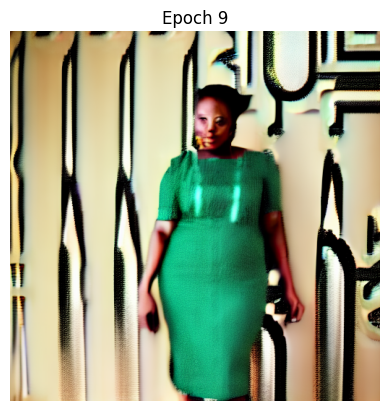

Epoch 10/10:   1%|          | 32/2825 [00:49<1:13:03,  1.57s/it]

accumulating gradients


Epoch 10/10:   2%|▏         | 64/2825 [01:39<1:12:16,  1.57s/it]

accumulating gradients


Epoch 10/10:   3%|▎         | 96/2825 [02:28<1:11:09,  1.56s/it]

accumulating gradients


Epoch 10/10:   5%|▍         | 128/2825 [03:18<1:10:37,  1.57s/it]

accumulating gradients


Epoch 10/10:   6%|▌         | 160/2825 [04:09<1:09:52,  1.57s/it]

accumulating gradients


Epoch 10/10:   7%|▋         | 192/2825 [04:58<1:08:45,  1.57s/it]

accumulating gradients


Epoch 10/10:   8%|▊         | 224/2825 [05:48<1:07:56,  1.57s/it]

accumulating gradients


Epoch 10/10:   9%|▉         | 256/2825 [06:39<1:13:11,  1.71s/it]

accumulating gradients


Epoch 10/10:  10%|█         | 288/2825 [07:29<1:08:07,  1.61s/it]

accumulating gradients


Epoch 10/10:  11%|█▏        | 320/2825 [08:19<1:05:29,  1.57s/it]

accumulating gradients


Epoch 10/10:  12%|█▏        | 352/2825 [09:10<1:05:01,  1.58s/it]

accumulating gradients


Epoch 10/10:  14%|█▎        | 384/2825 [09:59<1:04:01,  1.57s/it]

accumulating gradients


Epoch 10/10:  15%|█▍        | 416/2825 [10:49<1:03:19,  1.58s/it]

accumulating gradients


Epoch 10/10:  16%|█▌        | 448/2825 [11:39<1:02:07,  1.57s/it]

accumulating gradients


Epoch 10/10:  17%|█▋        | 480/2825 [12:28<1:01:08,  1.56s/it]

accumulating gradients


Epoch 10/10:  18%|█▊        | 512/2825 [13:18<1:00:43,  1.58s/it]

accumulating gradients


Epoch 10/10:  19%|█▉        | 544/2825 [14:07<59:25,  1.56s/it]

accumulating gradients


Epoch 10/10:  20%|██        | 576/2825 [14:57<58:33,  1.56s/it]

accumulating gradients


Epoch 10/10:  22%|██▏       | 608/2825 [15:47<57:59,  1.57s/it]

accumulating gradients


Epoch 10/10:  23%|██▎       | 640/2825 [16:37<1:00:25,  1.66s/it]

accumulating gradients


Epoch 10/10:  24%|██▍       | 672/2825 [17:28<56:38,  1.58s/it]

accumulating gradients


Epoch 10/10:  25%|██▍       | 704/2825 [18:18<58:30,  1.66s/it]

accumulating gradients


Epoch 10/10:  26%|██▌       | 736/2825 [19:08<54:52,  1.58s/it]

accumulating gradients


Epoch 10/10:  27%|██▋       | 768/2825 [19:58<53:40,  1.57s/it]

accumulating gradients


Epoch 10/10:  28%|██▊       | 800/2825 [20:48<52:44,  1.56s/it]

accumulating gradients


Epoch 10/10:  29%|██▉       | 832/2825 [21:38<51:59,  1.57s/it]

accumulating gradients


Epoch 10/10:  31%|███       | 864/2825 [22:28<51:11,  1.57s/it]

accumulating gradients


Epoch 10/10:  32%|███▏      | 896/2825 [23:19<50:31,  1.57s/it]

accumulating gradients


Epoch 10/10:  33%|███▎      | 928/2825 [24:09<49:30,  1.57s/it]

accumulating gradients


Epoch 10/10:  34%|███▍      | 960/2825 [24:59<48:40,  1.57s/it]

accumulating gradients


Epoch 10/10:  35%|███▌      | 992/2825 [25:49<48:00,  1.57s/it]

accumulating gradients


Epoch 10/10:  36%|███▌      | 1024/2825 [26:39<47:02,  1.57s/it]

accumulating gradients


Epoch 10/10:  37%|███▋      | 1056/2825 [27:29<46:13,  1.57s/it]

accumulating gradients


Epoch 10/10:  39%|███▊      | 1088/2825 [28:20<45:49,  1.58s/it]

accumulating gradients


Epoch 10/10:  40%|███▉      | 1120/2825 [29:09<44:44,  1.57s/it]

accumulating gradients


Epoch 10/10:  41%|████      | 1152/2825 [29:59<43:48,  1.57s/it]

accumulating gradients


Epoch 10/10:  42%|████▏     | 1184/2825 [30:49<42:55,  1.57s/it]

accumulating gradients


Epoch 10/10:  43%|████▎     | 1216/2825 [31:38<41:56,  1.56s/it]

accumulating gradients


Epoch 10/10:  44%|████▍     | 1248/2825 [32:28<41:18,  1.57s/it]

accumulating gradients


Epoch 10/10:  45%|████▌     | 1280/2825 [33:19<43:34,  1.69s/it]

accumulating gradients


Epoch 10/10:  46%|████▋     | 1312/2825 [34:09<39:32,  1.57s/it]

accumulating gradients


Epoch 10/10:  48%|████▊     | 1344/2825 [34:59<38:39,  1.57s/it]

accumulating gradients


Epoch 10/10:  49%|████▊     | 1376/2825 [35:49<37:47,  1.56s/it]

accumulating gradients


Epoch 10/10:  50%|████▉     | 1408/2825 [36:40<37:14,  1.58s/it]

accumulating gradients


Epoch 10/10:  51%|█████     | 1440/2825 [37:30<36:19,  1.57s/it]

accumulating gradients


Epoch 10/10:  52%|█████▏    | 1472/2825 [38:19<35:21,  1.57s/it]

accumulating gradients


Epoch 10/10:  53%|█████▎    | 1504/2825 [39:09<34:35,  1.57s/it]

accumulating gradients


Epoch 10/10:  54%|█████▍    | 1536/2825 [40:00<33:36,  1.56s/it]

accumulating gradients


Epoch 10/10:  56%|█████▌    | 1568/2825 [40:50<32:54,  1.57s/it]

accumulating gradients


Epoch 10/10:  57%|█████▋    | 1600/2825 [41:40<32:01,  1.57s/it]

accumulating gradients


Epoch 10/10:  58%|█████▊    | 1632/2825 [42:31<34:44,  1.75s/it]

accumulating gradients


Epoch 10/10:  59%|█████▉    | 1664/2825 [43:20<30:23,  1.57s/it]

accumulating gradients


Epoch 10/10:  60%|██████    | 1696/2825 [44:10<29:27,  1.57s/it]

accumulating gradients


Epoch 10/10:  61%|██████    | 1728/2825 [45:00<28:46,  1.57s/it]

accumulating gradients


Epoch 10/10:  62%|██████▏   | 1760/2825 [45:50<27:51,  1.57s/it]

accumulating gradients


Epoch 10/10:  63%|██████▎   | 1792/2825 [46:40<27:02,  1.57s/it]

accumulating gradients


Epoch 10/10:  65%|██████▍   | 1824/2825 [47:31<26:08,  1.57s/it]

accumulating gradients


Epoch 10/10:  66%|██████▌   | 1856/2825 [48:20<25:12,  1.56s/it]

accumulating gradients


Epoch 10/10:  67%|██████▋   | 1888/2825 [49:11<24:41,  1.58s/it]

accumulating gradients


Epoch 10/10:  68%|██████▊   | 1920/2825 [50:01<23:34,  1.56s/it]

accumulating gradients


Epoch 10/10:  69%|██████▉   | 1952/2825 [50:51<22:53,  1.57s/it]

accumulating gradients


Epoch 10/10:  70%|███████   | 1984/2825 [51:41<22:05,  1.58s/it]

accumulating gradients


Epoch 10/10:  71%|███████▏  | 2016/2825 [52:32<21:05,  1.56s/it]

accumulating gradients


Epoch 10/10:  72%|███████▏  | 2048/2825 [53:22<20:19,  1.57s/it]

accumulating gradients


Epoch 10/10:  74%|███████▎  | 2080/2825 [54:12<21:03,  1.70s/it]

accumulating gradients


Epoch 10/10:  75%|███████▍  | 2112/2825 [55:02<18:40,  1.57s/it]

accumulating gradients


Epoch 10/10:  76%|███████▌  | 2144/2825 [55:52<17:45,  1.56s/it]

accumulating gradients


Epoch 10/10:  77%|███████▋  | 2176/2825 [56:42<17:01,  1.57s/it]

accumulating gradients


Epoch 10/10:  78%|███████▊  | 2208/2825 [57:32<16:07,  1.57s/it]

accumulating gradients


Epoch 10/10:  79%|███████▉  | 2240/2825 [58:23<16:45,  1.72s/it]

accumulating gradients


Epoch 10/10:  80%|████████  | 2272/2825 [59:12<14:26,  1.57s/it]

accumulating gradients


Epoch 10/10:  82%|████████▏ | 2304/2825 [1:00:02<13:36,  1.57s/it]

accumulating gradients


Epoch 10/10:  83%|████████▎ | 2336/2825 [1:00:51<12:48,  1.57s/it]

accumulating gradients


Epoch 10/10:  84%|████████▍ | 2368/2825 [1:01:43<12:38,  1.66s/it]

accumulating gradients


Epoch 10/10:  85%|████████▍ | 2400/2825 [1:02:32<11:03,  1.56s/it]

accumulating gradients


Epoch 10/10:  86%|████████▌ | 2432/2825 [1:03:24<10:25,  1.59s/it]

accumulating gradients


Epoch 10/10:  87%|████████▋ | 2464/2825 [1:04:16<10:01,  1.67s/it]

accumulating gradients


Epoch 10/10:  88%|████████▊ | 2496/2825 [1:05:05<08:34,  1.56s/it]

accumulating gradients


Epoch 10/10:  89%|████████▉ | 2528/2825 [1:05:55<07:46,  1.57s/it]

accumulating gradients


Epoch 10/10:  91%|█████████ | 2560/2825 [1:06:46<06:55,  1.57s/it]

accumulating gradients


Epoch 10/10:  92%|█████████▏| 2592/2825 [1:07:36<06:04,  1.57s/it]

accumulating gradients


Epoch 10/10:  93%|█████████▎| 2624/2825 [1:08:27<05:15,  1.57s/it]

accumulating gradients


Epoch 10/10:  94%|█████████▍| 2656/2825 [1:09:16<04:25,  1.57s/it]

accumulating gradients


Epoch 10/10:  95%|█████████▌| 2688/2825 [1:10:06<03:34,  1.56s/it]

accumulating gradients


Epoch 10/10:  96%|█████████▋| 2720/2825 [1:10:56<02:44,  1.57s/it]

accumulating gradients


Epoch 10/10:  97%|█████████▋| 2752/2825 [1:11:48<02:07,  1.75s/it]

accumulating gradients


Epoch 10/10:  99%|█████████▊| 2784/2825 [1:12:37<01:04,  1.57s/it]

accumulating gradients


Epoch 10/10: 100%|█████████▉| 2816/2825 [1:13:27<00:14,  1.56s/it]

accumulating gradients


Epoch 10/10: 100%|██████████| 2825/2825 [1:13:42<00:00,  1.57s/it]


accumulating gradients


Validation: 100%|██████████| 707/707 [35:47<00:00,  3.04s/it]


Epoch 10/10, Train Loss: 0.0096, Validation Loss: 0.0093
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

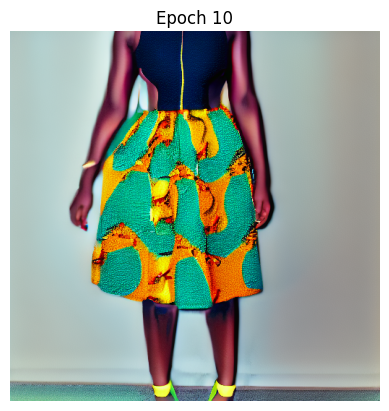

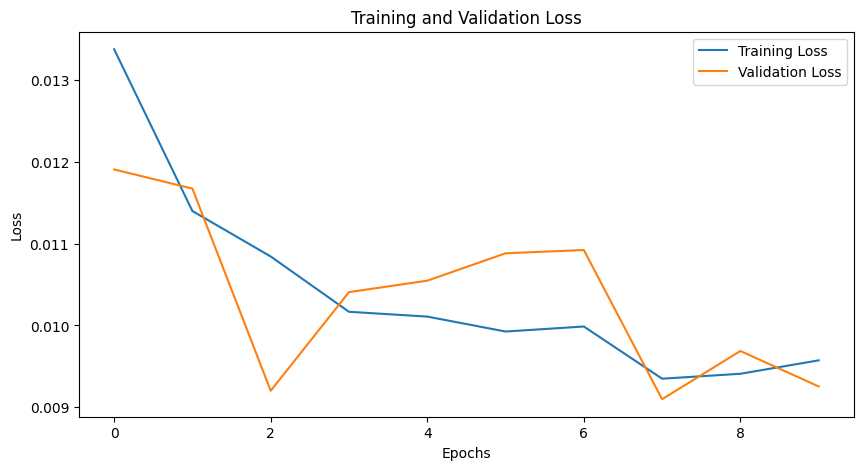

In [ ]:

checkpoint_dir = os.path.join(PROJECT_ROOT, "checkpoint")
os.makedirs(checkpoint_dir, exist_ok=True)
# Transformations for images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Reduce image size to 256x256
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5, 0.5), (0.5, 0.5, 0.5, 0.5))  # Normalize for 4 channels (RGBA)
])

class FashionDataset(Dataset):
    def __init__(self, image_paths, captions, tokenizer, transform=None):
        self.image_paths = image_paths
        self.captions = captions
        self.tokenizer = tokenizer
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        caption = self.captions[idx]

        image = Image.open(image_path).convert("RGBA")  # Convert to RGBA
        if self.transform:
            image = self.transform(image)

        inputs = self.tokenizer(caption, return_tensors="pt", padding="max_length", truncation=True, max_length=77)
        input_ids = inputs["input_ids"].squeeze(0)
        attention_mask = inputs["attention_mask"].squeeze(0)

        return image, input_ids, attention_mask



# Function to check the tensor shapes
def check_tensor_shapes(dataloader, clip_model, unet, noise_scheduler):
    # Get a single batch
    images, input_ids, attention_mask = next(iter(dataloader))
    images = images.to("cuda")
    input_ids = input_ids.to("cuda")
    attention_mask = attention_mask.to("cuda")

    print(f"Image tensor shape: {images.shape}")
    print(f"Input IDs shape: {input_ids.shape}")
    print(f"Attention mask shape: {attention_mask.shape}")

    # Generate noise
    noise = torch.randn(images.shape).to(images.device)
    print(f"Noise tensor shape: {noise.shape}")

    # Get text embeddings
    text_embeddings = clip_model(input_ids, attention_mask=attention_mask).last_hidden_state
    print(f"Text embeddings shape: {text_embeddings.shape}")

    # Forward pass through the model
    timesteps = torch.tensor([50], device=images.device)  # Example timesteps value, adjust as needed
    noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
    print(noisy_images.dtype)
    print(f"Noisy images tensor shape: {noisy_images.shape}")

    noise_pred = unet(noisy_images, timesteps, encoder_hidden_states=text_embeddings).sample
    print(f"Predicted noise tensor shape: {noise_pred.shape}")

    # Free GPU memory
    del images, input_ids, attention_mask, noise, text_embeddings, noisy_images, noise_pred
    torch.cuda.empty_cache()

# Create datasets for training and validation
train_dataset = FashionDataset(image_paths_train, captions_train, tokenizer, transform)
val_dataset = FashionDataset(image_paths_val, captions_val, tokenizer, transform)

# Define the number of workers for data loading
num_workers = 0  # Adjust this number based on your system's CPU cores and memory
batch_size = 1  # Start with the smallest batch size first
effective_batch_sz = 32
k = effective_batch_sz / batch_size

# Use DataLoader for data loading
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# Training loop
num_epochs = 10  # Set total number of epochs to 10
train_losses = []
val_losses = []

optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, unet.parameters()), lr=5e-6)  # Adjust learning rate
scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=3, verbose=True)
scaler = GradScaler()

best_val_loss = float('inf')
early_stopping_patience = 5
early_stopping_counter = 0

# Sample text prompt for image generation check
sample_text_prompt = "A lady wearing an african wax print dress"

# Load last checkpoint if available
last_checkpoint_path = os.path.join(checkpoint_dir, "checkpoint_epoch_1huh.pth")
start_epoch = 0

if os.path.exists(last_checkpoint_path):
    checkpoint = torch.load(last_checkpoint_path)
    print(f"Checkpoint loaded successfully: {last_checkpoint_path}")
    print(f"Checkpoint contains: {checkpoint.keys()}")
    unet.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch']
    best_val_loss = checkpoint['loss']
    print(f"Resuming training from epoch {start_epoch}")
else:
    print(f"No checkpoint found at {last_checkpoint_path}, starting from epoch 1")

for epoch in range(start_epoch, start_epoch + num_epochs):
    train_loss = 0.0
    unet.train()

    for batch_idx, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{start_epoch + num_epochs}")):
        images, input_ids, attention_mask = batch
        images = images.to("cuda")
        input_ids = input_ids.to("cuda")
        attention_mask = attention_mask.to("cuda")



        with autocast():
            noise = torch.randn(images.shape, device=images.device)
            text_embeddings = clip_model(input_ids, attention_mask=attention_mask).last_hidden_state
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (1,), device=images.device).long()
            noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
            noise_pred = unet(noisy_images, timesteps, encoder_hidden_states=text_embeddings).sample
            loss = torch.nn.functional.mse_loss(noise_pred, noise)

        scaler.scale(loss).backward()
        # scaler.unscale_(optimizer)
        if (batch_idx+1) % k == 0 or (batch_idx+1) == len(train_loader):
          print("accumulating gradients")
          # Clip gradients (optional, to avoid exploding gradients)
          torch.nn.utils.clip_grad_norm_(unet.parameters(), max_norm=1.0)

          # Check if gradients exist before stepping optimizer
          if any(p.grad is not None for p in unet.parameters()):
              scaler.step(optimizer)
              scaler.update()
              optimizer.zero_grad()

        train_loss += loss.item()

        # Detach and delete tensors to free memory
        # del images, input_ids, attention_mask, noise, text_embeddings, timesteps, noisy_images, noise_pred, loss
        # clear_memory()

    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    # Validation phase
    val_loss = 0.0
    unet.eval()
    with torch.no_grad():
        for batch_idx, batch in enumerate(tqdm(val_loader, desc="Validation")):
            images, input_ids, attention_mask = batch
            images = images.to("cuda")
            input_ids = input_ids.to("cuda")
            attention_mask = attention_mask.to("cuda")

            noise = torch.randn(images.shape, device=images.device)
            text_embeddings = clip_model(input_ids, attention_mask=attention_mask).last_hidden_state
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (1,), device=images.device).long()
            noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
            noise_pred = unet(noisy_images, timesteps, encoder_hidden_states=text_embeddings).sample
            loss = torch.nn.functional.mse_loss(noise_pred, noise)

            val_loss += loss.item()

            # Detach and delete tensors to free memory
            # del images, input_ids, attention_mask, noise, text_embeddings, timesteps, noisy_images, noise_pred, loss
            # clear_memory()

    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{start_epoch + num_epochs}, Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    # Save checkpoints every epoch
    checkpoint_path = os.path.join(checkpoint_dir, f"checkpoint_epoch_{epoch+1}.pth")
    os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)

    # Check available disk space on Google Drive
    total, used, free = shutil.disk_usage("/content/drive")
    print(f"Disk usage: {free // (2**30)} GB free")
    if free < 10 * (2**30):  # Less than 10GB free
        raise RuntimeError("Insufficient disk space to save checkpoint")

    torch.save({
        'epoch': epoch + 1,
        'model_state_dict': unet.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': train_loss,
    }, checkpoint_path)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        early_stopping_counter = 0  # Reset early stopping counter if validation loss improves
    else:
        early_stopping_counter += 1

    scheduler.step(val_loss)

    # Early stopping
    if early_stopping_counter >= early_stopping_patience:
        print("Early stopping triggered")
        break

    # Generate sample image after each epoch for visual inspection
    pipeline.unet.eval()
    with torch.no_grad():
        result = pipeline(sample_text_prompt).images[0]
        plt.imshow(result)
        plt.axis('off')
        plt.title(f'Epoch {epoch+1}')
        plt.show()
    pipeline.unet.train()

    # Gradually unfreeze layers every 10 epochs
    # if (epoch + 1) % 10 == 0:
    #     if initial_layers_to_freeze > 0:
    #         initial_layers_to_freeze -= 1
    #         freeze_layers(clip_model.text_model.encoder, num_layers_to_freeze=initial_layers_to_freeze)
    #         freeze_layers(unet, num_layers_to_freeze=initial_layers_to_freeze)
    #         print(f"Unfroze additional layer. Now {initial_layers_to_freeze} layers are frozen.")

# Plotting training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

##TRAINING ON THE ENTIRE 8005 DATASET

In [ ]:
# Define the root directory and paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
image_folder_path = os.path.join(PROJECT_ROOT, "InFashAiv1_images")
jsonl_path = os.path.join(PROJECT_ROOT, "copyAfricametadata.jsonl")


In [ ]:

def convert_rgb_to_rgba(image_path):
    with Image.open(image_path) as img:
        if img.mode != 'RGBA':
            # Convert image to RGBA if not already in RGBA mode
            rgba_image = img.convert('RGBA')
            return rgba_image
        return img

def save_converted_image(image, original_path):
    # Change file extension to .png for RGBA images
    base, _ = os.path.splitext(original_path)
    new_path = f"{base}.png"

    image.save(new_path)
    print(f"Saved image: {new_path}")

def process_images(image_dir):
    # Iterate over all files in the directory
    for filename in os.listdir(image_dir):
        file_path = os.path.join(image_dir, filename)
        # Process only image files with .jpg extension
        if os.path.isfile(file_path) and filename.lower().endswith('.jpg'):
            rgba_image = convert_rgb_to_rgba(file_path)
            save_converted_image(rgba_image, file_path)
            # Optionally, delete the original JPG file
            os.remove(file_path)

    print("Image conversion process complete.")

# Transformations for images
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5, 0.5), (0.5, 0.5, 0.5, 0.5))  # Normalize for 4 channels (RGBA)
])

class FashionDataset(Dataset):
    def __init__(self, image_paths, captions, tokenizer, transform=None):
        self.image_paths = image_paths
        self.captions = captions
        self.tokenizer = tokenizer
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        caption = self.captions[idx]

        image = Image.open(image_path).convert("RGBA")  # Convert to RGBA
        if self.transform:
            image = self.transform(image)

        inputs = self.tokenizer(caption, return_tensors="pt", padding="max_length", truncation=True, max_length=77)
        input_ids = inputs["input_ids"].squeeze(0)
        attention_mask = inputs["attention_mask"].squeeze(0)

        return image, input_ids, attention_mask

# Define the root directory and paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
image_folder_path = os.path.join(PROJECT_ROOT, "InFashAiv1_images")
jsonl_path = os.path.join(PROJECT_ROOT, "copyAfricametadata.jsonl")

# Function to load metadata
def load_metadata(jsonl_path):
    image_paths = []
    captions = []
    with open(jsonl_path, 'r') as file:
        for line in file:
            data = json.loads(line)
            image_paths.append(data['file_name'])  # 'file_name' is the key for the image file path
            captions.append(data['text'])         # 'text' is the key for the caption
    return image_paths, captions

# Load metadata
image_paths, captions = load_metadata(jsonl_path)

# Prepend the image directory to the image paths
image_paths = [os.path.join(image_folder_path, img) for img in image_paths]

# Split data into training and validation sets
image_paths_train, image_paths_val, captions_train, captions_val = train_test_split(
    image_paths, captions, test_size=0.2, random_state=42
)

# Process images to ensure all are in RGBA format
process_images(image_folder_path)

# Load the pre-trained Stable Diffusion model
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipeline.to("cuda")  # Ensure the model is moved to GPU

# Access the necessary components from the pipeline
tokenizer = pipeline.tokenizer
clip_model = pipeline.text_encoder
vae = pipeline.vae
unet = pipeline.unet
noise_scheduler = pipeline.scheduler  # Correctly initialize the noise_scheduler

# Create datasets for training and validation
train_dataset = FashionDataset(image_paths_train, captions_train, tokenizer, transform)
val_dataset = FashionDataset(image_paths_val, captions_val, tokenizer, transform)

# Initialize DataLoaders
batch_size = 1
num_workers = 0
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)


Image conversion process complete.


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
# Check dataset integrity
def check_dataset_integrity(image_paths):
    missing_files = [path for path in image_paths if not os.path.exists(path)]
    if missing_files:
        print(f"Warning: {len(missing_files)} files are missing from the dataset.")
        for path in missing_files[:10]:  # Print the first 10 missing files as an example
            print(f"Missing file: {path}")
    else:
        print("All files are present in the dataset.")

check_dataset_integrity(image_paths_train)
check_dataset_integrity(image_paths_val)


All files are present in the dataset.
All files are present in the dataset.


No checkpoint found at /content/drive/MyDrive/fashion-diffusion/checkpoint2/checkpoint_epoch_thh.pth, starting from epoch 1


Epoch 1/10:   0%|          | 31/6404 [01:09<3:55:45,  2.22s/it]

accumulating gradients


Epoch 1/10:   1%|          | 64/6404 [02:21<3:45:35,  2.13s/it]

accumulating gradients


Epoch 1/10:   1%|▏         | 96/6404 [03:31<3:45:45,  2.15s/it]

accumulating gradients


Epoch 1/10:   2%|▏         | 128/6404 [04:41<3:52:54,  2.23s/it]

accumulating gradients


Epoch 1/10:   2%|▏         | 160/6404 [05:50<3:44:34,  2.16s/it]

accumulating gradients


Epoch 1/10:   3%|▎         | 192/6404 [07:02<3:51:46,  2.24s/it]

accumulating gradients


Epoch 1/10:   3%|▎         | 224/6404 [08:12<3:49:44,  2.23s/it]

accumulating gradients


Epoch 1/10:   4%|▍         | 256/6404 [09:24<3:41:57,  2.17s/it]

accumulating gradients


Epoch 1/10:   4%|▍         | 288/6404 [10:35<3:44:51,  2.21s/it]

accumulating gradients


Epoch 1/10:   5%|▍         | 320/6404 [11:44<3:48:01,  2.25s/it]

accumulating gradients


Epoch 1/10:   5%|▌         | 352/6404 [12:57<4:10:12,  2.48s/it]

accumulating gradients


Epoch 1/10:   6%|▌         | 384/6404 [14:08<3:41:23,  2.21s/it]

accumulating gradients


Epoch 1/10:   6%|▋         | 416/6404 [15:16<3:33:27,  2.14s/it]

accumulating gradients


Epoch 1/10:   7%|▋         | 448/6404 [16:26<3:47:37,  2.29s/it]

accumulating gradients


Epoch 1/10:   7%|▋         | 480/6404 [17:36<3:31:27,  2.14s/it]

accumulating gradients


Epoch 1/10:   8%|▊         | 512/6404 [18:47<3:38:33,  2.23s/it]

accumulating gradients


Epoch 1/10:   8%|▊         | 544/6404 [19:56<3:31:10,  2.16s/it]

accumulating gradients


Epoch 1/10:   9%|▉         | 576/6404 [21:06<3:38:24,  2.25s/it]

accumulating gradients


Epoch 1/10:   9%|▉         | 608/6404 [22:16<3:33:13,  2.21s/it]

accumulating gradients


Epoch 1/10:  10%|▉         | 640/6404 [23:25<3:27:09,  2.16s/it]

accumulating gradients


Epoch 1/10:  10%|█         | 672/6404 [24:34<3:24:25,  2.14s/it]

accumulating gradients


Epoch 1/10:  11%|█         | 704/6404 [25:45<3:30:05,  2.21s/it]

accumulating gradients


Epoch 1/10:  11%|█▏        | 736/6404 [26:54<3:22:07,  2.14s/it]

accumulating gradients


Epoch 1/10:  12%|█▏        | 768/6404 [28:04<3:34:48,  2.29s/it]

accumulating gradients


Epoch 1/10:  12%|█▏        | 800/6404 [29:15<3:22:40,  2.17s/it]

accumulating gradients


Epoch 1/10:  13%|█▎        | 832/6404 [30:26<3:34:05,  2.31s/it]

accumulating gradients


Epoch 1/10:  13%|█▎        | 864/6404 [31:36<3:21:55,  2.19s/it]

accumulating gradients


Epoch 1/10:  14%|█▍        | 896/6404 [32:46<3:20:52,  2.19s/it]

accumulating gradients


Epoch 1/10:  14%|█▍        | 928/6404 [33:57<3:22:56,  2.22s/it]

accumulating gradients


Epoch 1/10:  15%|█▍        | 960/6404 [35:08<3:23:56,  2.25s/it]

accumulating gradients


Epoch 1/10:  15%|█▌        | 992/6404 [36:18<3:18:28,  2.20s/it]

accumulating gradients


Epoch 1/10:  16%|█▌        | 1024/6404 [37:27<3:12:42,  2.15s/it]

accumulating gradients


Epoch 1/10:  16%|█▋        | 1056/6404 [38:37<3:17:04,  2.21s/it]

accumulating gradients


Epoch 1/10:  17%|█▋        | 1088/6404 [39:46<3:11:34,  2.16s/it]

accumulating gradients


Epoch 1/10:  17%|█▋        | 1120/6404 [40:56<3:09:50,  2.16s/it]

accumulating gradients


Epoch 1/10:  18%|█▊        | 1152/6404 [42:07<3:13:46,  2.21s/it]

accumulating gradients


Epoch 1/10:  18%|█▊        | 1184/6404 [43:17<3:07:16,  2.15s/it]

accumulating gradients


Epoch 1/10:  19%|█▉        | 1216/6404 [44:27<3:05:19,  2.14s/it]

accumulating gradients


Epoch 1/10:  19%|█▉        | 1248/6404 [45:37<3:02:49,  2.13s/it]

accumulating gradients


Epoch 1/10:  20%|█▉        | 1280/6404 [46:47<3:13:21,  2.26s/it]

accumulating gradients


Epoch 1/10:  20%|██        | 1312/6404 [47:56<3:06:15,  2.19s/it]

accumulating gradients


Epoch 1/10:  21%|██        | 1344/6404 [49:05<3:12:07,  2.28s/it]

accumulating gradients


Epoch 1/10:  21%|██▏       | 1376/6404 [50:16<3:00:27,  2.15s/it]

accumulating gradients


Epoch 1/10:  22%|██▏       | 1408/6404 [51:27<3:01:04,  2.17s/it]

accumulating gradients


Epoch 1/10:  22%|██▏       | 1440/6404 [52:37<3:04:53,  2.23s/it]

accumulating gradients


Epoch 1/10:  23%|██▎       | 1472/6404 [53:48<2:57:16,  2.16s/it]

accumulating gradients


Epoch 1/10:  23%|██▎       | 1504/6404 [54:58<3:00:09,  2.21s/it]

accumulating gradients


Epoch 1/10:  24%|██▍       | 1536/6404 [56:08<3:00:11,  2.22s/it]

accumulating gradients


Epoch 1/10:  24%|██▍       | 1568/6404 [57:19<2:57:28,  2.20s/it]

accumulating gradients


Epoch 1/10:  25%|██▍       | 1600/6404 [58:28<3:06:27,  2.33s/it]

accumulating gradients


Epoch 1/10:  25%|██▌       | 1632/6404 [59:38<2:50:35,  2.14s/it]

accumulating gradients


Epoch 1/10:  26%|██▌       | 1664/6404 [1:00:48<2:56:40,  2.24s/it]

accumulating gradients


Epoch 1/10:  26%|██▋       | 1696/6404 [1:01:58<2:51:15,  2.18s/it]

accumulating gradients


Epoch 1/10:  27%|██▋       | 1728/6404 [1:03:09<2:49:34,  2.18s/it]

accumulating gradients


Epoch 1/10:  27%|██▋       | 1760/6404 [1:04:18<2:50:17,  2.20s/it]

accumulating gradients


Epoch 1/10:  28%|██▊       | 1792/6404 [1:05:27<2:46:30,  2.17s/it]

accumulating gradients


Epoch 1/10:  28%|██▊       | 1824/6404 [1:06:39<2:49:47,  2.22s/it]

accumulating gradients


Epoch 1/10:  29%|██▉       | 1856/6404 [1:07:50<2:54:08,  2.30s/it]

accumulating gradients


Epoch 1/10:  29%|██▉       | 1888/6404 [1:09:00<2:51:34,  2.28s/it]

accumulating gradients


Epoch 1/10:  30%|██▉       | 1920/6404 [1:10:10<2:50:28,  2.28s/it]

accumulating gradients


Epoch 1/10:  30%|███       | 1952/6404 [1:11:21<2:42:44,  2.19s/it]

accumulating gradients


Epoch 1/10:  31%|███       | 1984/6404 [1:12:30<2:39:25,  2.16s/it]

accumulating gradients


Epoch 1/10:  31%|███▏      | 2016/6404 [1:13:40<2:42:34,  2.22s/it]

accumulating gradients


Epoch 1/10:  32%|███▏      | 2048/6404 [1:14:51<2:43:04,  2.25s/it]

accumulating gradients


Epoch 1/10:  32%|███▏      | 2080/6404 [1:16:01<2:38:48,  2.20s/it]

accumulating gradients


Epoch 1/10:  33%|███▎      | 2112/6404 [1:17:11<2:34:25,  2.16s/it]

accumulating gradients


Epoch 1/10:  33%|███▎      | 2144/6404 [1:18:21<2:38:39,  2.23s/it]

accumulating gradients


Epoch 1/10:  34%|███▍      | 2176/6404 [1:19:31<2:32:36,  2.17s/it]

accumulating gradients


Epoch 1/10:  34%|███▍      | 2208/6404 [1:20:41<2:42:57,  2.33s/it]

accumulating gradients


Epoch 1/10:  35%|███▍      | 2240/6404 [1:21:52<2:29:00,  2.15s/it]

accumulating gradients


Epoch 1/10:  35%|███▌      | 2272/6404 [1:23:03<2:29:47,  2.17s/it]

accumulating gradients


Epoch 1/10:  36%|███▌      | 2304/6404 [1:24:13<2:43:56,  2.40s/it]

accumulating gradients


Epoch 1/10:  36%|███▋      | 2336/6404 [1:25:22<2:24:56,  2.14s/it]

accumulating gradients


Epoch 1/10:  37%|███▋      | 2368/6404 [1:26:31<2:28:35,  2.21s/it]

accumulating gradients


Epoch 1/10:  37%|███▋      | 2400/6404 [1:27:41<2:27:59,  2.22s/it]

accumulating gradients


Epoch 1/10:  38%|███▊      | 2432/6404 [1:28:52<2:24:01,  2.18s/it]

accumulating gradients


Epoch 1/10:  38%|███▊      | 2464/6404 [1:30:02<2:21:39,  2.16s/it]

accumulating gradients


Epoch 1/10:  39%|███▉      | 2496/6404 [1:31:12<2:27:33,  2.27s/it]

accumulating gradients


Epoch 1/10:  39%|███▉      | 2528/6404 [1:32:22<2:19:58,  2.17s/it]

accumulating gradients


Epoch 1/10:  40%|███▉      | 2560/6404 [1:33:33<2:18:00,  2.15s/it]

accumulating gradients


Epoch 1/10:  40%|████      | 2592/6404 [1:34:42<2:17:34,  2.17s/it]

accumulating gradients


Epoch 1/10:  41%|████      | 2624/6404 [1:35:53<2:20:42,  2.23s/it]

accumulating gradients


Epoch 1/10:  41%|████▏     | 2656/6404 [1:37:03<2:12:55,  2.13s/it]

accumulating gradients


Epoch 1/10:  42%|████▏     | 2688/6404 [1:38:12<2:13:24,  2.15s/it]

accumulating gradients


Epoch 1/10:  42%|████▏     | 2720/6404 [1:39:22<2:13:55,  2.18s/it]

accumulating gradients


Epoch 1/10:  43%|████▎     | 2752/6404 [1:40:33<2:17:45,  2.26s/it]

accumulating gradients


Epoch 1/10:  43%|████▎     | 2784/6404 [1:41:43<2:14:00,  2.22s/it]

accumulating gradients


Epoch 1/10:  44%|████▍     | 2816/6404 [1:42:53<2:10:41,  2.19s/it]

accumulating gradients


Epoch 1/10:  44%|████▍     | 2848/6404 [1:44:03<2:08:09,  2.16s/it]

accumulating gradients


Epoch 1/10:  45%|████▍     | 2880/6404 [1:45:14<2:13:28,  2.27s/it]

accumulating gradients


Epoch 1/10:  45%|████▌     | 2912/6404 [1:46:21<2:03:42,  2.13s/it]

accumulating gradients


Epoch 1/10:  46%|████▌     | 2944/6404 [1:47:30<2:05:03,  2.17s/it]

accumulating gradients


Epoch 1/10:  46%|████▋     | 2976/6404 [1:48:42<2:06:51,  2.22s/it]

accumulating gradients


Epoch 1/10:  47%|████▋     | 3008/6404 [1:49:53<2:04:37,  2.20s/it]

accumulating gradients


Epoch 1/10:  47%|████▋     | 3040/6404 [1:51:02<2:00:02,  2.14s/it]

accumulating gradients


Epoch 1/10:  48%|████▊     | 3072/6404 [1:52:13<2:01:56,  2.20s/it]

accumulating gradients


Epoch 1/10:  48%|████▊     | 3104/6404 [1:53:22<1:56:58,  2.13s/it]

accumulating gradients


Epoch 1/10:  49%|████▉     | 3136/6404 [1:54:32<1:55:43,  2.12s/it]

accumulating gradients


Epoch 1/10:  49%|████▉     | 3168/6404 [1:55:42<1:56:51,  2.17s/it]

accumulating gradients


Epoch 1/10:  50%|████▉     | 3200/6404 [1:56:52<1:54:38,  2.15s/it]

accumulating gradients


Epoch 1/10:  50%|█████     | 3232/6404 [1:58:03<1:55:14,  2.18s/it]

accumulating gradients


Epoch 1/10:  51%|█████     | 3264/6404 [1:59:12<1:54:42,  2.19s/it]

accumulating gradients


Epoch 1/10:  51%|█████▏    | 3296/6404 [2:00:23<1:55:34,  2.23s/it]

accumulating gradients


Epoch 1/10:  52%|█████▏    | 3328/6404 [2:01:33<1:49:52,  2.14s/it]

accumulating gradients


Epoch 1/10:  52%|█████▏    | 3360/6404 [2:02:43<1:54:15,  2.25s/it]

accumulating gradients


Epoch 1/10:  53%|█████▎    | 3392/6404 [2:03:53<1:47:43,  2.15s/it]

accumulating gradients


Epoch 1/10:  53%|█████▎    | 3424/6404 [2:05:03<1:52:00,  2.26s/it]

accumulating gradients


Epoch 1/10:  54%|█████▍    | 3456/6404 [2:06:12<1:46:45,  2.17s/it]

accumulating gradients


Epoch 1/10:  54%|█████▍    | 3488/6404 [2:07:21<1:45:00,  2.16s/it]

accumulating gradients


Epoch 1/10:  55%|█████▍    | 3520/6404 [2:08:31<1:43:25,  2.15s/it]

accumulating gradients


Epoch 1/10:  55%|█████▌    | 3552/6404 [2:09:39<1:42:40,  2.16s/it]

accumulating gradients


Epoch 1/10:  56%|█████▌    | 3584/6404 [2:10:49<1:41:36,  2.16s/it]

accumulating gradients


Epoch 1/10:  56%|█████▋    | 3616/6404 [2:11:58<1:41:30,  2.18s/it]

accumulating gradients


Epoch 1/10:  57%|█████▋    | 3648/6404 [2:13:06<1:37:35,  2.12s/it]

accumulating gradients


Epoch 1/10:  57%|█████▋    | 3680/6404 [2:14:16<1:42:15,  2.25s/it]

accumulating gradients


Epoch 1/10:  58%|█████▊    | 3712/6404 [2:15:24<1:36:53,  2.16s/it]

accumulating gradients


Epoch 1/10:  58%|█████▊    | 3744/6404 [2:16:34<1:35:51,  2.16s/it]

accumulating gradients


Epoch 1/10:  59%|█████▉    | 3776/6404 [2:17:44<1:33:55,  2.14s/it]

accumulating gradients


Epoch 1/10:  59%|█████▉    | 3808/6404 [2:18:54<1:32:09,  2.13s/it]

accumulating gradients


Epoch 1/10:  60%|█████▉    | 3840/6404 [2:20:03<1:32:55,  2.17s/it]

accumulating gradients


Epoch 1/10:  60%|██████    | 3872/6404 [2:21:14<1:33:14,  2.21s/it]

accumulating gradients


Epoch 1/10:  61%|██████    | 3904/6404 [2:22:24<1:33:16,  2.24s/it]

accumulating gradients


Epoch 1/10:  61%|██████▏   | 3936/6404 [2:23:34<1:32:38,  2.25s/it]

accumulating gradients


Epoch 1/10:  62%|██████▏   | 3968/6404 [2:24:45<1:32:39,  2.28s/it]

accumulating gradients


Epoch 1/10:  62%|██████▏   | 4000/6404 [2:25:56<1:31:48,  2.29s/it]

accumulating gradients


Epoch 1/10:  63%|██████▎   | 4032/6404 [2:27:06<1:24:59,  2.15s/it]

accumulating gradients


Epoch 1/10:  63%|██████▎   | 4064/6404 [2:28:16<1:28:46,  2.28s/it]

accumulating gradients


Epoch 1/10:  64%|██████▍   | 4096/6404 [2:29:27<1:25:10,  2.21s/it]

accumulating gradients


Epoch 1/10:  64%|██████▍   | 4128/6404 [2:30:38<1:26:11,  2.27s/it]

accumulating gradients


Epoch 1/10:  65%|██████▍   | 4160/6404 [2:31:48<1:22:54,  2.22s/it]

accumulating gradients


Epoch 1/10:  65%|██████▌   | 4192/6404 [2:32:59<1:25:16,  2.31s/it]

accumulating gradients


Epoch 1/10:  66%|██████▌   | 4224/6404 [2:34:09<1:21:43,  2.25s/it]

accumulating gradients


Epoch 1/10:  66%|██████▋   | 4256/6404 [2:35:19<1:17:30,  2.16s/it]

accumulating gradients


Epoch 1/10:  67%|██████▋   | 4288/6404 [2:36:28<1:21:46,  2.32s/it]

accumulating gradients


Epoch 1/10:  67%|██████▋   | 4320/6404 [2:37:37<1:15:15,  2.17s/it]

accumulating gradients


Epoch 1/10:  68%|██████▊   | 4352/6404 [2:38:48<1:16:38,  2.24s/it]

accumulating gradients


Epoch 1/10:  68%|██████▊   | 4384/6404 [2:39:58<1:11:37,  2.13s/it]

accumulating gradients


Epoch 1/10:  69%|██████▉   | 4416/6404 [2:41:06<1:12:19,  2.18s/it]

accumulating gradients


Epoch 1/10:  69%|██████▉   | 4448/6404 [2:42:16<1:13:38,  2.26s/it]

accumulating gradients


Epoch 1/10:  70%|██████▉   | 4480/6404 [2:43:26<1:13:35,  2.29s/it]

accumulating gradients


Epoch 1/10:  70%|███████   | 4512/6404 [2:44:35<1:08:06,  2.16s/it]

accumulating gradients


Epoch 1/10:  71%|███████   | 4544/6404 [2:45:44<1:06:07,  2.13s/it]

accumulating gradients


Epoch 1/10:  71%|███████▏  | 4576/6404 [2:46:55<1:06:55,  2.20s/it]

accumulating gradients


Epoch 1/10:  72%|███████▏  | 4608/6404 [2:48:05<1:04:29,  2.15s/it]

accumulating gradients


Epoch 1/10:  72%|███████▏  | 4640/6404 [2:49:16<1:10:18,  2.39s/it]

accumulating gradients


Epoch 1/10:  73%|███████▎  | 4672/6404 [2:50:28<1:05:50,  2.28s/it]

accumulating gradients


Epoch 1/10:  73%|███████▎  | 4704/6404 [2:51:37<1:03:37,  2.25s/it]

accumulating gradients


Epoch 1/10:  74%|███████▍  | 4736/6404 [2:52:49<1:02:36,  2.25s/it]

accumulating gradients


Epoch 1/10:  74%|███████▍  | 4768/6404 [2:53:59<58:45,  2.15s/it]

accumulating gradients


Epoch 1/10:  75%|███████▍  | 4800/6404 [2:55:09<56:55,  2.13s/it]

accumulating gradients


Epoch 1/10:  75%|███████▌  | 4832/6404 [2:56:20<56:08,  2.14s/it]

accumulating gradients


Epoch 1/10:  76%|███████▌  | 4864/6404 [2:57:29<55:02,  2.14s/it]

accumulating gradients


Epoch 1/10:  76%|███████▋  | 4896/6404 [2:58:38<57:05,  2.27s/it]

accumulating gradients


Epoch 1/10:  77%|███████▋  | 4928/6404 [2:59:48<54:04,  2.20s/it]

accumulating gradients


Epoch 1/10:  77%|███████▋  | 4960/6404 [3:00:57<52:12,  2.17s/it]

accumulating gradients


Epoch 1/10:  78%|███████▊  | 4992/6404 [3:02:07<50:55,  2.16s/it]

accumulating gradients


Epoch 1/10:  78%|███████▊  | 5024/6404 [3:03:16<50:51,  2.21s/it]

accumulating gradients


Epoch 1/10:  79%|███████▉  | 5056/6404 [3:04:28<50:00,  2.23s/it]

accumulating gradients


Epoch 1/10:  79%|███████▉  | 5088/6404 [3:05:38<48:47,  2.22s/it]

accumulating gradients


Epoch 1/10:  80%|███████▉  | 5120/6404 [3:06:48<47:19,  2.21s/it]

accumulating gradients


Epoch 1/10:  80%|████████  | 5152/6404 [3:07:57<46:09,  2.21s/it]

accumulating gradients


Epoch 1/10:  81%|████████  | 5184/6404 [3:09:09<49:14,  2.42s/it]

accumulating gradients


Epoch 1/10:  81%|████████▏ | 5216/6404 [3:10:19<42:43,  2.16s/it]

accumulating gradients


Epoch 1/10:  82%|████████▏ | 5248/6404 [3:11:30<42:31,  2.21s/it]

accumulating gradients


Epoch 1/10:  82%|████████▏ | 5280/6404 [3:12:42<40:54,  2.18s/it]

accumulating gradients


Epoch 1/10:  83%|████████▎ | 5312/6404 [3:13:53<40:19,  2.22s/it]

accumulating gradients


Epoch 1/10:  83%|████████▎ | 5344/6404 [3:15:02<38:56,  2.20s/it]

accumulating gradients


Epoch 1/10:  84%|████████▍ | 5376/6404 [3:16:13<37:28,  2.19s/it]

accumulating gradients


Epoch 1/10:  84%|████████▍ | 5408/6404 [3:17:22<37:06,  2.24s/it]

accumulating gradients


Epoch 1/10:  85%|████████▍ | 5440/6404 [3:18:33<36:22,  2.26s/it]

accumulating gradients


Epoch 1/10:  85%|████████▌ | 5472/6404 [3:19:44<33:45,  2.17s/it]

accumulating gradients


Epoch 1/10:  86%|████████▌ | 5504/6404 [3:20:52<33:35,  2.24s/it]

accumulating gradients


Epoch 1/10:  86%|████████▋ | 5536/6404 [3:22:03<32:48,  2.27s/it]

accumulating gradients


Epoch 1/10:  87%|████████▋ | 5568/6404 [3:23:13<29:56,  2.15s/it]

accumulating gradients


Epoch 1/10:  87%|████████▋ | 5600/6404 [3:24:24<29:56,  2.23s/it]

accumulating gradients


Epoch 1/10:  88%|████████▊ | 5632/6404 [3:25:34<29:43,  2.31s/it]

accumulating gradients


Epoch 1/10:  88%|████████▊ | 5664/6404 [3:26:45<30:05,  2.44s/it]

accumulating gradients


Epoch 1/10:  89%|████████▉ | 5696/6404 [3:27:56<26:18,  2.23s/it]

accumulating gradients


Epoch 1/10:  89%|████████▉ | 5728/6404 [3:29:08<25:02,  2.22s/it]

accumulating gradients


Epoch 1/10:  90%|████████▉ | 5760/6404 [3:30:17<23:50,  2.22s/it]

accumulating gradients


Epoch 1/10:  90%|█████████ | 5792/6404 [3:31:29<22:09,  2.17s/it]

accumulating gradients


Epoch 1/10:  91%|█████████ | 5824/6404 [3:32:41<20:57,  2.17s/it]

accumulating gradients


Epoch 1/10:  91%|█████████▏| 5856/6404 [3:33:50<19:32,  2.14s/it]

accumulating gradients


Epoch 1/10:  92%|█████████▏| 5888/6404 [3:35:01<19:05,  2.22s/it]

accumulating gradients


Epoch 1/10:  92%|█████████▏| 5920/6404 [3:36:12<17:34,  2.18s/it]

accumulating gradients


Epoch 1/10:  93%|█████████▎| 5952/6404 [3:37:22<16:11,  2.15s/it]

accumulating gradients


Epoch 1/10:  93%|█████████▎| 5984/6404 [3:38:32<16:08,  2.31s/it]

accumulating gradients


Epoch 1/10:  94%|█████████▍| 6016/6404 [3:39:42<14:28,  2.24s/it]

accumulating gradients


Epoch 1/10:  94%|█████████▍| 6048/6404 [3:40:52<13:13,  2.23s/it]

accumulating gradients


Epoch 1/10:  95%|█████████▍| 6080/6404 [3:42:02<11:35,  2.15s/it]

accumulating gradients


Epoch 1/10:  95%|█████████▌| 6112/6404 [3:43:12<10:29,  2.16s/it]

accumulating gradients


Epoch 1/10:  96%|█████████▌| 6144/6404 [3:44:23<09:45,  2.25s/it]

accumulating gradients


Epoch 1/10:  96%|█████████▋| 6176/6404 [3:45:33<08:10,  2.15s/it]

accumulating gradients


Epoch 1/10:  97%|█████████▋| 6208/6404 [3:46:43<07:11,  2.20s/it]

accumulating gradients


Epoch 1/10:  97%|█████████▋| 6240/6404 [3:47:54<06:02,  2.21s/it]

accumulating gradients


Epoch 1/10:  98%|█████████▊| 6272/6404 [3:49:06<04:57,  2.25s/it]

accumulating gradients


Epoch 1/10:  98%|█████████▊| 6304/6404 [3:50:17<03:36,  2.16s/it]

accumulating gradients


Epoch 1/10:  99%|█████████▉| 6336/6404 [3:51:27<02:30,  2.22s/it]

accumulating gradients


Epoch 1/10:  99%|█████████▉| 6368/6404 [3:52:38<01:23,  2.33s/it]

accumulating gradients


Epoch 1/10: 100%|█████████▉| 6400/6404 [3:53:46<00:08,  2.17s/it]

accumulating gradients


Epoch 1/10: 100%|██████████| 6404/6404 [3:53:55<00:00,  2.19s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:36:52<00:00,  3.63s/it]


Epoch 1/10, Train Loss: 0.0141, Validation Loss: 0.0119
Disk usage: 148 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

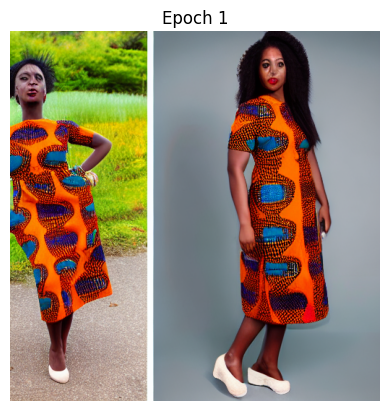

Epoch 2/10:   0%|          | 32/6404 [00:49<2:46:56,  1.57s/it]

accumulating gradients


Epoch 2/10:   1%|          | 64/6404 [01:39<2:46:38,  1.58s/it]

accumulating gradients


Epoch 2/10:   1%|▏         | 96/6404 [02:29<2:45:48,  1.58s/it]

accumulating gradients


Epoch 2/10:   2%|▏         | 128/6404 [03:18<2:44:33,  1.57s/it]

accumulating gradients


Epoch 2/10:   2%|▏         | 160/6404 [04:08<2:43:56,  1.58s/it]

accumulating gradients


Epoch 2/10:   3%|▎         | 192/6404 [04:58<2:42:59,  1.57s/it]

accumulating gradients


Epoch 2/10:   3%|▎         | 224/6404 [05:47<2:41:59,  1.57s/it]

accumulating gradients


Epoch 2/10:   4%|▍         | 256/6404 [06:37<2:40:38,  1.57s/it]

accumulating gradients


Epoch 2/10:   4%|▍         | 288/6404 [07:27<2:40:49,  1.58s/it]

accumulating gradients


Epoch 2/10:   5%|▍         | 320/6404 [08:16<2:39:27,  1.57s/it]

accumulating gradients


Epoch 2/10:   5%|▌         | 352/6404 [09:06<2:37:58,  1.57s/it]

accumulating gradients


Epoch 2/10:   6%|▌         | 384/6404 [09:56<2:37:20,  1.57s/it]

accumulating gradients


Epoch 2/10:   6%|▋         | 416/6404 [10:45<2:36:40,  1.57s/it]

accumulating gradients


Epoch 2/10:   7%|▋         | 448/6404 [11:35<2:36:00,  1.57s/it]

accumulating gradients


Epoch 2/10:   7%|▋         | 480/6404 [12:25<2:34:53,  1.57s/it]

accumulating gradients


Epoch 2/10:   8%|▊         | 512/6404 [13:14<2:34:22,  1.57s/it]

accumulating gradients


Epoch 2/10:   8%|▊         | 544/6404 [14:04<2:33:26,  1.57s/it]

accumulating gradients


Epoch 2/10:   9%|▉         | 576/6404 [14:54<2:32:29,  1.57s/it]

accumulating gradients


Epoch 2/10:   9%|▉         | 608/6404 [15:43<2:31:40,  1.57s/it]

accumulating gradients


Epoch 2/10:  10%|▉         | 640/6404 [16:33<2:31:27,  1.58s/it]

accumulating gradients


Epoch 2/10:  10%|█         | 672/6404 [17:23<2:29:11,  1.56s/it]

accumulating gradients


Epoch 2/10:  11%|█         | 704/6404 [18:12<2:28:47,  1.57s/it]

accumulating gradients


Epoch 2/10:  11%|█▏        | 736/6404 [19:02<2:28:13,  1.57s/it]

accumulating gradients


Epoch 2/10:  12%|█▏        | 768/6404 [19:52<2:28:24,  1.58s/it]

accumulating gradients


Epoch 2/10:  12%|█▏        | 800/6404 [20:41<2:27:10,  1.58s/it]

accumulating gradients


Epoch 2/10:  13%|█▎        | 832/6404 [21:31<2:26:11,  1.57s/it]

accumulating gradients


Epoch 2/10:  13%|█▎        | 864/6404 [22:21<2:24:49,  1.57s/it]

accumulating gradients


Epoch 2/10:  14%|█▍        | 896/6404 [23:10<2:24:04,  1.57s/it]

accumulating gradients


Epoch 2/10:  14%|█▍        | 928/6404 [24:00<2:23:01,  1.57s/it]

accumulating gradients


Epoch 2/10:  15%|█▍        | 960/6404 [24:49<2:22:54,  1.58s/it]

accumulating gradients


Epoch 2/10:  15%|█▌        | 992/6404 [25:39<2:21:29,  1.57s/it]

accumulating gradients


Epoch 2/10:  16%|█▌        | 1024/6404 [26:29<2:20:46,  1.57s/it]

accumulating gradients


Epoch 2/10:  16%|█▋        | 1056/6404 [27:18<2:19:59,  1.57s/it]

accumulating gradients


Epoch 2/10:  17%|█▋        | 1088/6404 [28:08<2:19:15,  1.57s/it]

accumulating gradients


Epoch 2/10:  17%|█▋        | 1120/6404 [28:58<2:18:19,  1.57s/it]

accumulating gradients


Epoch 2/10:  18%|█▊        | 1152/6404 [29:47<2:17:03,  1.57s/it]

accumulating gradients


Epoch 2/10:  18%|█▊        | 1184/6404 [30:37<2:16:00,  1.56s/it]

accumulating gradients


Epoch 2/10:  19%|█▉        | 1216/6404 [31:26<2:14:52,  1.56s/it]

accumulating gradients


Epoch 2/10:  19%|█▉        | 1248/6404 [32:16<2:15:26,  1.58s/it]

accumulating gradients


Epoch 2/10:  20%|█▉        | 1280/6404 [33:06<2:14:07,  1.57s/it]

accumulating gradients


Epoch 2/10:  20%|██        | 1312/6404 [33:55<2:13:45,  1.58s/it]

accumulating gradients


Epoch 2/10:  21%|██        | 1344/6404 [34:45<2:12:02,  1.57s/it]

accumulating gradients


Epoch 2/10:  21%|██▏       | 1376/6404 [35:34<2:11:41,  1.57s/it]

accumulating gradients


Epoch 2/10:  22%|██▏       | 1408/6404 [36:24<2:11:33,  1.58s/it]

accumulating gradients


Epoch 2/10:  22%|██▏       | 1440/6404 [37:14<2:09:58,  1.57s/it]

accumulating gradients


Epoch 2/10:  23%|██▎       | 1472/6404 [38:03<2:09:21,  1.57s/it]

accumulating gradients


Epoch 2/10:  23%|██▎       | 1504/6404 [38:53<2:08:38,  1.58s/it]

accumulating gradients


Epoch 2/10:  24%|██▍       | 1536/6404 [39:43<2:06:54,  1.56s/it]

accumulating gradients


Epoch 2/10:  24%|██▍       | 1568/6404 [40:32<2:06:31,  1.57s/it]

accumulating gradients


Epoch 2/10:  25%|██▍       | 1600/6404 [41:22<2:04:57,  1.56s/it]

accumulating gradients


Epoch 2/10:  25%|██▌       | 1632/6404 [42:12<2:04:52,  1.57s/it]

accumulating gradients


Epoch 2/10:  26%|██▌       | 1664/6404 [43:01<2:03:15,  1.56s/it]

accumulating gradients


Epoch 2/10:  26%|██▋       | 1696/6404 [43:51<2:02:25,  1.56s/it]

accumulating gradients


Epoch 2/10:  27%|██▋       | 1728/6404 [44:40<2:02:35,  1.57s/it]

accumulating gradients


Epoch 2/10:  27%|██▋       | 1760/6404 [45:30<2:01:14,  1.57s/it]

accumulating gradients


Epoch 2/10:  28%|██▊       | 1792/6404 [46:20<2:00:07,  1.56s/it]

accumulating gradients


Epoch 2/10:  28%|██▊       | 1824/6404 [47:09<1:59:41,  1.57s/it]

accumulating gradients


Epoch 2/10:  29%|██▉       | 1856/6404 [47:59<1:58:48,  1.57s/it]

accumulating gradients


Epoch 2/10:  29%|██▉       | 1888/6404 [48:49<1:58:39,  1.58s/it]

accumulating gradients


Epoch 2/10:  30%|██▉       | 1920/6404 [49:38<1:57:08,  1.57s/it]

accumulating gradients


Epoch 2/10:  30%|███       | 1952/6404 [50:28<1:56:39,  1.57s/it]

accumulating gradients


Epoch 2/10:  31%|███       | 1984/6404 [51:17<1:55:21,  1.57s/it]

accumulating gradients


Epoch 2/10:  31%|███▏      | 2016/6404 [52:07<1:54:58,  1.57s/it]

accumulating gradients


Epoch 2/10:  32%|███▏      | 2048/6404 [52:57<1:54:01,  1.57s/it]

accumulating gradients


Epoch 2/10:  32%|███▏      | 2080/6404 [53:46<1:52:49,  1.57s/it]

accumulating gradients


Epoch 2/10:  33%|███▎      | 2112/6404 [54:36<1:52:04,  1.57s/it]

accumulating gradients


Epoch 2/10:  33%|███▎      | 2144/6404 [55:26<1:51:30,  1.57s/it]

accumulating gradients


Epoch 2/10:  34%|███▍      | 2176/6404 [56:15<1:50:02,  1.56s/it]

accumulating gradients


Epoch 2/10:  34%|███▍      | 2208/6404 [57:05<1:49:28,  1.57s/it]

accumulating gradients


Epoch 2/10:  35%|███▍      | 2240/6404 [57:55<1:48:50,  1.57s/it]

accumulating gradients


Epoch 2/10:  35%|███▌      | 2272/6404 [58:44<1:48:26,  1.57s/it]

accumulating gradients


Epoch 2/10:  36%|███▌      | 2304/6404 [59:34<1:47:33,  1.57s/it]

accumulating gradients


Epoch 2/10:  36%|███▋      | 2336/6404 [1:00:24<1:46:26,  1.57s/it]

accumulating gradients


Epoch 2/10:  37%|███▋      | 2368/6404 [1:01:13<1:45:28,  1.57s/it]

accumulating gradients


Epoch 2/10:  37%|███▋      | 2400/6404 [1:02:03<1:44:49,  1.57s/it]

accumulating gradients


Epoch 2/10:  38%|███▊      | 2432/6404 [1:02:52<1:44:34,  1.58s/it]

accumulating gradients


Epoch 2/10:  38%|███▊      | 2464/6404 [1:03:42<1:43:12,  1.57s/it]

accumulating gradients


Epoch 2/10:  39%|███▉      | 2496/6404 [1:04:32<1:42:22,  1.57s/it]

accumulating gradients


Epoch 2/10:  39%|███▉      | 2528/6404 [1:05:21<1:41:33,  1.57s/it]

accumulating gradients


Epoch 2/10:  40%|███▉      | 2560/6404 [1:06:11<1:40:22,  1.57s/it]

accumulating gradients


Epoch 2/10:  40%|████      | 2592/6404 [1:07:01<1:40:06,  1.58s/it]

accumulating gradients


Epoch 2/10:  41%|████      | 2624/6404 [1:07:50<1:39:01,  1.57s/it]

accumulating gradients


Epoch 2/10:  41%|████▏     | 2656/6404 [1:08:40<1:38:13,  1.57s/it]

accumulating gradients


Epoch 2/10:  42%|████▏     | 2688/6404 [1:09:29<1:36:51,  1.56s/it]

accumulating gradients


Epoch 2/10:  42%|████▏     | 2720/6404 [1:10:19<1:36:43,  1.58s/it]

accumulating gradients


Epoch 2/10:  43%|████▎     | 2752/6404 [1:11:09<1:35:33,  1.57s/it]

accumulating gradients


Epoch 2/10:  43%|████▎     | 2784/6404 [1:11:59<1:35:17,  1.58s/it]

accumulating gradients


Epoch 2/10:  44%|████▍     | 2816/6404 [1:12:48<1:34:04,  1.57s/it]

accumulating gradients


Epoch 2/10:  44%|████▍     | 2848/6404 [1:13:38<1:33:21,  1.58s/it]

accumulating gradients


Epoch 2/10:  45%|████▍     | 2880/6404 [1:14:27<1:31:42,  1.56s/it]

accumulating gradients


Epoch 2/10:  45%|████▌     | 2912/6404 [1:15:17<1:31:08,  1.57s/it]

accumulating gradients


Epoch 2/10:  46%|████▌     | 2944/6404 [1:16:07<1:30:17,  1.57s/it]

accumulating gradients


Epoch 2/10:  46%|████▋     | 2976/6404 [1:16:56<1:29:37,  1.57s/it]

accumulating gradients


Epoch 2/10:  47%|████▋     | 3008/6404 [1:17:46<1:28:42,  1.57s/it]

accumulating gradients


Epoch 2/10:  47%|████▋     | 3040/6404 [1:18:35<1:27:37,  1.56s/it]

accumulating gradients


Epoch 2/10:  48%|████▊     | 3072/6404 [1:19:25<1:27:16,  1.57s/it]

accumulating gradients


Epoch 2/10:  48%|████▊     | 3104/6404 [1:20:15<1:26:06,  1.57s/it]

accumulating gradients


Epoch 2/10:  49%|████▉     | 3136/6404 [1:21:04<1:25:50,  1.58s/it]

accumulating gradients


Epoch 2/10:  49%|████▉     | 3168/6404 [1:21:54<1:24:23,  1.56s/it]

accumulating gradients


Epoch 2/10:  50%|████▉     | 3200/6404 [1:22:44<1:23:49,  1.57s/it]

accumulating gradients


Epoch 2/10:  50%|█████     | 3232/6404 [1:23:33<1:23:27,  1.58s/it]

accumulating gradients


Epoch 2/10:  51%|█████     | 3264/6404 [1:24:23<1:22:06,  1.57s/it]

accumulating gradients


Epoch 2/10:  51%|█████▏    | 3296/6404 [1:25:13<1:21:05,  1.57s/it]

accumulating gradients


Epoch 2/10:  52%|█████▏    | 3328/6404 [1:26:02<1:20:25,  1.57s/it]

accumulating gradients


Epoch 2/10:  52%|█████▏    | 3360/6404 [1:26:52<1:19:50,  1.57s/it]

accumulating gradients


Epoch 2/10:  53%|█████▎    | 3392/6404 [1:27:42<1:18:59,  1.57s/it]

accumulating gradients


Epoch 2/10:  53%|█████▎    | 3424/6404 [1:28:31<1:18:18,  1.58s/it]

accumulating gradients


Epoch 2/10:  54%|█████▍    | 3456/6404 [1:29:21<1:16:54,  1.57s/it]

accumulating gradients


Epoch 2/10:  54%|█████▍    | 3488/6404 [1:30:11<1:16:56,  1.58s/it]

accumulating gradients


Epoch 2/10:  55%|█████▍    | 3520/6404 [1:31:00<1:15:38,  1.57s/it]

accumulating gradients


Epoch 2/10:  55%|█████▌    | 3552/6404 [1:31:50<1:14:47,  1.57s/it]

accumulating gradients


Epoch 2/10:  56%|█████▌    | 3584/6404 [1:32:40<1:14:02,  1.58s/it]

accumulating gradients


Epoch 2/10:  56%|█████▋    | 3616/6404 [1:33:30<1:13:24,  1.58s/it]

accumulating gradients


Epoch 2/10:  57%|█████▋    | 3648/6404 [1:34:19<1:12:20,  1.57s/it]

accumulating gradients


Epoch 2/10:  57%|█████▋    | 3680/6404 [1:35:09<1:10:55,  1.56s/it]

accumulating gradients


Epoch 2/10:  58%|█████▊    | 3712/6404 [1:35:59<1:10:28,  1.57s/it]

accumulating gradients


Epoch 2/10:  58%|█████▊    | 3744/6404 [1:36:48<1:09:15,  1.56s/it]

accumulating gradients


Epoch 2/10:  59%|█████▉    | 3776/6404 [1:37:38<1:09:10,  1.58s/it]

accumulating gradients


Epoch 2/10:  59%|█████▉    | 3808/6404 [1:38:28<1:07:43,  1.57s/it]

accumulating gradients


Epoch 2/10:  60%|█████▉    | 3840/6404 [1:39:17<1:06:58,  1.57s/it]

accumulating gradients


Epoch 2/10:  60%|██████    | 3872/6404 [1:40:07<1:06:33,  1.58s/it]

accumulating gradients


Epoch 2/10:  61%|██████    | 3904/6404 [1:40:57<1:05:45,  1.58s/it]

accumulating gradients


Epoch 2/10:  61%|██████▏   | 3936/6404 [1:41:46<1:04:47,  1.58s/it]

accumulating gradients


Epoch 2/10:  62%|██████▏   | 3968/6404 [1:42:36<1:03:36,  1.57s/it]

accumulating gradients


Epoch 2/10:  62%|██████▏   | 4000/6404 [1:43:26<1:03:12,  1.58s/it]

accumulating gradients


Epoch 2/10:  63%|██████▎   | 4032/6404 [1:44:15<1:01:42,  1.56s/it]

accumulating gradients


Epoch 2/10:  63%|██████▎   | 4064/6404 [1:45:05<1:01:22,  1.57s/it]

accumulating gradients


Epoch 2/10:  64%|██████▍   | 4096/6404 [1:45:55<1:00:23,  1.57s/it]

accumulating gradients


Epoch 2/10:  64%|██████▍   | 4128/6404 [1:46:45<59:42,  1.57s/it]

accumulating gradients


Epoch 2/10:  65%|██████▍   | 4160/6404 [1:47:34<58:40,  1.57s/it]

accumulating gradients


Epoch 2/10:  65%|██████▌   | 4192/6404 [1:48:24<57:16,  1.55s/it]

accumulating gradients


Epoch 2/10:  66%|██████▌   | 4224/6404 [1:49:14<57:18,  1.58s/it]

accumulating gradients


Epoch 2/10:  66%|██████▋   | 4256/6404 [1:50:03<56:11,  1.57s/it]

accumulating gradients


Epoch 2/10:  67%|██████▋   | 4288/6404 [1:50:53<55:18,  1.57s/it]

accumulating gradients


Epoch 2/10:  67%|██████▋   | 4320/6404 [1:51:42<54:18,  1.56s/it]

accumulating gradients


Epoch 2/10:  68%|██████▊   | 4352/6404 [1:52:32<53:46,  1.57s/it]

accumulating gradients


Epoch 2/10:  68%|██████▊   | 4384/6404 [1:53:22<52:52,  1.57s/it]

accumulating gradients


Epoch 2/10:  69%|██████▉   | 4416/6404 [1:54:12<52:05,  1.57s/it]

accumulating gradients


Epoch 2/10:  69%|██████▉   | 4448/6404 [1:55:01<51:02,  1.57s/it]

accumulating gradients


Epoch 2/10:  70%|██████▉   | 4480/6404 [1:55:51<50:18,  1.57s/it]

accumulating gradients


Epoch 2/10:  70%|███████   | 4512/6404 [1:56:40<49:39,  1.57s/it]

accumulating gradients


Epoch 2/10:  71%|███████   | 4544/6404 [1:57:30<48:52,  1.58s/it]

accumulating gradients


Epoch 2/10:  71%|███████▏  | 4576/6404 [1:58:20<47:48,  1.57s/it]

accumulating gradients


Epoch 2/10:  72%|███████▏  | 4608/6404 [1:59:10<46:55,  1.57s/it]

accumulating gradients


Epoch 2/10:  72%|███████▏  | 4640/6404 [1:59:59<46:11,  1.57s/it]

accumulating gradients


Epoch 2/10:  73%|███████▎  | 4672/6404 [2:00:49<45:21,  1.57s/it]

accumulating gradients


Epoch 2/10:  73%|███████▎  | 4704/6404 [2:01:38<44:38,  1.58s/it]

accumulating gradients


Epoch 2/10:  74%|███████▍  | 4736/6404 [2:02:28<43:50,  1.58s/it]

accumulating gradients


Epoch 2/10:  74%|███████▍  | 4768/6404 [2:03:18<42:58,  1.58s/it]

accumulating gradients


Epoch 2/10:  75%|███████▍  | 4800/6404 [2:04:07<41:54,  1.57s/it]

accumulating gradients


Epoch 2/10:  75%|███████▌  | 4832/6404 [2:04:57<41:14,  1.57s/it]

accumulating gradients


Epoch 2/10:  76%|███████▌  | 4864/6404 [2:05:47<40:21,  1.57s/it]

accumulating gradients


Epoch 2/10:  76%|███████▋  | 4896/6404 [2:06:36<39:17,  1.56s/it]

accumulating gradients


Epoch 2/10:  77%|███████▋  | 4928/6404 [2:07:26<38:39,  1.57s/it]

accumulating gradients


Epoch 2/10:  77%|███████▋  | 4960/6404 [2:08:16<37:54,  1.58s/it]

accumulating gradients


Epoch 2/10:  78%|███████▊  | 4992/6404 [2:09:05<36:57,  1.57s/it]

accumulating gradients


Epoch 2/10:  78%|███████▊  | 5024/6404 [2:09:55<36:03,  1.57s/it]

accumulating gradients


Epoch 2/10:  79%|███████▉  | 5056/6404 [2:10:45<35:14,  1.57s/it]

accumulating gradients


Epoch 2/10:  79%|███████▉  | 5088/6404 [2:11:34<34:21,  1.57s/it]

accumulating gradients


Epoch 2/10:  80%|███████▉  | 5120/6404 [2:12:24<33:41,  1.57s/it]

accumulating gradients


Epoch 2/10:  80%|████████  | 5152/6404 [2:13:14<32:43,  1.57s/it]

accumulating gradients


Epoch 2/10:  81%|████████  | 5184/6404 [2:14:03<31:52,  1.57s/it]

accumulating gradients


Epoch 2/10:  81%|████████▏ | 5216/6404 [2:14:53<31:08,  1.57s/it]

accumulating gradients


Epoch 2/10:  82%|████████▏ | 5248/6404 [2:15:43<30:24,  1.58s/it]

accumulating gradients


Epoch 2/10:  82%|████████▏ | 5280/6404 [2:16:32<29:27,  1.57s/it]

accumulating gradients


Epoch 2/10:  83%|████████▎ | 5312/6404 [2:17:22<28:40,  1.58s/it]

accumulating gradients


Epoch 2/10:  83%|████████▎ | 5344/6404 [2:18:12<27:40,  1.57s/it]

accumulating gradients


Epoch 2/10:  84%|████████▍ | 5376/6404 [2:19:01<26:51,  1.57s/it]

accumulating gradients


Epoch 2/10:  84%|████████▍ | 5408/6404 [2:19:51<26:04,  1.57s/it]

accumulating gradients


Epoch 2/10:  85%|████████▍ | 5440/6404 [2:20:41<25:16,  1.57s/it]

accumulating gradients


Epoch 2/10:  85%|████████▌ | 5472/6404 [2:21:30<24:18,  1.57s/it]

accumulating gradients


Epoch 2/10:  86%|████████▌ | 5504/6404 [2:22:20<23:32,  1.57s/it]

accumulating gradients


Epoch 2/10:  86%|████████▋ | 5536/6404 [2:23:09<22:33,  1.56s/it]

accumulating gradients


Epoch 2/10:  87%|████████▋ | 5568/6404 [2:23:59<21:47,  1.56s/it]

accumulating gradients


Epoch 2/10:  87%|████████▋ | 5600/6404 [2:24:49<21:04,  1.57s/it]

accumulating gradients


Epoch 2/10:  88%|████████▊ | 5632/6404 [2:25:38<20:03,  1.56s/it]

accumulating gradients


Epoch 2/10:  88%|████████▊ | 5664/6404 [2:26:28<19:18,  1.57s/it]

accumulating gradients


Epoch 2/10:  89%|████████▉ | 5696/6404 [2:27:18<18:32,  1.57s/it]

accumulating gradients


Epoch 2/10:  89%|████████▉ | 5728/6404 [2:28:07<17:40,  1.57s/it]

accumulating gradients


Epoch 2/10:  90%|████████▉ | 5760/6404 [2:28:57<16:47,  1.56s/it]

accumulating gradients


Epoch 2/10:  90%|█████████ | 5792/6404 [2:29:46<16:00,  1.57s/it]

accumulating gradients


Epoch 2/10:  91%|█████████ | 5824/6404 [2:30:36<15:11,  1.57s/it]

accumulating gradients


Epoch 2/10:  91%|█████████▏| 5856/6404 [2:31:26<14:22,  1.57s/it]

accumulating gradients


Epoch 2/10:  92%|█████████▏| 5888/6404 [2:32:16<13:32,  1.57s/it]

accumulating gradients


Epoch 2/10:  92%|█████████▏| 5920/6404 [2:33:05<12:41,  1.57s/it]

accumulating gradients


Epoch 2/10:  93%|█████████▎| 5952/6404 [2:33:55<11:52,  1.58s/it]

accumulating gradients


Epoch 2/10:  93%|█████████▎| 5984/6404 [2:34:45<11:01,  1.58s/it]

accumulating gradients


Epoch 2/10:  94%|█████████▍| 6016/6404 [2:35:34<10:06,  1.56s/it]

accumulating gradients


Epoch 2/10:  94%|█████████▍| 6048/6404 [2:36:24<09:20,  1.57s/it]

accumulating gradients


Epoch 2/10:  95%|█████████▍| 6080/6404 [2:37:14<08:27,  1.57s/it]

accumulating gradients


Epoch 2/10:  95%|█████████▌| 6112/6404 [2:38:03<07:38,  1.57s/it]

accumulating gradients


Epoch 2/10:  96%|█████████▌| 6144/6404 [2:38:53<06:48,  1.57s/it]

accumulating gradients


Epoch 2/10:  96%|█████████▋| 6176/6404 [2:39:43<05:59,  1.58s/it]

accumulating gradients


Epoch 2/10:  97%|█████████▋| 6208/6404 [2:40:32<05:08,  1.58s/it]

accumulating gradients


Epoch 2/10:  97%|█████████▋| 6240/6404 [2:41:22<04:16,  1.56s/it]

accumulating gradients


Epoch 2/10:  98%|█████████▊| 6272/6404 [2:42:12<03:27,  1.57s/it]

accumulating gradients


Epoch 2/10:  98%|█████████▊| 6304/6404 [2:43:01<02:36,  1.57s/it]

accumulating gradients


Epoch 2/10:  99%|█████████▉| 6336/6404 [2:43:51<01:46,  1.57s/it]

accumulating gradients


Epoch 2/10:  99%|█████████▉| 6368/6404 [2:44:41<00:56,  1.57s/it]

accumulating gradients


Epoch 2/10: 100%|█████████▉| 6400/6404 [2:45:30<00:06,  1.57s/it]

accumulating gradients


Epoch 2/10: 100%|██████████| 6404/6404 [2:45:37<00:00,  1.55s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:19:44<00:00,  2.99s/it]


Epoch 2/10, Train Loss: 0.0117, Validation Loss: 0.0107
Disk usage: 139 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

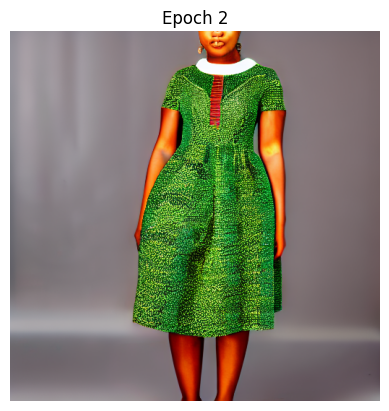

Epoch 3/10:   0%|          | 32/6404 [00:49<2:46:50,  1.57s/it]

accumulating gradients


Epoch 3/10:   1%|          | 64/6404 [01:39<2:46:37,  1.58s/it]

accumulating gradients


Epoch 3/10:   1%|▏         | 96/6404 [02:29<2:45:32,  1.57s/it]

accumulating gradients


Epoch 3/10:   2%|▏         | 128/6404 [03:18<2:43:55,  1.57s/it]

accumulating gradients


Epoch 3/10:   2%|▏         | 160/6404 [04:08<2:42:22,  1.56s/it]

accumulating gradients


Epoch 3/10:   3%|▎         | 192/6404 [04:58<2:42:29,  1.57s/it]

accumulating gradients


Epoch 3/10:   3%|▎         | 224/6404 [05:47<2:42:20,  1.58s/it]

accumulating gradients


Epoch 3/10:   4%|▍         | 256/6404 [06:37<2:40:29,  1.57s/it]

accumulating gradients


Epoch 3/10:   4%|▍         | 288/6404 [07:27<2:39:33,  1.57s/it]

accumulating gradients


Epoch 3/10:   5%|▍         | 320/6404 [08:16<2:39:16,  1.57s/it]

accumulating gradients


Epoch 3/10:   5%|▌         | 352/6404 [09:06<2:38:20,  1.57s/it]

accumulating gradients


Epoch 3/10:   6%|▌         | 384/6404 [09:56<2:36:17,  1.56s/it]

accumulating gradients


Epoch 3/10:   6%|▋         | 416/6404 [10:45<2:36:47,  1.57s/it]

accumulating gradients


Epoch 3/10:   7%|▋         | 448/6404 [11:35<2:34:44,  1.56s/it]

accumulating gradients


Epoch 3/10:   7%|▋         | 480/6404 [12:25<2:35:34,  1.58s/it]

accumulating gradients


Epoch 3/10:   8%|▊         | 512/6404 [13:14<2:34:33,  1.57s/it]

accumulating gradients


Epoch 3/10:   8%|▊         | 544/6404 [14:04<2:33:43,  1.57s/it]

accumulating gradients


Epoch 3/10:   9%|▉         | 576/6404 [14:54<2:32:39,  1.57s/it]

accumulating gradients


Epoch 3/10:   9%|▉         | 608/6404 [15:44<2:31:36,  1.57s/it]

accumulating gradients


Epoch 3/10:  10%|▉         | 640/6404 [16:33<2:31:33,  1.58s/it]

accumulating gradients


Epoch 3/10:  10%|█         | 672/6404 [17:23<2:30:33,  1.58s/it]

accumulating gradients


Epoch 3/10:  11%|█         | 704/6404 [18:13<2:29:04,  1.57s/it]

accumulating gradients


Epoch 3/10:  11%|█▏        | 736/6404 [19:03<2:28:08,  1.57s/it]

accumulating gradients


Epoch 3/10:  12%|█▏        | 768/6404 [19:52<2:27:33,  1.57s/it]

accumulating gradients


Epoch 3/10:  12%|█▏        | 800/6404 [20:42<2:26:40,  1.57s/it]

accumulating gradients


Epoch 3/10:  13%|█▎        | 832/6404 [21:31<2:26:12,  1.57s/it]

accumulating gradients


Epoch 3/10:  13%|█▎        | 864/6404 [22:21<2:25:25,  1.58s/it]

accumulating gradients


Epoch 3/10:  14%|█▍        | 896/6404 [23:11<2:24:31,  1.57s/it]

accumulating gradients


Epoch 3/10:  14%|█▍        | 928/6404 [24:01<2:23:54,  1.58s/it]

accumulating gradients


Epoch 3/10:  15%|█▍        | 960/6404 [24:50<2:22:23,  1.57s/it]

accumulating gradients


Epoch 3/10:  15%|█▌        | 992/6404 [25:40<2:21:51,  1.57s/it]

accumulating gradients


Epoch 3/10:  16%|█▌        | 1024/6404 [26:30<2:19:56,  1.56s/it]

accumulating gradients


Epoch 3/10:  16%|█▋        | 1056/6404 [27:19<2:20:19,  1.57s/it]

accumulating gradients


Epoch 3/10:  17%|█▋        | 1088/6404 [28:09<2:19:08,  1.57s/it]

accumulating gradients


Epoch 3/10:  17%|█▋        | 1120/6404 [28:59<2:18:24,  1.57s/it]

accumulating gradients


Epoch 3/10:  18%|█▊        | 1152/6404 [29:48<2:17:37,  1.57s/it]

accumulating gradients


Epoch 3/10:  18%|█▊        | 1184/6404 [30:38<2:16:38,  1.57s/it]

accumulating gradients


Epoch 3/10:  19%|█▉        | 1216/6404 [31:28<2:15:20,  1.57s/it]

accumulating gradients


Epoch 3/10:  19%|█▉        | 1248/6404 [32:17<2:14:58,  1.57s/it]

accumulating gradients


Epoch 3/10:  20%|█▉        | 1280/6404 [33:07<2:14:15,  1.57s/it]

accumulating gradients


Epoch 3/10:  20%|██        | 1312/6404 [33:57<2:13:58,  1.58s/it]

accumulating gradients


Epoch 3/10:  21%|██        | 1344/6404 [34:46<2:11:47,  1.56s/it]

accumulating gradients


Epoch 3/10:  21%|██▏       | 1376/6404 [35:36<2:11:08,  1.56s/it]

accumulating gradients


Epoch 3/10:  22%|██▏       | 1408/6404 [36:25<2:10:43,  1.57s/it]

accumulating gradients


Epoch 3/10:  22%|██▏       | 1440/6404 [37:15<2:09:26,  1.56s/it]

accumulating gradients


Epoch 3/10:  23%|██▎       | 1472/6404 [38:05<2:08:10,  1.56s/it]

accumulating gradients


Epoch 3/10:  23%|██▎       | 1504/6404 [38:55<2:08:33,  1.57s/it]

accumulating gradients


Epoch 3/10:  24%|██▍       | 1536/6404 [39:44<2:07:15,  1.57s/it]

accumulating gradients


Epoch 3/10:  24%|██▍       | 1568/6404 [40:34<2:06:13,  1.57s/it]

accumulating gradients


Epoch 3/10:  25%|██▍       | 1600/6404 [41:23<2:05:38,  1.57s/it]

accumulating gradients


Epoch 3/10:  25%|██▌       | 1632/6404 [42:13<2:05:11,  1.57s/it]

accumulating gradients


Epoch 3/10:  26%|██▌       | 1664/6404 [43:03<2:04:03,  1.57s/it]

accumulating gradients


Epoch 3/10:  26%|██▋       | 1696/6404 [43:52<2:02:40,  1.56s/it]

accumulating gradients


Epoch 3/10:  27%|██▋       | 1728/6404 [44:42<2:02:35,  1.57s/it]

accumulating gradients


Epoch 3/10:  27%|██▋       | 1760/6404 [45:32<2:01:34,  1.57s/it]

accumulating gradients


Epoch 3/10:  28%|██▊       | 1792/6404 [46:21<2:01:02,  1.57s/it]

accumulating gradients


Epoch 3/10:  28%|██▊       | 1824/6404 [47:11<1:59:57,  1.57s/it]

accumulating gradients


Epoch 3/10:  29%|██▉       | 1856/6404 [48:01<1:59:06,  1.57s/it]

accumulating gradients


Epoch 3/10:  29%|██▉       | 1888/6404 [48:50<1:57:34,  1.56s/it]

accumulating gradients


Epoch 3/10:  30%|██▉       | 1920/6404 [49:40<1:57:17,  1.57s/it]

accumulating gradients


Epoch 3/10:  30%|███       | 1952/6404 [50:30<1:56:53,  1.58s/it]

accumulating gradients


Epoch 3/10:  31%|███       | 1984/6404 [51:19<1:56:05,  1.58s/it]

accumulating gradients


Epoch 3/10:  31%|███▏      | 2016/6404 [52:09<1:54:16,  1.56s/it]

accumulating gradients


Epoch 3/10:  32%|███▏      | 2048/6404 [52:59<1:53:43,  1.57s/it]

accumulating gradients


Epoch 3/10:  32%|███▏      | 2080/6404 [53:48<1:53:04,  1.57s/it]

accumulating gradients


Epoch 3/10:  33%|███▎      | 2112/6404 [54:38<1:52:23,  1.57s/it]

accumulating gradients


Epoch 3/10:  33%|███▎      | 2144/6404 [55:27<1:51:20,  1.57s/it]

accumulating gradients


Epoch 3/10:  34%|███▍      | 2176/6404 [56:17<1:50:21,  1.57s/it]

accumulating gradients


Epoch 3/10:  34%|███▍      | 2208/6404 [57:07<1:49:47,  1.57s/it]

accumulating gradients


Epoch 3/10:  35%|███▍      | 2240/6404 [57:56<1:49:07,  1.57s/it]

accumulating gradients


Epoch 3/10:  35%|███▌      | 2272/6404 [58:46<1:48:19,  1.57s/it]

accumulating gradients


Epoch 3/10:  36%|███▌      | 2304/6404 [59:36<1:46:54,  1.56s/it]

accumulating gradients


Epoch 3/10:  36%|███▋      | 2336/6404 [1:00:25<1:46:35,  1.57s/it]

accumulating gradients


Epoch 3/10:  37%|███▋      | 2368/6404 [1:01:15<1:45:32,  1.57s/it]

accumulating gradients


Epoch 3/10:  37%|███▋      | 2400/6404 [1:02:05<1:44:22,  1.56s/it]

accumulating gradients


Epoch 3/10:  38%|███▊      | 2432/6404 [1:02:54<1:44:04,  1.57s/it]

accumulating gradients


Epoch 3/10:  38%|███▊      | 2464/6404 [1:03:44<1:43:21,  1.57s/it]

accumulating gradients


Epoch 3/10:  39%|███▉      | 2496/6404 [1:04:33<1:42:16,  1.57s/it]

accumulating gradients


Epoch 3/10:  39%|███▉      | 2528/6404 [1:05:23<1:41:44,  1.57s/it]

accumulating gradients


Epoch 3/10:  40%|███▉      | 2560/6404 [1:06:13<1:40:38,  1.57s/it]

accumulating gradients


Epoch 3/10:  40%|████      | 2592/6404 [1:07:02<1:39:44,  1.57s/it]

accumulating gradients


Epoch 3/10:  41%|████      | 2624/6404 [1:07:52<1:38:34,  1.56s/it]

accumulating gradients


Epoch 3/10:  41%|████▏     | 2656/6404 [1:08:42<1:38:28,  1.58s/it]

accumulating gradients


Epoch 3/10:  42%|████▏     | 2688/6404 [1:09:31<1:37:15,  1.57s/it]

accumulating gradients


Epoch 3/10:  42%|████▏     | 2720/6404 [1:10:21<1:36:27,  1.57s/it]

accumulating gradients


Epoch 3/10:  43%|████▎     | 2752/6404 [1:11:11<1:35:20,  1.57s/it]

accumulating gradients


Epoch 3/10:  43%|████▎     | 2784/6404 [1:12:00<1:34:38,  1.57s/it]

accumulating gradients


Epoch 3/10:  44%|████▍     | 2816/6404 [1:12:50<1:34:04,  1.57s/it]

accumulating gradients


Epoch 3/10:  44%|████▍     | 2848/6404 [1:13:40<1:32:55,  1.57s/it]

accumulating gradients


Epoch 3/10:  45%|████▍     | 2880/6404 [1:14:29<1:32:30,  1.58s/it]

accumulating gradients


Epoch 3/10:  45%|████▌     | 2912/6404 [1:15:19<1:31:21,  1.57s/it]

accumulating gradients


Epoch 3/10:  46%|████▌     | 2944/6404 [1:16:09<1:29:59,  1.56s/it]

accumulating gradients


Epoch 3/10:  46%|████▋     | 2976/6404 [1:16:58<1:29:52,  1.57s/it]

accumulating gradients


Epoch 3/10:  47%|████▋     | 3008/6404 [1:17:48<1:28:43,  1.57s/it]

accumulating gradients


Epoch 3/10:  47%|████▋     | 3040/6404 [1:18:37<1:27:45,  1.57s/it]

accumulating gradients


Epoch 3/10:  48%|████▊     | 3072/6404 [1:19:27<1:27:29,  1.58s/it]

accumulating gradients


Epoch 3/10:  48%|████▊     | 3104/6404 [1:20:17<1:26:23,  1.57s/it]

accumulating gradients


Epoch 3/10:  49%|████▉     | 3136/6404 [1:21:06<1:25:16,  1.57s/it]

accumulating gradients


Epoch 3/10:  49%|████▉     | 3168/6404 [1:21:56<1:24:42,  1.57s/it]

accumulating gradients


Epoch 3/10:  50%|████▉     | 3200/6404 [1:22:46<1:23:50,  1.57s/it]

accumulating gradients


Epoch 3/10:  50%|█████     | 3232/6404 [1:23:35<1:22:21,  1.56s/it]

accumulating gradients


Epoch 3/10:  51%|█████     | 3264/6404 [1:24:25<1:21:47,  1.56s/it]

accumulating gradients


Epoch 3/10:  51%|█████▏    | 3296/6404 [1:25:14<1:21:16,  1.57s/it]

accumulating gradients


Epoch 3/10:  52%|█████▏    | 3328/6404 [1:26:04<1:20:32,  1.57s/it]

accumulating gradients


Epoch 3/10:  52%|█████▏    | 3360/6404 [1:26:54<1:19:18,  1.56s/it]

accumulating gradients


Epoch 3/10:  53%|█████▎    | 3392/6404 [1:27:43<1:18:51,  1.57s/it]

accumulating gradients


Epoch 3/10:  53%|█████▎    | 3424/6404 [1:28:33<1:18:11,  1.57s/it]

accumulating gradients


Epoch 3/10:  54%|█████▍    | 3456/6404 [1:29:23<1:16:51,  1.56s/it]

accumulating gradients


Epoch 3/10:  54%|█████▍    | 3488/6404 [1:30:12<1:15:51,  1.56s/it]

accumulating gradients


Epoch 3/10:  55%|█████▍    | 3520/6404 [1:31:02<1:15:29,  1.57s/it]

accumulating gradients


Epoch 3/10:  55%|█████▌    | 3552/6404 [1:31:51<1:14:24,  1.57s/it]

accumulating gradients


Epoch 3/10:  56%|█████▌    | 3584/6404 [1:32:41<1:13:30,  1.56s/it]

accumulating gradients


Epoch 3/10:  56%|█████▋    | 3616/6404 [1:33:31<1:12:52,  1.57s/it]

accumulating gradients


Epoch 3/10:  57%|█████▋    | 3648/6404 [1:34:20<1:11:59,  1.57s/it]

accumulating gradients


Epoch 3/10:  57%|█████▋    | 3680/6404 [1:35:10<1:11:12,  1.57s/it]

accumulating gradients


Epoch 3/10:  58%|█████▊    | 3712/6404 [1:36:00<1:10:13,  1.57s/it]

accumulating gradients


Epoch 3/10:  58%|█████▊    | 3744/6404 [1:36:49<1:09:59,  1.58s/it]

accumulating gradients


Epoch 3/10:  59%|█████▉    | 3776/6404 [1:37:39<1:08:36,  1.57s/it]

accumulating gradients


Epoch 3/10:  59%|█████▉    | 3808/6404 [1:38:29<1:07:56,  1.57s/it]

accumulating gradients


Epoch 3/10:  60%|█████▉    | 3840/6404 [1:39:18<1:06:58,  1.57s/it]

accumulating gradients


Epoch 3/10:  60%|██████    | 3872/6404 [1:40:08<1:05:56,  1.56s/it]

accumulating gradients


Epoch 3/10:  61%|██████    | 3904/6404 [1:40:58<1:05:19,  1.57s/it]

accumulating gradients


Epoch 3/10:  61%|██████▏   | 3936/6404 [1:41:48<1:04:40,  1.57s/it]

accumulating gradients


Epoch 3/10:  62%|██████▏   | 3968/6404 [1:42:37<1:04:01,  1.58s/it]

accumulating gradients


Epoch 3/10:  62%|██████▏   | 4000/6404 [1:43:27<1:02:38,  1.56s/it]

accumulating gradients


Epoch 3/10:  63%|██████▎   | 4032/6404 [1:44:16<1:02:05,  1.57s/it]

accumulating gradients


Epoch 3/10:  63%|██████▎   | 4064/6404 [1:45:06<1:01:22,  1.57s/it]

accumulating gradients


Epoch 3/10:  64%|██████▍   | 4096/6404 [1:45:56<1:00:22,  1.57s/it]

accumulating gradients


Epoch 3/10:  64%|██████▍   | 4128/6404 [1:46:45<59:39,  1.57s/it]

accumulating gradients


Epoch 3/10:  65%|██████▍   | 4160/6404 [1:47:35<58:48,  1.57s/it]

accumulating gradients


Epoch 3/10:  65%|██████▌   | 4192/6404 [1:48:25<58:04,  1.58s/it]

accumulating gradients


Epoch 3/10:  66%|██████▌   | 4224/6404 [1:49:14<56:58,  1.57s/it]

accumulating gradients


Epoch 3/10:  66%|██████▋   | 4256/6404 [1:50:04<56:05,  1.57s/it]

accumulating gradients


Epoch 3/10:  67%|██████▋   | 4288/6404 [1:50:54<55:34,  1.58s/it]

accumulating gradients


Epoch 3/10:  67%|██████▋   | 4320/6404 [1:51:43<54:34,  1.57s/it]

accumulating gradients


Epoch 3/10:  68%|██████▊   | 4352/6404 [1:52:33<54:05,  1.58s/it]

accumulating gradients


Epoch 3/10:  68%|██████▊   | 4384/6404 [1:53:23<52:49,  1.57s/it]

accumulating gradients


Epoch 3/10:  69%|██████▉   | 4416/6404 [1:54:12<52:02,  1.57s/it]

accumulating gradients


Epoch 3/10:  69%|██████▉   | 4448/6404 [1:55:02<51:12,  1.57s/it]

accumulating gradients


Epoch 3/10:  70%|██████▉   | 4480/6404 [1:55:52<50:30,  1.58s/it]

accumulating gradients


Epoch 3/10:  70%|███████   | 4512/6404 [1:56:41<49:46,  1.58s/it]

accumulating gradients


Epoch 3/10:  71%|███████   | 4544/6404 [1:57:31<48:32,  1.57s/it]

accumulating gradients


Epoch 3/10:  71%|███████▏  | 4576/6404 [1:58:21<47:39,  1.56s/it]

accumulating gradients


Epoch 3/10:  72%|███████▏  | 4608/6404 [1:59:10<46:55,  1.57s/it]

accumulating gradients


Epoch 3/10:  72%|███████▏  | 4640/6404 [2:00:00<46:03,  1.57s/it]

accumulating gradients


Epoch 3/10:  73%|███████▎  | 4672/6404 [2:00:49<45:20,  1.57s/it]

accumulating gradients


Epoch 3/10:  73%|███████▎  | 4704/6404 [2:01:39<44:39,  1.58s/it]

accumulating gradients


Epoch 3/10:  74%|███████▍  | 4736/6404 [2:02:29<43:46,  1.57s/it]

accumulating gradients


Epoch 3/10:  74%|███████▍  | 4768/6404 [2:03:19<42:45,  1.57s/it]

accumulating gradients


Epoch 3/10:  75%|███████▍  | 4800/6404 [2:04:08<41:54,  1.57s/it]

accumulating gradients


Epoch 3/10:  75%|███████▌  | 4832/6404 [2:04:58<41:06,  1.57s/it]

accumulating gradients


Epoch 3/10:  76%|███████▌  | 4864/6404 [2:05:47<40:18,  1.57s/it]

accumulating gradients


Epoch 3/10:  76%|███████▋  | 4896/6404 [2:06:37<39:12,  1.56s/it]

accumulating gradients


Epoch 3/10:  77%|███████▋  | 4928/6404 [2:07:27<38:41,  1.57s/it]

accumulating gradients


Epoch 3/10:  77%|███████▋  | 4960/6404 [2:08:17<37:44,  1.57s/it]

accumulating gradients


Epoch 3/10:  78%|███████▊  | 4992/6404 [2:09:06<36:59,  1.57s/it]

accumulating gradients


Epoch 3/10:  78%|███████▊  | 5024/6404 [2:09:56<35:59,  1.56s/it]

accumulating gradients


Epoch 3/10:  79%|███████▉  | 5056/6404 [2:10:46<35:20,  1.57s/it]

accumulating gradients


Epoch 3/10:  79%|███████▉  | 5088/6404 [2:11:35<34:18,  1.56s/it]

accumulating gradients


Epoch 3/10:  80%|███████▉  | 5120/6404 [2:12:25<33:40,  1.57s/it]

accumulating gradients


Epoch 3/10:  80%|████████  | 5152/6404 [2:13:14<32:34,  1.56s/it]

accumulating gradients


Epoch 3/10:  81%|████████  | 5184/6404 [2:14:04<31:57,  1.57s/it]

accumulating gradients


Epoch 3/10:  81%|████████▏ | 5216/6404 [2:14:54<31:04,  1.57s/it]

accumulating gradients


Epoch 3/10:  82%|████████▏ | 5248/6404 [2:15:43<30:14,  1.57s/it]

accumulating gradients


Epoch 3/10:  82%|████████▏ | 5280/6404 [2:16:33<29:21,  1.57s/it]

accumulating gradients


Epoch 3/10:  83%|████████▎ | 5312/6404 [2:17:23<28:34,  1.57s/it]

accumulating gradients


Epoch 3/10:  83%|████████▎ | 5344/6404 [2:18:12<27:42,  1.57s/it]

accumulating gradients


Epoch 3/10:  84%|████████▍ | 5376/6404 [2:19:02<26:46,  1.56s/it]

accumulating gradients


Epoch 3/10:  84%|████████▍ | 5408/6404 [2:19:52<25:59,  1.57s/it]

accumulating gradients


Epoch 3/10:  85%|████████▍ | 5440/6404 [2:20:41<25:12,  1.57s/it]

accumulating gradients


Epoch 3/10:  85%|████████▌ | 5472/6404 [2:21:31<24:27,  1.57s/it]

accumulating gradients


Epoch 3/10:  86%|████████▌ | 5504/6404 [2:22:21<23:40,  1.58s/it]

accumulating gradients


Epoch 3/10:  86%|████████▋ | 5536/6404 [2:23:11<22:49,  1.58s/it]

accumulating gradients


Epoch 3/10:  87%|████████▋ | 5568/6404 [2:24:00<21:51,  1.57s/it]

accumulating gradients


Epoch 3/10:  87%|████████▋ | 5600/6404 [2:24:50<21:03,  1.57s/it]

accumulating gradients


Epoch 3/10:  88%|████████▊ | 5632/6404 [2:25:40<20:07,  1.56s/it]

accumulating gradients


Epoch 3/10:  88%|████████▊ | 5664/6404 [2:26:29<19:27,  1.58s/it]

accumulating gradients


Epoch 3/10:  89%|████████▉ | 5696/6404 [2:27:19<18:30,  1.57s/it]

accumulating gradients


Epoch 3/10:  89%|████████▉ | 5728/6404 [2:28:09<17:44,  1.57s/it]

accumulating gradients


Epoch 3/10:  90%|████████▉ | 5760/6404 [2:28:58<16:47,  1.56s/it]

accumulating gradients


Epoch 3/10:  90%|█████████ | 5792/6404 [2:29:48<15:55,  1.56s/it]

accumulating gradients


Epoch 3/10:  91%|█████████ | 5824/6404 [2:30:38<15:13,  1.57s/it]

accumulating gradients


Epoch 3/10:  91%|█████████▏| 5856/6404 [2:31:27<14:19,  1.57s/it]

accumulating gradients


Epoch 3/10:  92%|█████████▏| 5888/6404 [2:32:17<13:29,  1.57s/it]

accumulating gradients


Epoch 3/10:  92%|█████████▏| 5920/6404 [2:33:06<12:35,  1.56s/it]

accumulating gradients


Epoch 3/10:  93%|█████████▎| 5952/6404 [2:33:56<11:47,  1.56s/it]

accumulating gradients


Epoch 3/10:  93%|█████████▎| 5984/6404 [2:34:46<10:58,  1.57s/it]

accumulating gradients


Epoch 3/10:  94%|█████████▍| 6016/6404 [2:35:35<10:10,  1.57s/it]

accumulating gradients


Epoch 3/10:  94%|█████████▍| 6048/6404 [2:36:25<09:16,  1.56s/it]

accumulating gradients


Epoch 3/10:  95%|█████████▍| 6080/6404 [2:37:15<08:28,  1.57s/it]

accumulating gradients


Epoch 3/10:  95%|█████████▌| 6112/6404 [2:38:04<07:37,  1.57s/it]

accumulating gradients


Epoch 3/10:  96%|█████████▌| 6144/6404 [2:38:54<06:48,  1.57s/it]

accumulating gradients


Epoch 3/10:  96%|█████████▋| 6176/6404 [2:39:44<05:58,  1.57s/it]

accumulating gradients


Epoch 3/10:  97%|█████████▋| 6208/6404 [2:40:33<05:08,  1.57s/it]

accumulating gradients


Epoch 3/10:  97%|█████████▋| 6240/6404 [2:41:23<04:18,  1.57s/it]

accumulating gradients


Epoch 3/10:  98%|█████████▊| 6272/6404 [2:42:13<03:27,  1.58s/it]

accumulating gradients


Epoch 3/10:  98%|█████████▊| 6304/6404 [2:43:02<02:36,  1.56s/it]

accumulating gradients


Epoch 3/10:  99%|█████████▉| 6336/6404 [2:43:52<01:46,  1.57s/it]

accumulating gradients


Epoch 3/10:  99%|█████████▉| 6368/6404 [2:44:42<00:56,  1.56s/it]

accumulating gradients


Epoch 3/10: 100%|█████████▉| 6400/6404 [2:45:31<00:06,  1.56s/it]

accumulating gradients


Epoch 3/10: 100%|██████████| 6404/6404 [2:45:38<00:00,  1.55s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:19:44<00:00,  2.99s/it]


Epoch 3/10, Train Loss: 0.0112, Validation Loss: 0.0108
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

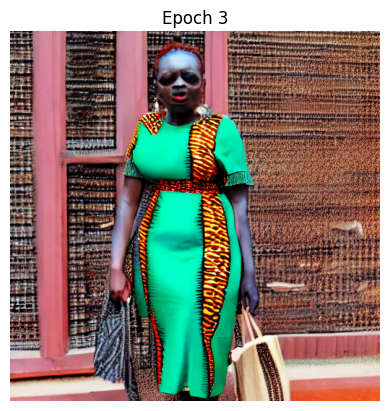

Epoch 4/10:   0%|          | 32/6404 [00:49<2:47:18,  1.58s/it]

accumulating gradients


Epoch 4/10:   1%|          | 64/6404 [01:39<2:46:46,  1.58s/it]

accumulating gradients


Epoch 4/10:   1%|▏         | 96/6404 [02:29<2:45:50,  1.58s/it]

accumulating gradients


Epoch 4/10:   2%|▏         | 128/6404 [03:19<2:45:13,  1.58s/it]

accumulating gradients


Epoch 4/10:   2%|▏         | 160/6404 [04:08<2:43:56,  1.58s/it]

accumulating gradients


Epoch 4/10:   3%|▎         | 192/6404 [04:58<2:42:52,  1.57s/it]

accumulating gradients


Epoch 4/10:   3%|▎         | 224/6404 [05:50<2:41:25,  1.57s/it]

accumulating gradients


Epoch 4/10:   4%|▍         | 256/6404 [06:40<2:42:28,  1.59s/it]

accumulating gradients


Epoch 4/10:   4%|▍         | 288/6404 [07:31<2:46:28,  1.63s/it]

accumulating gradients


Epoch 4/10:   5%|▍         | 320/6404 [08:21<2:45:54,  1.64s/it]

accumulating gradients


Epoch 4/10:   5%|▌         | 352/6404 [09:14<2:38:23,  1.57s/it]

accumulating gradients


Epoch 4/10:   6%|▌         | 384/6404 [10:05<2:39:29,  1.59s/it]

accumulating gradients


Epoch 4/10:   6%|▋         | 416/6404 [10:55<2:36:44,  1.57s/it]

accumulating gradients


Epoch 4/10:   7%|▋         | 448/6404 [11:45<2:36:44,  1.58s/it]

accumulating gradients


Epoch 4/10:   7%|▋         | 480/6404 [12:35<2:36:04,  1.58s/it]

accumulating gradients


Epoch 4/10:   8%|▊         | 512/6404 [13:27<2:38:00,  1.61s/it]

accumulating gradients


Epoch 4/10:   8%|▊         | 544/6404 [14:19<2:38:55,  1.63s/it]

accumulating gradients


Epoch 4/10:   9%|▉         | 576/6404 [15:11<2:34:45,  1.59s/it]

accumulating gradients


Epoch 4/10:   9%|▉         | 608/6404 [16:01<2:31:01,  1.56s/it]

accumulating gradients


Epoch 4/10:  10%|▉         | 640/6404 [16:52<2:44:48,  1.72s/it]

accumulating gradients


Epoch 4/10:  10%|█         | 672/6404 [17:44<2:30:19,  1.57s/it]

accumulating gradients


Epoch 4/10:  11%|█         | 704/6404 [18:35<2:29:11,  1.57s/it]

accumulating gradients


Epoch 4/10:  11%|█▏        | 736/6404 [19:25<2:28:25,  1.57s/it]

accumulating gradients


Epoch 4/10:  12%|█▏        | 768/6404 [20:16<2:55:17,  1.87s/it]

accumulating gradients


Epoch 4/10:  12%|█▏        | 800/6404 [21:06<2:26:33,  1.57s/it]

accumulating gradients


Epoch 4/10:  13%|█▎        | 832/6404 [21:56<2:25:34,  1.57s/it]

accumulating gradients


Epoch 4/10:  13%|█▎        | 864/6404 [22:48<2:39:29,  1.73s/it]

accumulating gradients


Epoch 4/10:  14%|█▍        | 896/6404 [23:40<2:24:46,  1.58s/it]

accumulating gradients


Epoch 4/10:  14%|█▍        | 928/6404 [24:30<2:36:17,  1.71s/it]

accumulating gradients


Epoch 4/10:  15%|█▍        | 960/6404 [25:21<2:33:00,  1.69s/it]

accumulating gradients


Epoch 4/10:  15%|█▌        | 992/6404 [26:15<2:27:45,  1.64s/it]

accumulating gradients


Epoch 4/10:  16%|█▌        | 1024/6404 [27:05<2:20:50,  1.57s/it]

accumulating gradients


Epoch 4/10:  16%|█▋        | 1056/6404 [27:56<2:46:13,  1.86s/it]

accumulating gradients


Epoch 4/10:  17%|█▋        | 1088/6404 [28:46<2:18:30,  1.56s/it]

accumulating gradients


Epoch 4/10:  17%|█▋        | 1120/6404 [29:38<2:18:26,  1.57s/it]

accumulating gradients


Epoch 4/10:  18%|█▊        | 1152/6404 [30:28<2:18:04,  1.58s/it]

accumulating gradients


Epoch 4/10:  18%|█▊        | 1184/6404 [31:20<2:17:20,  1.58s/it]

accumulating gradients


Epoch 4/10:  19%|█▉        | 1216/6404 [32:10<2:18:48,  1.61s/it]

accumulating gradients


Epoch 4/10:  19%|█▉        | 1248/6404 [33:01<2:15:29,  1.58s/it]

accumulating gradients


Epoch 4/10:  20%|█▉        | 1280/6404 [33:53<2:14:16,  1.57s/it]

accumulating gradients


Epoch 4/10:  20%|██        | 1312/6404 [34:46<2:27:10,  1.73s/it]

accumulating gradients


Epoch 4/10:  21%|██        | 1344/6404 [35:36<2:21:10,  1.67s/it]

accumulating gradients


Epoch 4/10:  21%|██▏       | 1376/6404 [36:27<2:14:12,  1.60s/it]

accumulating gradients


Epoch 4/10:  22%|██▏       | 1408/6404 [37:17<2:11:11,  1.58s/it]

accumulating gradients


Epoch 4/10:  22%|██▏       | 1440/6404 [38:11<2:10:53,  1.58s/it]

accumulating gradients


Epoch 4/10:  23%|██▎       | 1472/6404 [39:02<2:09:22,  1.57s/it]

accumulating gradients


Epoch 4/10:  23%|██▎       | 1504/6404 [39:54<2:09:20,  1.58s/it]

accumulating gradients


Epoch 4/10:  24%|██▍       | 1536/6404 [40:46<2:07:56,  1.58s/it]

accumulating gradients


Epoch 4/10:  24%|██▍       | 1568/6404 [41:37<2:07:12,  1.58s/it]

accumulating gradients


Epoch 4/10:  25%|██▍       | 1600/6404 [42:27<2:05:49,  1.57s/it]

accumulating gradients


Epoch 4/10:  25%|██▌       | 1632/6404 [43:19<2:20:09,  1.76s/it]

accumulating gradients


Epoch 4/10:  26%|██▌       | 1664/6404 [44:12<2:11:18,  1.66s/it]

accumulating gradients


Epoch 4/10:  26%|██▋       | 1696/6404 [45:03<2:03:13,  1.57s/it]

accumulating gradients


Epoch 4/10:  27%|██▋       | 1728/6404 [45:53<2:02:50,  1.58s/it]

accumulating gradients


Epoch 4/10:  27%|██▋       | 1760/6404 [46:45<2:01:37,  1.57s/it]

accumulating gradients


Epoch 4/10:  28%|██▊       | 1792/6404 [47:38<2:01:10,  1.58s/it]

accumulating gradients


Epoch 4/10:  28%|██▊       | 1824/6404 [48:27<1:59:50,  1.57s/it]

accumulating gradients


Epoch 4/10:  29%|██▉       | 1856/6404 [49:17<1:59:23,  1.58s/it]

accumulating gradients


Epoch 4/10:  29%|██▉       | 1888/6404 [50:08<1:58:07,  1.57s/it]

accumulating gradients


Epoch 4/10:  30%|██▉       | 1920/6404 [50:59<1:57:52,  1.58s/it]

accumulating gradients


Epoch 4/10:  30%|███       | 1952/6404 [51:50<1:57:56,  1.59s/it]

accumulating gradients


Epoch 4/10:  31%|███       | 1984/6404 [52:40<1:56:28,  1.58s/it]

accumulating gradients


Epoch 4/10:  31%|███▏      | 2016/6404 [53:31<1:55:52,  1.58s/it]

accumulating gradients


Epoch 4/10:  32%|███▏      | 2048/6404 [54:21<1:53:50,  1.57s/it]

accumulating gradients


Epoch 4/10:  32%|███▏      | 2080/6404 [55:15<1:55:00,  1.60s/it]

accumulating gradients


Epoch 4/10:  33%|███▎      | 2112/6404 [56:08<2:11:58,  1.84s/it]

accumulating gradients


Epoch 4/10:  33%|███▎      | 2144/6404 [56:59<1:52:01,  1.58s/it]

accumulating gradients


Epoch 4/10:  34%|███▍      | 2176/6404 [57:50<2:04:33,  1.77s/it]

accumulating gradients


Epoch 4/10:  34%|███▍      | 2208/6404 [58:41<1:52:20,  1.61s/it]

accumulating gradients


Epoch 4/10:  35%|███▍      | 2240/6404 [59:33<1:53:55,  1.64s/it]

accumulating gradients


Epoch 4/10:  35%|███▌      | 2272/6404 [1:00:24<1:57:00,  1.70s/it]

accumulating gradients


Epoch 4/10:  36%|███▌      | 2304/6404 [1:01:15<1:49:28,  1.60s/it]

accumulating gradients


Epoch 4/10:  36%|███▋      | 2336/6404 [1:02:05<1:46:50,  1.58s/it]

accumulating gradients


Epoch 4/10:  37%|███▋      | 2368/6404 [1:02:56<1:47:25,  1.60s/it]

accumulating gradients


Epoch 4/10:  37%|███▋      | 2400/6404 [1:03:47<1:44:55,  1.57s/it]

accumulating gradients


Epoch 4/10:  38%|███▊      | 2432/6404 [1:04:38<1:50:25,  1.67s/it]

accumulating gradients


Epoch 4/10:  38%|███▊      | 2464/6404 [1:05:28<1:43:43,  1.58s/it]

accumulating gradients


Epoch 4/10:  39%|███▉      | 2496/6404 [1:06:19<2:03:11,  1.89s/it]

accumulating gradients


Epoch 4/10:  39%|███▉      | 2528/6404 [1:07:08<1:41:59,  1.58s/it]

accumulating gradients


Epoch 4/10:  40%|███▉      | 2560/6404 [1:08:01<1:44:45,  1.64s/it]

accumulating gradients


Epoch 4/10:  40%|████      | 2592/6404 [1:08:50<1:40:05,  1.58s/it]

accumulating gradients


Epoch 4/10:  41%|████      | 2624/6404 [1:09:41<1:40:22,  1.59s/it]

accumulating gradients


Epoch 4/10:  41%|████▏     | 2656/6404 [1:10:33<1:47:48,  1.73s/it]

accumulating gradients


Epoch 4/10:  42%|████▏     | 2688/6404 [1:11:26<1:37:13,  1.57s/it]

accumulating gradients


Epoch 4/10:  42%|████▏     | 2720/6404 [1:12:16<1:49:29,  1.78s/it]

accumulating gradients


Epoch 4/10:  43%|████▎     | 2752/6404 [1:13:07<1:37:04,  1.59s/it]

accumulating gradients


Epoch 4/10:  43%|████▎     | 2784/6404 [1:13:57<1:35:50,  1.59s/it]

accumulating gradients


Epoch 4/10:  44%|████▍     | 2816/6404 [1:14:48<1:34:42,  1.58s/it]

accumulating gradients


Epoch 4/10:  44%|████▍     | 2848/6404 [1:15:41<1:40:58,  1.70s/it]

accumulating gradients


Epoch 4/10:  45%|████▍     | 2880/6404 [1:16:33<1:35:15,  1.62s/it]

accumulating gradients


Epoch 4/10:  45%|████▌     | 2912/6404 [1:17:25<1:33:27,  1.61s/it]

accumulating gradients


Epoch 4/10:  46%|████▌     | 2944/6404 [1:18:15<1:30:46,  1.57s/it]

accumulating gradients


Epoch 4/10:  46%|████▋     | 2976/6404 [1:19:07<1:29:55,  1.57s/it]

accumulating gradients


Epoch 4/10:  47%|████▋     | 3008/6404 [1:19:57<1:28:42,  1.57s/it]

accumulating gradients


Epoch 4/10:  47%|████▋     | 3040/6404 [1:20:47<1:28:12,  1.57s/it]

accumulating gradients


Epoch 4/10:  48%|████▊     | 3072/6404 [1:21:39<1:27:42,  1.58s/it]

accumulating gradients


Epoch 4/10:  48%|████▊     | 3104/6404 [1:22:30<1:26:02,  1.56s/it]

accumulating gradients


Epoch 4/10:  49%|████▉     | 3136/6404 [1:23:21<1:25:58,  1.58s/it]

accumulating gradients


Epoch 4/10:  49%|████▉     | 3168/6404 [1:24:10<1:25:01,  1.58s/it]

accumulating gradients


Epoch 4/10:  50%|████▉     | 3200/6404 [1:25:03<1:24:19,  1.58s/it]

accumulating gradients


Epoch 4/10:  50%|█████     | 3232/6404 [1:25:54<1:23:37,  1.58s/it]

accumulating gradients


Epoch 4/10:  51%|█████     | 3264/6404 [1:26:44<1:22:37,  1.58s/it]

accumulating gradients


Epoch 4/10:  51%|█████▏    | 3296/6404 [1:27:34<1:28:03,  1.70s/it]

accumulating gradients


Epoch 4/10:  52%|█████▏    | 3328/6404 [1:28:27<1:21:32,  1.59s/it]

accumulating gradients


Epoch 4/10:  52%|█████▏    | 3360/6404 [1:29:17<1:20:41,  1.59s/it]

accumulating gradients


Epoch 4/10:  53%|█████▎    | 3392/6404 [1:30:08<1:18:56,  1.57s/it]

accumulating gradients


Epoch 4/10:  53%|█████▎    | 3424/6404 [1:30:58<1:17:33,  1.56s/it]

accumulating gradients


Epoch 4/10:  54%|█████▍    | 3456/6404 [1:31:50<1:24:01,  1.71s/it]

accumulating gradients


Epoch 4/10:  54%|█████▍    | 3488/6404 [1:32:41<1:16:38,  1.58s/it]

accumulating gradients


Epoch 4/10:  55%|█████▍    | 3520/6404 [1:33:34<1:19:03,  1.64s/it]

accumulating gradients


Epoch 4/10:  55%|█████▌    | 3552/6404 [1:34:25<1:19:59,  1.68s/it]

accumulating gradients


Epoch 4/10:  56%|█████▌    | 3584/6404 [1:35:16<1:14:11,  1.58s/it]

accumulating gradients


Epoch 4/10:  56%|█████▋    | 3616/6404 [1:36:08<1:13:38,  1.58s/it]

accumulating gradients


Epoch 4/10:  57%|█████▋    | 3648/6404 [1:36:58<1:12:44,  1.58s/it]

accumulating gradients


Epoch 4/10:  57%|█████▋    | 3680/6404 [1:37:49<1:11:21,  1.57s/it]

accumulating gradients


Epoch 4/10:  58%|█████▊    | 3712/6404 [1:38:39<1:10:25,  1.57s/it]

accumulating gradients


Epoch 4/10:  58%|█████▊    | 3744/6404 [1:39:31<1:09:35,  1.57s/it]

accumulating gradients


Epoch 4/10:  59%|█████▉    | 3776/6404 [1:40:22<1:10:41,  1.61s/it]

accumulating gradients


Epoch 4/10:  59%|█████▉    | 3808/6404 [1:41:12<1:08:13,  1.58s/it]

accumulating gradients


Epoch 4/10:  60%|█████▉    | 3840/6404 [1:42:04<1:10:15,  1.64s/it]

accumulating gradients


Epoch 4/10:  60%|██████    | 3872/6404 [1:42:55<1:07:21,  1.60s/it]

accumulating gradients


Epoch 4/10:  61%|██████    | 3904/6404 [1:43:45<1:05:21,  1.57s/it]

accumulating gradients


Epoch 4/10:  61%|██████▏   | 3936/6404 [1:44:36<1:05:18,  1.59s/it]

accumulating gradients


Epoch 4/10:  62%|██████▏   | 3968/6404 [1:45:27<1:03:53,  1.57s/it]

accumulating gradients


Epoch 4/10:  62%|██████▏   | 4000/6404 [1:46:19<1:04:03,  1.60s/it]

accumulating gradients


Epoch 4/10:  63%|██████▎   | 4032/6404 [1:47:09<1:02:17,  1.58s/it]

accumulating gradients


Epoch 4/10:  63%|██████▎   | 4064/6404 [1:48:02<1:02:57,  1.61s/it]

accumulating gradients


Epoch 4/10:  64%|██████▍   | 4096/6404 [1:48:52<1:01:46,  1.61s/it]

accumulating gradients


Epoch 4/10:  64%|██████▍   | 4128/6404 [1:49:43<59:24,  1.57s/it]

accumulating gradients


Epoch 4/10:  65%|██████▍   | 4160/6404 [1:50:34<58:52,  1.57s/it]

accumulating gradients


Epoch 4/10:  65%|██████▌   | 4192/6404 [1:51:25<1:04:39,  1.75s/it]

accumulating gradients


Epoch 4/10:  66%|██████▌   | 4224/6404 [1:52:15<1:02:07,  1.71s/it]

accumulating gradients


Epoch 4/10:  66%|██████▋   | 4256/6404 [1:53:05<56:22,  1.57s/it]

accumulating gradients


Epoch 4/10:  67%|██████▋   | 4288/6404 [1:53:56<55:20,  1.57s/it]

accumulating gradients


Epoch 4/10:  67%|██████▋   | 4320/6404 [1:54:45<54:33,  1.57s/it]

accumulating gradients


Epoch 4/10:  68%|██████▊   | 4352/6404 [1:55:37<54:00,  1.58s/it]

accumulating gradients


Epoch 4/10:  68%|██████▊   | 4384/6404 [1:56:30<55:02,  1.63s/it]

accumulating gradients


Epoch 4/10:  69%|██████▉   | 4416/6404 [1:57:19<51:58,  1.57s/it]

accumulating gradients


Epoch 4/10:  69%|██████▉   | 4448/6404 [1:58:09<51:14,  1.57s/it]

accumulating gradients


Epoch 4/10:  70%|██████▉   | 4480/6404 [1:59:00<50:31,  1.58s/it]

accumulating gradients


Epoch 4/10:  70%|███████   | 4512/6404 [1:59:50<49:19,  1.56s/it]

accumulating gradients


Epoch 4/10:  71%|███████   | 4544/6404 [2:00:40<48:43,  1.57s/it]

accumulating gradients


Epoch 4/10:  71%|███████▏  | 4576/6404 [2:01:31<47:47,  1.57s/it]

accumulating gradients


Epoch 4/10:  72%|███████▏  | 4608/6404 [2:02:21<46:47,  1.56s/it]

accumulating gradients


Epoch 4/10:  72%|███████▏  | 4640/6404 [2:03:10<46:09,  1.57s/it]

accumulating gradients


Epoch 4/10:  73%|███████▎  | 4672/6404 [2:04:04<49:32,  1.72s/it]

accumulating gradients


Epoch 4/10:  73%|███████▎  | 4704/6404 [2:04:55<45:01,  1.59s/it]

accumulating gradients


Epoch 4/10:  74%|███████▍  | 4736/6404 [2:05:50<46:25,  1.67s/it]

accumulating gradients


Epoch 4/10:  74%|███████▍  | 4768/6404 [2:06:41<45:08,  1.66s/it]

accumulating gradients


Epoch 4/10:  75%|███████▍  | 4800/6404 [2:07:32<44:21,  1.66s/it]

accumulating gradients


Epoch 4/10:  75%|███████▌  | 4832/6404 [2:08:23<41:12,  1.57s/it]

accumulating gradients


Epoch 4/10:  76%|███████▌  | 4864/6404 [2:09:13<40:10,  1.57s/it]

accumulating gradients


Epoch 4/10:  76%|███████▋  | 4896/6404 [2:10:07<39:59,  1.59s/it]

accumulating gradients


Epoch 4/10:  77%|███████▋  | 4928/6404 [2:11:00<46:33,  1.89s/it]

accumulating gradients


Epoch 4/10:  77%|███████▋  | 4960/6404 [2:11:52<37:42,  1.57s/it]

accumulating gradients


Epoch 4/10:  78%|███████▊  | 4992/6404 [2:12:43<36:58,  1.57s/it]

accumulating gradients


Epoch 4/10:  78%|███████▊  | 5024/6404 [2:13:34<39:35,  1.72s/it]

accumulating gradients


Epoch 4/10:  79%|███████▉  | 5056/6404 [2:14:26<35:02,  1.56s/it]

accumulating gradients


Epoch 4/10:  79%|███████▉  | 5088/6404 [2:15:17<38:42,  1.77s/it]

accumulating gradients


Epoch 4/10:  80%|███████▉  | 5120/6404 [2:16:09<33:54,  1.58s/it]

accumulating gradients


Epoch 4/10:  80%|████████  | 5152/6404 [2:16:59<32:46,  1.57s/it]

accumulating gradients


Epoch 4/10:  81%|████████  | 5184/6404 [2:17:50<31:46,  1.56s/it]

accumulating gradients


Epoch 4/10:  81%|████████▏ | 5216/6404 [2:18:41<33:43,  1.70s/it]

accumulating gradients


Epoch 4/10:  82%|████████▏ | 5248/6404 [2:19:31<30:16,  1.57s/it]

accumulating gradients


Epoch 4/10:  82%|████████▏ | 5280/6404 [2:20:22<29:36,  1.58s/it]

accumulating gradients


Epoch 4/10:  83%|████████▎ | 5312/6404 [2:21:13<28:37,  1.57s/it]

accumulating gradients


Epoch 4/10:  83%|████████▎ | 5344/6404 [2:22:05<27:49,  1.57s/it]

accumulating gradients


Epoch 4/10:  84%|████████▍ | 5376/6404 [2:22:55<27:04,  1.58s/it]

accumulating gradients


Epoch 4/10:  84%|████████▍ | 5408/6404 [2:23:47<25:54,  1.56s/it]

accumulating gradients


Epoch 4/10:  85%|████████▍ | 5440/6404 [2:24:37<25:22,  1.58s/it]

accumulating gradients


Epoch 4/10:  85%|████████▌ | 5472/6404 [2:25:28<24:22,  1.57s/it]

accumulating gradients


Epoch 4/10:  86%|████████▌ | 5504/6404 [2:26:19<23:33,  1.57s/it]

accumulating gradients


Epoch 4/10:  86%|████████▋ | 5536/6404 [2:27:08<22:44,  1.57s/it]

accumulating gradients


Epoch 4/10:  87%|████████▋ | 5568/6404 [2:27:58<21:54,  1.57s/it]

accumulating gradients


Epoch 4/10:  87%|████████▋ | 5600/6404 [2:28:49<21:16,  1.59s/it]

accumulating gradients


Epoch 4/10:  88%|████████▊ | 5632/6404 [2:29:41<21:12,  1.65s/it]

accumulating gradients


Epoch 4/10:  88%|████████▊ | 5664/6404 [2:30:35<20:52,  1.69s/it]

accumulating gradients


Epoch 4/10:  89%|████████▉ | 5696/6404 [2:31:29<23:05,  1.96s/it]

accumulating gradients


Epoch 4/10:  89%|████████▉ | 5728/6404 [2:32:20<17:53,  1.59s/it]

accumulating gradients


Epoch 4/10:  90%|████████▉ | 5760/6404 [2:33:12<17:09,  1.60s/it]

accumulating gradients


Epoch 4/10:  90%|█████████ | 5792/6404 [2:34:03<16:03,  1.57s/it]

accumulating gradients


Epoch 4/10:  91%|█████████ | 5824/6404 [2:34:53<15:12,  1.57s/it]

accumulating gradients


Epoch 4/10:  91%|█████████▏| 5856/6404 [2:35:44<14:24,  1.58s/it]

accumulating gradients


Epoch 4/10:  92%|█████████▏| 5888/6404 [2:36:35<15:12,  1.77s/it]

accumulating gradients


Epoch 4/10:  92%|█████████▏| 5920/6404 [2:37:26<12:42,  1.57s/it]

accumulating gradients


Epoch 4/10:  93%|█████████▎| 5952/6404 [2:38:18<14:29,  1.92s/it]

accumulating gradients


Epoch 4/10:  93%|█████████▎| 5984/6404 [2:39:10<11:05,  1.58s/it]

accumulating gradients


Epoch 4/10:  94%|█████████▍| 6016/6404 [2:40:03<10:17,  1.59s/it]

accumulating gradients


Epoch 4/10:  94%|█████████▍| 6048/6404 [2:40:54<09:22,  1.58s/it]

accumulating gradients


Epoch 4/10:  95%|█████████▍| 6080/6404 [2:41:45<08:58,  1.66s/it]

accumulating gradients


Epoch 4/10:  95%|█████████▌| 6112/6404 [2:42:35<07:38,  1.57s/it]

accumulating gradients


Epoch 4/10:  96%|█████████▌| 6144/6404 [2:43:26<07:40,  1.77s/it]

accumulating gradients


Epoch 4/10:  96%|█████████▋| 6176/6404 [2:44:19<06:43,  1.77s/it]

accumulating gradients


Epoch 4/10:  97%|█████████▋| 6208/6404 [2:45:10<05:25,  1.66s/it]

accumulating gradients


Epoch 4/10:  97%|█████████▋| 6240/6404 [2:46:02<04:18,  1.58s/it]

accumulating gradients


Epoch 4/10:  98%|█████████▊| 6272/6404 [2:46:55<03:33,  1.61s/it]

accumulating gradients


Epoch 4/10:  98%|█████████▊| 6304/6404 [2:47:47<02:38,  1.58s/it]

accumulating gradients


Epoch 4/10:  99%|█████████▉| 6336/6404 [2:48:40<01:49,  1.61s/it]

accumulating gradients


Epoch 4/10:  99%|█████████▉| 6368/6404 [2:49:31<00:56,  1.56s/it]

accumulating gradients


Epoch 4/10: 100%|█████████▉| 6400/6404 [2:50:21<00:06,  1.56s/it]

accumulating gradients


Epoch 4/10: 100%|██████████| 6404/6404 [2:50:28<00:00,  1.60s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:19:45<00:00,  2.99s/it]


Epoch 4/10, Train Loss: 0.0111, Validation Loss: 0.0105
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

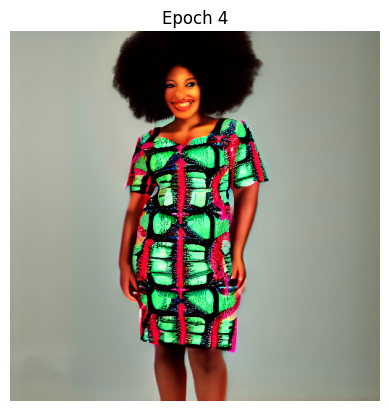

Epoch 5/10:   0%|          | 32/6404 [00:49<2:47:03,  1.57s/it]

accumulating gradients


Epoch 5/10:   1%|          | 64/6404 [01:39<2:45:18,  1.56s/it]

accumulating gradients


Epoch 5/10:   1%|▏         | 96/6404 [02:29<2:45:02,  1.57s/it]

accumulating gradients


Epoch 5/10:   2%|▏         | 128/6404 [03:18<2:44:53,  1.58s/it]

accumulating gradients


Epoch 5/10:   2%|▏         | 160/6404 [04:08<2:43:52,  1.57s/it]

accumulating gradients


Epoch 5/10:   3%|▎         | 192/6404 [04:58<2:43:31,  1.58s/it]

accumulating gradients


Epoch 5/10:   3%|▎         | 224/6404 [05:49<2:41:54,  1.57s/it]

accumulating gradients


Epoch 5/10:   4%|▍         | 256/6404 [06:39<2:41:06,  1.57s/it]

accumulating gradients


Epoch 5/10:   4%|▍         | 288/6404 [07:30<2:58:02,  1.75s/it]

accumulating gradients


Epoch 5/10:   5%|▍         | 320/6404 [08:21<2:39:29,  1.57s/it]

accumulating gradients


Epoch 5/10:   5%|▌         | 352/6404 [09:12<2:39:18,  1.58s/it]

accumulating gradients


Epoch 5/10:   6%|▌         | 384/6404 [10:02<2:37:59,  1.57s/it]

accumulating gradients


Epoch 5/10:   6%|▋         | 416/6404 [10:53<2:37:26,  1.58s/it]

accumulating gradients


Epoch 5/10:   7%|▋         | 448/6404 [11:42<2:36:04,  1.57s/it]

accumulating gradients


Epoch 5/10:   7%|▋         | 480/6404 [12:33<2:48:54,  1.71s/it]

accumulating gradients


Epoch 5/10:   8%|▊         | 512/6404 [13:23<2:34:20,  1.57s/it]

accumulating gradients


Epoch 5/10:   8%|▊         | 544/6404 [14:13<2:33:13,  1.57s/it]

accumulating gradients


Epoch 5/10:   9%|▉         | 576/6404 [15:03<2:32:45,  1.57s/it]

accumulating gradients


Epoch 5/10:   9%|▉         | 608/6404 [15:53<2:40:59,  1.67s/it]

accumulating gradients


Epoch 5/10:  10%|▉         | 640/6404 [16:44<2:44:45,  1.72s/it]

accumulating gradients


Epoch 5/10:  10%|█         | 672/6404 [17:34<2:30:17,  1.57s/it]

accumulating gradients


Epoch 5/10:  11%|█         | 704/6404 [18:25<2:30:02,  1.58s/it]

accumulating gradients


Epoch 5/10:  11%|█▏        | 736/6404 [19:16<2:30:49,  1.60s/it]

accumulating gradients


Epoch 5/10:  12%|█▏        | 768/6404 [20:06<2:27:59,  1.58s/it]

accumulating gradients


Epoch 5/10:  12%|█▏        | 800/6404 [20:56<2:26:38,  1.57s/it]

accumulating gradients


Epoch 5/10:  13%|█▎        | 832/6404 [21:46<2:26:16,  1.58s/it]

accumulating gradients


Epoch 5/10:  13%|█▎        | 864/6404 [22:36<2:25:25,  1.58s/it]

accumulating gradients


Epoch 5/10:  14%|█▍        | 896/6404 [23:26<2:24:45,  1.58s/it]

accumulating gradients


Epoch 5/10:  14%|█▍        | 928/6404 [24:17<2:23:57,  1.58s/it]

accumulating gradients


Epoch 5/10:  15%|█▍        | 960/6404 [25:07<2:22:15,  1.57s/it]

accumulating gradients


Epoch 5/10:  15%|█▌        | 992/6404 [25:57<2:21:13,  1.57s/it]

accumulating gradients


Epoch 5/10:  16%|█▌        | 1024/6404 [26:47<2:21:19,  1.58s/it]

accumulating gradients


Epoch 5/10:  16%|█▋        | 1056/6404 [27:36<2:20:19,  1.57s/it]

accumulating gradients


Epoch 5/10:  17%|█▋        | 1088/6404 [28:27<2:19:52,  1.58s/it]

accumulating gradients


Epoch 5/10:  17%|█▋        | 1120/6404 [29:17<2:18:52,  1.58s/it]

accumulating gradients


Epoch 5/10:  18%|█▊        | 1152/6404 [30:08<2:17:31,  1.57s/it]

accumulating gradients


Epoch 5/10:  18%|█▊        | 1184/6404 [30:58<2:16:50,  1.57s/it]

accumulating gradients


Epoch 5/10:  19%|█▉        | 1216/6404 [31:49<2:42:01,  1.87s/it]

accumulating gradients


Epoch 5/10:  19%|█▉        | 1248/6404 [32:39<2:14:58,  1.57s/it]

accumulating gradients


Epoch 5/10:  20%|█▉        | 1280/6404 [33:29<2:14:07,  1.57s/it]

accumulating gradients


Epoch 5/10:  20%|██        | 1312/6404 [34:19<2:27:27,  1.74s/it]

accumulating gradients


Epoch 5/10:  21%|██        | 1344/6404 [35:09<2:11:25,  1.56s/it]

accumulating gradients


Epoch 5/10:  21%|██▏       | 1376/6404 [35:59<2:10:48,  1.56s/it]

accumulating gradients


Epoch 5/10:  22%|██▏       | 1408/6404 [36:48<2:09:41,  1.56s/it]

accumulating gradients


Epoch 5/10:  22%|██▏       | 1440/6404 [37:38<2:09:29,  1.57s/it]

accumulating gradients


Epoch 5/10:  23%|██▎       | 1472/6404 [38:28<2:09:29,  1.58s/it]

accumulating gradients


Epoch 5/10:  23%|██▎       | 1504/6404 [39:17<2:07:59,  1.57s/it]

accumulating gradients


Epoch 5/10:  24%|██▍       | 1536/6404 [40:07<2:06:56,  1.56s/it]

accumulating gradients


Epoch 5/10:  24%|██▍       | 1568/6404 [40:57<2:06:33,  1.57s/it]

accumulating gradients


Epoch 5/10:  25%|██▍       | 1600/6404 [41:47<2:06:31,  1.58s/it]

accumulating gradients


Epoch 5/10:  25%|██▌       | 1632/6404 [42:39<2:08:56,  1.62s/it]

accumulating gradients


Epoch 5/10:  26%|██▌       | 1664/6404 [43:29<2:03:26,  1.56s/it]

accumulating gradients


Epoch 5/10:  26%|██▋       | 1696/6404 [44:19<2:03:14,  1.57s/it]

accumulating gradients


Epoch 5/10:  27%|██▋       | 1728/6404 [45:09<2:02:26,  1.57s/it]

accumulating gradients


Epoch 5/10:  27%|██▋       | 1760/6404 [45:59<2:01:48,  1.57s/it]

accumulating gradients


Epoch 5/10:  28%|██▊       | 1792/6404 [46:49<2:00:45,  1.57s/it]

accumulating gradients


Epoch 5/10:  28%|██▊       | 1824/6404 [47:40<2:00:26,  1.58s/it]

accumulating gradients


Epoch 5/10:  29%|██▉       | 1856/6404 [48:30<1:58:40,  1.57s/it]

accumulating gradients


Epoch 5/10:  29%|██▉       | 1888/6404 [49:21<2:05:26,  1.67s/it]

accumulating gradients


Epoch 5/10:  30%|██▉       | 1920/6404 [50:11<1:57:18,  1.57s/it]

accumulating gradients


Epoch 5/10:  30%|███       | 1952/6404 [51:01<1:56:35,  1.57s/it]

accumulating gradients


Epoch 5/10:  31%|███       | 1984/6404 [51:50<1:55:52,  1.57s/it]

accumulating gradients


Epoch 5/10:  31%|███▏      | 2016/6404 [52:40<1:54:39,  1.57s/it]

accumulating gradients


Epoch 5/10:  32%|███▏      | 2048/6404 [53:30<1:53:33,  1.56s/it]

accumulating gradients


Epoch 5/10:  32%|███▏      | 2080/6404 [54:20<1:53:23,  1.57s/it]

accumulating gradients


Epoch 5/10:  33%|███▎      | 2112/6404 [55:10<1:52:00,  1.57s/it]

accumulating gradients


Epoch 5/10:  33%|███▎      | 2144/6404 [55:59<1:51:33,  1.57s/it]

accumulating gradients


Epoch 5/10:  34%|███▍      | 2176/6404 [56:49<1:50:37,  1.57s/it]

accumulating gradients


Epoch 5/10:  34%|███▍      | 2208/6404 [57:38<1:49:32,  1.57s/it]

accumulating gradients


Epoch 5/10:  35%|███▍      | 2240/6404 [58:28<1:49:08,  1.57s/it]

accumulating gradients


Epoch 5/10:  35%|███▌      | 2272/6404 [59:18<1:48:28,  1.58s/it]

accumulating gradients


Epoch 5/10:  36%|███▌      | 2304/6404 [1:00:08<1:47:53,  1.58s/it]

accumulating gradients


Epoch 5/10:  36%|███▋      | 2336/6404 [1:00:58<1:46:48,  1.58s/it]

accumulating gradients


Epoch 5/10:  37%|███▋      | 2368/6404 [1:01:47<1:45:34,  1.57s/it]

accumulating gradients


Epoch 5/10:  37%|███▋      | 2400/6404 [1:02:38<1:54:11,  1.71s/it]

accumulating gradients


Epoch 5/10:  38%|███▊      | 2432/6404 [1:03:29<1:44:10,  1.57s/it]

accumulating gradients


Epoch 5/10:  38%|███▊      | 2464/6404 [1:04:18<1:43:32,  1.58s/it]

accumulating gradients


Epoch 5/10:  39%|███▉      | 2496/6404 [1:05:08<1:42:00,  1.57s/it]

accumulating gradients


Epoch 5/10:  39%|███▉      | 2528/6404 [1:05:58<1:41:30,  1.57s/it]

accumulating gradients


Epoch 5/10:  40%|███▉      | 2560/6404 [1:06:47<1:40:46,  1.57s/it]

accumulating gradients


Epoch 5/10:  40%|████      | 2592/6404 [1:07:39<1:44:19,  1.64s/it]

accumulating gradients


Epoch 5/10:  41%|████      | 2624/6404 [1:08:29<1:38:30,  1.56s/it]

accumulating gradients


Epoch 5/10:  41%|████▏     | 2656/6404 [1:09:20<1:42:35,  1.64s/it]

accumulating gradients


Epoch 5/10:  42%|████▏     | 2688/6404 [1:10:09<1:36:34,  1.56s/it]

accumulating gradients


Epoch 5/10:  42%|████▏     | 2720/6404 [1:10:59<1:36:49,  1.58s/it]

accumulating gradients


Epoch 5/10:  43%|████▎     | 2752/6404 [1:11:50<1:35:45,  1.57s/it]

accumulating gradients


Epoch 5/10:  43%|████▎     | 2784/6404 [1:12:41<1:41:47,  1.69s/it]

accumulating gradients


Epoch 5/10:  44%|████▍     | 2816/6404 [1:13:33<1:39:41,  1.67s/it]

accumulating gradients


Epoch 5/10:  44%|████▍     | 2848/6404 [1:14:24<1:33:16,  1.57s/it]

accumulating gradients


Epoch 5/10:  45%|████▍     | 2880/6404 [1:15:16<1:32:24,  1.57s/it]

accumulating gradients


Epoch 5/10:  45%|████▌     | 2912/6404 [1:16:06<1:34:50,  1.63s/it]

accumulating gradients


Epoch 5/10:  46%|████▌     | 2944/6404 [1:16:56<1:31:03,  1.58s/it]

accumulating gradients


Epoch 5/10:  46%|████▋     | 2976/6404 [1:17:47<1:31:46,  1.61s/it]

accumulating gradients


Epoch 5/10:  47%|████▋     | 3008/6404 [1:18:37<1:29:30,  1.58s/it]

accumulating gradients


Epoch 5/10:  47%|████▋     | 3040/6404 [1:19:27<1:28:28,  1.58s/it]

accumulating gradients


Epoch 5/10:  48%|████▊     | 3072/6404 [1:20:17<1:27:18,  1.57s/it]

accumulating gradients


Epoch 5/10:  48%|████▊     | 3104/6404 [1:21:08<1:25:58,  1.56s/it]

accumulating gradients


Epoch 5/10:  49%|████▉     | 3136/6404 [1:21:57<1:25:25,  1.57s/it]

accumulating gradients


Epoch 5/10:  49%|████▉     | 3168/6404 [1:22:47<1:24:08,  1.56s/it]

accumulating gradients


Epoch 5/10:  50%|████▉     | 3200/6404 [1:23:39<1:27:59,  1.65s/it]

accumulating gradients


Epoch 5/10:  50%|█████     | 3232/6404 [1:24:30<1:27:51,  1.66s/it]

accumulating gradients


Epoch 5/10:  51%|█████     | 3264/6404 [1:25:21<1:22:06,  1.57s/it]

accumulating gradients


Epoch 5/10:  51%|█████▏    | 3296/6404 [1:26:10<1:21:29,  1.57s/it]

accumulating gradients


Epoch 5/10:  52%|█████▏    | 3328/6404 [1:27:01<1:20:15,  1.57s/it]

accumulating gradients


Epoch 5/10:  52%|█████▏    | 3360/6404 [1:27:50<1:19:30,  1.57s/it]

accumulating gradients


Epoch 5/10:  53%|█████▎    | 3392/6404 [1:28:41<1:18:49,  1.57s/it]

accumulating gradients


Epoch 5/10:  53%|█████▎    | 3424/6404 [1:29:31<1:18:27,  1.58s/it]

accumulating gradients


Epoch 5/10:  54%|█████▍    | 3456/6404 [1:30:22<1:24:25,  1.72s/it]

accumulating gradients


Epoch 5/10:  54%|█████▍    | 3488/6404 [1:31:11<1:16:25,  1.57s/it]

accumulating gradients


Epoch 5/10:  55%|█████▍    | 3520/6404 [1:32:02<1:15:10,  1.56s/it]

accumulating gradients


Epoch 5/10:  55%|█████▌    | 3552/6404 [1:32:52<1:17:33,  1.63s/it]

accumulating gradients


Epoch 5/10:  56%|█████▌    | 3584/6404 [1:33:43<1:13:45,  1.57s/it]

accumulating gradients


Epoch 5/10:  56%|█████▋    | 3616/6404 [1:34:34<1:12:57,  1.57s/it]

accumulating gradients


Epoch 5/10:  57%|█████▋    | 3648/6404 [1:35:23<1:12:09,  1.57s/it]

accumulating gradients


Epoch 5/10:  57%|█████▋    | 3680/6404 [1:36:13<1:11:41,  1.58s/it]

accumulating gradients


Epoch 5/10:  58%|█████▊    | 3712/6404 [1:37:03<1:10:24,  1.57s/it]

accumulating gradients


Epoch 5/10:  58%|█████▊    | 3744/6404 [1:37:54<1:09:57,  1.58s/it]

accumulating gradients


Epoch 5/10:  59%|█████▉    | 3776/6404 [1:38:44<1:09:03,  1.58s/it]

accumulating gradients


Epoch 5/10:  59%|█████▉    | 3808/6404 [1:39:35<1:08:13,  1.58s/it]

accumulating gradients


Epoch 5/10:  60%|█████▉    | 3840/6404 [1:40:25<1:11:06,  1.66s/it]

accumulating gradients


Epoch 5/10:  60%|██████    | 3872/6404 [1:41:15<1:06:22,  1.57s/it]

accumulating gradients


Epoch 5/10:  61%|██████    | 3904/6404 [1:42:05<1:10:28,  1.69s/it]

accumulating gradients


Epoch 5/10:  61%|██████▏   | 3936/6404 [1:42:56<1:04:20,  1.56s/it]

accumulating gradients


Epoch 5/10:  62%|██████▏   | 3968/6404 [1:43:46<1:04:01,  1.58s/it]

accumulating gradients


Epoch 5/10:  62%|██████▏   | 4000/6404 [1:44:36<1:05:44,  1.64s/it]

accumulating gradients


Epoch 5/10:  63%|██████▎   | 4032/6404 [1:45:26<1:01:58,  1.57s/it]

accumulating gradients


Epoch 5/10:  63%|██████▎   | 4064/6404 [1:46:16<1:01:31,  1.58s/it]

accumulating gradients


Epoch 5/10:  64%|██████▍   | 4096/6404 [1:47:07<1:05:51,  1.71s/it]

accumulating gradients


Epoch 5/10:  64%|██████▍   | 4128/6404 [1:47:58<1:02:05,  1.64s/it]

accumulating gradients


Epoch 5/10:  65%|██████▍   | 4160/6404 [1:48:49<1:03:39,  1.70s/it]

accumulating gradients


Epoch 5/10:  65%|██████▌   | 4192/6404 [1:49:39<57:55,  1.57s/it]

accumulating gradients


Epoch 5/10:  66%|██████▌   | 4224/6404 [1:50:29<57:15,  1.58s/it]

accumulating gradients


Epoch 5/10:  66%|██████▋   | 4256/6404 [1:51:20<56:15,  1.57s/it]

accumulating gradients


Epoch 5/10:  67%|██████▋   | 4288/6404 [1:52:10<55:23,  1.57s/it]

accumulating gradients


Epoch 5/10:  67%|██████▋   | 4320/6404 [1:53:00<54:27,  1.57s/it]

accumulating gradients


Epoch 5/10:  68%|██████▊   | 4352/6404 [1:53:49<53:48,  1.57s/it]

accumulating gradients


Epoch 5/10:  68%|██████▊   | 4384/6404 [1:54:40<57:25,  1.71s/it]

accumulating gradients


Epoch 5/10:  69%|██████▉   | 4416/6404 [1:55:31<52:07,  1.57s/it]

accumulating gradients


Epoch 5/10:  69%|██████▉   | 4448/6404 [1:56:20<51:07,  1.57s/it]

accumulating gradients


Epoch 5/10:  70%|██████▉   | 4480/6404 [1:57:10<50:26,  1.57s/it]

accumulating gradients


Epoch 5/10:  70%|███████   | 4512/6404 [1:58:01<52:18,  1.66s/it]

accumulating gradients


Epoch 5/10:  71%|███████   | 4544/6404 [1:58:53<51:22,  1.66s/it]

accumulating gradients


Epoch 5/10:  71%|███████▏  | 4576/6404 [1:59:43<47:54,  1.57s/it]

accumulating gradients


Epoch 5/10:  72%|███████▏  | 4608/6404 [2:00:33<47:09,  1.58s/it]

accumulating gradients


Epoch 5/10:  72%|███████▏  | 4640/6404 [2:01:23<46:22,  1.58s/it]

accumulating gradients


Epoch 5/10:  73%|███████▎  | 4672/6404 [2:02:12<45:21,  1.57s/it]

accumulating gradients


Epoch 5/10:  73%|███████▎  | 4704/6404 [2:03:03<44:28,  1.57s/it]

accumulating gradients


Epoch 5/10:  74%|███████▍  | 4736/6404 [2:03:52<43:26,  1.56s/it]

accumulating gradients


Epoch 5/10:  74%|███████▍  | 4768/6404 [2:04:42<42:53,  1.57s/it]

accumulating gradients


Epoch 5/10:  75%|███████▍  | 4800/6404 [2:05:32<41:54,  1.57s/it]

accumulating gradients


Epoch 5/10:  75%|███████▌  | 4832/6404 [2:06:23<41:15,  1.57s/it]

accumulating gradients


Epoch 5/10:  76%|███████▌  | 4864/6404 [2:07:13<40:27,  1.58s/it]

accumulating gradients


Epoch 5/10:  76%|███████▋  | 4896/6404 [2:08:03<39:32,  1.57s/it]

accumulating gradients


Epoch 5/10:  77%|███████▋  | 4928/6404 [2:08:54<38:42,  1.57s/it]

accumulating gradients


Epoch 5/10:  77%|███████▋  | 4960/6404 [2:09:45<37:42,  1.57s/it]

accumulating gradients


Epoch 5/10:  78%|███████▊  | 4992/6404 [2:10:34<37:02,  1.57s/it]

accumulating gradients


Epoch 5/10:  78%|███████▊  | 5024/6404 [2:11:24<36:08,  1.57s/it]

accumulating gradients


Epoch 5/10:  79%|███████▉  | 5056/6404 [2:12:15<36:47,  1.64s/it]

accumulating gradients


Epoch 5/10:  79%|███████▉  | 5088/6404 [2:13:06<34:52,  1.59s/it]

accumulating gradients


Epoch 5/10:  80%|███████▉  | 5120/6404 [2:13:55<33:42,  1.58s/it]

accumulating gradients


Epoch 5/10:  80%|████████  | 5152/6404 [2:14:47<33:09,  1.59s/it]

accumulating gradients


Epoch 5/10:  81%|████████  | 5184/6404 [2:15:39<32:08,  1.58s/it]

accumulating gradients


Epoch 5/10:  81%|████████▏ | 5216/6404 [2:16:29<33:50,  1.71s/it]

accumulating gradients


Epoch 5/10:  82%|████████▏ | 5248/6404 [2:17:20<30:13,  1.57s/it]

accumulating gradients


Epoch 5/10:  82%|████████▏ | 5280/6404 [2:18:10<29:19,  1.57s/it]

accumulating gradients


Epoch 5/10:  83%|████████▎ | 5312/6404 [2:19:00<28:35,  1.57s/it]

accumulating gradients


Epoch 5/10:  83%|████████▎ | 5344/6404 [2:19:50<27:43,  1.57s/it]

accumulating gradients


Epoch 5/10:  84%|████████▍ | 5376/6404 [2:20:40<26:57,  1.57s/it]

accumulating gradients


Epoch 5/10:  84%|████████▍ | 5408/6404 [2:21:30<26:05,  1.57s/it]

accumulating gradients


Epoch 5/10:  85%|████████▍ | 5440/6404 [2:22:20<25:18,  1.58s/it]

accumulating gradients


Epoch 5/10:  85%|████████▌ | 5472/6404 [2:23:11<24:28,  1.58s/it]

accumulating gradients


Epoch 5/10:  86%|████████▌ | 5504/6404 [2:24:01<23:33,  1.57s/it]

accumulating gradients


Epoch 5/10:  86%|████████▋ | 5536/6404 [2:24:51<22:48,  1.58s/it]

accumulating gradients


Epoch 5/10:  87%|████████▋ | 5568/6404 [2:25:41<22:42,  1.63s/it]

accumulating gradients


Epoch 5/10:  87%|████████▋ | 5600/6404 [2:26:31<21:07,  1.58s/it]

accumulating gradients


Epoch 5/10:  88%|████████▊ | 5632/6404 [2:27:21<20:14,  1.57s/it]

accumulating gradients


Epoch 5/10:  88%|████████▊ | 5664/6404 [2:28:11<19:19,  1.57s/it]

accumulating gradients


Epoch 5/10:  89%|████████▉ | 5696/6404 [2:29:01<18:29,  1.57s/it]

accumulating gradients


Epoch 5/10:  89%|████████▉ | 5728/6404 [2:29:52<17:43,  1.57s/it]

accumulating gradients


Epoch 5/10:  90%|████████▉ | 5760/6404 [2:30:41<16:55,  1.58s/it]

accumulating gradients


Epoch 5/10:  90%|█████████ | 5792/6404 [2:31:31<16:00,  1.57s/it]

accumulating gradients


Epoch 5/10:  91%|█████████ | 5824/6404 [2:32:21<15:08,  1.57s/it]

accumulating gradients


Epoch 5/10:  91%|█████████▏| 5856/6404 [2:33:10<14:18,  1.57s/it]

accumulating gradients


Epoch 5/10:  92%|█████████▏| 5888/6404 [2:34:00<13:28,  1.57s/it]

accumulating gradients


Epoch 5/10:  92%|█████████▏| 5920/6404 [2:34:50<12:40,  1.57s/it]

accumulating gradients


Epoch 5/10:  93%|█████████▎| 5952/6404 [2:35:40<11:51,  1.57s/it]

accumulating gradients


Epoch 5/10:  93%|█████████▎| 5984/6404 [2:36:30<10:58,  1.57s/it]

accumulating gradients


Epoch 5/10:  94%|█████████▍| 6016/6404 [2:37:20<10:07,  1.57s/it]

accumulating gradients


Epoch 5/10:  94%|█████████▍| 6048/6404 [2:38:10<09:17,  1.56s/it]

accumulating gradients


Epoch 5/10:  95%|█████████▍| 6080/6404 [2:39:00<08:27,  1.57s/it]

accumulating gradients


Epoch 5/10:  95%|█████████▌| 6112/6404 [2:39:49<07:36,  1.56s/it]

accumulating gradients


Epoch 5/10:  96%|█████████▌| 6144/6404 [2:40:39<06:48,  1.57s/it]

accumulating gradients


Epoch 5/10:  96%|█████████▋| 6176/6404 [2:41:30<05:58,  1.57s/it]

accumulating gradients


Epoch 5/10:  97%|█████████▋| 6208/6404 [2:42:19<05:07,  1.57s/it]

accumulating gradients


Epoch 5/10:  97%|█████████▋| 6240/6404 [2:43:11<04:17,  1.57s/it]

accumulating gradients


Epoch 5/10:  98%|█████████▊| 6272/6404 [2:44:01<03:27,  1.58s/it]

accumulating gradients


Epoch 5/10:  98%|█████████▊| 6304/6404 [2:44:53<03:05,  1.86s/it]

accumulating gradients


Epoch 5/10:  99%|█████████▉| 6336/6404 [2:45:43<01:46,  1.56s/it]

accumulating gradients


Epoch 5/10:  99%|█████████▉| 6368/6404 [2:46:33<00:58,  1.61s/it]

accumulating gradients


Epoch 5/10: 100%|█████████▉| 6400/6404 [2:47:23<00:06,  1.57s/it]

accumulating gradients


Epoch 5/10: 100%|██████████| 6404/6404 [2:47:29<00:00,  1.57s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:19:45<00:00,  2.99s/it]


Epoch 5/10, Train Loss: 0.0104, Validation Loss: 0.0114
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

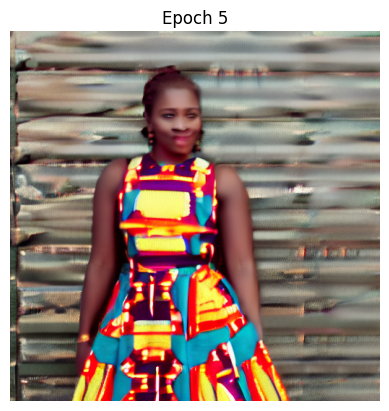

Epoch 6/10:   0%|          | 32/6404 [00:49<2:46:13,  1.57s/it]

accumulating gradients


Epoch 6/10:   1%|          | 64/6404 [01:39<2:46:02,  1.57s/it]

accumulating gradients


Epoch 6/10:   1%|▏         | 96/6404 [02:29<2:45:53,  1.58s/it]

accumulating gradients


Epoch 6/10:   2%|▏         | 128/6404 [03:18<2:44:32,  1.57s/it]

accumulating gradients


Epoch 6/10:   2%|▏         | 160/6404 [04:08<2:43:56,  1.58s/it]

accumulating gradients


Epoch 6/10:   3%|▎         | 192/6404 [04:58<2:42:00,  1.56s/it]

accumulating gradients


Epoch 6/10:   3%|▎         | 224/6404 [05:49<2:49:20,  1.64s/it]

accumulating gradients


Epoch 6/10:   4%|▍         | 256/6404 [06:38<2:39:39,  1.56s/it]

accumulating gradients


Epoch 6/10:   4%|▍         | 288/6404 [07:28<2:39:38,  1.57s/it]

accumulating gradients


Epoch 6/10:   5%|▍         | 320/6404 [08:18<2:39:20,  1.57s/it]

accumulating gradients


Epoch 6/10:   5%|▌         | 352/6404 [09:07<2:39:22,  1.58s/it]

accumulating gradients


Epoch 6/10:   6%|▌         | 384/6404 [09:57<2:38:20,  1.58s/it]

accumulating gradients


Epoch 6/10:   6%|▋         | 416/6404 [10:48<2:40:23,  1.61s/it]

accumulating gradients


Epoch 6/10:   7%|▋         | 448/6404 [11:38<2:35:58,  1.57s/it]

accumulating gradients


Epoch 6/10:   7%|▋         | 480/6404 [12:27<2:35:16,  1.57s/it]

accumulating gradients


Epoch 6/10:   8%|▊         | 512/6404 [13:17<2:34:46,  1.58s/it]

accumulating gradients


Epoch 6/10:   8%|▊         | 544/6404 [14:07<2:33:58,  1.58s/it]

accumulating gradients


Epoch 6/10:   9%|▉         | 576/6404 [14:57<2:45:18,  1.70s/it]

accumulating gradients


Epoch 6/10:   9%|▉         | 608/6404 [15:47<2:33:01,  1.58s/it]

accumulating gradients


Epoch 6/10:  10%|▉         | 640/6404 [16:37<2:30:59,  1.57s/it]

accumulating gradients


Epoch 6/10:  10%|█         | 672/6404 [17:27<2:30:18,  1.57s/it]

accumulating gradients


Epoch 6/10:  11%|█         | 704/6404 [18:17<2:28:40,  1.56s/it]

accumulating gradients


Epoch 6/10:  11%|█▏        | 736/6404 [19:06<2:28:09,  1.57s/it]

accumulating gradients


Epoch 6/10:  12%|█▏        | 768/6404 [19:56<2:27:35,  1.57s/it]

accumulating gradients


Epoch 6/10:  12%|█▏        | 800/6404 [20:46<2:27:47,  1.58s/it]

accumulating gradients


Epoch 6/10:  13%|█▎        | 832/6404 [21:36<2:25:52,  1.57s/it]

accumulating gradients


Epoch 6/10:  13%|█▎        | 864/6404 [22:25<2:25:25,  1.57s/it]

accumulating gradients


Epoch 6/10:  14%|█▍        | 896/6404 [23:15<2:24:31,  1.57s/it]

accumulating gradients


Epoch 6/10:  14%|█▍        | 928/6404 [24:05<2:23:31,  1.57s/it]

accumulating gradients


Epoch 6/10:  15%|█▍        | 960/6404 [24:55<2:22:41,  1.57s/it]

accumulating gradients


Epoch 6/10:  15%|█▌        | 992/6404 [25:45<2:20:58,  1.56s/it]

accumulating gradients


Epoch 6/10:  16%|█▌        | 1024/6404 [26:34<2:22:15,  1.59s/it]

accumulating gradients


Epoch 6/10:  16%|█▋        | 1056/6404 [27:24<2:20:54,  1.58s/it]

accumulating gradients


Epoch 6/10:  17%|█▋        | 1088/6404 [28:14<2:19:52,  1.58s/it]

accumulating gradients


Epoch 6/10:  17%|█▋        | 1120/6404 [29:03<2:18:39,  1.57s/it]

accumulating gradients


Epoch 6/10:  18%|█▊        | 1152/6404 [29:53<2:17:29,  1.57s/it]

accumulating gradients


Epoch 6/10:  18%|█▊        | 1184/6404 [30:43<2:16:27,  1.57s/it]

accumulating gradients


Epoch 6/10:  19%|█▉        | 1216/6404 [31:33<2:16:25,  1.58s/it]

accumulating gradients


Epoch 6/10:  19%|█▉        | 1248/6404 [32:22<2:15:06,  1.57s/it]

accumulating gradients


Epoch 6/10:  20%|█▉        | 1280/6404 [33:12<2:14:04,  1.57s/it]

accumulating gradients


Epoch 6/10:  20%|██        | 1312/6404 [34:02<2:13:14,  1.57s/it]

accumulating gradients


Epoch 6/10:  21%|██        | 1344/6404 [34:52<2:12:45,  1.57s/it]

accumulating gradients


Epoch 6/10:  21%|██▏       | 1376/6404 [35:41<2:11:58,  1.57s/it]

accumulating gradients


Epoch 6/10:  22%|██▏       | 1408/6404 [36:32<2:11:17,  1.58s/it]

accumulating gradients


Epoch 6/10:  22%|██▏       | 1440/6404 [37:21<2:09:27,  1.56s/it]

accumulating gradients


Epoch 6/10:  23%|██▎       | 1472/6404 [38:11<2:08:41,  1.57s/it]

accumulating gradients


Epoch 6/10:  23%|██▎       | 1504/6404 [39:01<2:08:06,  1.57s/it]

accumulating gradients


Epoch 6/10:  24%|██▍       | 1536/6404 [39:50<2:08:04,  1.58s/it]

accumulating gradients


Epoch 6/10:  24%|██▍       | 1568/6404 [40:40<2:06:47,  1.57s/it]

accumulating gradients


Epoch 6/10:  25%|██▍       | 1600/6404 [41:30<2:05:46,  1.57s/it]

accumulating gradients


Epoch 6/10:  25%|██▌       | 1632/6404 [42:19<2:05:25,  1.58s/it]

accumulating gradients


Epoch 6/10:  26%|██▌       | 1664/6404 [43:09<2:04:53,  1.58s/it]

accumulating gradients


Epoch 6/10:  26%|██▋       | 1696/6404 [43:59<2:03:31,  1.57s/it]

accumulating gradients


Epoch 6/10:  27%|██▋       | 1728/6404 [44:48<2:02:39,  1.57s/it]

accumulating gradients


Epoch 6/10:  27%|██▋       | 1760/6404 [45:39<2:02:19,  1.58s/it]

accumulating gradients


Epoch 6/10:  28%|██▊       | 1792/6404 [46:29<2:00:37,  1.57s/it]

accumulating gradients


Epoch 6/10:  28%|██▊       | 1824/6404 [47:19<2:00:02,  1.57s/it]

accumulating gradients


Epoch 6/10:  29%|██▉       | 1856/6404 [48:09<1:59:23,  1.58s/it]

accumulating gradients


Epoch 6/10:  29%|██▉       | 1888/6404 [48:58<1:58:35,  1.58s/it]

accumulating gradients


Epoch 6/10:  30%|██▉       | 1920/6404 [49:49<1:57:11,  1.57s/it]

accumulating gradients


Epoch 6/10:  30%|███       | 1952/6404 [50:39<1:56:37,  1.57s/it]

accumulating gradients


Epoch 6/10:  31%|███       | 1984/6404 [51:29<1:56:02,  1.58s/it]

accumulating gradients


Epoch 6/10:  31%|███▏      | 2016/6404 [52:18<1:54:21,  1.56s/it]

accumulating gradients


Epoch 6/10:  32%|███▏      | 2048/6404 [53:08<1:54:19,  1.57s/it]

accumulating gradients


Epoch 6/10:  32%|███▏      | 2080/6404 [53:58<1:53:35,  1.58s/it]

accumulating gradients


Epoch 6/10:  33%|███▎      | 2112/6404 [54:48<1:52:11,  1.57s/it]

accumulating gradients


Epoch 6/10:  33%|███▎      | 2144/6404 [55:38<1:51:59,  1.58s/it]

accumulating gradients


Epoch 6/10:  34%|███▍      | 2176/6404 [56:28<1:50:25,  1.57s/it]

accumulating gradients


Epoch 6/10:  34%|███▍      | 2208/6404 [57:17<1:49:49,  1.57s/it]

accumulating gradients


Epoch 6/10:  35%|███▍      | 2240/6404 [58:07<1:48:36,  1.57s/it]

accumulating gradients


Epoch 6/10:  35%|███▌      | 2272/6404 [58:56<1:48:14,  1.57s/it]

accumulating gradients


Epoch 6/10:  36%|███▌      | 2304/6404 [59:46<1:47:35,  1.57s/it]

accumulating gradients


Epoch 6/10:  36%|███▋      | 2336/6404 [1:00:36<1:46:51,  1.58s/it]

accumulating gradients


Epoch 6/10:  37%|███▋      | 2368/6404 [1:01:26<1:46:15,  1.58s/it]

accumulating gradients


Epoch 6/10:  37%|███▋      | 2400/6404 [1:02:15<1:45:08,  1.58s/it]

accumulating gradients


Epoch 6/10:  38%|███▊      | 2432/6404 [1:03:05<1:44:20,  1.58s/it]

accumulating gradients


Epoch 6/10:  38%|███▊      | 2464/6404 [1:03:55<1:43:29,  1.58s/it]

accumulating gradients


Epoch 6/10:  39%|███▉      | 2496/6404 [1:04:45<1:42:55,  1.58s/it]

accumulating gradients


Epoch 6/10:  39%|███▉      | 2528/6404 [1:05:35<1:41:34,  1.57s/it]

accumulating gradients


Epoch 6/10:  40%|███▉      | 2560/6404 [1:06:24<1:40:29,  1.57s/it]

accumulating gradients


Epoch 6/10:  40%|████      | 2592/6404 [1:07:14<1:40:01,  1.57s/it]

accumulating gradients


Epoch 6/10:  41%|████      | 2624/6404 [1:08:04<1:39:19,  1.58s/it]

accumulating gradients


Epoch 6/10:  41%|████▏     | 2656/6404 [1:08:54<1:37:21,  1.56s/it]

accumulating gradients


Epoch 6/10:  42%|████▏     | 2688/6404 [1:09:43<1:37:31,  1.57s/it]

accumulating gradients


Epoch 6/10:  42%|████▏     | 2720/6404 [1:10:33<1:36:27,  1.57s/it]

accumulating gradients


Epoch 6/10:  43%|████▎     | 2752/6404 [1:11:23<1:35:48,  1.57s/it]

accumulating gradients


Epoch 6/10:  43%|████▎     | 2784/6404 [1:12:13<1:35:03,  1.58s/it]

accumulating gradients


Epoch 6/10:  44%|████▍     | 2816/6404 [1:13:03<1:34:26,  1.58s/it]

accumulating gradients


Epoch 6/10:  44%|████▍     | 2848/6404 [1:13:52<1:33:24,  1.58s/it]

accumulating gradients


Epoch 6/10:  45%|████▍     | 2880/6404 [1:14:42<1:31:52,  1.56s/it]

accumulating gradients


Epoch 6/10:  45%|████▌     | 2912/6404 [1:15:32<1:39:11,  1.70s/it]

accumulating gradients


Epoch 6/10:  46%|████▌     | 2944/6404 [1:16:22<1:30:34,  1.57s/it]

accumulating gradients


Epoch 6/10:  46%|████▋     | 2976/6404 [1:17:12<1:39:31,  1.74s/it]

accumulating gradients


Epoch 6/10:  47%|████▋     | 3008/6404 [1:18:02<1:29:12,  1.58s/it]

accumulating gradients


Epoch 6/10:  47%|████▋     | 3040/6404 [1:18:52<1:27:59,  1.57s/it]

accumulating gradients


Epoch 6/10:  48%|████▊     | 3072/6404 [1:19:41<1:27:13,  1.57s/it]

accumulating gradients


Epoch 6/10:  48%|████▊     | 3104/6404 [1:20:31<1:26:32,  1.57s/it]

accumulating gradients


Epoch 6/10:  49%|████▉     | 3136/6404 [1:21:21<1:25:41,  1.57s/it]

accumulating gradients


Epoch 6/10:  49%|████▉     | 3168/6404 [1:22:11<1:24:26,  1.57s/it]

accumulating gradients


Epoch 6/10:  50%|████▉     | 3200/6404 [1:23:00<1:24:00,  1.57s/it]

accumulating gradients


Epoch 6/10:  50%|█████     | 3232/6404 [1:23:50<1:23:09,  1.57s/it]

accumulating gradients


Epoch 6/10:  51%|█████     | 3264/6404 [1:24:40<1:21:58,  1.57s/it]

accumulating gradients


Epoch 6/10:  51%|█████▏    | 3296/6404 [1:25:29<1:21:06,  1.57s/it]

accumulating gradients


Epoch 6/10:  52%|█████▏    | 3328/6404 [1:26:19<1:20:42,  1.57s/it]

accumulating gradients


Epoch 6/10:  52%|█████▏    | 3360/6404 [1:27:08<1:19:27,  1.57s/it]

accumulating gradients


Epoch 6/10:  53%|█████▎    | 3392/6404 [1:27:58<1:19:15,  1.58s/it]

accumulating gradients


Epoch 6/10:  53%|█████▎    | 3424/6404 [1:28:48<1:18:15,  1.58s/it]

accumulating gradients


Epoch 6/10:  54%|█████▍    | 3456/6404 [1:29:37<1:16:57,  1.57s/it]

accumulating gradients


Epoch 6/10:  54%|█████▍    | 3488/6404 [1:30:28<1:16:38,  1.58s/it]

accumulating gradients


Epoch 6/10:  55%|█████▍    | 3520/6404 [1:31:18<1:15:15,  1.57s/it]

accumulating gradients


Epoch 6/10:  55%|█████▌    | 3552/6404 [1:32:07<1:14:14,  1.56s/it]

accumulating gradients


Epoch 6/10:  56%|█████▌    | 3584/6404 [1:32:57<1:13:58,  1.57s/it]

accumulating gradients


Epoch 6/10:  56%|█████▋    | 3616/6404 [1:33:47<1:13:05,  1.57s/it]

accumulating gradients


Epoch 6/10:  57%|█████▋    | 3648/6404 [1:34:37<1:12:38,  1.58s/it]

accumulating gradients


Epoch 6/10:  57%|█████▋    | 3680/6404 [1:35:26<1:11:16,  1.57s/it]

accumulating gradients


Epoch 6/10:  58%|█████▊    | 3712/6404 [1:36:16<1:10:18,  1.57s/it]

accumulating gradients


Epoch 6/10:  58%|█████▊    | 3744/6404 [1:37:06<1:10:03,  1.58s/it]

accumulating gradients


Epoch 6/10:  59%|█████▉    | 3776/6404 [1:37:56<1:08:54,  1.57s/it]

accumulating gradients


Epoch 6/10:  59%|█████▉    | 3808/6404 [1:38:46<1:08:07,  1.57s/it]

accumulating gradients


Epoch 6/10:  60%|█████▉    | 3840/6404 [1:39:35<1:06:58,  1.57s/it]

accumulating gradients


Epoch 6/10:  60%|██████    | 3872/6404 [1:40:25<1:06:29,  1.58s/it]

accumulating gradients


Epoch 6/10:  61%|██████    | 3904/6404 [1:41:15<1:05:37,  1.57s/it]

accumulating gradients


Epoch 6/10:  61%|██████▏   | 3936/6404 [1:42:04<1:04:50,  1.58s/it]

accumulating gradients


Epoch 6/10:  62%|██████▏   | 3949/6404 [1:42:25<1:03:48,  1.56s/it]

In [ ]:
# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

checkpoint_dir = os.path.join(PROJECT_ROOT, "checkpoint2")
os.makedirs(checkpoint_dir, exist_ok=True)

# Transformations for images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Reduce image size to 256x256
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5, 0.5), (0.5, 0.5, 0.5, 0.5))  # Normalize for 4 channels (RGBA)
])

class FashionDataset(Dataset):
    def __init__(self, image_paths, captions, tokenizer, transform=None):
        self.image_paths = image_paths
        self.captions = captions
        self.tokenizer = tokenizer
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        caption = self.captions[idx]

        image = Image.open(image_path).convert("RGBA")  # Convert to RGBA
        if self.transform:
            image = self.transform(image)

        inputs = self.tokenizer(caption, return_tensors="pt", padding="max_length", truncation=True, max_length=77)
        input_ids = inputs["input_ids"].squeeze(0)
        attention_mask = inputs["attention_mask"].squeeze(0)

        return image, input_ids, attention_mask



# Function to check the tensor shapes
def check_tensor_shapes(dataloader, clip_model, unet, noise_scheduler):
    # Get a single batch
    images, input_ids, attention_mask = next(iter(dataloader))
    images = images.to("cuda")
    input_ids = input_ids.to("cuda")
    attention_mask = attention_mask.to("cuda")

    print(f"Image tensor shape: {images.shape}")
    print(f"Input IDs shape: {input_ids.shape}")
    print(f"Attention mask shape: {attention_mask.shape}")

    # Generate noise
    noise = torch.randn(images.shape).to(images.device)
    print(f"Noise tensor shape: {noise.shape}")

    # Get text embeddings
    text_embeddings = clip_model(input_ids, attention_mask=attention_mask).last_hidden_state
    print(f"Text embeddings shape: {text_embeddings.shape}")

    # Forward pass through the model
    timesteps = torch.tensor([50], device=images.device)  # Example timesteps value, adjust as needed
    noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
    print(noisy_images.dtype)
    print(f"Noisy images tensor shape: {noisy_images.shape}")

    noise_pred = unet(noisy_images, timesteps, encoder_hidden_states=text_embeddings).sample
    print(f"Predicted noise tensor shape: {noise_pred.shape}")

    # Free GPU memory
    del images, input_ids, attention_mask, noise, text_embeddings, noisy_images, noise_pred
    torch.cuda.empty_cache()

# Create datasets for training and validation
train_dataset = FashionDataset(image_paths_train, captions_train, tokenizer, transform)
val_dataset = FashionDataset(image_paths_val, captions_val, tokenizer, transform)

# Define the number of workers for data loading
num_workers = 0  # Adjust this number based on your system's CPU cores and memory
batch_size = 1  # Start with the smallest batch size first
effective_batch_sz = 32
k = effective_batch_sz / batch_size

# Use DataLoader for data loading
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# Training loop
num_epochs = 10  # Set total number of epochs to 10
train_losses = []
val_losses = []

optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, unet.parameters()), lr=5e-6)  # Adjust learning rate
scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=3, verbose=True)
scaler = GradScaler()

best_val_loss = float('inf')
early_stopping_patience = 5
early_stopping_counter = 0

# Sample text prompt for image generation check
sample_text_prompt = "A lady wearing an african wax print dress"

# Load last checkpoint if available
last_checkpoint_path = os.path.join(checkpoint_dir, "checkpoint_epoch_thh.pth")
start_epoch = 0

if os.path.exists(last_checkpoint_path):
    checkpoint = torch.load(last_checkpoint_path)
    print(f"Checkpoint loaded successfully: {last_checkpoint_path}")
    print(f"Checkpoint contains: {checkpoint.keys()}")
    unet.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch']
    best_val_loss = checkpoint['loss']
    print(f"Resuming training from epoch {start_epoch}")
else:
    print(f"No checkpoint found at {last_checkpoint_path}, starting from epoch 1")

for epoch in range(start_epoch, start_epoch + num_epochs):
    train_loss = 0.0
    unet.train()

    for batch_idx, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{start_epoch + num_epochs}")):
        images, input_ids, attention_mask = batch
        images = images.to("cuda")
        input_ids = input_ids.to("cuda")
        attention_mask = attention_mask.to("cuda")



        with autocast():
            noise = torch.randn(images.shape, device=images.device)
            text_embeddings = clip_model(input_ids, attention_mask=attention_mask).last_hidden_state
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (1,), device=images.device).long()
            noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
            noise_pred = unet(noisy_images, timesteps, encoder_hidden_states=text_embeddings).sample
            loss = torch.nn.functional.mse_loss(noise_pred, noise)

        scaler.scale(loss).backward()
        # scaler.unscale_(optimizer)
        if (batch_idx+1) % k == 0 or (batch_idx+1) == len(train_loader):
          print("accumulating gradients")
          # Clip gradients (optional, to avoid exploding gradients)
          torch.nn.utils.clip_grad_norm_(unet.parameters(), max_norm=1.0)

          # Check if gradients exist before stepping optimizer
          if any(p.grad is not None for p in unet.parameters()):
              scaler.step(optimizer)
              scaler.update()
              optimizer.zero_grad()

        train_loss += loss.item()

        # Detach and delete tensors to free memory
        # del images, input_ids, attention_mask, noise, text_embeddings, timesteps, noisy_images, noise_pred, loss
        # clear_memory()

    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    # Validation phase
    val_loss = 0.0
    unet.eval()
    with torch.no_grad():
        for batch_idx, batch in enumerate(tqdm(val_loader, desc="Validation")):
            images, input_ids, attention_mask = batch
            images = images.to("cuda")
            input_ids = input_ids.to("cuda")
            attention_mask = attention_mask.to("cuda")

            noise = torch.randn(images.shape, device=images.device)
            text_embeddings = clip_model(input_ids, attention_mask=attention_mask).last_hidden_state
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (1,), device=images.device).long()
            noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
            noise_pred = unet(noisy_images, timesteps, encoder_hidden_states=text_embeddings).sample
            loss = torch.nn.functional.mse_loss(noise_pred, noise)

            val_loss += loss.item()

            # Detach and delete tensors to free memory
            # del images, input_ids, attention_mask, noise, text_embeddings, timesteps, noisy_images, noise_pred, loss
            # clear_memory()

    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{start_epoch + num_epochs}, Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    # Save checkpoints every epoch
    checkpoint_path = os.path.join(checkpoint_dir, f"checkpoint_epoch_{epoch+1}.pth")
    os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)

    # Check available disk space on Google Drive
    total, used, free = shutil.disk_usage("/content/drive")
    print(f"Disk usage: {free // (2**30)} GB free")
    if free < 10 * (2**30):  # Less than 10GB free
        raise RuntimeError("Insufficient disk space to save checkpoint")

    torch.save({
        'epoch': epoch + 1,
        'model_state_dict': unet.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': train_loss,
    }, checkpoint_path)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        early_stopping_counter = 0  # Reset early stopping counter if validation loss improves
    else:
        early_stopping_counter += 1

    scheduler.step(val_loss)

    # Early stopping
    if early_stopping_counter >= early_stopping_patience:
        print("Early stopping triggered")
        break

    # Generate sample image after each epoch for visual inspection
    pipeline.unet.eval()
    with torch.no_grad():
        result = pipeline(sample_text_prompt).images[0]
        plt.imshow(result)
        plt.axis('off')
        plt.title(f'Epoch {epoch+1}')
        plt.show()
    pipeline.unet.train()



# Plotting training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

##TRAINING TO COMPLETE THE 10 EPOCH : Due to Colab Pro+ limitation, run time was disconnected when it was training on the 6th epoch so i had to load the 5th epoch saved checkpoint and resume training in the cell below.

Checkpoint loaded successfully: /content/drive/MyDrive/fashion-diffusion/checkpoint2/checkpoint_epoch_5.pth
Checkpoint contains: dict_keys(['epoch', 'model_state_dict', 'optimizer_state_dict', 'loss'])
Resuming training from epoch 5


Epoch 6/10:   0%|          | 31/6404 [01:10<3:59:45,  2.26s/it]

accumulating gradients


Epoch 6/10:   1%|          | 64/6404 [02:25<4:02:45,  2.30s/it]

accumulating gradients


Epoch 6/10:   1%|▏         | 96/6404 [03:36<3:53:07,  2.22s/it]

accumulating gradients


Epoch 6/10:   2%|▏         | 128/6404 [04:50<3:59:30,  2.29s/it]

accumulating gradients


Epoch 6/10:   2%|▏         | 160/6404 [06:03<3:55:05,  2.26s/it]

accumulating gradients


Epoch 6/10:   3%|▎         | 192/6404 [07:12<3:47:12,  2.19s/it]

accumulating gradients


Epoch 6/10:   3%|▎         | 224/6404 [08:24<3:49:19,  2.23s/it]

accumulating gradients


Epoch 6/10:   4%|▍         | 256/6404 [09:36<3:45:47,  2.20s/it]

accumulating gradients


Epoch 6/10:   4%|▍         | 288/6404 [10:48<3:48:55,  2.25s/it]

accumulating gradients


Epoch 6/10:   5%|▍         | 320/6404 [12:01<4:02:00,  2.39s/it]

accumulating gradients


Epoch 6/10:   5%|▌         | 352/6404 [13:15<3:52:55,  2.31s/it]

accumulating gradients


Epoch 6/10:   6%|▌         | 384/6404 [14:26<3:50:24,  2.30s/it]

accumulating gradients


Epoch 6/10:   6%|▋         | 416/6404 [15:38<3:59:08,  2.40s/it]

accumulating gradients


Epoch 6/10:   7%|▋         | 448/6404 [16:50<3:48:43,  2.30s/it]

accumulating gradients


Epoch 6/10:   7%|▋         | 480/6404 [18:01<3:40:28,  2.23s/it]

accumulating gradients


Epoch 6/10:   8%|▊         | 512/6404 [19:12<3:44:32,  2.29s/it]

accumulating gradients


Epoch 6/10:   8%|▊         | 544/6404 [20:23<3:42:27,  2.28s/it]

accumulating gradients


Epoch 6/10:   9%|▉         | 576/6404 [21:35<3:42:14,  2.29s/it]

accumulating gradients


Epoch 6/10:   9%|▉         | 608/6404 [22:48<3:38:22,  2.26s/it]

accumulating gradients


Epoch 6/10:  10%|▉         | 640/6404 [24:03<3:52:34,  2.42s/it]

accumulating gradients


Epoch 6/10:  10%|█         | 672/6404 [25:16<3:34:29,  2.25s/it]

accumulating gradients


Epoch 6/10:  11%|█         | 704/6404 [26:28<3:49:36,  2.42s/it]

accumulating gradients


Epoch 6/10:  11%|█▏        | 736/6404 [27:41<3:35:44,  2.28s/it]

accumulating gradients


Epoch 6/10:  12%|█▏        | 768/6404 [28:56<3:40:32,  2.35s/it]

accumulating gradients


Epoch 6/10:  12%|█▏        | 800/6404 [30:08<3:37:20,  2.33s/it]

accumulating gradients


Epoch 6/10:  13%|█▎        | 832/6404 [31:19<3:27:50,  2.24s/it]

accumulating gradients


Epoch 6/10:  13%|█▎        | 864/6404 [32:32<3:28:19,  2.26s/it]

accumulating gradients


Epoch 6/10:  14%|█▍        | 896/6404 [33:45<3:26:15,  2.25s/it]

accumulating gradients


Epoch 6/10:  14%|█▍        | 928/6404 [34:57<3:25:09,  2.25s/it]

accumulating gradients


Epoch 6/10:  15%|█▍        | 960/6404 [36:07<3:34:09,  2.36s/it]

accumulating gradients


Epoch 6/10:  15%|█▌        | 992/6404 [37:20<3:21:07,  2.23s/it]

accumulating gradients


Epoch 6/10:  16%|█▌        | 1024/6404 [38:33<3:21:49,  2.25s/it]

accumulating gradients


Epoch 6/10:  16%|█▋        | 1056/6404 [39:44<3:17:17,  2.21s/it]

accumulating gradients


Epoch 6/10:  17%|█▋        | 1088/6404 [40:56<3:18:41,  2.24s/it]

accumulating gradients


Epoch 6/10:  17%|█▋        | 1120/6404 [42:09<3:16:00,  2.23s/it]

accumulating gradients


Epoch 6/10:  18%|█▊        | 1152/6404 [43:22<3:31:32,  2.42s/it]

accumulating gradients


Epoch 6/10:  18%|█▊        | 1184/6404 [44:34<3:11:38,  2.20s/it]

accumulating gradients


Epoch 6/10:  19%|█▉        | 1216/6404 [45:46<3:09:56,  2.20s/it]

accumulating gradients


Epoch 6/10:  19%|█▉        | 1248/6404 [46:58<3:17:34,  2.30s/it]

accumulating gradients


Epoch 6/10:  20%|█▉        | 1280/6404 [48:10<3:08:48,  2.21s/it]

accumulating gradients


Epoch 6/10:  20%|██        | 1312/6404 [49:21<3:16:54,  2.32s/it]

accumulating gradients


Epoch 6/10:  21%|██        | 1344/6404 [50:34<3:17:29,  2.34s/it]

accumulating gradients


Epoch 6/10:  21%|██▏       | 1376/6404 [51:46<3:21:33,  2.41s/it]

accumulating gradients


Epoch 6/10:  22%|██▏       | 1408/6404 [52:58<3:03:46,  2.21s/it]

accumulating gradients


Epoch 6/10:  22%|██▏       | 1440/6404 [54:11<3:06:08,  2.25s/it]

accumulating gradients


Epoch 6/10:  23%|██▎       | 1472/6404 [55:24<3:10:00,  2.31s/it]

accumulating gradients


Epoch 6/10:  23%|██▎       | 1504/6404 [56:36<2:59:40,  2.20s/it]

accumulating gradients


Epoch 6/10:  24%|██▍       | 1536/6404 [57:48<3:05:21,  2.28s/it]

accumulating gradients


Epoch 6/10:  24%|██▍       | 1568/6404 [59:00<3:05:49,  2.31s/it]

accumulating gradients


Epoch 6/10:  25%|██▍       | 1600/6404 [1:00:12<3:03:27,  2.29s/it]

accumulating gradients


Epoch 6/10:  25%|██▌       | 1632/6404 [1:01:23<3:01:13,  2.28s/it]

accumulating gradients


Epoch 6/10:  26%|██▌       | 1664/6404 [1:02:35<3:03:48,  2.33s/it]

accumulating gradients


Epoch 6/10:  26%|██▋       | 1696/6404 [1:03:47<2:58:22,  2.27s/it]

accumulating gradients


Epoch 6/10:  27%|██▋       | 1728/6404 [1:04:59<2:54:20,  2.24s/it]

accumulating gradients


Epoch 6/10:  27%|██▋       | 1760/6404 [1:06:12<3:03:40,  2.37s/it]

accumulating gradients


Epoch 6/10:  28%|██▊       | 1792/6404 [1:07:25<2:55:58,  2.29s/it]

accumulating gradients


Epoch 6/10:  28%|██▊       | 1824/6404 [1:08:35<2:55:05,  2.29s/it]

accumulating gradients


Epoch 6/10:  29%|██▉       | 1856/6404 [1:09:47<2:51:03,  2.26s/it]

accumulating gradients


Epoch 6/10:  29%|██▉       | 1888/6404 [1:11:00<2:54:39,  2.32s/it]

accumulating gradients


Epoch 6/10:  30%|██▉       | 1920/6404 [1:12:13<2:49:33,  2.27s/it]

accumulating gradients


Epoch 6/10:  30%|███       | 1952/6404 [1:13:25<2:53:51,  2.34s/it]

accumulating gradients


Epoch 6/10:  31%|███       | 1984/6404 [1:14:36<2:40:45,  2.18s/it]

accumulating gradients


Epoch 6/10:  31%|███▏      | 2016/6404 [1:15:46<2:41:28,  2.21s/it]

accumulating gradients


Epoch 6/10:  32%|███▏      | 2048/6404 [1:16:58<2:46:14,  2.29s/it]

accumulating gradients


Epoch 6/10:  32%|███▏      | 2080/6404 [1:18:09<2:37:14,  2.18s/it]

accumulating gradients


Epoch 6/10:  33%|███▎      | 2112/6404 [1:19:22<2:45:50,  2.32s/it]

accumulating gradients


Epoch 6/10:  33%|███▎      | 2144/6404 [1:20:35<2:49:23,  2.39s/it]

accumulating gradients


Epoch 6/10:  34%|███▍      | 2176/6404 [1:21:47<2:36:57,  2.23s/it]

accumulating gradients


Epoch 6/10:  34%|███▍      | 2208/6404 [1:22:59<2:47:38,  2.40s/it]

accumulating gradients


Epoch 6/10:  35%|███▍      | 2240/6404 [1:24:11<2:44:22,  2.37s/it]

accumulating gradients


Epoch 6/10:  35%|███▌      | 2272/6404 [1:25:22<2:34:43,  2.25s/it]

accumulating gradients


Epoch 6/10:  36%|███▌      | 2304/6404 [1:26:35<2:32:17,  2.23s/it]

accumulating gradients


Epoch 6/10:  36%|███▋      | 2336/6404 [1:27:47<2:34:48,  2.28s/it]

accumulating gradients


Epoch 6/10:  37%|███▋      | 2368/6404 [1:28:58<2:28:11,  2.20s/it]

accumulating gradients


Epoch 6/10:  37%|███▋      | 2400/6404 [1:30:12<2:34:40,  2.32s/it]

accumulating gradients


Epoch 6/10:  38%|███▊      | 2432/6404 [1:31:25<2:30:36,  2.27s/it]

accumulating gradients


Epoch 6/10:  38%|███▊      | 2464/6404 [1:32:35<2:27:45,  2.25s/it]

accumulating gradients


Epoch 6/10:  39%|███▉      | 2496/6404 [1:33:46<2:22:18,  2.18s/it]

accumulating gradients


Epoch 6/10:  39%|███▉      | 2528/6404 [1:34:57<2:23:11,  2.22s/it]

accumulating gradients


Epoch 6/10:  40%|███▉      | 2560/6404 [1:36:09<2:24:47,  2.26s/it]

accumulating gradients


Epoch 6/10:  40%|████      | 2592/6404 [1:37:21<2:32:36,  2.40s/it]

accumulating gradients


Epoch 6/10:  41%|████      | 2624/6404 [1:38:34<2:22:31,  2.26s/it]

accumulating gradients


Epoch 6/10:  41%|████▏     | 2656/6404 [1:39:45<2:24:17,  2.31s/it]

accumulating gradients


Epoch 6/10:  42%|████▏     | 2688/6404 [1:40:56<2:29:10,  2.41s/it]

accumulating gradients


Epoch 6/10:  42%|████▏     | 2720/6404 [1:42:08<2:15:36,  2.21s/it]

accumulating gradients


Epoch 6/10:  43%|████▎     | 2752/6404 [1:43:20<2:15:28,  2.23s/it]

accumulating gradients


Epoch 6/10:  43%|████▎     | 2784/6404 [1:44:32<2:16:12,  2.26s/it]

accumulating gradients


Epoch 6/10:  44%|████▍     | 2816/6404 [1:45:44<2:19:19,  2.33s/it]

accumulating gradients


Epoch 6/10:  44%|████▍     | 2848/6404 [1:46:55<2:08:39,  2.17s/it]

accumulating gradients


Epoch 6/10:  45%|████▍     | 2880/6404 [1:48:08<2:13:33,  2.27s/it]

accumulating gradients


Epoch 6/10:  45%|████▌     | 2912/6404 [1:49:18<2:07:24,  2.19s/it]

accumulating gradients


Epoch 6/10:  46%|████▌     | 2944/6404 [1:50:31<2:15:50,  2.36s/it]

accumulating gradients


Epoch 6/10:  46%|████▋     | 2976/6404 [1:51:41<2:04:20,  2.18s/it]

accumulating gradients


Epoch 6/10:  47%|████▋     | 3008/6404 [1:52:55<2:06:59,  2.24s/it]

accumulating gradients


Epoch 6/10:  47%|████▋     | 3040/6404 [1:54:08<2:05:11,  2.23s/it]

accumulating gradients


Epoch 6/10:  48%|████▊     | 3072/6404 [1:55:20<2:02:58,  2.21s/it]

accumulating gradients


Epoch 6/10:  48%|████▊     | 3104/6404 [1:56:32<2:02:05,  2.22s/it]

accumulating gradients


Epoch 6/10:  49%|████▉     | 3136/6404 [1:57:44<2:06:18,  2.32s/it]

accumulating gradients


Epoch 6/10:  49%|████▉     | 3168/6404 [1:58:55<2:00:19,  2.23s/it]

accumulating gradients


Epoch 6/10:  50%|████▉     | 3200/6404 [2:00:07<1:56:48,  2.19s/it]

accumulating gradients


Epoch 6/10:  50%|█████     | 3232/6404 [2:01:20<1:55:51,  2.19s/it]

accumulating gradients


Epoch 6/10:  51%|█████     | 3264/6404 [2:02:32<1:56:10,  2.22s/it]

accumulating gradients


Epoch 6/10:  51%|█████▏    | 3296/6404 [2:03:46<2:08:21,  2.48s/it]

accumulating gradients


Epoch 6/10:  52%|█████▏    | 3328/6404 [2:04:58<1:57:09,  2.29s/it]

accumulating gradients


Epoch 6/10:  52%|█████▏    | 3360/6404 [2:06:11<1:53:01,  2.23s/it]

accumulating gradients


Epoch 6/10:  53%|█████▎    | 3392/6404 [2:07:25<1:57:35,  2.34s/it]

accumulating gradients


Epoch 6/10:  53%|█████▎    | 3424/6404 [2:08:36<1:55:04,  2.32s/it]

accumulating gradients


Epoch 6/10:  54%|█████▍    | 3456/6404 [2:09:47<1:50:16,  2.24s/it]

accumulating gradients


Epoch 6/10:  54%|█████▍    | 3488/6404 [2:10:59<1:46:41,  2.20s/it]

accumulating gradients


Epoch 6/10:  55%|█████▍    | 3520/6404 [2:12:11<1:45:40,  2.20s/it]

accumulating gradients


Epoch 6/10:  55%|█████▌    | 3552/6404 [2:13:23<1:50:03,  2.32s/it]

accumulating gradients


Epoch 6/10:  56%|█████▌    | 3584/6404 [2:14:34<1:43:57,  2.21s/it]

accumulating gradients


Epoch 6/10:  56%|█████▋    | 3616/6404 [2:15:46<1:45:22,  2.27s/it]

accumulating gradients


Epoch 6/10:  57%|█████▋    | 3648/6404 [2:16:57<1:44:47,  2.28s/it]

accumulating gradients


Epoch 6/10:  57%|█████▋    | 3680/6404 [2:18:09<1:44:12,  2.30s/it]

accumulating gradients


Epoch 6/10:  58%|█████▊    | 3712/6404 [2:19:22<1:39:12,  2.21s/it]

accumulating gradients


Epoch 6/10:  58%|█████▊    | 3744/6404 [2:20:36<1:45:41,  2.38s/it]

accumulating gradients


Epoch 6/10:  59%|█████▉    | 3776/6404 [2:21:51<1:43:05,  2.35s/it]

accumulating gradients


Epoch 6/10:  59%|█████▉    | 3808/6404 [2:23:04<1:38:33,  2.28s/it]

accumulating gradients


Epoch 6/10:  60%|█████▉    | 3840/6404 [2:24:16<1:43:26,  2.42s/it]

accumulating gradients


Epoch 6/10:  60%|██████    | 3872/6404 [2:25:29<1:35:14,  2.26s/it]

accumulating gradients


Epoch 6/10:  61%|██████    | 3904/6404 [2:26:42<1:46:34,  2.56s/it]

accumulating gradients


Epoch 6/10:  61%|██████▏   | 3936/6404 [2:27:54<1:32:44,  2.25s/it]

accumulating gradients


Epoch 6/10:  62%|██████▏   | 3968/6404 [2:29:05<1:33:48,  2.31s/it]

accumulating gradients


Epoch 6/10:  62%|██████▏   | 4000/6404 [2:30:18<1:29:08,  2.23s/it]

accumulating gradients


Epoch 6/10:  63%|██████▎   | 4032/6404 [2:31:28<1:28:26,  2.24s/it]

accumulating gradients


Epoch 6/10:  63%|██████▎   | 4064/6404 [2:32:40<1:26:30,  2.22s/it]

accumulating gradients


Epoch 6/10:  64%|██████▍   | 4096/6404 [2:33:51<1:24:01,  2.18s/it]

accumulating gradients


Epoch 6/10:  64%|██████▍   | 4128/6404 [2:35:03<1:25:30,  2.25s/it]

accumulating gradients


Epoch 6/10:  65%|██████▍   | 4160/6404 [2:36:17<1:24:43,  2.27s/it]

accumulating gradients


Epoch 6/10:  65%|██████▌   | 4192/6404 [2:37:30<1:25:24,  2.32s/it]

accumulating gradients


Epoch 6/10:  66%|██████▌   | 4224/6404 [2:38:42<1:20:10,  2.21s/it]

accumulating gradients


Epoch 6/10:  66%|██████▋   | 4256/6404 [2:39:53<1:19:26,  2.22s/it]

accumulating gradients


Epoch 6/10:  67%|██████▋   | 4288/6404 [2:41:04<1:19:51,  2.26s/it]

accumulating gradients


Epoch 6/10:  67%|██████▋   | 4320/6404 [2:42:18<1:16:50,  2.21s/it]

accumulating gradients


Epoch 6/10:  68%|██████▊   | 4352/6404 [2:43:31<1:19:38,  2.33s/it]

accumulating gradients


Epoch 6/10:  68%|██████▊   | 4384/6404 [2:44:42<1:13:53,  2.19s/it]

accumulating gradients


Epoch 6/10:  69%|██████▉   | 4416/6404 [2:45:55<1:14:14,  2.24s/it]

accumulating gradients


Epoch 6/10:  69%|██████▉   | 4448/6404 [2:47:08<1:16:58,  2.36s/it]

accumulating gradients


Epoch 6/10:  70%|██████▉   | 4480/6404 [2:48:20<1:14:04,  2.31s/it]

accumulating gradients


Epoch 6/10:  70%|███████   | 4512/6404 [2:49:34<1:18:19,  2.48s/it]

accumulating gradients


Epoch 6/10:  71%|███████   | 4544/6404 [2:50:45<1:08:50,  2.22s/it]

accumulating gradients


Epoch 6/10:  71%|███████▏  | 4576/6404 [2:51:57<1:12:20,  2.37s/it]

accumulating gradients


Epoch 6/10:  72%|███████▏  | 4608/6404 [2:53:09<1:07:21,  2.25s/it]

accumulating gradients


Epoch 6/10:  72%|███████▏  | 4640/6404 [2:54:20<1:07:47,  2.31s/it]

accumulating gradients


Epoch 6/10:  73%|███████▎  | 4672/6404 [2:55:33<1:04:44,  2.24s/it]

accumulating gradients


Epoch 6/10:  73%|███████▎  | 4704/6404 [2:56:45<1:05:56,  2.33s/it]

accumulating gradients


Epoch 6/10:  74%|███████▍  | 4736/6404 [2:57:56<1:02:37,  2.25s/it]

accumulating gradients


Epoch 6/10:  74%|███████▍  | 4768/6404 [2:59:08<59:45,  2.19s/it]

accumulating gradients


Epoch 6/10:  75%|███████▍  | 4800/6404 [3:00:19<1:00:43,  2.27s/it]

accumulating gradients


Epoch 6/10:  75%|███████▌  | 4832/6404 [3:01:30<59:11,  2.26s/it]

accumulating gradients


Epoch 6/10:  76%|███████▌  | 4864/6404 [3:02:42<58:29,  2.28s/it]

accumulating gradients


Epoch 6/10:  76%|███████▋  | 4896/6404 [3:03:57<56:52,  2.26s/it]

accumulating gradients


Epoch 6/10:  77%|███████▋  | 4928/6404 [3:05:08<56:28,  2.30s/it]

accumulating gradients


Epoch 6/10:  77%|███████▋  | 4960/6404 [3:06:20<58:34,  2.43s/it]

accumulating gradients


Epoch 6/10:  78%|███████▊  | 4992/6404 [3:07:31<52:15,  2.22s/it]

accumulating gradients


Epoch 6/10:  78%|███████▊  | 5024/6404 [3:08:42<51:03,  2.22s/it]

accumulating gradients


Epoch 6/10:  79%|███████▉  | 5056/6404 [3:09:52<50:11,  2.23s/it]

accumulating gradients


Epoch 6/10:  79%|███████▉  | 5088/6404 [3:11:04<49:33,  2.26s/it]

accumulating gradients


Epoch 6/10:  80%|███████▉  | 5120/6404 [3:12:16<48:40,  2.27s/it]

accumulating gradients


Epoch 6/10:  80%|████████  | 5152/6404 [3:13:29<47:36,  2.28s/it]

accumulating gradients


Epoch 6/10:  81%|████████  | 5184/6404 [3:14:41<44:50,  2.21s/it]

accumulating gradients


Epoch 6/10:  81%|████████▏ | 5216/6404 [3:15:52<44:17,  2.24s/it]

accumulating gradients


Epoch 6/10:  82%|████████▏ | 5248/6404 [3:17:05<42:40,  2.21s/it]

accumulating gradients


Epoch 6/10:  82%|████████▏ | 5280/6404 [3:18:15<41:02,  2.19s/it]

accumulating gradients


Epoch 6/10:  83%|████████▎ | 5312/6404 [3:19:27<40:01,  2.20s/it]

accumulating gradients


Epoch 6/10:  83%|████████▎ | 5344/6404 [3:20:38<39:46,  2.25s/it]

accumulating gradients


Epoch 6/10:  84%|████████▍ | 5376/6404 [3:21:50<42:09,  2.46s/it]

accumulating gradients


Epoch 6/10:  84%|████████▍ | 5408/6404 [3:23:03<38:08,  2.30s/it]

accumulating gradients


Epoch 6/10:  85%|████████▍ | 5440/6404 [3:24:15<35:54,  2.23s/it]

accumulating gradients


Epoch 6/10:  85%|████████▌ | 5472/6404 [3:25:28<35:24,  2.28s/it]

accumulating gradients


Epoch 6/10:  86%|████████▌ | 5504/6404 [3:26:39<34:18,  2.29s/it]

accumulating gradients


Epoch 6/10:  86%|████████▋ | 5536/6404 [3:27:50<31:57,  2.21s/it]

accumulating gradients


Epoch 6/10:  87%|████████▋ | 5568/6404 [3:29:02<32:30,  2.33s/it]

accumulating gradients


Epoch 6/10:  87%|████████▋ | 5600/6404 [3:30:14<31:15,  2.33s/it]

accumulating gradients


Epoch 6/10:  88%|████████▊ | 5632/6404 [3:31:26<28:59,  2.25s/it]

accumulating gradients


Epoch 6/10:  88%|████████▊ | 5664/6404 [3:32:38<28:22,  2.30s/it]

accumulating gradients


Epoch 6/10:  89%|████████▉ | 5696/6404 [3:33:50<25:55,  2.20s/it]

accumulating gradients


Epoch 6/10:  89%|████████▉ | 5728/6404 [3:35:03<26:07,  2.32s/it]

accumulating gradients


Epoch 6/10:  90%|████████▉ | 5760/6404 [3:36:15<25:00,  2.33s/it]

accumulating gradients


Epoch 6/10:  90%|█████████ | 5792/6404 [3:37:28<23:02,  2.26s/it]

accumulating gradients


Epoch 6/10:  91%|█████████ | 5824/6404 [3:38:39<21:25,  2.22s/it]

accumulating gradients


Epoch 6/10:  91%|█████████▏| 5856/6404 [3:39:51<22:06,  2.42s/it]

accumulating gradients


Epoch 6/10:  92%|█████████▏| 5888/6404 [3:41:03<19:19,  2.25s/it]

accumulating gradients


Epoch 6/10:  92%|█████████▏| 5920/6404 [3:42:16<18:48,  2.33s/it]

accumulating gradients


Epoch 6/10:  93%|█████████▎| 5952/6404 [3:43:28<16:48,  2.23s/it]

accumulating gradients


Epoch 6/10:  93%|█████████▎| 5984/6404 [3:44:40<16:47,  2.40s/it]

accumulating gradients


Epoch 6/10:  94%|█████████▍| 6016/6404 [3:45:53<14:59,  2.32s/it]

accumulating gradients


Epoch 6/10:  94%|█████████▍| 6048/6404 [3:47:04<13:18,  2.24s/it]

accumulating gradients


Epoch 6/10:  95%|█████████▍| 6080/6404 [3:48:17<12:05,  2.24s/it]

accumulating gradients


Epoch 6/10:  95%|█████████▌| 6112/6404 [3:49:28<10:40,  2.19s/it]

accumulating gradients


Epoch 6/10:  96%|█████████▌| 6144/6404 [3:50:39<09:31,  2.20s/it]

accumulating gradients


Epoch 6/10:  96%|█████████▋| 6176/6404 [3:51:51<08:53,  2.34s/it]

accumulating gradients


Epoch 6/10:  97%|█████████▋| 6208/6404 [3:53:03<07:35,  2.32s/it]

accumulating gradients


Epoch 6/10:  97%|█████████▋| 6240/6404 [3:54:15<06:09,  2.26s/it]

accumulating gradients


Epoch 6/10:  98%|█████████▊| 6272/6404 [3:55:28<04:59,  2.27s/it]

accumulating gradients


Epoch 6/10:  98%|█████████▊| 6304/6404 [3:56:39<03:42,  2.22s/it]

accumulating gradients


Epoch 6/10:  99%|█████████▉| 6336/6404 [3:57:53<02:30,  2.21s/it]

accumulating gradients


Epoch 6/10:  99%|█████████▉| 6368/6404 [3:59:05<01:25,  2.38s/it]

accumulating gradients


Epoch 6/10: 100%|█████████▉| 6400/6404 [4:00:17<00:08,  2.24s/it]

accumulating gradients


Epoch 6/10: 100%|██████████| 6404/6404 [4:00:27<00:00,  2.25s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:42:09<00:00,  3.83s/it]


Epoch 6/10, Train Loss: 0.0107, Validation Loss: 0.0101
Disk usage: 139 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

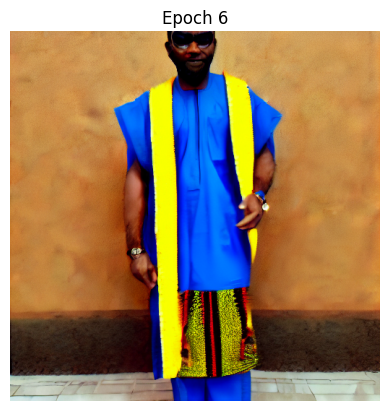

Epoch 7/10:   0%|          | 32/6404 [00:51<2:53:51,  1.64s/it]

accumulating gradients


Epoch 7/10:   1%|          | 64/6404 [01:42<2:52:19,  1.63s/it]

accumulating gradients


Epoch 7/10:   1%|▏         | 96/6404 [02:34<2:52:41,  1.64s/it]

accumulating gradients


Epoch 7/10:   2%|▏         | 128/6404 [03:25<2:49:41,  1.62s/it]

accumulating gradients


Epoch 7/10:   2%|▏         | 160/6404 [04:16<2:49:15,  1.63s/it]

accumulating gradients


Epoch 7/10:   3%|▎         | 192/6404 [05:08<2:48:32,  1.63s/it]

accumulating gradients


Epoch 7/10:   3%|▎         | 224/6404 [05:59<2:47:43,  1.63s/it]

accumulating gradients


Epoch 7/10:   4%|▍         | 256/6404 [06:50<2:46:08,  1.62s/it]

accumulating gradients


Epoch 7/10:   4%|▍         | 288/6404 [07:42<2:46:41,  1.64s/it]

accumulating gradients


Epoch 7/10:   5%|▍         | 320/6404 [08:33<2:45:10,  1.63s/it]

accumulating gradients


Epoch 7/10:   5%|▌         | 352/6404 [09:25<2:44:33,  1.63s/it]

accumulating gradients


Epoch 7/10:   6%|▌         | 384/6404 [10:16<2:43:27,  1.63s/it]

accumulating gradients


Epoch 7/10:   6%|▋         | 416/6404 [11:07<2:42:49,  1.63s/it]

accumulating gradients


Epoch 7/10:   7%|▋         | 448/6404 [11:59<2:41:12,  1.62s/it]

accumulating gradients


Epoch 7/10:   7%|▋         | 480/6404 [12:50<2:40:40,  1.63s/it]

accumulating gradients


Epoch 7/10:   8%|▊         | 512/6404 [13:42<2:39:40,  1.63s/it]

accumulating gradients


Epoch 7/10:   8%|▊         | 544/6404 [14:33<2:38:45,  1.63s/it]

accumulating gradients


Epoch 7/10:   9%|▉         | 576/6404 [15:24<2:37:34,  1.62s/it]

accumulating gradients


Epoch 7/10:   9%|▉         | 608/6404 [16:16<2:37:12,  1.63s/it]

accumulating gradients


Epoch 7/10:  10%|▉         | 640/6404 [17:07<2:36:21,  1.63s/it]

accumulating gradients


Epoch 7/10:  10%|█         | 672/6404 [17:58<2:35:10,  1.62s/it]

accumulating gradients


Epoch 7/10:  11%|█         | 704/6404 [18:50<2:34:15,  1.62s/it]

accumulating gradients


Epoch 7/10:  11%|█▏        | 736/6404 [19:41<2:33:20,  1.62s/it]

accumulating gradients


Epoch 7/10:  12%|█▏        | 768/6404 [20:32<2:32:49,  1.63s/it]

accumulating gradients


Epoch 7/10:  12%|█▏        | 800/6404 [21:24<2:30:52,  1.62s/it]

accumulating gradients


Epoch 7/10:  13%|█▎        | 832/6404 [22:15<2:31:30,  1.63s/it]

accumulating gradients


Epoch 7/10:  13%|█▎        | 864/6404 [23:07<2:29:49,  1.62s/it]

accumulating gradients


Epoch 7/10:  14%|█▍        | 896/6404 [23:58<2:28:51,  1.62s/it]

accumulating gradients


Epoch 7/10:  14%|█▍        | 928/6404 [24:49<2:28:33,  1.63s/it]

accumulating gradients


Epoch 7/10:  15%|█▍        | 960/6404 [25:40<2:27:03,  1.62s/it]

accumulating gradients


Epoch 7/10:  15%|█▌        | 992/6404 [26:32<2:27:29,  1.64s/it]

accumulating gradients


Epoch 7/10:  16%|█▌        | 1024/6404 [27:23<2:25:35,  1.62s/it]

accumulating gradients


Epoch 7/10:  16%|█▋        | 1056/6404 [28:15<2:24:58,  1.63s/it]

accumulating gradients


Epoch 7/10:  17%|█▋        | 1088/6404 [29:06<2:23:45,  1.62s/it]

accumulating gradients


Epoch 7/10:  17%|█▋        | 1120/6404 [29:57<2:23:34,  1.63s/it]

accumulating gradients


Epoch 7/10:  18%|█▊        | 1152/6404 [30:49<2:21:17,  1.61s/it]

accumulating gradients


Epoch 7/10:  18%|█▊        | 1184/6404 [31:40<2:20:58,  1.62s/it]

accumulating gradients


Epoch 7/10:  19%|█▉        | 1216/6404 [32:31<2:20:32,  1.63s/it]

accumulating gradients


Epoch 7/10:  19%|█▉        | 1248/6404 [33:23<2:20:00,  1.63s/it]

accumulating gradients


Epoch 7/10:  20%|█▉        | 1280/6404 [34:14<2:19:18,  1.63s/it]

accumulating gradients


Epoch 7/10:  20%|██        | 1312/6404 [35:05<2:17:44,  1.62s/it]

accumulating gradients


Epoch 7/10:  21%|██        | 1344/6404 [35:57<2:16:57,  1.62s/it]

accumulating gradients


Epoch 7/10:  21%|██▏       | 1376/6404 [36:48<2:16:45,  1.63s/it]

accumulating gradients


Epoch 7/10:  22%|██▏       | 1408/6404 [37:40<2:16:07,  1.63s/it]

accumulating gradients


Epoch 7/10:  22%|██▏       | 1440/6404 [38:31<2:14:26,  1.62s/it]

accumulating gradients


Epoch 7/10:  23%|██▎       | 1472/6404 [39:22<2:14:02,  1.63s/it]

accumulating gradients


Epoch 7/10:  23%|██▎       | 1504/6404 [40:14<2:12:52,  1.63s/it]

accumulating gradients


Epoch 7/10:  24%|██▍       | 1536/6404 [41:05<2:12:04,  1.63s/it]

accumulating gradients


Epoch 7/10:  24%|██▍       | 1568/6404 [41:56<2:10:42,  1.62s/it]

accumulating gradients


Epoch 7/10:  25%|██▍       | 1600/6404 [42:48<2:10:26,  1.63s/it]

accumulating gradients


Epoch 7/10:  25%|██▌       | 1632/6404 [43:39<2:09:31,  1.63s/it]

accumulating gradients


Epoch 7/10:  26%|██▌       | 1664/6404 [44:30<2:08:42,  1.63s/it]

accumulating gradients


Epoch 7/10:  26%|██▋       | 1696/6404 [45:22<2:07:52,  1.63s/it]

accumulating gradients


Epoch 7/10:  27%|██▋       | 1728/6404 [46:13<2:07:20,  1.63s/it]

accumulating gradients


Epoch 7/10:  27%|██▋       | 1760/6404 [47:05<2:06:15,  1.63s/it]

accumulating gradients


Epoch 7/10:  28%|██▊       | 1792/6404 [47:56<2:05:15,  1.63s/it]

accumulating gradients


Epoch 7/10:  28%|██▊       | 1824/6404 [48:47<2:03:58,  1.62s/it]

accumulating gradients


Epoch 7/10:  29%|██▉       | 1856/6404 [49:39<2:03:31,  1.63s/it]

accumulating gradients


Epoch 7/10:  29%|██▉       | 1888/6404 [50:30<2:02:15,  1.62s/it]

accumulating gradients


Epoch 7/10:  30%|██▉       | 1920/6404 [51:21<2:01:44,  1.63s/it]

accumulating gradients


Epoch 7/10:  30%|███       | 1952/6404 [52:13<2:00:49,  1.63s/it]

accumulating gradients


Epoch 7/10:  31%|███       | 1984/6404 [53:04<1:59:30,  1.62s/it]

accumulating gradients


Epoch 7/10:  31%|███▏      | 2016/6404 [53:55<1:58:34,  1.62s/it]

accumulating gradients


Epoch 7/10:  32%|███▏      | 2048/6404 [54:47<1:57:17,  1.62s/it]

accumulating gradients


Epoch 7/10:  32%|███▏      | 2080/6404 [55:38<1:57:02,  1.62s/it]

accumulating gradients


Epoch 7/10:  33%|███▎      | 2112/6404 [56:29<1:56:19,  1.63s/it]

accumulating gradients


Epoch 7/10:  33%|███▎      | 2144/6404 [57:21<1:55:31,  1.63s/it]

accumulating gradients


Epoch 7/10:  34%|███▍      | 2176/6404 [58:12<1:55:18,  1.64s/it]

accumulating gradients


Epoch 7/10:  34%|███▍      | 2208/6404 [59:04<1:54:56,  1.64s/it]

accumulating gradients


Epoch 7/10:  35%|███▍      | 2240/6404 [59:55<1:53:23,  1.63s/it]

accumulating gradients


Epoch 7/10:  35%|███▌      | 2272/6404 [1:00:47<1:51:58,  1.63s/it]

accumulating gradients


Epoch 7/10:  36%|███▌      | 2304/6404 [1:01:38<1:51:18,  1.63s/it]

accumulating gradients


Epoch 7/10:  36%|███▋      | 2336/6404 [1:02:29<1:49:49,  1.62s/it]

accumulating gradients


Epoch 7/10:  37%|███▋      | 2368/6404 [1:03:21<1:49:17,  1.62s/it]

accumulating gradients


Epoch 7/10:  37%|███▋      | 2400/6404 [1:04:12<1:48:29,  1.63s/it]

accumulating gradients


Epoch 7/10:  38%|███▊      | 2432/6404 [1:05:04<1:47:21,  1.62s/it]

accumulating gradients


Epoch 7/10:  38%|███▊      | 2464/6404 [1:05:55<1:47:17,  1.63s/it]

accumulating gradients


Epoch 7/10:  39%|███▉      | 2496/6404 [1:06:46<1:45:50,  1.63s/it]

accumulating gradients


Epoch 7/10:  39%|███▉      | 2528/6404 [1:07:38<1:44:47,  1.62s/it]

accumulating gradients


Epoch 7/10:  40%|███▉      | 2560/6404 [1:08:29<1:44:20,  1.63s/it]

accumulating gradients


Epoch 7/10:  40%|████      | 2592/6404 [1:09:20<1:43:13,  1.62s/it]

accumulating gradients


Epoch 7/10:  41%|████      | 2624/6404 [1:10:12<1:42:04,  1.62s/it]

accumulating gradients


Epoch 7/10:  41%|████▏     | 2656/6404 [1:11:03<1:41:16,  1.62s/it]

accumulating gradients


Epoch 7/10:  42%|████▏     | 2688/6404 [1:11:54<1:40:55,  1.63s/it]

accumulating gradients


Epoch 7/10:  42%|████▏     | 2720/6404 [1:12:46<1:39:46,  1.63s/it]

accumulating gradients


Epoch 7/10:  43%|████▎     | 2752/6404 [1:13:37<1:38:55,  1.63s/it]

accumulating gradients


Epoch 7/10:  43%|████▎     | 2784/6404 [1:14:28<1:38:05,  1.63s/it]

accumulating gradients


Epoch 7/10:  44%|████▍     | 2816/6404 [1:15:20<1:37:11,  1.63s/it]

accumulating gradients


Epoch 7/10:  44%|████▍     | 2848/6404 [1:16:11<1:35:50,  1.62s/it]

accumulating gradients


Epoch 7/10:  45%|████▍     | 2880/6404 [1:17:02<1:35:37,  1.63s/it]

accumulating gradients


Epoch 7/10:  45%|████▌     | 2912/6404 [1:17:54<1:35:08,  1.63s/it]

accumulating gradients


Epoch 7/10:  46%|████▌     | 2944/6404 [1:18:45<1:33:54,  1.63s/it]

accumulating gradients


Epoch 7/10:  46%|████▋     | 2976/6404 [1:19:37<1:32:55,  1.63s/it]

accumulating gradients


Epoch 7/10:  47%|████▋     | 3008/6404 [1:20:28<1:32:16,  1.63s/it]

accumulating gradients


Epoch 7/10:  47%|████▋     | 3040/6404 [1:21:19<1:31:14,  1.63s/it]

accumulating gradients


Epoch 7/10:  48%|████▊     | 3072/6404 [1:22:11<1:30:13,  1.62s/it]

accumulating gradients


Epoch 7/10:  48%|████▊     | 3104/6404 [1:23:02<1:29:52,  1.63s/it]

accumulating gradients


Epoch 7/10:  49%|████▉     | 3136/6404 [1:23:54<1:29:03,  1.63s/it]

accumulating gradients


Epoch 7/10:  49%|████▉     | 3168/6404 [1:24:45<1:27:34,  1.62s/it]

accumulating gradients


Epoch 7/10:  50%|████▉     | 3200/6404 [1:25:37<1:27:11,  1.63s/it]

accumulating gradients


Epoch 7/10:  50%|█████     | 3232/6404 [1:26:28<1:25:57,  1.63s/it]

accumulating gradients


Epoch 7/10:  51%|█████     | 3264/6404 [1:27:19<1:25:29,  1.63s/it]

accumulating gradients


Epoch 7/10:  51%|█████▏    | 3296/6404 [1:28:11<1:24:41,  1.64s/it]

accumulating gradients


Epoch 7/10:  52%|█████▏    | 3328/6404 [1:29:02<1:23:21,  1.63s/it]

accumulating gradients


Epoch 7/10:  52%|█████▏    | 3360/6404 [1:29:53<1:22:24,  1.62s/it]

accumulating gradients


Epoch 7/10:  53%|█████▎    | 3392/6404 [1:30:44<1:21:29,  1.62s/it]

accumulating gradients


Epoch 7/10:  53%|█████▎    | 3424/6404 [1:31:36<1:20:56,  1.63s/it]

accumulating gradients


Epoch 7/10:  54%|█████▍    | 3456/6404 [1:32:27<1:19:50,  1.62s/it]

accumulating gradients


Epoch 7/10:  54%|█████▍    | 3488/6404 [1:33:19<1:19:00,  1.63s/it]

accumulating gradients


Epoch 7/10:  55%|█████▍    | 3520/6404 [1:34:10<1:18:16,  1.63s/it]

accumulating gradients


Epoch 7/10:  55%|█████▌    | 3552/6404 [1:35:01<1:17:11,  1.62s/it]

accumulating gradients


Epoch 7/10:  56%|█████▌    | 3584/6404 [1:35:53<1:16:24,  1.63s/it]

accumulating gradients


Epoch 7/10:  56%|█████▋    | 3616/6404 [1:36:44<1:15:24,  1.62s/it]

accumulating gradients


Epoch 7/10:  57%|█████▋    | 3648/6404 [1:37:35<1:14:56,  1.63s/it]

accumulating gradients


Epoch 7/10:  57%|█████▋    | 3680/6404 [1:38:27<1:13:46,  1.63s/it]

accumulating gradients


Epoch 7/10:  58%|█████▊    | 3712/6404 [1:39:18<1:13:04,  1.63s/it]

accumulating gradients


Epoch 7/10:  58%|█████▊    | 3744/6404 [1:40:10<1:12:12,  1.63s/it]

accumulating gradients


Epoch 7/10:  59%|█████▉    | 3776/6404 [1:41:01<1:11:08,  1.62s/it]

accumulating gradients


Epoch 7/10:  59%|█████▉    | 3808/6404 [1:41:52<1:10:14,  1.62s/it]

accumulating gradients


Epoch 7/10:  60%|█████▉    | 3840/6404 [1:42:44<1:09:32,  1.63s/it]

accumulating gradients


Epoch 7/10:  60%|██████    | 3872/6404 [1:43:35<1:08:38,  1.63s/it]

accumulating gradients


Epoch 7/10:  61%|██████    | 3904/6404 [1:44:26<1:07:38,  1.62s/it]

accumulating gradients


Epoch 7/10:  61%|██████▏   | 3936/6404 [1:45:18<1:06:51,  1.63s/it]

accumulating gradients


Epoch 7/10:  62%|██████▏   | 3968/6404 [1:46:09<1:05:49,  1.62s/it]

accumulating gradients


Epoch 7/10:  62%|██████▏   | 4000/6404 [1:47:00<1:05:16,  1.63s/it]

accumulating gradients


Epoch 7/10:  63%|██████▎   | 4032/6404 [1:47:52<1:04:21,  1.63s/it]

accumulating gradients


Epoch 7/10:  63%|██████▎   | 4064/6404 [1:48:43<1:03:32,  1.63s/it]

accumulating gradients


Epoch 7/10:  64%|██████▍   | 4096/6404 [1:49:35<1:02:30,  1.63s/it]

accumulating gradients


Epoch 7/10:  64%|██████▍   | 4128/6404 [1:50:26<1:01:41,  1.63s/it]

accumulating gradients


Epoch 7/10:  65%|██████▍   | 4160/6404 [1:51:17<1:00:51,  1.63s/it]

accumulating gradients


Epoch 7/10:  65%|██████▌   | 4192/6404 [1:52:09<1:00:14,  1.63s/it]

accumulating gradients


Epoch 7/10:  66%|██████▌   | 4224/6404 [1:53:00<58:46,  1.62s/it]

accumulating gradients


Epoch 7/10:  66%|██████▋   | 4256/6404 [1:53:51<58:16,  1.63s/it]

accumulating gradients


Epoch 7/10:  67%|██████▋   | 4288/6404 [1:54:43<57:21,  1.63s/it]

accumulating gradients


Epoch 7/10:  67%|██████▋   | 4320/6404 [1:55:34<56:33,  1.63s/it]

accumulating gradients


Epoch 7/10:  68%|██████▊   | 4352/6404 [1:56:26<55:33,  1.62s/it]

accumulating gradients


Epoch 7/10:  68%|██████▊   | 4384/6404 [1:57:17<54:40,  1.62s/it]

accumulating gradients


Epoch 7/10:  69%|██████▉   | 4416/6404 [1:58:08<53:39,  1.62s/it]

accumulating gradients


Epoch 7/10:  69%|██████▉   | 4448/6404 [1:58:59<53:14,  1.63s/it]

accumulating gradients


Epoch 7/10:  70%|██████▉   | 4480/6404 [1:59:51<52:18,  1.63s/it]

accumulating gradients


Epoch 7/10:  70%|███████   | 4512/6404 [2:00:42<51:03,  1.62s/it]

accumulating gradients


Epoch 7/10:  71%|███████   | 4544/6404 [2:01:34<50:29,  1.63s/it]

accumulating gradients


Epoch 7/10:  71%|███████▏  | 4576/6404 [2:02:25<49:41,  1.63s/it]

accumulating gradients


Epoch 7/10:  72%|███████▏  | 4608/6404 [2:03:16<48:46,  1.63s/it]

accumulating gradients


Epoch 7/10:  72%|███████▏  | 4640/6404 [2:04:08<47:47,  1.63s/it]

accumulating gradients


Epoch 7/10:  73%|███████▎  | 4672/6404 [2:04:59<47:01,  1.63s/it]

accumulating gradients


Epoch 7/10:  73%|███████▎  | 4704/6404 [2:05:50<46:04,  1.63s/it]

accumulating gradients


Epoch 7/10:  74%|███████▍  | 4736/6404 [2:06:42<45:07,  1.62s/it]

accumulating gradients


Epoch 7/10:  74%|███████▍  | 4768/6404 [2:07:33<44:18,  1.63s/it]

accumulating gradients


Epoch 7/10:  75%|███████▍  | 4800/6404 [2:08:24<43:25,  1.62s/it]

accumulating gradients


Epoch 7/10:  75%|███████▌  | 4832/6404 [2:09:16<42:39,  1.63s/it]

accumulating gradients


Epoch 7/10:  76%|███████▌  | 4864/6404 [2:10:07<41:51,  1.63s/it]

accumulating gradients


Epoch 7/10:  76%|███████▋  | 4896/6404 [2:10:58<40:51,  1.63s/it]

accumulating gradients


Epoch 7/10:  77%|███████▋  | 4928/6404 [2:11:50<40:05,  1.63s/it]

accumulating gradients


Epoch 7/10:  77%|███████▋  | 4960/6404 [2:12:41<39:11,  1.63s/it]

accumulating gradients


Epoch 7/10:  78%|███████▊  | 4992/6404 [2:13:32<38:13,  1.62s/it]

accumulating gradients


Epoch 7/10:  78%|███████▊  | 5024/6404 [2:14:24<37:30,  1.63s/it]

accumulating gradients


Epoch 7/10:  79%|███████▉  | 5056/6404 [2:15:15<36:36,  1.63s/it]

accumulating gradients


Epoch 7/10:  79%|███████▉  | 5088/6404 [2:16:06<35:46,  1.63s/it]

accumulating gradients


Epoch 7/10:  80%|███████▉  | 5120/6404 [2:16:58<34:58,  1.63s/it]

accumulating gradients


Epoch 7/10:  80%|████████  | 5152/6404 [2:17:49<33:58,  1.63s/it]

accumulating gradients


Epoch 7/10:  81%|████████  | 5184/6404 [2:18:41<32:55,  1.62s/it]

accumulating gradients


Epoch 7/10:  81%|████████▏ | 5216/6404 [2:19:32<32:07,  1.62s/it]

accumulating gradients


Epoch 7/10:  82%|████████▏ | 5248/6404 [2:20:23<31:20,  1.63s/it]

accumulating gradients


Epoch 7/10:  82%|████████▏ | 5280/6404 [2:21:15<30:25,  1.62s/it]

accumulating gradients


Epoch 7/10:  83%|████████▎ | 5312/6404 [2:22:06<29:35,  1.63s/it]

accumulating gradients


Epoch 7/10:  83%|████████▎ | 5344/6404 [2:22:57<28:43,  1.63s/it]

accumulating gradients


Epoch 7/10:  84%|████████▍ | 5376/6404 [2:23:48<27:42,  1.62s/it]

accumulating gradients


Epoch 7/10:  84%|████████▍ | 5408/6404 [2:24:40<27:00,  1.63s/it]

accumulating gradients


Epoch 7/10:  85%|████████▍ | 5440/6404 [2:25:31<26:10,  1.63s/it]

accumulating gradients


Epoch 7/10:  85%|████████▌ | 5472/6404 [2:26:22<25:13,  1.62s/it]

accumulating gradients


Epoch 7/10:  86%|████████▌ | 5504/6404 [2:27:14<24:14,  1.62s/it]

accumulating gradients


Epoch 7/10:  86%|████████▋ | 5536/6404 [2:28:05<23:32,  1.63s/it]

accumulating gradients


Epoch 7/10:  87%|████████▋ | 5568/6404 [2:28:56<22:38,  1.62s/it]

accumulating gradients


Epoch 7/10:  87%|████████▋ | 5600/6404 [2:29:47<21:43,  1.62s/it]

accumulating gradients


Epoch 7/10:  88%|████████▊ | 5632/6404 [2:30:39<20:53,  1.62s/it]

accumulating gradients


Epoch 7/10:  88%|████████▊ | 5664/6404 [2:31:30<19:58,  1.62s/it]

accumulating gradients


Epoch 7/10:  89%|████████▉ | 5696/6404 [2:32:21<19:11,  1.63s/it]

accumulating gradients


Epoch 7/10:  89%|████████▉ | 5728/6404 [2:33:13<18:25,  1.64s/it]

accumulating gradients


Epoch 7/10:  90%|████████▉ | 5760/6404 [2:34:04<17:25,  1.62s/it]

accumulating gradients


Epoch 7/10:  90%|█████████ | 5792/6404 [2:34:55<16:37,  1.63s/it]

accumulating gradients


Epoch 7/10:  91%|█████████ | 5824/6404 [2:35:47<15:42,  1.63s/it]

accumulating gradients


Epoch 7/10:  91%|█████████▏| 5856/6404 [2:36:38<14:53,  1.63s/it]

accumulating gradients


Epoch 7/10:  92%|█████████▏| 5888/6404 [2:37:30<14:01,  1.63s/it]

accumulating gradients


Epoch 7/10:  92%|█████████▏| 5920/6404 [2:38:21<13:08,  1.63s/it]

accumulating gradients


Epoch 7/10:  93%|█████████▎| 5952/6404 [2:39:12<12:14,  1.63s/it]

accumulating gradients


Epoch 7/10:  93%|█████████▎| 5984/6404 [2:40:04<11:22,  1.62s/it]

accumulating gradients


Epoch 7/10:  94%|█████████▍| 6016/6404 [2:40:55<10:32,  1.63s/it]

accumulating gradients


Epoch 7/10:  94%|█████████▍| 6048/6404 [2:41:46<09:38,  1.62s/it]

accumulating gradients


Epoch 7/10:  95%|█████████▍| 6080/6404 [2:42:38<08:45,  1.62s/it]

accumulating gradients


Epoch 7/10:  95%|█████████▌| 6112/6404 [2:43:29<07:53,  1.62s/it]

accumulating gradients


Epoch 7/10:  96%|█████████▌| 6144/6404 [2:44:20<07:02,  1.62s/it]

accumulating gradients


Epoch 7/10:  96%|█████████▋| 6176/6404 [2:45:12<06:11,  1.63s/it]

accumulating gradients


Epoch 7/10:  97%|█████████▋| 6208/6404 [2:46:03<05:18,  1.62s/it]

accumulating gradients


Epoch 7/10:  97%|█████████▋| 6240/6404 [2:46:55<04:26,  1.63s/it]

accumulating gradients


Epoch 7/10:  98%|█████████▊| 6272/6404 [2:47:46<03:33,  1.62s/it]

accumulating gradients


Epoch 7/10:  98%|█████████▊| 6304/6404 [2:48:37<02:43,  1.63s/it]

accumulating gradients


Epoch 7/10:  99%|█████████▉| 6336/6404 [2:49:29<01:50,  1.62s/it]

accumulating gradients


Epoch 7/10:  99%|█████████▉| 6368/6404 [2:50:20<00:58,  1.63s/it]

accumulating gradients


Epoch 7/10: 100%|█████████▉| 6400/6404 [2:51:11<00:06,  1.63s/it]

accumulating gradients


Epoch 7/10: 100%|██████████| 6404/6404 [2:51:18<00:00,  1.60s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:24:04<00:00,  3.15s/it]


Epoch 7/10, Train Loss: 0.0106, Validation Loss: 0.0102
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

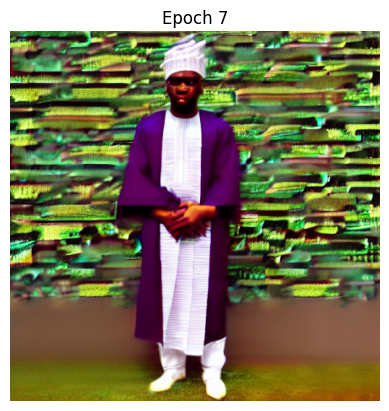

Epoch 8/10:   0%|          | 32/6404 [00:51<2:51:54,  1.62s/it]

accumulating gradients


Epoch 8/10:   1%|          | 64/6404 [01:42<2:51:34,  1.62s/it]

accumulating gradients


Epoch 8/10:   1%|▏         | 96/6404 [02:33<2:51:11,  1.63s/it]

accumulating gradients


Epoch 8/10:   2%|▏         | 128/6404 [03:25<2:49:32,  1.62s/it]

accumulating gradients


Epoch 8/10:   2%|▏         | 160/6404 [04:16<2:49:51,  1.63s/it]

accumulating gradients


Epoch 8/10:   3%|▎         | 192/6404 [05:09<2:49:36,  1.64s/it]

accumulating gradients


Epoch 8/10:   3%|▎         | 224/6404 [06:00<2:47:38,  1.63s/it]

accumulating gradients


Epoch 8/10:   4%|▍         | 256/6404 [06:51<2:45:49,  1.62s/it]

accumulating gradients


Epoch 8/10:   4%|▍         | 288/6404 [07:43<2:45:06,  1.62s/it]

accumulating gradients


Epoch 8/10:   5%|▍         | 320/6404 [08:34<2:45:33,  1.63s/it]

accumulating gradients


Epoch 8/10:   5%|▌         | 352/6404 [09:25<2:43:57,  1.63s/it]

accumulating gradients


Epoch 8/10:   6%|▌         | 384/6404 [10:17<2:43:01,  1.62s/it]

accumulating gradients


Epoch 8/10:   6%|▋         | 416/6404 [11:08<2:42:01,  1.62s/it]

accumulating gradients


Epoch 8/10:   7%|▋         | 448/6404 [11:59<2:41:09,  1.62s/it]

accumulating gradients


Epoch 8/10:   7%|▋         | 480/6404 [12:51<2:40:36,  1.63s/it]

accumulating gradients


Epoch 8/10:   8%|▊         | 512/6404 [13:42<2:39:51,  1.63s/it]

accumulating gradients


Epoch 8/10:   8%|▊         | 544/6404 [14:34<2:38:48,  1.63s/it]

accumulating gradients


Epoch 8/10:   9%|▉         | 576/6404 [15:25<2:38:00,  1.63s/it]

accumulating gradients


Epoch 8/10:   9%|▉         | 608/6404 [16:16<2:37:13,  1.63s/it]

accumulating gradients


Epoch 8/10:  10%|▉         | 640/6404 [17:08<2:36:24,  1.63s/it]

accumulating gradients


Epoch 8/10:  10%|█         | 672/6404 [17:59<2:35:14,  1.62s/it]

accumulating gradients


Epoch 8/10:  11%|█         | 704/6404 [18:50<2:34:48,  1.63s/it]

accumulating gradients


Epoch 8/10:  11%|█▏        | 736/6404 [19:42<2:34:42,  1.64s/it]

accumulating gradients


Epoch 8/10:  12%|█▏        | 768/6404 [20:33<2:32:53,  1.63s/it]

accumulating gradients


Epoch 8/10:  12%|█▏        | 800/6404 [21:24<2:32:03,  1.63s/it]

accumulating gradients


Epoch 8/10:  13%|█▎        | 832/6404 [22:16<2:30:41,  1.62s/it]

accumulating gradients


Epoch 8/10:  13%|█▎        | 864/6404 [23:07<2:30:23,  1.63s/it]

accumulating gradients


Epoch 8/10:  14%|█▍        | 896/6404 [23:58<2:29:18,  1.63s/it]

accumulating gradients


Epoch 8/10:  14%|█▍        | 928/6404 [24:50<2:27:52,  1.62s/it]

accumulating gradients


Epoch 8/10:  15%|█▍        | 960/6404 [25:41<2:28:03,  1.63s/it]

accumulating gradients


Epoch 8/10:  15%|█▌        | 992/6404 [26:32<2:26:42,  1.63s/it]

accumulating gradients


Epoch 8/10:  16%|█▌        | 1024/6404 [27:24<2:26:01,  1.63s/it]

accumulating gradients


Epoch 8/10:  16%|█▋        | 1056/6404 [28:15<2:25:01,  1.63s/it]

accumulating gradients


Epoch 8/10:  17%|█▋        | 1088/6404 [29:07<2:24:11,  1.63s/it]

accumulating gradients


Epoch 8/10:  17%|█▋        | 1120/6404 [29:58<2:22:53,  1.62s/it]

accumulating gradients


Epoch 8/10:  18%|█▊        | 1152/6404 [30:49<2:22:47,  1.63s/it]

accumulating gradients


Epoch 8/10:  18%|█▊        | 1184/6404 [31:41<2:21:59,  1.63s/it]

accumulating gradients


Epoch 8/10:  19%|█▉        | 1216/6404 [32:32<2:20:52,  1.63s/it]

accumulating gradients


Epoch 8/10:  19%|█▉        | 1248/6404 [33:24<2:19:47,  1.63s/it]

accumulating gradients


Epoch 8/10:  20%|█▉        | 1280/6404 [34:15<2:19:15,  1.63s/it]

accumulating gradients


Epoch 8/10:  20%|██        | 1312/6404 [35:07<2:18:39,  1.63s/it]

accumulating gradients


Epoch 8/10:  21%|██        | 1344/6404 [35:59<2:17:18,  1.63s/it]

accumulating gradients


Epoch 8/10:  21%|██▏       | 1376/6404 [36:50<2:16:54,  1.63s/it]

accumulating gradients


Epoch 8/10:  22%|██▏       | 1408/6404 [37:41<2:15:44,  1.63s/it]

accumulating gradients


Epoch 8/10:  22%|██▏       | 1440/6404 [38:33<2:14:49,  1.63s/it]

accumulating gradients


Epoch 8/10:  23%|██▎       | 1472/6404 [39:24<2:13:19,  1.62s/it]

accumulating gradients


Epoch 8/10:  23%|██▎       | 1504/6404 [40:15<2:13:05,  1.63s/it]

accumulating gradients


Epoch 8/10:  24%|██▍       | 1536/6404 [41:07<2:11:39,  1.62s/it]

accumulating gradients


Epoch 8/10:  24%|██▍       | 1568/6404 [41:58<2:11:19,  1.63s/it]

accumulating gradients


Epoch 8/10:  25%|██▍       | 1600/6404 [42:50<2:10:14,  1.63s/it]

accumulating gradients


Epoch 8/10:  25%|██▌       | 1632/6404 [43:41<2:09:33,  1.63s/it]

accumulating gradients


Epoch 8/10:  26%|██▌       | 1664/6404 [44:32<2:08:35,  1.63s/it]

accumulating gradients


Epoch 8/10:  26%|██▋       | 1696/6404 [45:24<2:07:51,  1.63s/it]

accumulating gradients


Epoch 8/10:  27%|██▋       | 1728/6404 [46:15<2:06:32,  1.62s/it]

accumulating gradients


Epoch 8/10:  27%|██▋       | 1760/6404 [47:07<2:05:39,  1.62s/it]

accumulating gradients


Epoch 8/10:  28%|██▊       | 1792/6404 [47:58<2:05:38,  1.63s/it]

accumulating gradients


Epoch 8/10:  28%|██▊       | 1824/6404 [48:49<2:03:48,  1.62s/it]

accumulating gradients


Epoch 8/10:  29%|██▉       | 1856/6404 [49:41<2:03:54,  1.63s/it]

accumulating gradients


Epoch 8/10:  29%|██▉       | 1888/6404 [50:32<2:02:07,  1.62s/it]

accumulating gradients


Epoch 8/10:  30%|██▉       | 1920/6404 [51:23<2:01:26,  1.62s/it]

accumulating gradients


Epoch 8/10:  30%|███       | 1952/6404 [52:15<2:00:39,  1.63s/it]

accumulating gradients


Epoch 8/10:  31%|███       | 1984/6404 [53:06<2:00:01,  1.63s/it]

accumulating gradients


Epoch 8/10:  31%|███▏      | 2016/6404 [53:57<1:59:04,  1.63s/it]

accumulating gradients


Epoch 8/10:  32%|███▏      | 2048/6404 [54:49<1:57:41,  1.62s/it]

accumulating gradients


Epoch 8/10:  32%|███▏      | 2080/6404 [55:40<1:57:27,  1.63s/it]

accumulating gradients


Epoch 8/10:  33%|███▎      | 2112/6404 [56:31<1:56:49,  1.63s/it]

accumulating gradients


Epoch 8/10:  33%|███▎      | 2144/6404 [57:23<1:55:52,  1.63s/it]

accumulating gradients


Epoch 8/10:  34%|███▍      | 2176/6404 [58:14<1:54:19,  1.62s/it]

accumulating gradients


Epoch 8/10:  34%|███▍      | 2208/6404 [59:06<1:53:24,  1.62s/it]

accumulating gradients


Epoch 8/10:  35%|███▍      | 2240/6404 [59:57<1:53:30,  1.64s/it]

accumulating gradients


Epoch 8/10:  35%|███▌      | 2272/6404 [1:00:48<1:51:39,  1.62s/it]

accumulating gradients


Epoch 8/10:  36%|███▌      | 2304/6404 [1:01:40<1:51:14,  1.63s/it]

accumulating gradients


Epoch 8/10:  36%|███▋      | 2336/6404 [1:02:31<1:50:29,  1.63s/it]

accumulating gradients


Epoch 8/10:  37%|███▋      | 2368/6404 [1:03:22<1:49:32,  1.63s/it]

accumulating gradients


Epoch 8/10:  37%|███▋      | 2400/6404 [1:04:14<1:48:11,  1.62s/it]

accumulating gradients


Epoch 8/10:  38%|███▊      | 2432/6404 [1:05:05<1:47:50,  1.63s/it]

accumulating gradients


Epoch 8/10:  38%|███▊      | 2464/6404 [1:05:56<1:46:36,  1.62s/it]

accumulating gradients


Epoch 8/10:  39%|███▉      | 2496/6404 [1:06:48<1:46:04,  1.63s/it]

accumulating gradients


Epoch 8/10:  39%|███▉      | 2528/6404 [1:07:39<1:45:10,  1.63s/it]

accumulating gradients


Epoch 8/10:  40%|███▉      | 2560/6404 [1:08:30<1:44:18,  1.63s/it]

accumulating gradients


Epoch 8/10:  40%|████      | 2592/6404 [1:09:22<1:43:02,  1.62s/it]

accumulating gradients


Epoch 8/10:  41%|████      | 2624/6404 [1:10:13<1:42:19,  1.62s/it]

accumulating gradients


Epoch 8/10:  41%|████▏     | 2656/6404 [1:11:04<1:41:12,  1.62s/it]

accumulating gradients


Epoch 8/10:  42%|████▏     | 2688/6404 [1:11:56<1:40:52,  1.63s/it]

accumulating gradients


Epoch 8/10:  42%|████▏     | 2720/6404 [1:12:47<1:40:16,  1.63s/it]

accumulating gradients


Epoch 8/10:  43%|████▎     | 2752/6404 [1:13:39<1:38:43,  1.62s/it]

accumulating gradients


Epoch 8/10:  43%|████▎     | 2784/6404 [1:14:30<1:37:54,  1.62s/it]

accumulating gradients


Epoch 8/10:  44%|████▍     | 2816/6404 [1:15:21<1:37:53,  1.64s/it]

accumulating gradients


Epoch 8/10:  44%|████▍     | 2848/6404 [1:16:13<1:36:03,  1.62s/it]

accumulating gradients


Epoch 8/10:  45%|████▍     | 2880/6404 [1:17:04<1:35:08,  1.62s/it]

accumulating gradients


Epoch 8/10:  45%|████▌     | 2912/6404 [1:17:55<1:34:15,  1.62s/it]

accumulating gradients


Epoch 8/10:  46%|████▌     | 2944/6404 [1:18:47<1:34:02,  1.63s/it]

accumulating gradients


Epoch 8/10:  46%|████▋     | 2976/6404 [1:19:38<1:32:58,  1.63s/it]

accumulating gradients


Epoch 8/10:  47%|████▋     | 3008/6404 [1:20:29<1:32:08,  1.63s/it]

accumulating gradients


Epoch 8/10:  47%|████▋     | 3040/6404 [1:21:21<1:31:09,  1.63s/it]

accumulating gradients


Epoch 8/10:  48%|████▊     | 3072/6404 [1:22:12<1:29:57,  1.62s/it]

accumulating gradients


Epoch 8/10:  48%|████▊     | 3104/6404 [1:23:03<1:29:36,  1.63s/it]

accumulating gradients


Epoch 8/10:  49%|████▉     | 3136/6404 [1:23:55<1:28:28,  1.62s/it]

accumulating gradients


Epoch 8/10:  49%|████▉     | 3168/6404 [1:24:46<1:27:40,  1.63s/it]

accumulating gradients


Epoch 8/10:  50%|████▉     | 3200/6404 [1:25:38<1:26:46,  1.63s/it]

accumulating gradients


Epoch 8/10:  50%|█████     | 3232/6404 [1:26:29<1:25:29,  1.62s/it]

accumulating gradients


Epoch 8/10:  51%|█████     | 3264/6404 [1:27:20<1:24:43,  1.62s/it]

accumulating gradients


Epoch 8/10:  51%|█████▏    | 3296/6404 [1:28:12<1:24:22,  1.63s/it]

accumulating gradients


Epoch 8/10:  52%|█████▏    | 3328/6404 [1:29:03<1:23:23,  1.63s/it]

accumulating gradients


Epoch 8/10:  52%|█████▏    | 3360/6404 [1:29:54<1:22:52,  1.63s/it]

accumulating gradients


Epoch 8/10:  53%|█████▎    | 3392/6404 [1:30:46<1:21:26,  1.62s/it]

accumulating gradients


Epoch 8/10:  53%|█████▎    | 3424/6404 [1:31:37<1:20:27,  1.62s/it]

accumulating gradients


Epoch 8/10:  54%|█████▍    | 3456/6404 [1:32:28<1:19:59,  1.63s/it]

accumulating gradients


Epoch 8/10:  54%|█████▍    | 3488/6404 [1:33:20<1:18:47,  1.62s/it]

accumulating gradients


Epoch 8/10:  55%|█████▍    | 3520/6404 [1:34:11<1:18:25,  1.63s/it]

accumulating gradients


Epoch 8/10:  55%|█████▌    | 3552/6404 [1:35:03<1:17:35,  1.63s/it]

accumulating gradients


Epoch 8/10:  56%|█████▌    | 3584/6404 [1:35:54<1:16:23,  1.63s/it]

accumulating gradients


Epoch 8/10:  56%|█████▋    | 3616/6404 [1:36:45<1:15:26,  1.62s/it]

accumulating gradients


Epoch 8/10:  57%|█████▋    | 3648/6404 [1:37:36<1:14:47,  1.63s/it]

accumulating gradients


Epoch 8/10:  57%|█████▋    | 3680/6404 [1:38:28<1:13:55,  1.63s/it]

accumulating gradients


Epoch 8/10:  58%|█████▊    | 3712/6404 [1:39:19<1:13:08,  1.63s/it]

accumulating gradients


Epoch 8/10:  58%|█████▊    | 3744/6404 [1:40:11<1:11:55,  1.62s/it]

accumulating gradients


Epoch 8/10:  59%|█████▉    | 3776/6404 [1:41:03<1:11:35,  1.63s/it]

accumulating gradients


Epoch 8/10:  59%|█████▉    | 3808/6404 [1:41:54<1:10:18,  1.63s/it]

accumulating gradients


Epoch 8/10:  60%|█████▉    | 3840/6404 [1:42:46<1:09:59,  1.64s/it]

accumulating gradients


Epoch 8/10:  60%|██████    | 3872/6404 [1:43:37<1:08:52,  1.63s/it]

accumulating gradients


Epoch 8/10:  61%|██████    | 3904/6404 [1:44:28<1:07:54,  1.63s/it]

accumulating gradients


Epoch 8/10:  61%|██████▏   | 3936/6404 [1:45:20<1:07:13,  1.63s/it]

accumulating gradients


Epoch 8/10:  62%|██████▏   | 3968/6404 [1:46:11<1:06:23,  1.64s/it]

accumulating gradients


Epoch 8/10:  62%|██████▏   | 4000/6404 [1:47:03<1:04:58,  1.62s/it]

accumulating gradients


Epoch 8/10:  63%|██████▎   | 4032/6404 [1:47:54<1:04:26,  1.63s/it]

accumulating gradients


Epoch 8/10:  63%|██████▎   | 4064/6404 [1:48:46<1:03:26,  1.63s/it]

accumulating gradients


Epoch 8/10:  64%|██████▍   | 4096/6404 [1:49:37<1:02:45,  1.63s/it]

accumulating gradients


Epoch 8/10:  64%|██████▍   | 4128/6404 [1:50:28<1:01:36,  1.62s/it]

accumulating gradients


Epoch 8/10:  65%|██████▍   | 4160/6404 [1:51:20<1:00:59,  1.63s/it]

accumulating gradients


Epoch 8/10:  65%|██████▌   | 4192/6404 [1:52:11<59:43,  1.62s/it]

accumulating gradients


Epoch 8/10:  66%|██████▌   | 4224/6404 [1:53:03<59:18,  1.63s/it]

accumulating gradients


Epoch 8/10:  66%|██████▋   | 4256/6404 [1:53:54<58:23,  1.63s/it]

accumulating gradients


Epoch 8/10:  67%|██████▋   | 4288/6404 [1:54:45<57:28,  1.63s/it]

accumulating gradients


Epoch 8/10:  67%|██████▋   | 4320/6404 [1:55:37<56:39,  1.63s/it]

accumulating gradients


Epoch 8/10:  68%|██████▊   | 4352/6404 [1:56:28<55:37,  1.63s/it]

accumulating gradients


Epoch 8/10:  68%|██████▊   | 4384/6404 [1:57:20<54:38,  1.62s/it]

accumulating gradients


Epoch 8/10:  69%|██████▉   | 4416/6404 [1:58:11<53:53,  1.63s/it]

accumulating gradients


Epoch 8/10:  69%|██████▉   | 4448/6404 [1:59:02<52:50,  1.62s/it]

accumulating gradients


Epoch 8/10:  70%|██████▉   | 4480/6404 [1:59:53<52:09,  1.63s/it]

accumulating gradients


Epoch 8/10:  70%|███████   | 4512/6404 [2:00:45<51:12,  1.62s/it]

accumulating gradients


Epoch 8/10:  71%|███████   | 4544/6404 [2:01:36<50:15,  1.62s/it]

accumulating gradients


Epoch 8/10:  71%|███████▏  | 4576/6404 [2:02:27<49:38,  1.63s/it]

accumulating gradients


Epoch 8/10:  72%|███████▏  | 4608/6404 [2:03:19<48:47,  1.63s/it]

accumulating gradients


Epoch 8/10:  72%|███████▏  | 4640/6404 [2:04:10<47:51,  1.63s/it]

accumulating gradients


Epoch 8/10:  73%|███████▎  | 4672/6404 [2:05:02<46:52,  1.62s/it]

accumulating gradients


Epoch 8/10:  73%|███████▎  | 4704/6404 [2:05:54<46:08,  1.63s/it]

accumulating gradients


Epoch 8/10:  74%|███████▍  | 4736/6404 [2:06:45<45:16,  1.63s/it]

accumulating gradients


Epoch 8/10:  74%|███████▍  | 4768/6404 [2:07:36<44:10,  1.62s/it]

accumulating gradients


Epoch 8/10:  75%|███████▍  | 4800/6404 [2:08:28<43:21,  1.62s/it]

accumulating gradients


Epoch 8/10:  75%|███████▌  | 4832/6404 [2:09:19<42:47,  1.63s/it]

accumulating gradients


Epoch 8/10:  76%|███████▌  | 4864/6404 [2:10:11<41:46,  1.63s/it]

accumulating gradients


Epoch 8/10:  76%|███████▋  | 4896/6404 [2:11:02<41:00,  1.63s/it]

accumulating gradients


Epoch 8/10:  77%|███████▋  | 4928/6404 [2:11:53<39:53,  1.62s/it]

accumulating gradients


Epoch 8/10:  77%|███████▋  | 4960/6404 [2:12:45<39:17,  1.63s/it]

accumulating gradients


Epoch 8/10:  78%|███████▊  | 4992/6404 [2:13:36<38:14,  1.63s/it]

accumulating gradients


Epoch 8/10:  78%|███████▊  | 5024/6404 [2:14:27<37:31,  1.63s/it]

accumulating gradients


Epoch 8/10:  79%|███████▉  | 5056/6404 [2:15:19<36:27,  1.62s/it]

accumulating gradients


Epoch 8/10:  79%|███████▉  | 5088/6404 [2:16:10<35:33,  1.62s/it]

accumulating gradients


Epoch 8/10:  80%|███████▉  | 5120/6404 [2:17:01<34:53,  1.63s/it]

accumulating gradients


Epoch 8/10:  80%|████████  | 5152/6404 [2:17:53<33:50,  1.62s/it]

accumulating gradients


Epoch 8/10:  81%|████████  | 5184/6404 [2:18:45<34:05,  1.68s/it]

accumulating gradients


Epoch 8/10:  81%|████████▏ | 5216/6404 [2:19:36<32:20,  1.63s/it]

accumulating gradients


Epoch 8/10:  82%|████████▏ | 5248/6404 [2:20:27<31:21,  1.63s/it]

accumulating gradients


Epoch 8/10:  82%|████████▏ | 5280/6404 [2:21:19<30:30,  1.63s/it]

accumulating gradients


Epoch 8/10:  83%|████████▎ | 5312/6404 [2:22:10<29:35,  1.63s/it]

accumulating gradients


Epoch 8/10:  83%|████████▎ | 5344/6404 [2:23:01<28:45,  1.63s/it]

accumulating gradients


Epoch 8/10:  84%|████████▍ | 5376/6404 [2:23:53<27:49,  1.62s/it]

accumulating gradients


Epoch 8/10:  84%|████████▍ | 5408/6404 [2:24:44<26:57,  1.62s/it]

accumulating gradients


Epoch 8/10:  85%|████████▍ | 5440/6404 [2:25:35<26:06,  1.63s/it]

accumulating gradients


Epoch 8/10:  85%|████████▌ | 5472/6404 [2:26:27<25:12,  1.62s/it]

accumulating gradients


Epoch 8/10:  86%|████████▌ | 5504/6404 [2:27:18<24:24,  1.63s/it]

accumulating gradients


Epoch 8/10:  86%|████████▋ | 5536/6404 [2:28:10<23:32,  1.63s/it]

accumulating gradients


Epoch 8/10:  87%|████████▋ | 5568/6404 [2:29:01<22:41,  1.63s/it]

accumulating gradients


Epoch 8/10:  87%|████████▋ | 5600/6404 [2:29:52<21:47,  1.63s/it]

accumulating gradients


Epoch 8/10:  88%|████████▊ | 5632/6404 [2:30:45<20:51,  1.62s/it]

accumulating gradients


Epoch 8/10:  88%|████████▊ | 5664/6404 [2:31:36<19:59,  1.62s/it]

accumulating gradients


Epoch 8/10:  89%|████████▉ | 5696/6404 [2:32:27<19:13,  1.63s/it]

accumulating gradients


Epoch 8/10:  89%|████████▉ | 5728/6404 [2:33:19<18:22,  1.63s/it]

accumulating gradients


Epoch 8/10:  90%|████████▉ | 5760/6404 [2:34:10<17:26,  1.63s/it]

accumulating gradients


Epoch 8/10:  90%|█████████ | 5792/6404 [2:35:01<16:39,  1.63s/it]

accumulating gradients


Epoch 8/10:  91%|█████████ | 5824/6404 [2:35:52<15:37,  1.62s/it]

accumulating gradients


Epoch 8/10:  91%|█████████▏| 5856/6404 [2:36:44<14:49,  1.62s/it]

accumulating gradients


Epoch 8/10:  92%|█████████▏| 5888/6404 [2:37:35<14:00,  1.63s/it]

accumulating gradients


Epoch 8/10:  92%|█████████▏| 5920/6404 [2:38:27<13:09,  1.63s/it]

accumulating gradients


Epoch 8/10:  93%|█████████▎| 5952/6404 [2:39:18<12:15,  1.63s/it]

accumulating gradients


Epoch 8/10:  93%|█████████▎| 5984/6404 [2:40:09<11:22,  1.63s/it]

accumulating gradients


Epoch 8/10:  94%|█████████▍| 6016/6404 [2:41:00<10:31,  1.63s/it]

accumulating gradients


Epoch 8/10:  94%|█████████▍| 6048/6404 [2:41:52<09:38,  1.63s/it]

accumulating gradients


Epoch 8/10:  95%|█████████▍| 6080/6404 [2:42:43<08:47,  1.63s/it]

accumulating gradients


Epoch 8/10:  95%|█████████▌| 6112/6404 [2:43:35<07:54,  1.63s/it]

accumulating gradients


Epoch 8/10:  96%|█████████▌| 6144/6404 [2:44:26<07:02,  1.63s/it]

accumulating gradients


Epoch 8/10:  96%|█████████▋| 6176/6404 [2:45:17<06:11,  1.63s/it]

accumulating gradients


Epoch 8/10:  97%|█████████▋| 6208/6404 [2:46:09<05:18,  1.62s/it]

accumulating gradients


Epoch 8/10:  97%|█████████▋| 6240/6404 [2:47:00<04:26,  1.62s/it]

accumulating gradients


Epoch 8/10:  98%|█████████▊| 6272/6404 [2:47:51<03:35,  1.63s/it]

accumulating gradients


Epoch 8/10:  98%|█████████▊| 6304/6404 [2:48:43<02:43,  1.63s/it]

accumulating gradients


Epoch 8/10:  99%|█████████▉| 6336/6404 [2:49:34<01:50,  1.63s/it]

accumulating gradients


Epoch 8/10:  99%|█████████▉| 6368/6404 [2:50:26<00:58,  1.63s/it]

accumulating gradients


Epoch 8/10: 100%|█████████▉| 6400/6404 [2:51:17<00:06,  1.63s/it]

accumulating gradients


Epoch 8/10: 100%|██████████| 6404/6404 [2:51:23<00:00,  1.61s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:24:06<00:00,  3.15s/it]


Epoch 8/10, Train Loss: 0.0104, Validation Loss: 0.0107
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

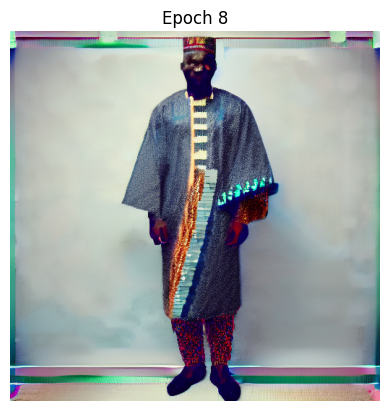

Epoch 9/10:   0%|          | 32/6404 [00:51<2:51:54,  1.62s/it]

accumulating gradients


Epoch 9/10:   1%|          | 64/6404 [01:42<2:52:02,  1.63s/it]

accumulating gradients


Epoch 9/10:   1%|▏         | 96/6404 [02:34<2:51:57,  1.64s/it]

accumulating gradients


Epoch 9/10:   2%|▏         | 128/6404 [03:25<2:50:37,  1.63s/it]

accumulating gradients


Epoch 9/10:   2%|▏         | 160/6404 [04:17<2:58:22,  1.71s/it]

accumulating gradients


Epoch 9/10:   3%|▎         | 192/6404 [05:08<2:49:37,  1.64s/it]

accumulating gradients


Epoch 9/10:   3%|▎         | 224/6404 [06:00<2:53:57,  1.69s/it]

accumulating gradients


Epoch 9/10:   4%|▍         | 256/6404 [06:53<2:46:20,  1.62s/it]

accumulating gradients


Epoch 9/10:   4%|▍         | 288/6404 [07:46<2:45:52,  1.63s/it]

accumulating gradients


Epoch 9/10:   5%|▍         | 320/6404 [08:38<2:44:34,  1.62s/it]

accumulating gradients


Epoch 9/10:   5%|▌         | 352/6404 [09:29<2:44:08,  1.63s/it]

accumulating gradients


Epoch 9/10:   6%|▌         | 384/6404 [10:21<3:06:02,  1.85s/it]

accumulating gradients


Epoch 9/10:   6%|▋         | 416/6404 [11:14<2:42:17,  1.63s/it]

accumulating gradients


Epoch 9/10:   7%|▋         | 448/6404 [12:06<2:43:45,  1.65s/it]

accumulating gradients


Epoch 9/10:   7%|▋         | 480/6404 [12:58<2:41:25,  1.63s/it]

accumulating gradients


Epoch 9/10:   8%|▊         | 512/6404 [13:49<2:39:26,  1.62s/it]

accumulating gradients


Epoch 9/10:   8%|▊         | 544/6404 [14:41<2:39:24,  1.63s/it]

accumulating gradients


Epoch 9/10:   9%|▉         | 576/6404 [15:32<2:37:51,  1.63s/it]

accumulating gradients


Epoch 9/10:   9%|▉         | 608/6404 [16:23<2:37:22,  1.63s/it]

accumulating gradients


Epoch 9/10:  10%|▉         | 640/6404 [17:15<2:47:42,  1.75s/it]

accumulating gradients


Epoch 9/10:  10%|█         | 672/6404 [18:07<2:35:51,  1.63s/it]

accumulating gradients


Epoch 9/10:  11%|█         | 704/6404 [18:59<2:34:47,  1.63s/it]

accumulating gradients


Epoch 9/10:  11%|█▏        | 736/6404 [19:51<2:33:33,  1.63s/it]

accumulating gradients


Epoch 9/10:  12%|█▏        | 768/6404 [20:43<2:32:57,  1.63s/it]

accumulating gradients


Epoch 9/10:  12%|█▏        | 800/6404 [21:35<2:31:24,  1.62s/it]

accumulating gradients


Epoch 9/10:  13%|█▎        | 832/6404 [22:27<2:49:10,  1.82s/it]

accumulating gradients


Epoch 9/10:  13%|█▎        | 864/6404 [23:19<2:47:59,  1.82s/it]

accumulating gradients


Epoch 9/10:  14%|█▍        | 896/6404 [24:13<2:30:55,  1.64s/it]

accumulating gradients


Epoch 9/10:  14%|█▍        | 928/6404 [25:06<2:32:12,  1.67s/it]

accumulating gradients


Epoch 9/10:  15%|█▍        | 960/6404 [25:57<2:27:37,  1.63s/it]

accumulating gradients


Epoch 9/10:  15%|█▌        | 992/6404 [26:49<2:27:29,  1.64s/it]

accumulating gradients


Epoch 9/10:  16%|█▌        | 1024/6404 [27:41<2:25:42,  1.63s/it]

accumulating gradients


Epoch 9/10:  16%|█▋        | 1056/6404 [28:33<2:24:36,  1.62s/it]

accumulating gradients


Epoch 9/10:  17%|█▋        | 1088/6404 [29:25<2:30:15,  1.70s/it]

accumulating gradients


Epoch 9/10:  17%|█▋        | 1120/6404 [30:17<2:33:33,  1.74s/it]

accumulating gradients


Epoch 9/10:  18%|█▊        | 1152/6404 [31:10<2:22:50,  1.63s/it]

accumulating gradients


Epoch 9/10:  18%|█▊        | 1184/6404 [32:01<2:21:41,  1.63s/it]

accumulating gradients


Epoch 9/10:  19%|█▉        | 1216/6404 [32:53<2:20:09,  1.62s/it]

accumulating gradients


Epoch 9/10:  19%|█▉        | 1248/6404 [33:45<2:19:45,  1.63s/it]

accumulating gradients


Epoch 9/10:  20%|█▉        | 1280/6404 [34:37<2:35:31,  1.82s/it]

accumulating gradients


Epoch 9/10:  20%|██        | 1312/6404 [35:30<2:17:59,  1.63s/it]

accumulating gradients


Epoch 9/10:  21%|██        | 1344/6404 [36:21<2:17:38,  1.63s/it]

accumulating gradients


Epoch 9/10:  21%|██▏       | 1376/6404 [37:13<2:16:06,  1.62s/it]

accumulating gradients


Epoch 9/10:  22%|██▏       | 1408/6404 [38:05<2:15:39,  1.63s/it]

accumulating gradients


Epoch 9/10:  22%|██▏       | 1440/6404 [38:57<2:14:28,  1.63s/it]

accumulating gradients


Epoch 9/10:  23%|██▎       | 1472/6404 [39:48<2:13:15,  1.62s/it]

accumulating gradients


Epoch 9/10:  23%|██▎       | 1504/6404 [40:39<2:12:44,  1.63s/it]

accumulating gradients


Epoch 9/10:  24%|██▍       | 1536/6404 [41:32<2:13:16,  1.64s/it]

accumulating gradients


Epoch 9/10:  24%|██▍       | 1568/6404 [42:25<2:11:20,  1.63s/it]

accumulating gradients


Epoch 9/10:  25%|██▍       | 1600/6404 [43:16<2:10:17,  1.63s/it]

accumulating gradients


Epoch 9/10:  25%|██▌       | 1632/6404 [44:08<2:09:23,  1.63s/it]

accumulating gradients


Epoch 9/10:  26%|██▌       | 1664/6404 [44:59<2:08:13,  1.62s/it]

accumulating gradients


Epoch 9/10:  26%|██▋       | 1696/6404 [45:51<2:08:12,  1.63s/it]

accumulating gradients


Epoch 9/10:  27%|██▋       | 1728/6404 [46:42<2:06:57,  1.63s/it]

accumulating gradients


Epoch 9/10:  27%|██▋       | 1760/6404 [47:34<2:06:23,  1.63s/it]

accumulating gradients


Epoch 9/10:  28%|██▊       | 1792/6404 [48:25<2:04:46,  1.62s/it]

accumulating gradients


Epoch 9/10:  28%|██▊       | 1824/6404 [49:17<2:04:19,  1.63s/it]

accumulating gradients


Epoch 9/10:  29%|██▉       | 1856/6404 [50:08<2:03:49,  1.63s/it]

accumulating gradients


Epoch 9/10:  29%|██▉       | 1888/6404 [51:00<2:02:33,  1.63s/it]

accumulating gradients


Epoch 9/10:  30%|██▉       | 1920/6404 [51:51<2:01:33,  1.63s/it]

accumulating gradients


Epoch 9/10:  30%|███       | 1952/6404 [52:43<2:01:00,  1.63s/it]

accumulating gradients


Epoch 9/10:  31%|███       | 1984/6404 [53:34<1:59:28,  1.62s/it]

accumulating gradients


Epoch 9/10:  31%|███▏      | 2016/6404 [54:26<2:08:21,  1.76s/it]

accumulating gradients


Epoch 9/10:  32%|███▏      | 2048/6404 [55:18<1:58:19,  1.63s/it]

accumulating gradients


Epoch 9/10:  32%|███▏      | 2080/6404 [56:11<1:57:05,  1.62s/it]

accumulating gradients


Epoch 9/10:  33%|███▎      | 2112/6404 [57:02<1:56:15,  1.63s/it]

accumulating gradients


Epoch 9/10:  33%|███▎      | 2144/6404 [57:54<1:58:23,  1.67s/it]

accumulating gradients


Epoch 9/10:  34%|███▍      | 2176/6404 [58:45<1:54:35,  1.63s/it]

accumulating gradients


Epoch 9/10:  34%|███▍      | 2208/6404 [59:37<1:53:54,  1.63s/it]

accumulating gradients


Epoch 9/10:  35%|███▍      | 2240/6404 [1:00:28<1:52:35,  1.62s/it]

accumulating gradients


Epoch 9/10:  35%|███▌      | 2272/6404 [1:01:19<1:52:16,  1.63s/it]

accumulating gradients


Epoch 9/10:  36%|███▌      | 2304/6404 [1:02:12<1:51:20,  1.63s/it]

accumulating gradients


Epoch 9/10:  36%|███▋      | 2336/6404 [1:03:04<1:50:40,  1.63s/it]

accumulating gradients


Epoch 9/10:  37%|███▋      | 2368/6404 [1:03:56<1:52:37,  1.67s/it]

accumulating gradients


Epoch 9/10:  37%|███▋      | 2400/6404 [1:04:48<1:49:19,  1.64s/it]

accumulating gradients


Epoch 9/10:  38%|███▊      | 2432/6404 [1:05:39<1:47:43,  1.63s/it]

accumulating gradients


Epoch 9/10:  38%|███▊      | 2464/6404 [1:06:31<1:48:56,  1.66s/it]

accumulating gradients


Epoch 9/10:  39%|███▉      | 2496/6404 [1:07:24<1:46:17,  1.63s/it]

accumulating gradients


Epoch 9/10:  39%|███▉      | 2528/6404 [1:08:15<1:44:43,  1.62s/it]

accumulating gradients


Epoch 9/10:  40%|███▉      | 2560/6404 [1:09:08<1:52:38,  1.76s/it]

accumulating gradients


Epoch 9/10:  40%|████      | 2592/6404 [1:09:59<1:44:11,  1.64s/it]

accumulating gradients


Epoch 9/10:  41%|████      | 2624/6404 [1:10:52<1:43:31,  1.64s/it]

accumulating gradients


Epoch 9/10:  41%|████▏     | 2656/6404 [1:11:44<1:42:18,  1.64s/it]

accumulating gradients


Epoch 9/10:  42%|████▏     | 2688/6404 [1:12:36<1:40:30,  1.62s/it]

accumulating gradients


Epoch 9/10:  42%|████▏     | 2720/6404 [1:13:27<1:39:43,  1.62s/it]

accumulating gradients


Epoch 9/10:  43%|████▎     | 2752/6404 [1:14:19<1:39:07,  1.63s/it]

accumulating gradients


Epoch 9/10:  43%|████▎     | 2784/6404 [1:15:10<1:38:19,  1.63s/it]

accumulating gradients


Epoch 9/10:  44%|████▍     | 2816/6404 [1:16:03<1:40:50,  1.69s/it]

accumulating gradients


Epoch 9/10:  44%|████▍     | 2848/6404 [1:16:55<1:47:39,  1.82s/it]

accumulating gradients


Epoch 9/10:  45%|████▍     | 2880/6404 [1:17:47<1:35:34,  1.63s/it]

accumulating gradients


Epoch 9/10:  45%|████▌     | 2912/6404 [1:18:40<1:50:34,  1.90s/it]

accumulating gradients


Epoch 9/10:  46%|████▌     | 2944/6404 [1:19:31<1:34:09,  1.63s/it]

accumulating gradients


Epoch 9/10:  46%|████▋     | 2976/6404 [1:20:22<1:33:09,  1.63s/it]

accumulating gradients


Epoch 9/10:  47%|████▋     | 3008/6404 [1:21:15<1:31:56,  1.62s/it]

accumulating gradients


Epoch 9/10:  47%|████▋     | 3040/6404 [1:22:07<1:31:38,  1.63s/it]

accumulating gradients


Epoch 9/10:  48%|████▊     | 3072/6404 [1:22:59<1:30:51,  1.64s/it]

accumulating gradients


Epoch 9/10:  48%|████▊     | 3104/6404 [1:23:50<1:29:24,  1.63s/it]

accumulating gradients


Epoch 9/10:  49%|████▉     | 3136/6404 [1:24:42<1:29:22,  1.64s/it]

accumulating gradients


Epoch 9/10:  49%|████▉     | 3168/6404 [1:25:34<1:27:46,  1.63s/it]

accumulating gradients


Epoch 9/10:  50%|████▉     | 3200/6404 [1:26:25<1:27:11,  1.63s/it]

accumulating gradients


Epoch 9/10:  50%|█████     | 3232/6404 [1:27:17<1:26:24,  1.63s/it]

accumulating gradients


Epoch 9/10:  51%|█████     | 3264/6404 [1:28:08<1:25:22,  1.63s/it]

accumulating gradients


Epoch 9/10:  51%|█████▏    | 3296/6404 [1:29:00<1:24:16,  1.63s/it]

accumulating gradients


Epoch 9/10:  52%|█████▏    | 3328/6404 [1:29:54<1:25:11,  1.66s/it]

accumulating gradients


Epoch 9/10:  52%|█████▏    | 3360/6404 [1:30:45<1:22:31,  1.63s/it]

accumulating gradients


Epoch 9/10:  53%|█████▎    | 3392/6404 [1:31:37<1:22:02,  1.63s/it]

accumulating gradients


Epoch 9/10:  53%|█████▎    | 3424/6404 [1:32:29<1:27:06,  1.75s/it]

accumulating gradients


Epoch 9/10:  54%|█████▍    | 3456/6404 [1:33:22<1:23:33,  1.70s/it]

accumulating gradients


Epoch 9/10:  54%|█████▍    | 3488/6404 [1:34:14<1:22:24,  1.70s/it]

accumulating gradients


Epoch 9/10:  55%|█████▍    | 3520/6404 [1:35:05<1:17:57,  1.62s/it]

accumulating gradients


Epoch 9/10:  55%|█████▌    | 3552/6404 [1:35:57<1:17:30,  1.63s/it]

accumulating gradients


Epoch 9/10:  56%|█████▌    | 3584/6404 [1:36:49<1:16:24,  1.63s/it]

accumulating gradients


Epoch 9/10:  56%|█████▋    | 3616/6404 [1:37:40<1:15:30,  1.62s/it]

accumulating gradients


Epoch 9/10:  57%|█████▋    | 3648/6404 [1:38:32<1:15:16,  1.64s/it]

accumulating gradients


Epoch 9/10:  57%|█████▋    | 3680/6404 [1:39:23<1:14:13,  1.63s/it]

accumulating gradients


Epoch 9/10:  58%|█████▊    | 3712/6404 [1:40:15<1:20:42,  1.80s/it]

accumulating gradients


Epoch 9/10:  58%|█████▊    | 3744/6404 [1:41:07<1:12:08,  1.63s/it]

accumulating gradients


Epoch 9/10:  59%|█████▉    | 3776/6404 [1:41:59<1:11:12,  1.63s/it]

accumulating gradients


Epoch 9/10:  59%|█████▉    | 3808/6404 [1:42:51<1:10:15,  1.62s/it]

accumulating gradients


Epoch 9/10:  60%|█████▉    | 3840/6404 [1:43:42<1:09:33,  1.63s/it]

accumulating gradients


Epoch 9/10:  60%|██████    | 3872/6404 [1:44:34<1:09:01,  1.64s/it]

accumulating gradients


Epoch 9/10:  61%|██████    | 3904/6404 [1:45:25<1:07:40,  1.62s/it]

accumulating gradients


Epoch 9/10:  61%|██████▏   | 3936/6404 [1:46:17<1:07:11,  1.63s/it]

accumulating gradients


Epoch 9/10:  62%|██████▏   | 3968/6404 [1:47:09<1:06:01,  1.63s/it]

accumulating gradients


Epoch 9/10:  62%|██████▏   | 4000/6404 [1:48:01<1:05:48,  1.64s/it]

accumulating gradients


Epoch 9/10:  63%|██████▎   | 4032/6404 [1:48:53<1:04:26,  1.63s/it]

accumulating gradients


Epoch 9/10:  63%|██████▎   | 4064/6404 [1:49:44<1:03:22,  1.62s/it]

accumulating gradients


Epoch 9/10:  64%|██████▍   | 4096/6404 [1:50:36<1:02:45,  1.63s/it]

accumulating gradients


Epoch 9/10:  64%|██████▍   | 4128/6404 [1:51:27<1:01:42,  1.63s/it]

accumulating gradients


Epoch 9/10:  65%|██████▍   | 4160/6404 [1:52:19<1:00:38,  1.62s/it]

accumulating gradients


Epoch 9/10:  65%|██████▌   | 4192/6404 [1:53:10<1:00:09,  1.63s/it]

accumulating gradients


Epoch 9/10:  66%|██████▌   | 4224/6404 [1:54:01<59:09,  1.63s/it]

accumulating gradients


Epoch 9/10:  66%|██████▋   | 4256/6404 [1:54:53<58:55,  1.65s/it]

accumulating gradients


Epoch 9/10:  67%|██████▋   | 4288/6404 [1:55:46<57:35,  1.63s/it]

accumulating gradients


Epoch 9/10:  67%|██████▋   | 4320/6404 [1:56:38<56:30,  1.63s/it]

accumulating gradients


Epoch 9/10:  68%|██████▊   | 4352/6404 [1:57:29<55:25,  1.62s/it]

accumulating gradients


Epoch 9/10:  68%|██████▊   | 4384/6404 [1:58:20<54:52,  1.63s/it]

accumulating gradients


Epoch 9/10:  69%|██████▉   | 4416/6404 [1:59:12<53:45,  1.62s/it]

accumulating gradients


Epoch 9/10:  69%|██████▉   | 4448/6404 [2:00:03<53:24,  1.64s/it]

accumulating gradients


Epoch 9/10:  70%|██████▉   | 4480/6404 [2:00:55<54:30,  1.70s/it]

accumulating gradients


Epoch 9/10:  70%|███████   | 4512/6404 [2:01:46<51:18,  1.63s/it]

accumulating gradients


Epoch 9/10:  71%|███████   | 4544/6404 [2:02:38<50:39,  1.63s/it]

accumulating gradients


Epoch 9/10:  71%|███████▏  | 4576/6404 [2:03:31<59:00,  1.94s/it]

accumulating gradients


Epoch 9/10:  72%|███████▏  | 4608/6404 [2:04:22<48:18,  1.61s/it]

accumulating gradients


Epoch 9/10:  72%|███████▏  | 4640/6404 [2:05:14<51:33,  1.75s/it]

accumulating gradients


Epoch 9/10:  73%|███████▎  | 4672/6404 [2:06:06<47:32,  1.65s/it]

accumulating gradients


Epoch 9/10:  73%|███████▎  | 4704/6404 [2:06:58<46:00,  1.62s/it]

accumulating gradients


Epoch 9/10:  74%|███████▍  | 4736/6404 [2:07:50<45:20,  1.63s/it]

accumulating gradients


Epoch 9/10:  74%|███████▍  | 4768/6404 [2:08:41<44:34,  1.63s/it]

accumulating gradients


Epoch 9/10:  75%|███████▍  | 4800/6404 [2:09:33<43:38,  1.63s/it]

accumulating gradients


Epoch 9/10:  75%|███████▌  | 4832/6404 [2:10:25<45:10,  1.72s/it]

accumulating gradients


Epoch 9/10:  76%|███████▌  | 4864/6404 [2:11:17<41:33,  1.62s/it]

accumulating gradients


Epoch 9/10:  76%|███████▋  | 4896/6404 [2:12:08<40:46,  1.62s/it]

accumulating gradients


Epoch 9/10:  77%|███████▋  | 4928/6404 [2:13:01<41:33,  1.69s/it]

accumulating gradients


Epoch 9/10:  77%|███████▋  | 4960/6404 [2:13:53<39:38,  1.65s/it]

accumulating gradients


Epoch 9/10:  78%|███████▊  | 4992/6404 [2:14:45<38:21,  1.63s/it]

accumulating gradients


Epoch 9/10:  78%|███████▊  | 5024/6404 [2:15:36<37:32,  1.63s/it]

accumulating gradients


Epoch 9/10:  79%|███████▉  | 5056/6404 [2:16:28<40:48,  1.82s/it]

accumulating gradients


Epoch 9/10:  79%|███████▉  | 5088/6404 [2:17:19<35:33,  1.62s/it]

accumulating gradients


Epoch 9/10:  80%|███████▉  | 5120/6404 [2:18:11<34:52,  1.63s/it]

accumulating gradients


Epoch 9/10:  80%|████████  | 5152/6404 [2:19:04<37:22,  1.79s/it]

accumulating gradients


Epoch 9/10:  81%|████████  | 5184/6404 [2:19:55<32:54,  1.62s/it]

accumulating gradients


Epoch 9/10:  81%|████████▏ | 5216/6404 [2:20:47<32:26,  1.64s/it]

accumulating gradients


Epoch 9/10:  82%|████████▏ | 5248/6404 [2:21:39<31:17,  1.62s/it]

accumulating gradients


Epoch 9/10:  82%|████████▏ | 5280/6404 [2:22:31<30:34,  1.63s/it]

accumulating gradients


Epoch 9/10:  83%|████████▎ | 5312/6404 [2:23:24<29:39,  1.63s/it]

accumulating gradients


Epoch 9/10:  83%|████████▎ | 5344/6404 [2:24:17<30:06,  1.70s/it]

accumulating gradients


Epoch 9/10:  84%|████████▍ | 5376/6404 [2:25:09<27:55,  1.63s/it]

accumulating gradients


Epoch 9/10:  84%|████████▍ | 5408/6404 [2:26:01<27:10,  1.64s/it]

accumulating gradients


Epoch 9/10:  85%|████████▍ | 5440/6404 [2:26:52<26:05,  1.62s/it]

accumulating gradients


Epoch 9/10:  85%|████████▌ | 5472/6404 [2:27:46<25:17,  1.63s/it]

accumulating gradients


Epoch 9/10:  86%|████████▌ | 5504/6404 [2:28:39<24:29,  1.63s/it]

accumulating gradients


Epoch 9/10:  86%|████████▋ | 5536/6404 [2:29:30<23:31,  1.63s/it]

accumulating gradients


Epoch 9/10:  87%|████████▋ | 5568/6404 [2:30:23<22:43,  1.63s/it]

accumulating gradients


Epoch 9/10:  87%|████████▋ | 5600/6404 [2:31:14<21:52,  1.63s/it]

accumulating gradients


Epoch 9/10:  88%|████████▊ | 5632/6404 [2:32:06<20:57,  1.63s/it]

accumulating gradients


Epoch 9/10:  88%|████████▊ | 5664/6404 [2:32:58<20:07,  1.63s/it]

accumulating gradients


Epoch 9/10:  89%|████████▉ | 5696/6404 [2:33:49<19:14,  1.63s/it]

accumulating gradients


Epoch 9/10:  89%|████████▉ | 5728/6404 [2:34:42<18:15,  1.62s/it]

accumulating gradients


Epoch 9/10:  90%|████████▉ | 5760/6404 [2:35:33<17:24,  1.62s/it]

accumulating gradients


Epoch 9/10:  90%|█████████ | 5792/6404 [2:36:25<16:42,  1.64s/it]

accumulating gradients


Epoch 9/10:  91%|█████████ | 5824/6404 [2:37:16<15:47,  1.63s/it]

accumulating gradients


Epoch 9/10:  91%|█████████▏| 5856/6404 [2:38:08<14:52,  1.63s/it]

accumulating gradients


Epoch 9/10:  92%|█████████▏| 5888/6404 [2:39:00<14:07,  1.64s/it]

accumulating gradients


Epoch 9/10:  92%|█████████▏| 5920/6404 [2:39:52<13:07,  1.63s/it]

accumulating gradients


Epoch 9/10:  93%|█████████▎| 5952/6404 [2:40:43<12:17,  1.63s/it]

accumulating gradients


Epoch 9/10:  93%|█████████▎| 5984/6404 [2:41:34<11:24,  1.63s/it]

accumulating gradients


Epoch 9/10:  94%|█████████▍| 6016/6404 [2:42:27<10:49,  1.68s/it]

accumulating gradients


Epoch 9/10:  94%|█████████▍| 6048/6404 [2:43:19<09:49,  1.66s/it]

accumulating gradients


Epoch 9/10:  95%|█████████▍| 6080/6404 [2:44:12<08:48,  1.63s/it]

accumulating gradients


Epoch 9/10:  95%|█████████▌| 6112/6404 [2:45:06<08:04,  1.66s/it]

accumulating gradients


Epoch 9/10:  96%|█████████▌| 6144/6404 [2:45:57<07:03,  1.63s/it]

accumulating gradients


Epoch 9/10:  96%|█████████▋| 6176/6404 [2:46:48<06:11,  1.63s/it]

accumulating gradients


Epoch 9/10:  97%|█████████▋| 6208/6404 [2:47:41<05:30,  1.69s/it]

accumulating gradients


Epoch 9/10:  97%|█████████▋| 6240/6404 [2:48:34<04:37,  1.69s/it]

accumulating gradients


Epoch 9/10:  98%|█████████▊| 6272/6404 [2:49:26<03:51,  1.76s/it]

accumulating gradients


Epoch 9/10:  98%|█████████▊| 6304/6404 [2:50:18<02:43,  1.64s/it]

accumulating gradients


Epoch 9/10:  99%|█████████▉| 6336/6404 [2:51:09<01:50,  1.63s/it]

accumulating gradients


Epoch 9/10:  99%|█████████▉| 6368/6404 [2:52:01<00:58,  1.63s/it]

accumulating gradients


Epoch 9/10: 100%|█████████▉| 6400/6404 [2:52:52<00:06,  1.63s/it]

accumulating gradients


Epoch 9/10: 100%|██████████| 6404/6404 [2:52:58<00:00,  1.62s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:24:00<00:00,  3.15s/it]


Epoch 9/10, Train Loss: 0.0101, Validation Loss: 0.0104
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

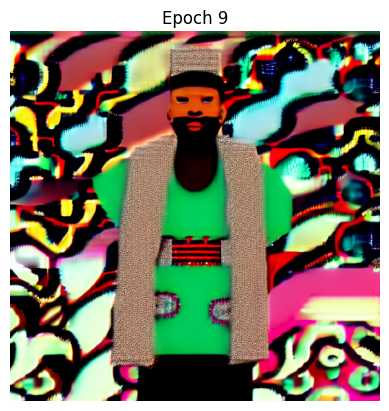

Epoch 10/10:   0%|          | 32/6404 [00:51<2:51:31,  1.62s/it]

accumulating gradients


Epoch 10/10:   1%|          | 64/6404 [01:42<2:51:43,  1.63s/it]

accumulating gradients


Epoch 10/10:   1%|▏         | 96/6404 [02:34<2:52:02,  1.64s/it]

accumulating gradients


Epoch 10/10:   2%|▏         | 128/6404 [03:25<2:50:07,  1.63s/it]

accumulating gradients


Epoch 10/10:   2%|▏         | 160/6404 [04:18<3:07:08,  1.80s/it]

accumulating gradients


Epoch 10/10:   3%|▎         | 192/6404 [05:10<2:48:00,  1.62s/it]

accumulating gradients


Epoch 10/10:   3%|▎         | 224/6404 [06:02<2:47:21,  1.62s/it]

accumulating gradients


Epoch 10/10:   4%|▍         | 256/6404 [06:54<2:59:53,  1.76s/it]

accumulating gradients


Epoch 10/10:   4%|▍         | 288/6404 [07:46<2:45:26,  1.62s/it]

accumulating gradients


Epoch 10/10:   5%|▍         | 320/6404 [08:37<2:45:01,  1.63s/it]

accumulating gradients


Epoch 10/10:   5%|▌         | 352/6404 [09:29<2:51:04,  1.70s/it]

accumulating gradients


Epoch 10/10:   6%|▌         | 384/6404 [10:21<2:43:13,  1.63s/it]

accumulating gradients


Epoch 10/10:   6%|▋         | 416/6404 [11:15<2:42:36,  1.63s/it]

accumulating gradients


Epoch 10/10:   7%|▋         | 448/6404 [12:06<2:41:35,  1.63s/it]

accumulating gradients


Epoch 10/10:   7%|▋         | 480/6404 [12:57<2:39:58,  1.62s/it]

accumulating gradients


Epoch 10/10:   8%|▊         | 512/6404 [13:49<2:40:22,  1.63s/it]

accumulating gradients


Epoch 10/10:   8%|▊         | 544/6404 [14:41<2:39:02,  1.63s/it]

accumulating gradients


Epoch 10/10:   9%|▉         | 576/6404 [15:32<2:38:06,  1.63s/it]

accumulating gradients


Epoch 10/10:   9%|▉         | 608/6404 [16:25<2:37:27,  1.63s/it]

accumulating gradients


Epoch 10/10:  10%|▉         | 640/6404 [17:16<2:36:21,  1.63s/it]

accumulating gradients


Epoch 10/10:  10%|█         | 672/6404 [18:07<2:35:31,  1.63s/it]

accumulating gradients


Epoch 10/10:  11%|█         | 704/6404 [18:59<2:35:05,  1.63s/it]

accumulating gradients


Epoch 10/10:  11%|█▏        | 736/6404 [19:50<2:33:21,  1.62s/it]

accumulating gradients


Epoch 10/10:  12%|█▏        | 768/6404 [20:42<2:32:32,  1.62s/it]

accumulating gradients


Epoch 10/10:  12%|█▏        | 800/6404 [21:34<2:39:20,  1.71s/it]

accumulating gradients


Epoch 10/10:  13%|█▎        | 832/6404 [22:28<2:38:24,  1.71s/it]

accumulating gradients


Epoch 10/10:  13%|█▎        | 864/6404 [23:22<2:37:56,  1.71s/it]

accumulating gradients


Epoch 10/10:  14%|█▍        | 896/6404 [24:15<2:29:35,  1.63s/it]

accumulating gradients


Epoch 10/10:  14%|█▍        | 928/6404 [25:08<2:28:50,  1.63s/it]

accumulating gradients


Epoch 10/10:  15%|█▍        | 960/6404 [26:03<2:44:06,  1.81s/it]

accumulating gradients


Epoch 10/10:  15%|█▌        | 992/6404 [26:55<2:37:22,  1.74s/it]

accumulating gradients


Epoch 10/10:  16%|█▌        | 1024/6404 [27:47<2:25:51,  1.63s/it]

accumulating gradients


Epoch 10/10:  16%|█▋        | 1056/6404 [28:40<2:25:05,  1.63s/it]

accumulating gradients


Epoch 10/10:  17%|█▋        | 1088/6404 [29:31<2:23:33,  1.62s/it]

accumulating gradients


Epoch 10/10:  17%|█▋        | 1120/6404 [30:25<2:34:52,  1.76s/it]

accumulating gradients


Epoch 10/10:  18%|█▊        | 1152/6404 [31:17<2:21:40,  1.62s/it]

accumulating gradients


Epoch 10/10:  18%|█▊        | 1184/6404 [32:09<2:21:46,  1.63s/it]

accumulating gradients


Epoch 10/10:  19%|█▉        | 1216/6404 [33:02<2:20:08,  1.62s/it]

accumulating gradients


Epoch 10/10:  19%|█▉        | 1248/6404 [33:53<2:19:47,  1.63s/it]

accumulating gradients


Epoch 10/10:  20%|█▉        | 1280/6404 [34:45<2:34:22,  1.81s/it]

accumulating gradients


Epoch 10/10:  20%|██        | 1312/6404 [35:38<2:19:39,  1.65s/it]

accumulating gradients


Epoch 10/10:  21%|██        | 1344/6404 [36:30<2:36:22,  1.85s/it]

accumulating gradients


Epoch 10/10:  21%|██▏       | 1376/6404 [37:22<2:16:14,  1.63s/it]

accumulating gradients


Epoch 10/10:  22%|██▏       | 1408/6404 [38:15<2:19:18,  1.67s/it]

accumulating gradients


Epoch 10/10:  22%|██▏       | 1440/6404 [39:08<2:15:02,  1.63s/it]

accumulating gradients


Epoch 10/10:  23%|██▎       | 1472/6404 [40:00<2:18:36,  1.69s/it]

accumulating gradients


Epoch 10/10:  23%|██▎       | 1504/6404 [40:53<2:24:16,  1.77s/it]

accumulating gradients


Epoch 10/10:  24%|██▍       | 1536/6404 [41:45<2:12:09,  1.63s/it]

accumulating gradients


Epoch 10/10:  24%|██▍       | 1568/6404 [42:37<2:10:31,  1.62s/it]

accumulating gradients


Epoch 10/10:  25%|██▍       | 1600/6404 [43:30<2:23:37,  1.79s/it]

accumulating gradients


Epoch 10/10:  25%|██▌       | 1632/6404 [44:21<2:09:29,  1.63s/it]

accumulating gradients


Epoch 10/10:  26%|██▌       | 1664/6404 [45:13<2:08:02,  1.62s/it]

accumulating gradients


Epoch 10/10:  26%|██▋       | 1696/6404 [46:08<2:21:08,  1.80s/it]

accumulating gradients


Epoch 10/10:  27%|██▋       | 1728/6404 [47:00<2:06:31,  1.62s/it]

accumulating gradients


Epoch 10/10:  27%|██▋       | 1760/6404 [47:52<2:06:03,  1.63s/it]

accumulating gradients


Epoch 10/10:  28%|██▊       | 1792/6404 [48:43<2:05:20,  1.63s/it]

accumulating gradients


Epoch 10/10:  28%|██▊       | 1824/6404 [49:36<2:09:59,  1.70s/it]

accumulating gradients


Epoch 10/10:  29%|██▉       | 1856/6404 [50:28<2:08:47,  1.70s/it]

accumulating gradients


Epoch 10/10:  29%|██▉       | 1888/6404 [51:19<2:02:17,  1.62s/it]

accumulating gradients


Epoch 10/10:  30%|██▉       | 1920/6404 [52:11<2:04:22,  1.66s/it]

accumulating gradients


Epoch 10/10:  30%|███       | 1952/6404 [53:03<2:00:52,  1.63s/it]

accumulating gradients


Epoch 10/10:  31%|███       | 1984/6404 [53:55<2:09:34,  1.76s/it]

accumulating gradients


Epoch 10/10:  31%|███▏      | 2016/6404 [54:47<1:59:10,  1.63s/it]

accumulating gradients


Epoch 10/10:  32%|███▏      | 2048/6404 [55:40<1:57:42,  1.62s/it]

accumulating gradients


Epoch 10/10:  32%|███▏      | 2080/6404 [56:33<1:56:24,  1.62s/it]

accumulating gradients


Epoch 10/10:  33%|███▎      | 2112/6404 [57:26<1:55:53,  1.62s/it]

accumulating gradients


Epoch 10/10:  33%|███▎      | 2144/6404 [58:19<2:05:13,  1.76s/it]

accumulating gradients


Epoch 10/10:  34%|███▍      | 2176/6404 [59:13<1:54:39,  1.63s/it]

accumulating gradients


Epoch 10/10:  34%|███▍      | 2208/6404 [1:00:06<1:54:10,  1.63s/it]

accumulating gradients


Epoch 10/10:  35%|███▍      | 2240/6404 [1:00:59<1:52:56,  1.63s/it]

accumulating gradients


Epoch 10/10:  35%|███▌      | 2272/6404 [1:01:51<1:51:58,  1.63s/it]

accumulating gradients


Epoch 10/10:  36%|███▌      | 2304/6404 [1:02:44<1:53:57,  1.67s/it]

accumulating gradients


Epoch 10/10:  36%|███▋      | 2336/6404 [1:03:36<1:51:01,  1.64s/it]

accumulating gradients


Epoch 10/10:  37%|███▋      | 2368/6404 [1:04:28<1:49:27,  1.63s/it]

accumulating gradients


Epoch 10/10:  37%|███▋      | 2400/6404 [1:05:21<1:48:43,  1.63s/it]

accumulating gradients


Epoch 10/10:  38%|███▊      | 2432/6404 [1:06:12<1:47:24,  1.62s/it]

accumulating gradients


Epoch 10/10:  38%|███▊      | 2464/6404 [1:07:04<1:46:31,  1.62s/it]

accumulating gradients


Epoch 10/10:  39%|███▉      | 2496/6404 [1:07:57<1:46:02,  1.63s/it]

accumulating gradients


Epoch 10/10:  39%|███▉      | 2528/6404 [1:08:51<1:57:05,  1.81s/it]

accumulating gradients


Epoch 10/10:  40%|███▉      | 2560/6404 [1:09:44<1:44:16,  1.63s/it]

accumulating gradients


Epoch 10/10:  40%|████      | 2592/6404 [1:10:37<1:43:16,  1.63s/it]

accumulating gradients


Epoch 10/10:  41%|████      | 2624/6404 [1:11:29<1:55:51,  1.84s/it]

accumulating gradients


Epoch 10/10:  41%|████▏     | 2656/6404 [1:12:22<1:42:15,  1.64s/it]

accumulating gradients


Epoch 10/10:  42%|████▏     | 2688/6404 [1:13:14<1:40:50,  1.63s/it]

accumulating gradients


Epoch 10/10:  42%|████▏     | 2720/6404 [1:14:07<1:39:53,  1.63s/it]

accumulating gradients


Epoch 10/10:  43%|████▎     | 2752/6404 [1:14:58<1:38:43,  1.62s/it]

accumulating gradients


Epoch 10/10:  43%|████▎     | 2784/6404 [1:15:50<1:41:13,  1.68s/it]

accumulating gradients


Epoch 10/10:  44%|████▍     | 2816/6404 [1:16:43<1:37:31,  1.63s/it]

accumulating gradients


Epoch 10/10:  44%|████▍     | 2848/6404 [1:17:34<1:36:30,  1.63s/it]

accumulating gradients


Epoch 10/10:  45%|████▍     | 2880/6404 [1:18:29<1:34:40,  1.61s/it]

accumulating gradients


Epoch 10/10:  45%|████▌     | 2912/6404 [1:19:20<1:35:07,  1.63s/it]

accumulating gradients


Epoch 10/10:  46%|████▌     | 2944/6404 [1:20:13<1:34:39,  1.64s/it]

accumulating gradients


Epoch 10/10:  46%|████▋     | 2976/6404 [1:21:07<1:36:23,  1.69s/it]

accumulating gradients


Epoch 10/10:  47%|████▋     | 3008/6404 [1:22:00<1:32:31,  1.63s/it]

accumulating gradients


Epoch 10/10:  47%|████▋     | 3040/6404 [1:22:53<1:36:39,  1.72s/it]

accumulating gradients


Epoch 10/10:  48%|████▊     | 3072/6404 [1:23:45<1:30:19,  1.63s/it]

accumulating gradients


Epoch 10/10:  48%|████▊     | 3104/6404 [1:24:37<1:29:40,  1.63s/it]

accumulating gradients


Epoch 10/10:  49%|████▉     | 3136/6404 [1:25:29<1:29:05,  1.64s/it]

accumulating gradients


Epoch 10/10:  49%|████▉     | 3168/6404 [1:26:20<1:27:29,  1.62s/it]

accumulating gradients


Epoch 10/10:  50%|████▉     | 3200/6404 [1:27:13<1:32:18,  1.73s/it]

accumulating gradients


Epoch 10/10:  50%|█████     | 3232/6404 [1:28:04<1:26:03,  1.63s/it]

accumulating gradients


Epoch 10/10:  51%|█████     | 3264/6404 [1:28:57<1:31:46,  1.75s/it]

accumulating gradients


Epoch 10/10:  51%|█████▏    | 3296/6404 [1:29:49<1:24:32,  1.63s/it]

accumulating gradients


Epoch 10/10:  52%|█████▏    | 3328/6404 [1:30:43<1:28:37,  1.73s/it]

accumulating gradients


Epoch 10/10:  52%|█████▏    | 3360/6404 [1:31:39<1:43:25,  2.04s/it]

accumulating gradients


Epoch 10/10:  53%|█████▎    | 3392/6404 [1:32:30<1:21:33,  1.62s/it]

accumulating gradients


Epoch 10/10:  53%|█████▎    | 3424/6404 [1:33:22<1:23:48,  1.69s/it]

accumulating gradients


Epoch 10/10:  54%|█████▍    | 3456/6404 [1:34:14<1:19:32,  1.62s/it]

accumulating gradients


Epoch 10/10:  54%|█████▍    | 3488/6404 [1:35:06<1:19:15,  1.63s/it]

accumulating gradients


Epoch 10/10:  55%|█████▍    | 3520/6404 [1:36:01<1:28:11,  1.83s/it]

accumulating gradients


Epoch 10/10:  55%|█████▌    | 3552/6404 [1:36:55<1:26:05,  1.81s/it]

accumulating gradients


Epoch 10/10:  56%|█████▌    | 3584/6404 [1:37:48<1:20:47,  1.72s/it]

accumulating gradients


Epoch 10/10:  56%|█████▋    | 3616/6404 [1:38:41<1:15:30,  1.63s/it]

accumulating gradients


Epoch 10/10:  57%|█████▋    | 3648/6404 [1:39:33<1:18:55,  1.72s/it]

accumulating gradients


Epoch 10/10:  57%|█████▋    | 3680/6404 [1:40:26<1:22:36,  1.82s/it]

accumulating gradients


Epoch 10/10:  58%|█████▊    | 3712/6404 [1:41:18<1:13:02,  1.63s/it]

accumulating gradients


Epoch 10/10:  58%|█████▊    | 3744/6404 [1:42:10<1:16:04,  1.72s/it]

accumulating gradients


Epoch 10/10:  59%|█████▉    | 3776/6404 [1:43:04<1:11:24,  1.63s/it]

accumulating gradients


Epoch 10/10:  59%|█████▉    | 3808/6404 [1:43:56<1:10:27,  1.63s/it]

accumulating gradients


Epoch 10/10:  60%|█████▉    | 3840/6404 [1:44:48<1:09:36,  1.63s/it]

accumulating gradients


Epoch 10/10:  60%|██████    | 3872/6404 [1:45:40<1:08:23,  1.62s/it]

accumulating gradients


Epoch 10/10:  61%|██████    | 3904/6404 [1:46:33<1:10:19,  1.69s/it]

accumulating gradients


Epoch 10/10:  61%|██████▏   | 3936/6404 [1:47:25<1:06:47,  1.62s/it]

accumulating gradients


Epoch 10/10:  62%|██████▏   | 3968/6404 [1:48:17<1:07:25,  1.66s/it]

accumulating gradients


Epoch 10/10:  62%|██████▏   | 4000/6404 [1:49:09<1:05:01,  1.62s/it]

accumulating gradients


Epoch 10/10:  63%|██████▎   | 4032/6404 [1:50:05<1:15:32,  1.91s/it]

accumulating gradients


Epoch 10/10:  63%|██████▎   | 4064/6404 [1:50:56<1:03:34,  1.63s/it]

accumulating gradients


Epoch 10/10:  64%|██████▍   | 4096/6404 [1:51:49<1:05:59,  1.72s/it]

accumulating gradients


Epoch 10/10:  64%|██████▍   | 4128/6404 [1:52:42<1:01:39,  1.63s/it]

accumulating gradients


Epoch 10/10:  65%|██████▍   | 4160/6404 [1:53:34<1:00:58,  1.63s/it]

accumulating gradients


Epoch 10/10:  65%|██████▌   | 4192/6404 [1:54:25<1:00:16,  1.63s/it]

accumulating gradients


Epoch 10/10:  66%|██████▌   | 4224/6404 [1:55:18<59:06,  1.63s/it]

accumulating gradients


Epoch 10/10:  66%|██████▋   | 4256/6404 [1:56:11<58:16,  1.63s/it]

accumulating gradients


Epoch 10/10:  67%|██████▋   | 4288/6404 [1:57:04<1:02:11,  1.76s/it]

accumulating gradients


Epoch 10/10:  67%|██████▋   | 4320/6404 [1:57:58<56:32,  1.63s/it]

accumulating gradients


Epoch 10/10:  68%|██████▊   | 4352/6404 [1:58:52<1:06:16,  1.94s/it]

accumulating gradients


Epoch 10/10:  68%|██████▊   | 4384/6404 [1:59:44<55:18,  1.64s/it]

accumulating gradients


Epoch 10/10:  69%|██████▉   | 4416/6404 [2:00:37<53:54,  1.63s/it]

accumulating gradients


Epoch 10/10:  69%|██████▉   | 4448/6404 [2:01:29<53:49,  1.65s/it]

accumulating gradients


Epoch 10/10:  70%|██████▉   | 4480/6404 [2:02:24<53:14,  1.66s/it]

accumulating gradients


Epoch 10/10:  70%|███████   | 4512/6404 [2:03:16<51:14,  1.62s/it]

accumulating gradients


Epoch 10/10:  71%|███████   | 4544/6404 [2:04:08<50:50,  1.64s/it]

accumulating gradients


Epoch 10/10:  71%|███████▏  | 4576/6404 [2:05:00<49:34,  1.63s/it]

accumulating gradients


Epoch 10/10:  72%|███████▏  | 4608/6404 [2:05:52<48:42,  1.63s/it]

accumulating gradients


Epoch 10/10:  72%|███████▏  | 4640/6404 [2:06:45<49:00,  1.67s/it]

accumulating gradients


Epoch 10/10:  73%|███████▎  | 4672/6404 [2:07:40<57:08,  1.98s/it]  

accumulating gradients


Epoch 10/10:  73%|███████▎  | 4704/6404 [2:08:34<46:42,  1.65s/it]

accumulating gradients


Epoch 10/10:  74%|███████▍  | 4736/6404 [2:09:26<45:19,  1.63s/it]

accumulating gradients


Epoch 10/10:  74%|███████▍  | 4768/6404 [2:10:19<49:55,  1.83s/it]

accumulating gradients


Epoch 10/10:  75%|███████▍  | 4800/6404 [2:11:11<43:22,  1.62s/it]

accumulating gradients


Epoch 10/10:  75%|███████▌  | 4832/6404 [2:12:04<43:58,  1.68s/it]

accumulating gradients


Epoch 10/10:  76%|███████▌  | 4864/6404 [2:12:55<41:51,  1.63s/it]

accumulating gradients


Epoch 10/10:  76%|███████▋  | 4896/6404 [2:13:49<41:04,  1.63s/it]

accumulating gradients


Epoch 10/10:  77%|███████▋  | 4928/6404 [2:14:41<40:12,  1.63s/it]

accumulating gradients


Epoch 10/10:  77%|███████▋  | 4960/6404 [2:15:34<39:36,  1.65s/it]

accumulating gradients


Epoch 10/10:  78%|███████▊  | 4992/6404 [2:16:29<38:18,  1.63s/it]

accumulating gradients


Epoch 10/10:  78%|███████▊  | 5024/6404 [2:17:20<37:30,  1.63s/it]

accumulating gradients


Epoch 10/10:  79%|███████▉  | 5056/6404 [2:18:13<37:16,  1.66s/it]

accumulating gradients


Epoch 10/10:  79%|███████▉  | 5088/6404 [2:19:05<35:42,  1.63s/it]

accumulating gradients


Epoch 10/10:  80%|███████▉  | 5120/6404 [2:19:57<34:52,  1.63s/it]

accumulating gradients


Epoch 10/10:  80%|████████  | 5152/6404 [2:20:50<34:02,  1.63s/it]

accumulating gradients


Epoch 10/10:  81%|████████  | 5184/6404 [2:21:42<33:08,  1.63s/it]

accumulating gradients


Epoch 10/10:  81%|████████▏ | 5216/6404 [2:22:33<32:16,  1.63s/it]

accumulating gradients


Epoch 10/10:  82%|████████▏ | 5248/6404 [2:23:25<31:30,  1.64s/it]

accumulating gradients


Epoch 10/10:  82%|████████▏ | 5280/6404 [2:24:17<30:32,  1.63s/it]

accumulating gradients


Epoch 10/10:  83%|████████▎ | 5312/6404 [2:25:09<30:09,  1.66s/it]

accumulating gradients


Epoch 10/10:  83%|████████▎ | 5344/6404 [2:26:03<28:58,  1.64s/it]

accumulating gradients


Epoch 10/10:  84%|████████▍ | 5376/6404 [2:26:57<27:56,  1.63s/it]

accumulating gradients


Epoch 10/10:  84%|████████▍ | 5408/6404 [2:27:49<26:59,  1.63s/it]

accumulating gradients


Epoch 10/10:  85%|████████▍ | 5440/6404 [2:28:42<26:06,  1.63s/it]

accumulating gradients


Epoch 10/10:  85%|████████▌ | 5472/6404 [2:29:34<25:23,  1.63s/it]

accumulating gradients


Epoch 10/10:  86%|████████▌ | 5504/6404 [2:30:27<24:20,  1.62s/it]

accumulating gradients


Epoch 10/10:  86%|████████▋ | 5536/6404 [2:31:20<23:31,  1.63s/it]

accumulating gradients


Epoch 10/10:  87%|████████▋ | 5568/6404 [2:32:12<22:37,  1.62s/it]

accumulating gradients


Epoch 10/10:  87%|████████▋ | 5600/6404 [2:33:05<21:52,  1.63s/it]

accumulating gradients


Epoch 10/10:  88%|████████▊ | 5632/6404 [2:33:56<20:53,  1.62s/it]

accumulating gradients


Epoch 10/10:  88%|████████▊ | 5664/6404 [2:34:49<21:33,  1.75s/it]

accumulating gradients


Epoch 10/10:  89%|████████▉ | 5696/6404 [2:35:42<20:20,  1.72s/it]

accumulating gradients


Epoch 10/10:  89%|████████▉ | 5728/6404 [2:36:36<19:09,  1.70s/it]

accumulating gradients


Epoch 10/10:  90%|████████▉ | 5760/6404 [2:37:28<17:27,  1.63s/it]

accumulating gradients


Epoch 10/10:  90%|█████████ | 5792/6404 [2:38:19<16:40,  1.64s/it]

accumulating gradients


Epoch 10/10:  91%|█████████ | 5824/6404 [2:39:13<15:44,  1.63s/it]

accumulating gradients


Epoch 10/10:  91%|█████████▏| 5856/6404 [2:40:05<14:54,  1.63s/it]

accumulating gradients


Epoch 10/10:  92%|█████████▏| 5888/6404 [2:40:56<13:59,  1.63s/it]

accumulating gradients


Epoch 10/10:  92%|█████████▏| 5920/6404 [2:41:49<14:51,  1.84s/it]

accumulating gradients


Epoch 10/10:  93%|█████████▎| 5952/6404 [2:42:41<12:14,  1.62s/it]

accumulating gradients


Epoch 10/10:  93%|█████████▎| 5984/6404 [2:43:33<11:25,  1.63s/it]

accumulating gradients


Epoch 10/10:  94%|█████████▍| 6016/6404 [2:44:25<10:59,  1.70s/it]

accumulating gradients


Epoch 10/10:  94%|█████████▍| 6048/6404 [2:45:18<09:48,  1.65s/it]

accumulating gradients


Epoch 10/10:  95%|█████████▍| 6080/6404 [2:46:13<10:19,  1.91s/it]

accumulating gradients


Epoch 10/10:  95%|█████████▌| 6112/6404 [2:47:05<08:33,  1.76s/it]

accumulating gradients


Epoch 10/10:  96%|█████████▌| 6144/6404 [2:47:57<07:02,  1.63s/it]

accumulating gradients


Epoch 10/10:  96%|█████████▋| 6176/6404 [2:48:50<06:10,  1.63s/it]

accumulating gradients


Epoch 10/10:  97%|█████████▋| 6208/6404 [2:49:42<05:19,  1.63s/it]

accumulating gradients


Epoch 10/10:  97%|█████████▋| 6240/6404 [2:50:34<04:26,  1.63s/it]

accumulating gradients


Epoch 10/10:  98%|█████████▊| 6272/6404 [2:51:26<03:46,  1.71s/it]

accumulating gradients


Epoch 10/10:  98%|█████████▊| 6304/6404 [2:52:18<02:43,  1.63s/it]

accumulating gradients


Epoch 10/10:  99%|█████████▉| 6336/6404 [2:53:10<01:51,  1.64s/it]

accumulating gradients


Epoch 10/10:  99%|█████████▉| 6368/6404 [2:54:02<00:59,  1.66s/it]

accumulating gradients


Epoch 10/10: 100%|█████████▉| 6400/6404 [2:54:54<00:06,  1.63s/it]

accumulating gradients


Epoch 10/10: 100%|██████████| 6404/6404 [2:55:00<00:00,  1.64s/it]


accumulating gradients


Validation: 100%|██████████| 1601/1601 [1:23:54<00:00,  3.14s/it]


Epoch 10/10, Train Loss: 0.0102, Validation Loss: 0.0100
Disk usage: 129 GB free


  0%|          | 0/50 [00:00<?, ?it/s]

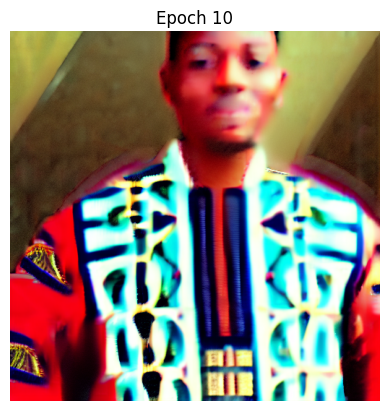

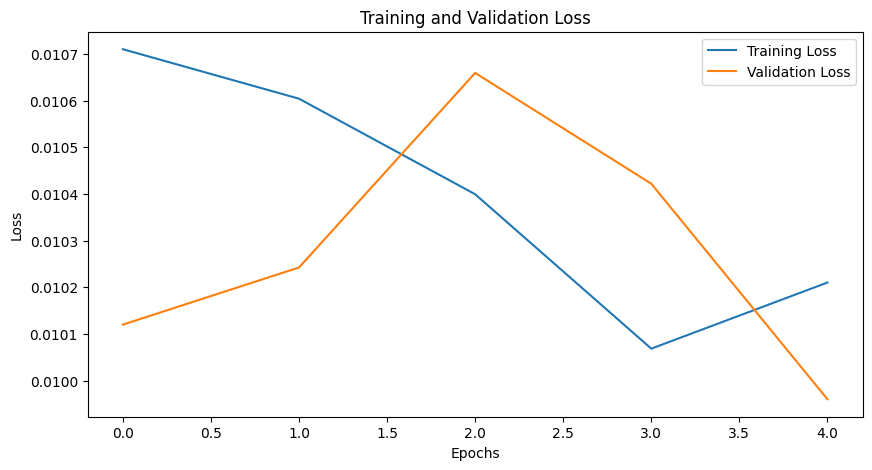

In [ ]:
# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

checkpoint_dir = os.path.join(PROJECT_ROOT, "checkpoint2")
os.makedirs(checkpoint_dir, exist_ok=True)

# Transformations for images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Reduce image size to 256x256
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5, 0.5), (0.5, 0.5, 0.5, 0.5))  # Normalize for 4 channels (RGBA)
])

class FashionDataset(Dataset):
    def __init__(self, image_paths, captions, tokenizer, transform=None):
        self.image_paths = image_paths
        self.captions = captions
        self.tokenizer = tokenizer
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        caption = self.captions[idx]

        image = Image.open(image_path).convert("RGBA")  # Convert to RGBA
        if self.transform:
            image = self.transform(image)

        inputs = self.tokenizer(caption, return_tensors="pt", padding="max_length", truncation=True, max_length=77)
        input_ids = inputs["input_ids"].squeeze(0)
        attention_mask = inputs["attention_mask"].squeeze(0)

        return image, input_ids, attention_mask

# Function to check the tensor shapes
def check_tensor_shapes(dataloader, clip_model, unet, noise_scheduler):
    # Get a single batch
    images, input_ids, attention_mask = next(iter(dataloader))
    images = images.to("cuda")
    input_ids = input_ids.to("cuda")
    attention_mask = attention_mask.to("cuda")

    print(f"Image tensor shape: {images.shape}")
    print(f"Input IDs shape: {input_ids.shape}")
    print(f"Attention mask shape: {attention_mask.shape}")

    # Generate noise
    noise = torch.randn(images.shape).to(images.device)
    print(f"Noise tensor shape: {noise.shape}")

    # Get text embeddings
    text_embeddings = clip_model(input_ids, attention_mask=attention_mask).last_hidden_state
    print(f"Text embeddings shape: {text_embeddings.shape}")

    # Forward pass through the model
    timesteps = torch.tensor([50], device=images.device)  # Example timesteps value, adjust as needed
    noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
    print(noisy_images.dtype)
    print(f"Noisy images tensor shape: {noisy_images.shape}")

    noise_pred = unet(noisy_images, timesteps, encoder_hidden_states=text_embeddings).sample
    print(f"Predicted noise tensor shape: {noise_pred.shape}")

    # Free GPU memory
    del images, input_ids, attention_mask, noise, text_embeddings, noisy_images, noise_pred
    torch.cuda.empty_cache()

# Create datasets for training and validation
train_dataset = FashionDataset(image_paths_train, captions_train, tokenizer, transform)
val_dataset = FashionDataset(image_paths_val, captions_val, tokenizer, transform)

# Define the number of workers for data loading
num_workers = 0  # Adjust this number based on your system's CPU cores and memory
batch_size = 1  # Start with the smallest batch size first
effective_batch_sz = 32
k = effective_batch_sz / batch_size

# Use DataLoader for data loading
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# Training loop
num_epochs = 5 # Set total number of epochs to 5
train_losses = []
val_losses = []

optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, unet.parameters()), lr=5e-6)  # Adjust learning rate
scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=3, verbose=True)
scaler = GradScaler()

best_val_loss = float('inf')
early_stopping_patience = 5
early_stopping_counter = 0

# Sample text prompt for image generation check
sample_text_prompt = "An image of a man wearing African Agbada"

# Load last checkpoint if available
last_checkpoint_path = os.path.join(checkpoint_dir, "checkpoint_epoch_5.pth")
start_epoch = 0

if os.path.exists(last_checkpoint_path):
    # Load checkpoint on CPU first to conserve GPU memory
    checkpoint = torch.load(last_checkpoint_path, map_location=torch.device('cpu'))
    print(f"Checkpoint loaded successfully: {last_checkpoint_path}")
    print(f"Checkpoint contains: {checkpoint.keys()}")

    # Move model state to GPU only when needed
    unet.load_state_dict(checkpoint['model_state_dict'])
    unet.to("cuda") # Move model to GPU after loading weights

    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch']
    best_val_loss = checkpoint['loss']
    print(f"Resuming training from epoch {start_epoch}")
else:
    print(f"No checkpoint found at {last_checkpoint_path}, starting from epoch 1")

# Clear GPU cache before starting training
torch.cuda.empty_cache()

for epoch in range(start_epoch, start_epoch + num_epochs):
    train_loss = 0.0
    unet.train()

    for batch_idx, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{start_epoch + num_epochs}")):
        images, input_ids, attention_mask = batch
        images = images.to("cuda")
        input_ids = input_ids.to("cuda")
        attention_mask = attention_mask.to("cuda")

        with autocast():
            noise = torch.randn(images.shape, device=images.device)
            text_embeddings = clip_model(input_ids, attention_mask=attention_mask).last_hidden_state
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (1,), device=images.device).long()
            noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
            noise_pred = unet(noisy_images, timesteps, encoder_hidden_states=text_embeddings).sample
            loss = torch.nn.functional.mse_loss(noise_pred, noise)

        scaler.scale(loss).backward()
        if (batch_idx+1) % k == 0 or (batch_idx+1) == len(train_loader):
            print("accumulating gradients")
            torch.nn.utils.clip_grad_norm_(unet.parameters(), max_norm=1.0)
            if any(p.grad is not None for p in unet.parameters()):
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()

        train_loss += loss.item()

        del images, input_ids, attention_mask, noise, text_embeddings, timesteps, noisy_images, noise_pred, loss
        torch.cuda.empty_cache()

    train_loss /= len(train_loader)
    train_losses.append(train_loss)

    # Validation phase
    val_loss = 0.0
    unet.eval()
    with torch.no_grad():
        for batch_idx, batch in enumerate(tqdm(val_loader, desc="Validation")):
            images, input_ids, attention_mask = batch
            images = images.to("cuda")
            input_ids = input_ids.to("cuda")
            attention_mask = attention_mask.to("cuda")

            noise = torch.randn(images.shape, device=images.device)
            text_embeddings = clip_model(input_ids, attention_mask=attention_mask).last_hidden_state
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (1,), device=images.device).long()
            noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
            noise_pred = unet(noisy_images, timesteps, encoder_hidden_states=text_embeddings).sample
            loss = torch.nn.functional.mse_loss(noise_pred, noise)

            val_loss += loss.item()

            del images, input_ids, attention_mask, noise, text_embeddings, timesteps, noisy_images, noise_pred, loss
            torch.cuda.empty_cache()

    val_loss /= len(val_loader)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{start_epoch + num_epochs}, Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")

    # Save checkpoints every epoch
    checkpoint_path = os.path.join(checkpoint_dir, f"checkpoint_epoch_{epoch+1}.pth")
    os.makedirs(os.path.dirname(checkpoint_path), exist_ok=True)

    # Check available disk space on Google Drive
    total, used, free = shutil.disk_usage("/content/drive")
    print(f"Disk usage: {free // (2**30)} GB free")
    if free < 10 * (2**30):  # Less than 10GB free
        raise RuntimeError("Insufficient disk space to save checkpoint")

    torch.save({
        'epoch': epoch + 1,
        'model_state_dict': unet.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': train_loss,
    }, checkpoint_path)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        early_stopping_counter = 0  # Reset early stopping counter if validation loss improves
    else:
        early_stopping_counter += 1

    scheduler.step(val_loss)

    # Early stopping
    if early_stopping_counter >= early_stopping_patience:
        print("Early stopping triggered")
        break

    # Generate sample image after each epoch for visual inspection
    pipeline.unet.eval()
    with torch.no_grad():
        result = pipeline(sample_text_prompt).images[0]
        plt.imshow(result)
        plt.axis('off')
        plt.title(f'Epoch {epoch+1}')
        plt.show()
    pipeline.unet.train()

# Plotting training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()


## TESTING OUT BEST SAVED CHECKPOINTS FROM BOTH DATASET SETS

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

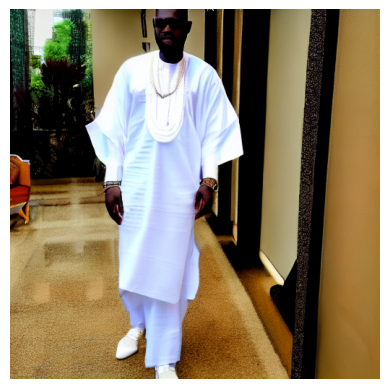

In [ ]:
# Define paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
checkpoint_path = os.path.join(PROJECT_ROOT, "checkpoint2", "checkpoint_epoch_2.pth")  # Change this to your checkpoint path

# Initialize the tokenizer and model pipeline
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipeline.to("cuda")  # Ensure the model is moved to GPU

# Load the fine-tuned weights
checkpoint = torch.load(checkpoint_path)
pipeline.unet.load_state_dict(checkpoint['model_state_dict'])

# Set the model to evaluation mode
pipeline.unet.eval()

# Function to generate an image based on a text prompt
def generate_image(prompt):
    # Generate the image
    result = pipeline(prompt).images[0]
    return result

# Define your text prompt
text_prompt = "gentleman is wearing a white african agbada ."

# Generate the image
generated_image = generate_image(text_prompt)

# Display the generated image
plt.imshow(generated_image)
plt.axis('off')
plt.show()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

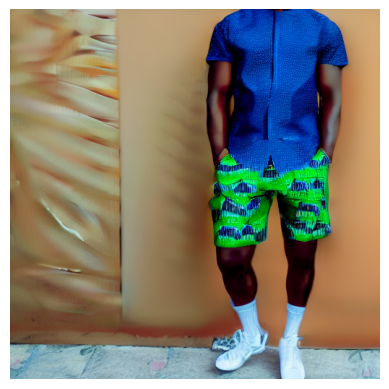

In [ ]:
# Define paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
checkpoint_path = os.path.join(PROJECT_ROOT, "checkpoint", "checkpoint_epoch_7.pth")  # Change this to your checkpoint path

# Initialize the tokenizer and model pipeline
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipeline.to("cuda")  # Ensure the model is moved to GPU

# Load the fine-tuned weights
checkpoint = torch.load(checkpoint_path)
pipeline.unet.load_state_dict(checkpoint['model_state_dict'])

# Set the model to evaluation mode
pipeline.unet.eval()

# Function to generate an image based on a text prompt
def generate_image(prompt):
    # Generate the image
    result = pipeline(prompt).images[0]
    return result

# Define your text prompt
text_prompt = "gentleman is wearing a Nigerian adire shorts and an african print shirt ."

# Generate the image
generated_image = generate_image(text_prompt)

# Display the generated image
plt.imshow(generated_image)
plt.axis('off')
plt.show()

#EVALUATION METRICS

##QUANTITATIVE EVALUATION

Image found: image1811.png
Text Descriptor: NINA blue boubou, hand-dyed by Ivorian artisans.


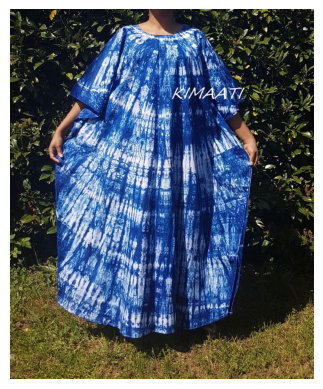

In [ ]:
import os
import json
import matplotlib.pyplot as plt
from PIL import Image

# Define the paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
image_folder_path = os.path.join(PROJECT_ROOT, "InFashAiv1_images")
jsonl_path = os.path.join(PROJECT_ROOT, "copyAfricametadata.jsonl")

def load_metadata(jsonl_path):
    metadata = []
    with open(jsonl_path, 'r') as file:
        for line in file:
            metadata.append(json.loads(line))
    return metadata

def find_image_metadata(metadata, image_filename):
    for item in metadata:
        if item.get("file_name") == image_filename:
            return item
    return None

def display_image(image_path):
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Load metadata
metadata = load_metadata(jsonl_path)

# Specify the image filename you are looking for
image_filename = "image1811.png"

# Check if the image is in the dataset and get its metadata
image_metadata = find_image_metadata(metadata, image_filename)

if image_metadata:
    image_path = os.path.join(image_folder_path, image_filename)
    if os.path.exists(image_path):
        print(f"Image found: {image_filename}")
        print("Text Descriptor:", image_metadata.get("text"))
        display_image(image_path)
    else:
        print(f"Image file {image_filename} not found in the image folder.")
else:
    print(f"Image '{image_filename}' not found in the metadata.")





Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

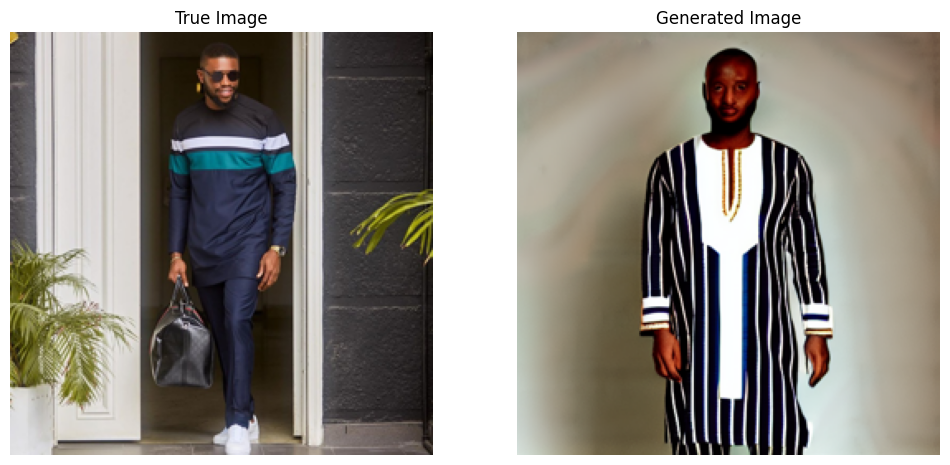

MSE: 104.00275166829427
PSNR: 27.96035531006176
SSIM: 0.15068751955900817


In [ ]:
# Define the root directory and paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
image_folder_path = os.path.join(PROJECT_ROOT, "InFashAiv1_images")
jsonl_path = os.path.join(PROJECT_ROOT, "copyAfricametadata.jsonl")
checkpoint_path = os.path.join(PROJECT_ROOT, "checkpoint", "checkpoint_epoch_7.pth")  # Change this to your checkpoint path

# Specific image filename and corresponding text prompt
specific_image_filename = "image9479.png"
specific_text_prompt = ("a gentleman is wearing very dark Blue longsleeve Kaftan with a single horizontal white and green stripes accross the chest, the pants is very dark blue and its Handcrafted in Nigeria, this sharply cut kaftan is effortlessly classic and a must have for any African man who wants to impress")

# Function to load a specific image and convert it to RGB
def load_specific_image(image_folder, image_filename, size=(256, 256)):
    image_path = os.path.join(image_folder, image_filename)
    img = Image.open(image_path).convert('RGBA')
    img = img.resize(size)
    img = img.convert('RGB')  # Convert RGBA to RGB
    return np.array(img)

# Load the specific true image
true_image = load_specific_image(image_folder_path, specific_image_filename)

# Initialize the tokenizer and model pipeline
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipeline.to("cuda")  # Ensure the model is moved to GPU

# Load the fine-tuned weights
checkpoint = torch.load(checkpoint_path)
pipeline.unet.load_state_dict(checkpoint['model_state_dict'])

# Set the model to evaluation mode
pipeline.unet.eval()

# Function to generate an image based on a text prompt
def generate_image(prompt, size=(256, 256)):
    # Generate the image
    result = pipeline(prompt).images[0]
    result = result.resize(size)
    return np.array(result)

# Generate the image using the provided text prompt
generated_image = generate_image(specific_text_prompt, size=(256, 256))

# Display the true image and the generated image
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("True Image")
plt.imshow(true_image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Generated Image")
plt.imshow(generated_image)
plt.axis('off')

plt.show()

# Evaluation metrics
def mean_squared_error(true_image, generated_image):
    return np.mean((true_image - generated_image) ** 2)

def peak_signal_to_noise_ratio(true_image, generated_image):
    mse = mean_squared_error(true_image, generated_image)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    return 20 * np.log10(max_pixel / np.sqrt(mse))

def structural_similarity_index(true_image, generated_image):
    return ssim(true_image, generated_image, win_size=11, channel_axis=-1)

# Compute metrics
mse = mean_squared_error(true_image, generated_image)
psnr = peak_signal_to_noise_ratio(true_image, generated_image)
ssim_value = structural_similarity_index(true_image, generated_image)

print(f"MSE: {mse}")
print(f"PSNR: {psnr}")
print(f"SSIM: {ssim_value}")



## QUALITATIVE EVALUATION

In [ ]:
!pip install opencv-python-headless


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Processing image130.png...


  0%|          | 0/50 [00:00<?, ?it/s]

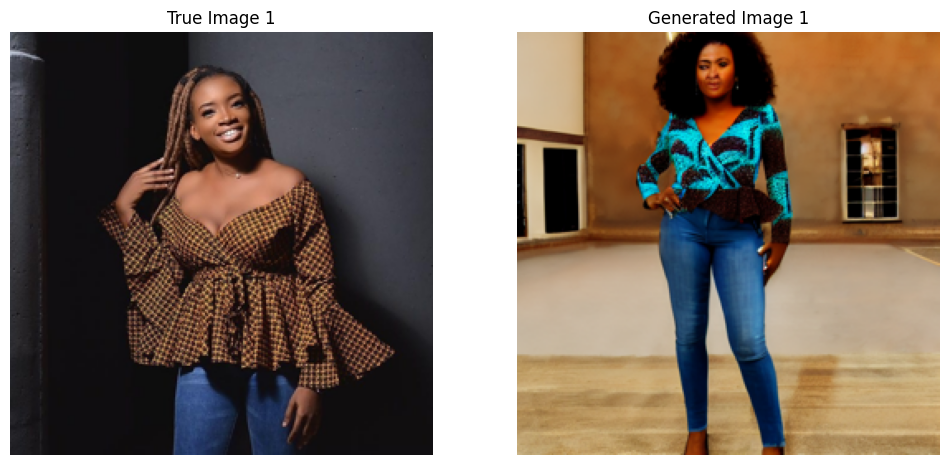

Color Palette Score: 0.6554
Texture Realism Score: 29.1781
Style Consistency Score: 0.2172


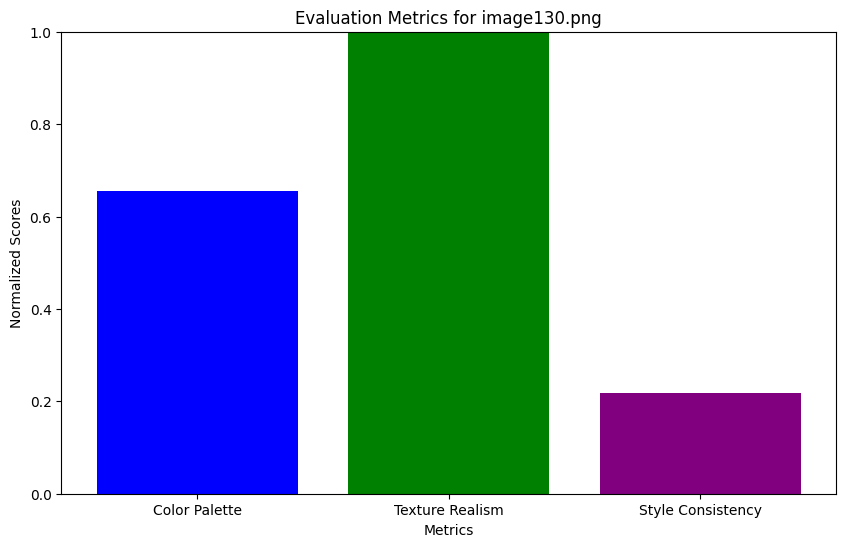

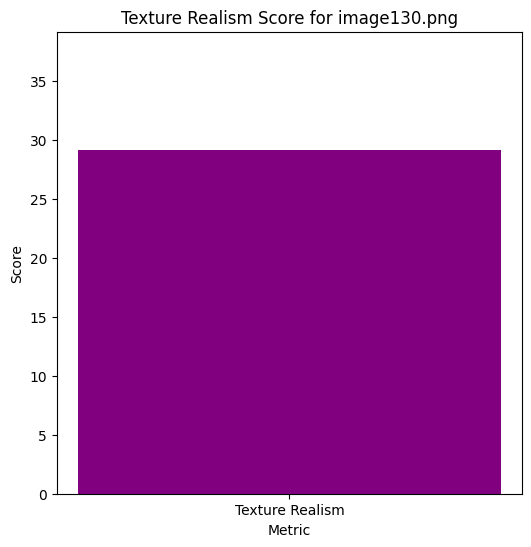

Processing image1552.png...


  0%|          | 0/50 [00:00<?, ?it/s]

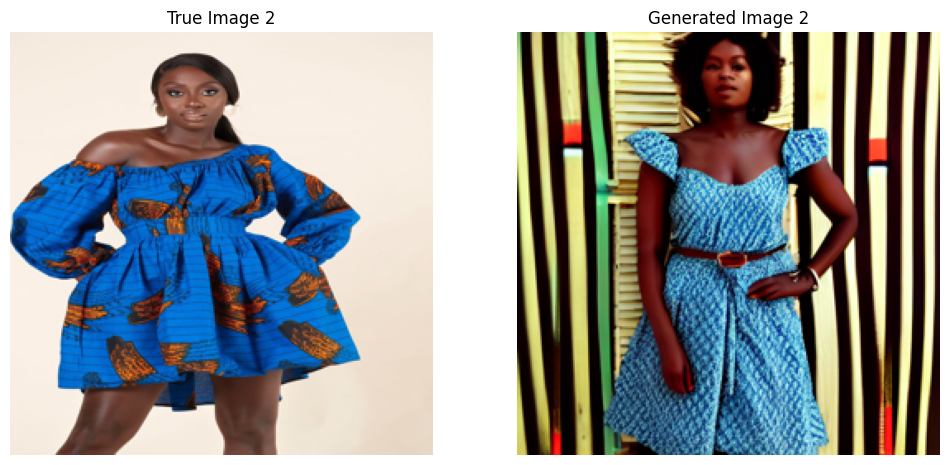

Color Palette Score: 0.5533
Texture Realism Score: 30.8574
Style Consistency Score: 0.3660


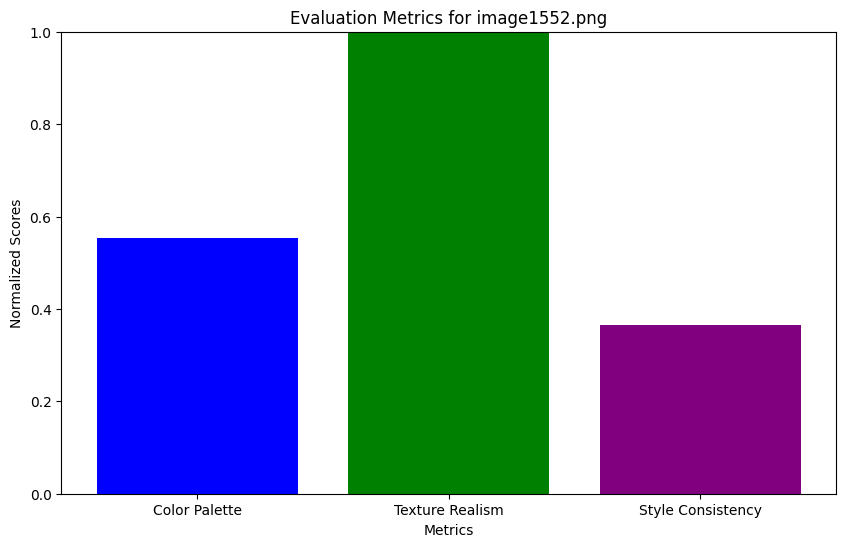

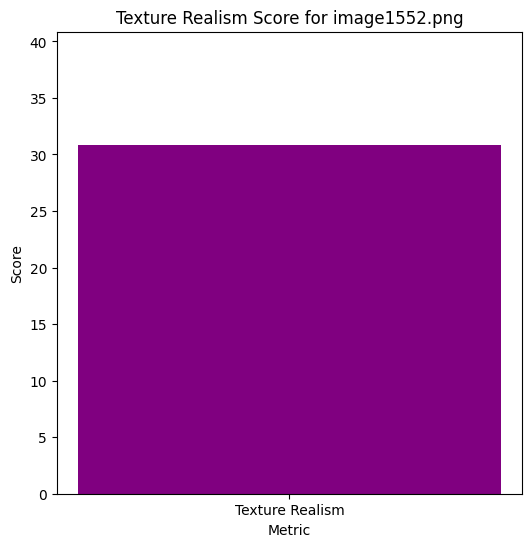

Processing image1551.png...


  0%|          | 0/50 [00:00<?, ?it/s]

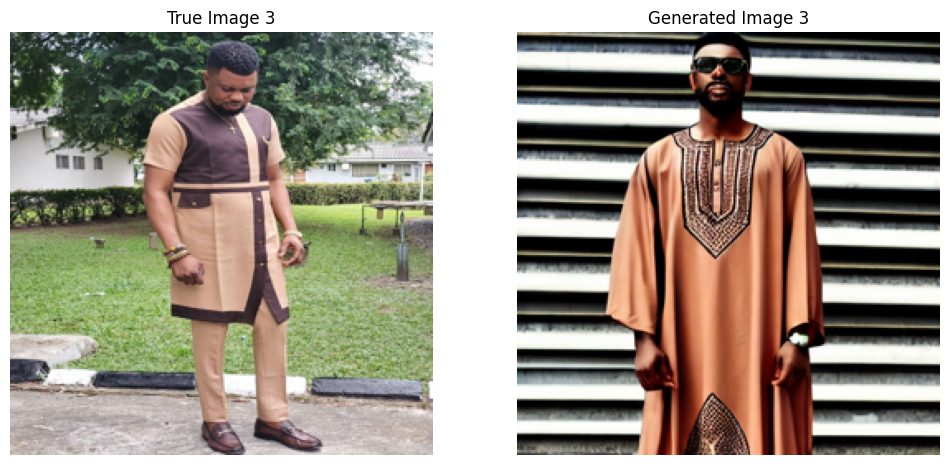

Color Palette Score: 0.6421
Texture Realism Score: 19.1944
Style Consistency Score: 0.7657


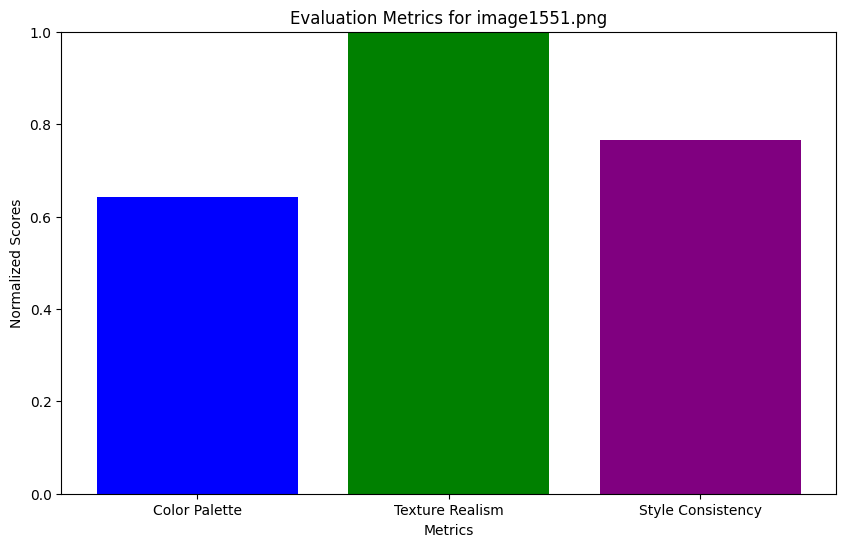

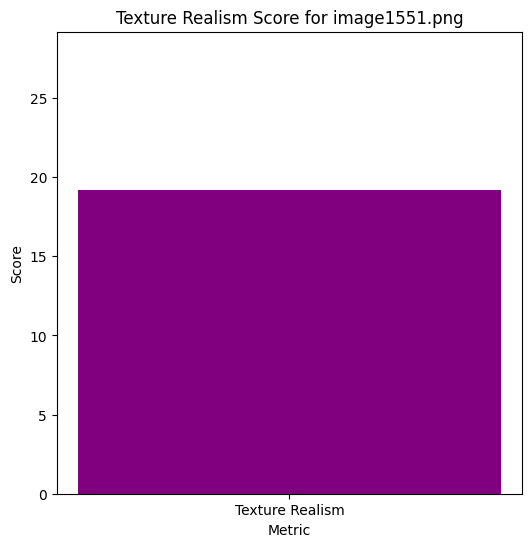

Processing image1601.png...


  0%|          | 0/50 [00:00<?, ?it/s]

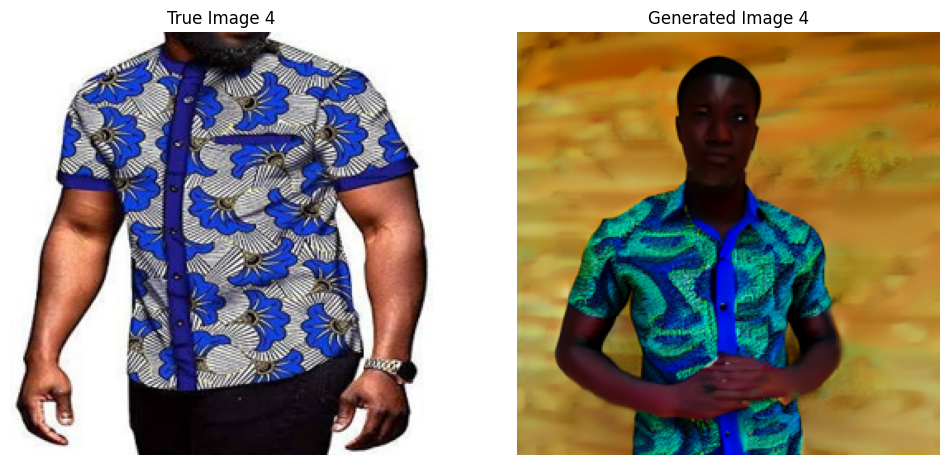

Color Palette Score: 0.5014
Texture Realism Score: 29.4241
Style Consistency Score: 0.4809


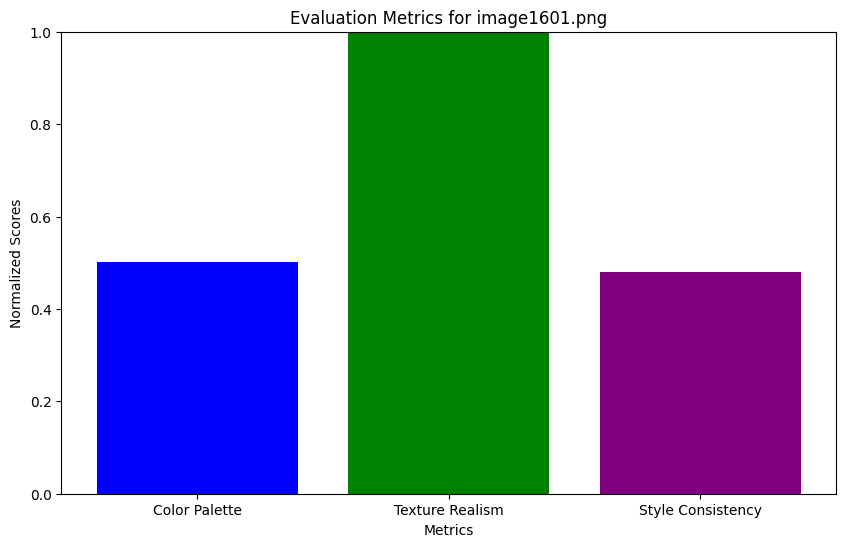

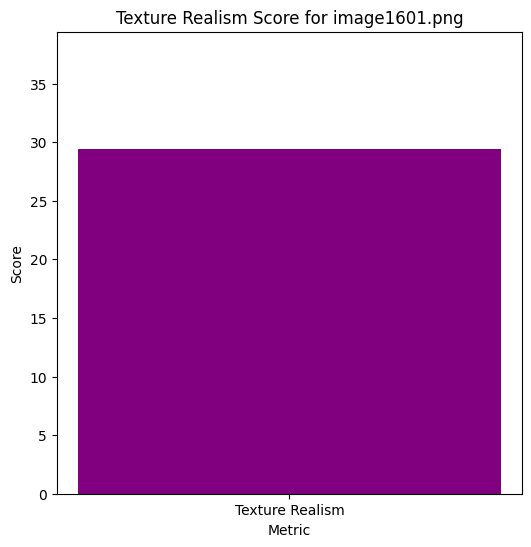

Processing image9479.png...


  0%|          | 0/50 [00:00<?, ?it/s]

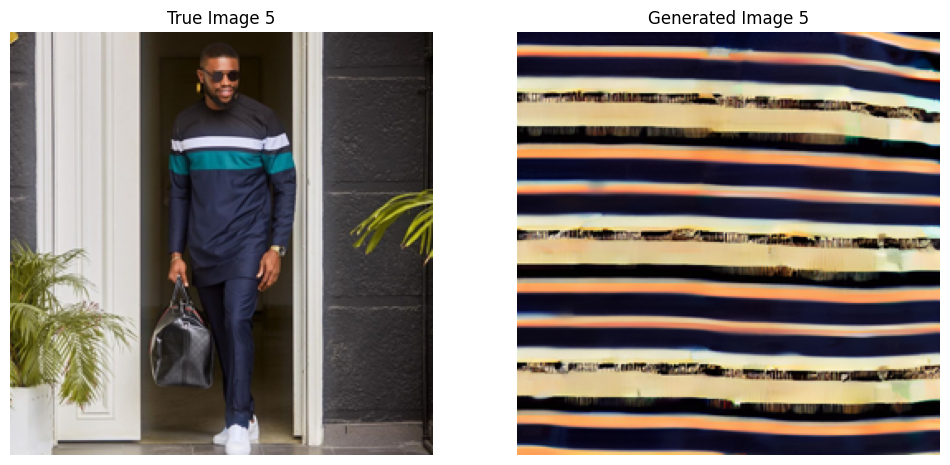

Color Palette Score: 0.6897
Texture Realism Score: 27.7309
Style Consistency Score: 0.1642


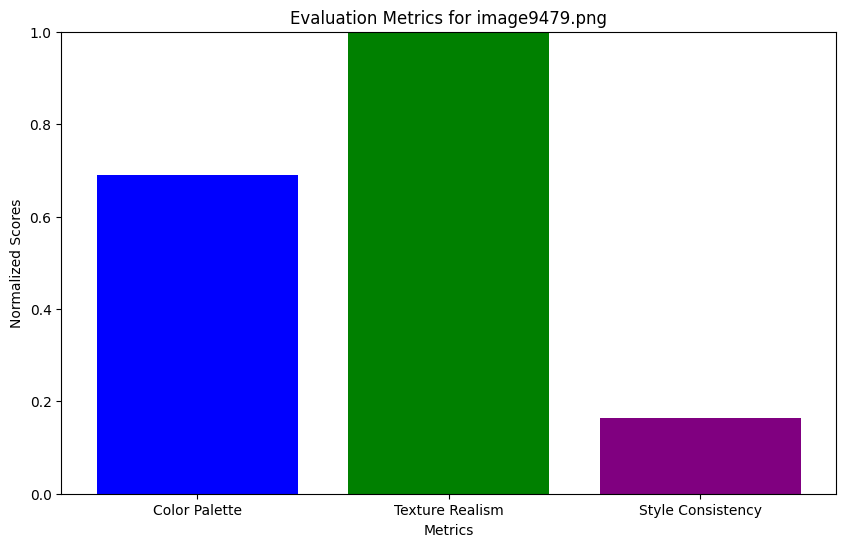

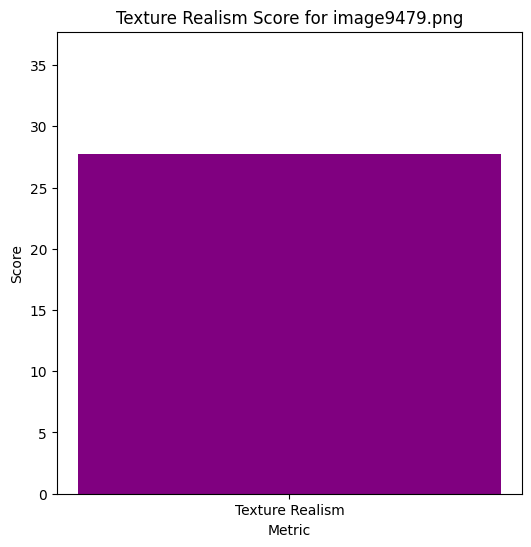

Processing image1609.png...


  0%|          | 0/50 [00:00<?, ?it/s]

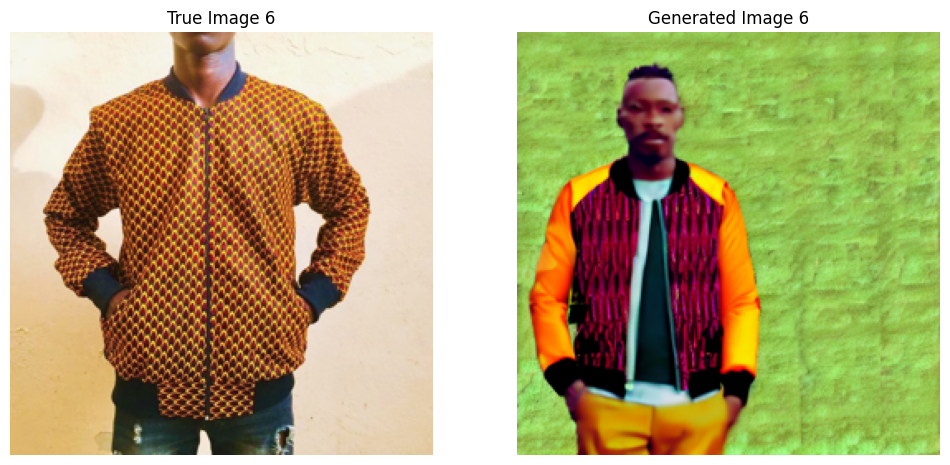

Color Palette Score: 0.3959
Texture Realism Score: 22.7411
Style Consistency Score: 0.6389


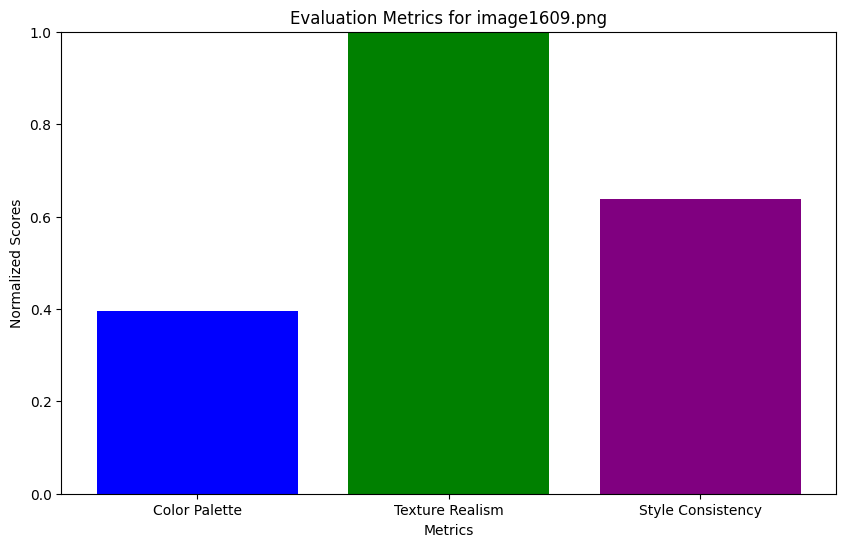

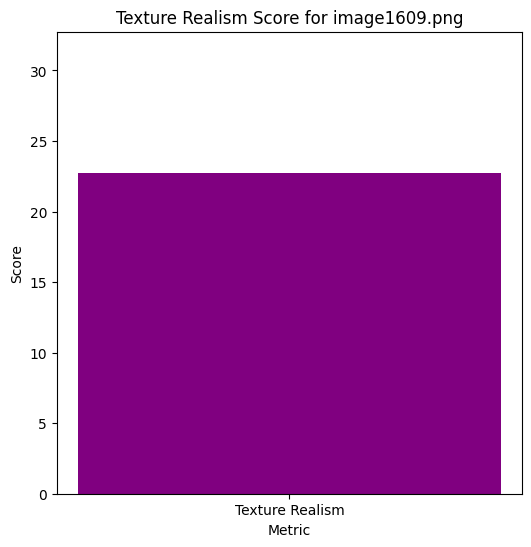

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from diffusers import DiffusionPipeline
from skimage.metrics import structural_similarity as ssim
import cv2
from skimage.color import rgb2lab

# Define the root directory and paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
image_folder_path = os.path.join(PROJECT_ROOT, "InFashAiv1_images")
checkpoint_path = os.path.join(PROJECT_ROOT, "checkpoint", "checkpoint_epoch_7.pth")

# List of specific image filenames and corresponding text prompts
image_prompt_pairs = [
    ("image130.png", "The lady is wearing a brown african wax patterened african print longsleeve low v neckline peplum wrap top on a pair of blue jeans."),
    ("image1552.png", "A lady is wearing an open slanted shoulder neckline knee length blue pattern African wax print that has a Loose Fit with elastic in  waistband, slanted neckline, and cuffs Balloon sleeve. Includes belt with same fabric."),
    ("image1551.png", "A man is wearing a brown kaftan with minimal design, it is  effortlessly classic and a must-have for any African man who wants to impress."),
    ("image1601.png", "An image of a man  wearing a blue African ankara print patterned shotsleeves shirt  The unique outfit is handmade and designed with quality Ankara wax"),
    ("image9479.png", "a gentleman  wearing African plain kaftan in navy Blue , it is a longsleeve cotton fabric Kaftan with matching plain navy blue pants ."),
    ("image1609.png", "An image of a man  wearing an African wax print patterned bomber jacket that has a front zip and side  pockets."),

]

# Function to load a specific image and convert it to RGB
def load_specific_image(image_folder, image_filename, size=(256, 256)):
    image_path = os.path.join(image_folder, image_filename)
    img = Image.open(image_path).convert('RGBA')
    img = img.resize(size)
    img = img.convert('RGB')  # Convert RGBA to RGB
    return np.array(img)

# Initialize the tokenizer and model pipeline
pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipeline.to("cuda")  # Ensure the model is moved to GPU

# Load the fine-tuned weights
checkpoint = torch.load(checkpoint_path)
pipeline.unet.load_state_dict(checkpoint['model_state_dict'])

# Set the model to evaluation mode
pipeline.unet.eval()

# Function to generate an image based on a text prompt
def generate_image(prompt, size=(256, 256)):
    # Generate the image
    result = pipeline(prompt).images[0]
    result = result.resize(size)
    return np.array(result)


# Function to compute color palette score
def color_palette_score(generated_image, reference_image):
    # Convert images to Lab color space
    lab_gen = rgb2lab(generated_image)
    lab_ref = rgb2lab(reference_image)

    # Extract color histograms
    hist_gen, _ = np.histogram(lab_gen, bins=256, range=[0, 256], density=True)
    hist_ref, _ = np.histogram(lab_ref, bins=256, range=[0, 256], density=True)

    # Compare histograms using histogram intersection
    color_score = np.sum(np.minimum(hist_gen, hist_ref))
    return color_score

# Function to compute fabric texture realism using OpenCV
def texture_realism_score(generated_image):
    # Convert image to grayscale
    gray_gen = cv2.cvtColor(generated_image, cv2.COLOR_RGB2GRAY)

    # Compute texture features using Local Binary Pattern (LBP)
    radius = 3
    n_points = 8 * radius
    lbp = cv2.calcHist([gray_gen], [0], None, [256], [0, 256])
    lbp = lbp / lbp.sum()

    # Normalize the histogram
    lbp_norm = lbp / np.linalg.norm(lbp)

    # Compute realism score based on LBP features
    realism_score = -np.sum(lbp_norm * np.log(lbp_norm + 1e-10))
    return realism_score

# Function to compute style consistency score
def style_consistency_score(generated_image, reference_images):
    # Placeholder function: Implement style matching logic
    return np.random.uniform(0, 1)

# Function to normalize scores
def normalize_score(score, min_val, max_val):
    return (score - min_val) / (max_val - min_val)

# Process each image and prompt pair
for i, (image_filename, text_prompt) in enumerate(image_prompt_pairs):
    print(f"Processing {image_filename}...")

    # Load the specific true image
    true_image = load_specific_image(image_folder_path, image_filename)

    # Generate the image using the provided text prompt
    generated_image = generate_image(text_prompt, size=(256, 256))

    # Display the true image and the generated image
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.title(f"True Image {i+1}")
    plt.imshow(true_image)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f"Generated Image {i+1}")
    plt.imshow(generated_image)
    plt.axis('off')

    plt.show()

    # Compute custom metrics
    color_score = color_palette_score(generated_image, true_image)
    texture_score = texture_realism_score(generated_image)
    style_score = style_consistency_score(generated_image, [true_image])


    print(f"Color Palette Score: {color_score:.4f}")
    print(f"Texture Realism Score: {texture_score:.4f}")
    print(f"Style Consistency Score: {style_score:.4f}")

    # Get the min and max values among all scores
    min_score = min(color_score, style_score, texture_score)
    max_score = max(color_score, style_score, texture_score)

    # Normalizing Texture Realism Score for Combined Plot
    normalized_texture_score = normalize_score(texture_score, min_score, max_score)

    # Metric names and values
    metrics = ['Color Palette', 'Texture Realism', 'Style Consistency']
    values = [color_score, normalized_texture_score, style_score]

    # Create a bar plot
    plt.figure(figsize=(10, 6))
    plt.bar(metrics, values, color=['blue', 'green', 'purple', 'orange'])
    plt.xlabel('Metrics')
    plt.ylabel('Normalized Scores')
    plt.title(f'Evaluation Metrics for {image_filename}')
    plt.ylim([0, 1])
    plt.show()

    # Create a separate bar plot for Texture Realism Score
    plt.figure(figsize=(6, 6))
    plt.bar(['Texture Realism'], [texture_score], color='purple')
    plt.xlabel('Metric')
    plt.ylabel('Score')
    plt.title(f'Texture Realism Score for {image_filename}')
    plt.ylim([0, texture_score + 10])
    plt.show()


##EVALUATION ON PRETRAINED MODEL PERFORMANCE AND PERFORMANCE ON TRAINED MODEL

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Processing image20839.png...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

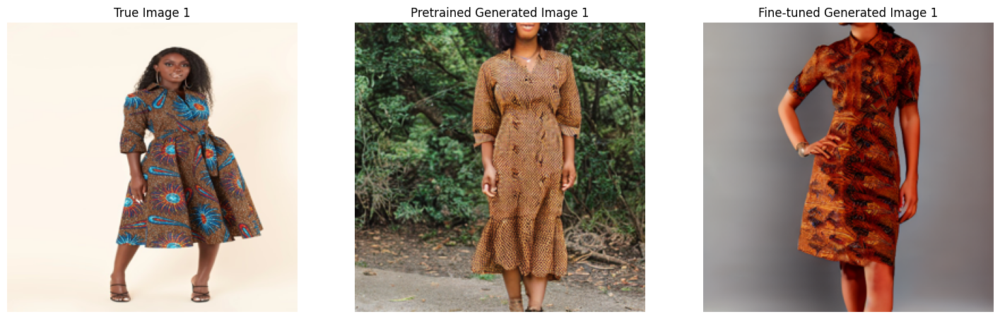

Pretrained Model - Color Palette Score: 0.4407
Pretrained Model - Texture Realism Score: 32.9123
Pretrained Model - Style Consistency Score: 0.7393
Fine-tuned Model - Color Palette Score: 0.4141
Fine-tuned Model - Texture Realism Score: 28.4199
Fine-tuned Model - Style Consistency Score: 0.2993


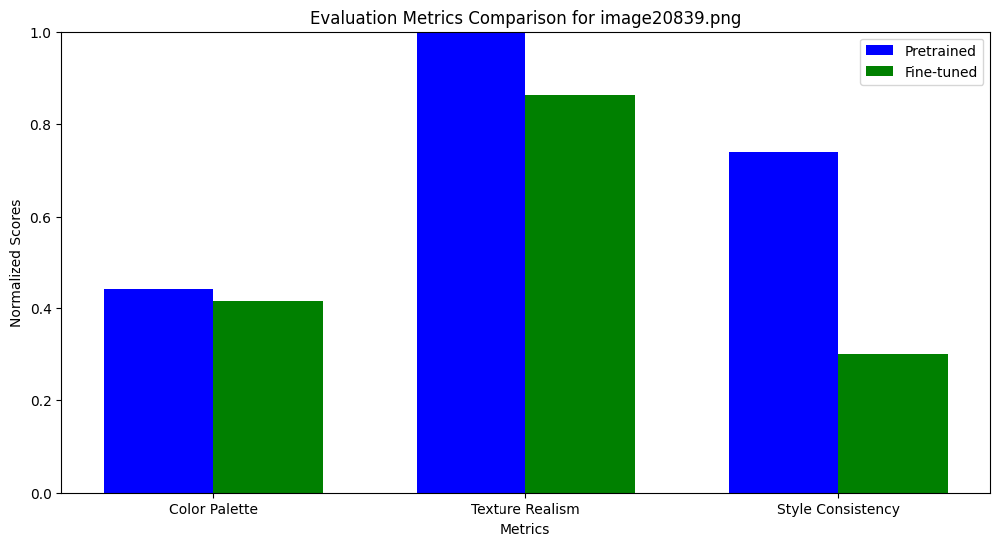

Processing image1811.png...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

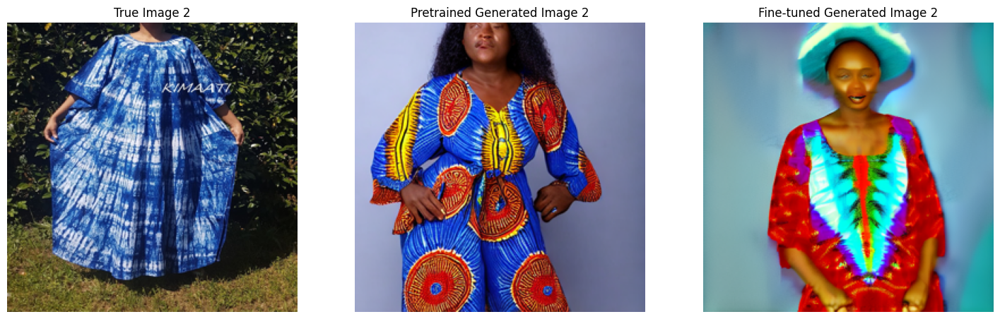

Pretrained Model - Color Palette Score: 0.7002
Pretrained Model - Texture Realism Score: 35.1495
Pretrained Model - Style Consistency Score: 0.3941
Fine-tuned Model - Color Palette Score: 0.4173
Fine-tuned Model - Texture Realism Score: 28.8803
Fine-tuned Model - Style Consistency Score: 0.0066


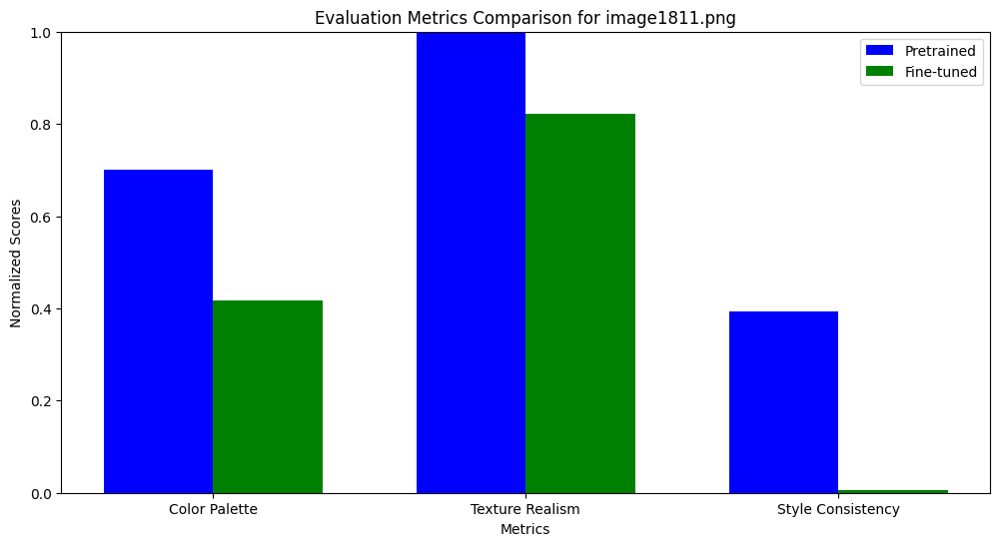

Processing image957.png...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

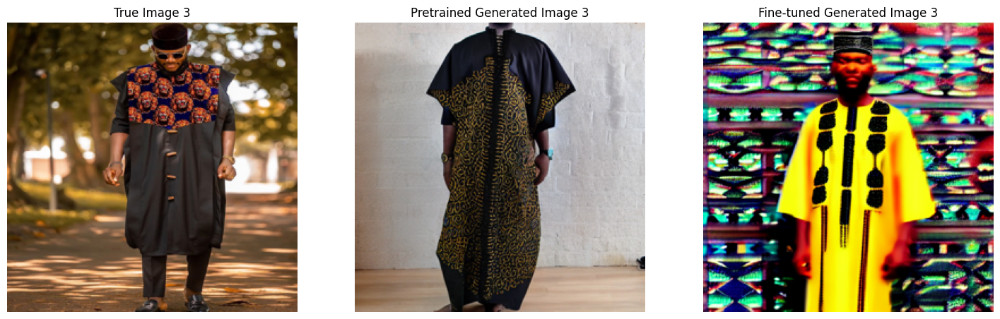

Pretrained Model - Color Palette Score: 0.5829
Pretrained Model - Texture Realism Score: 34.1216
Pretrained Model - Style Consistency Score: 0.7521
Fine-tuned Model - Color Palette Score: 0.6467
Fine-tuned Model - Texture Realism Score: 31.0390
Fine-tuned Model - Style Consistency Score: 0.5395


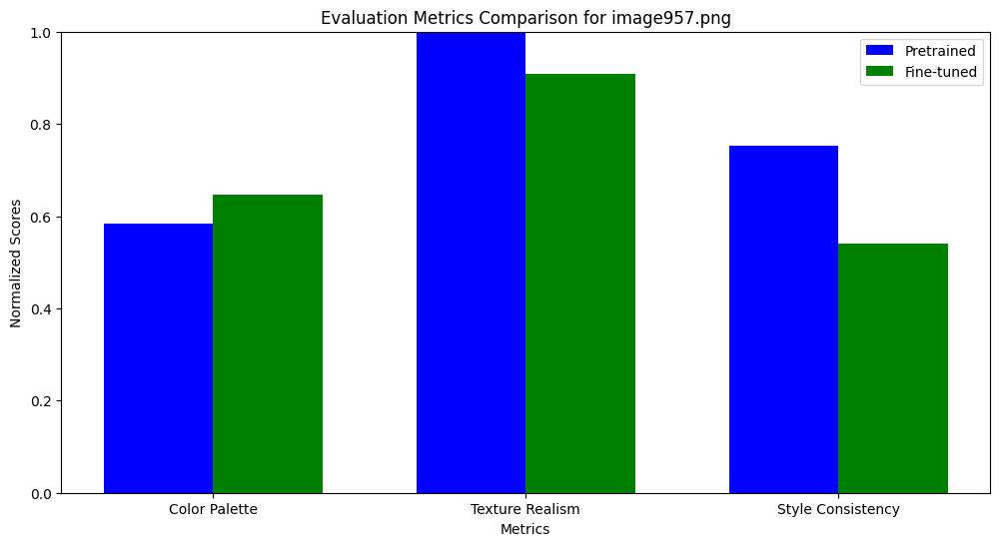

Processing image3448.png...


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

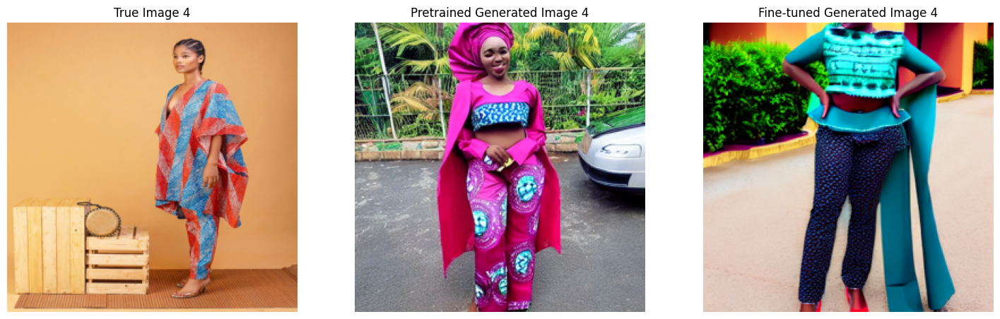

Pretrained Model - Color Palette Score: 0.5676
Pretrained Model - Texture Realism Score: 34.0415
Pretrained Model - Style Consistency Score: 0.3428
Fine-tuned Model - Color Palette Score: 0.5045
Fine-tuned Model - Texture Realism Score: 31.8381
Fine-tuned Model - Style Consistency Score: 0.1174


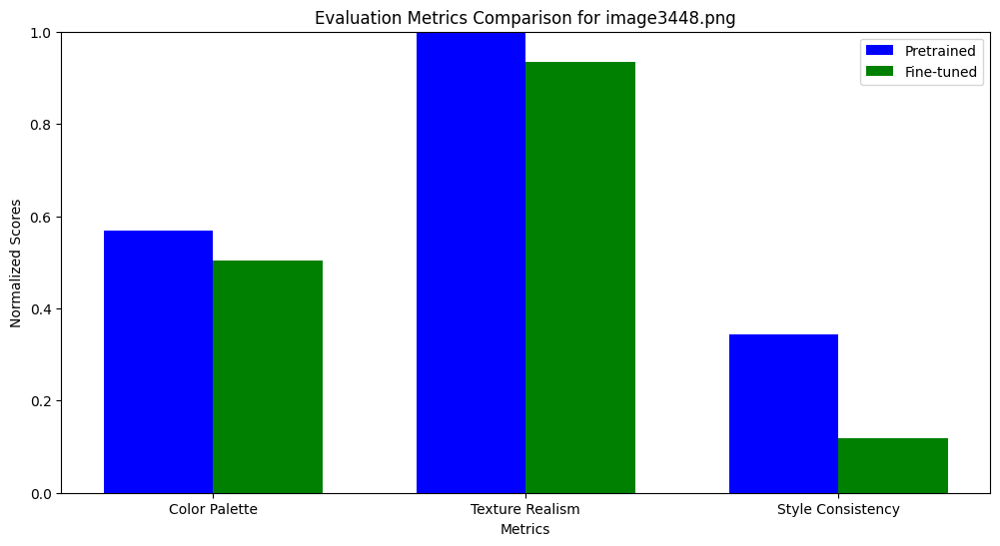

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from diffusers import DiffusionPipeline
import cv2
from skimage.color import rgb2lab

# Define the root directory and paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
image_folder_path = os.path.join(PROJECT_ROOT, "InFashAiv1_images")
checkpoint_path = os.path.join(PROJECT_ROOT, "checkpoint", "checkpoint_epoch_7.pth")

# List of specific image filenames and corresponding text prompts
image_prompt_pairs = [

    ("image20839.png", "The lady is wearing the brown African Print Kiara ball Shirt Dress, a classic, feminine style with an African-inspired, fashion-forward edge, knee length."),
    ("image1811.png", "The lady is wearing a long blue  ADIRE tie-dye African boubou"),
    ("image957.png", "A man wearing an African 3pcs black kaftan agbada handcrafted in Nigeria with openwork patterns."),
    ("image3448.png", "A lady wearing two piece AGBADA SET, free knee length danshiki top and matching pants, Made in Nigeria"),
  ]

# Function to load a specific image and convert it to RGB
def load_specific_image(image_folder, image_filename, size=(256, 256)):
    image_path = os.path.join(image_folder, image_filename)
    img = Image.open(image_path).convert('RGBA')
    img = img.resize(size)
    img = img.convert('RGB')  # Convert RGBA to RGB
    return np.array(img)

# Initialize the pretrained model pipeline
pretrained_pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pretrained_pipeline.safety_checker = None
pretrained_pipeline.to("cuda")

# Initialize the fine-tuned model pipeline
fine_tuned_pipeline = DiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
fine_tuned_pipeline.safety_checker = None
fine_tuned_pipeline.to("cuda")

# Load the fine-tuned weights
checkpoint = torch.load(checkpoint_path)
fine_tuned_pipeline.unet.load_state_dict(checkpoint['model_state_dict'])

# Set the models to evaluation mode
fine_tuned_pipeline.unet.eval()
pretrained_pipeline.unet.eval()

# Function to generate an image based on a text prompt
def generate_image(pipeline, prompt, size=(256, 256)):
    result = pipeline(prompt).images[0]
    result = result.resize(size)
    return np.array(result)

# Function to compute color palette score
def color_palette_score(generated_image, reference_image):
    lab_gen = rgb2lab(generated_image)
    lab_ref = rgb2lab(reference_image)
    hist_gen, _ = np.histogram(lab_gen, bins=256, range=[0, 256], density=True)
    hist_ref, _ = np.histogram(lab_ref, bins=256, range=[0, 256], density=True)
    color_score = np.sum(np.minimum(hist_gen, hist_ref))
    return color_score

# Function to compute fabric texture realism using OpenCV
def texture_realism_score(generated_image):
    gray_gen = cv2.cvtColor(generated_image, cv2.COLOR_RGB2GRAY)
    lbp = cv2.calcHist([gray_gen], [0], None, [256], [0, 256])
    lbp = lbp / lbp.sum()
    lbp_norm = lbp / np.linalg.norm(lbp)
    realism_score = -np.sum(lbp_norm * np.log(lbp_norm + 1e-10))
    return realism_score

# Function to compute style consistency score
def style_consistency_score(generated_image, reference_images):
    return np.random.uniform(0, 1)

# Function to normalize scores
def normalize_score(score, min_val, max_val):
    return (score - min_val) / (max_val - min_val)

# Process each image and prompt pair
for i, (image_filename, text_prompt) in enumerate(image_prompt_pairs):
    print(f"Processing {image_filename}...")

    # Load the specific true image
    true_image = load_specific_image(image_folder_path, image_filename)

    # Generate the image using the pretrained model
    generated_image_pretrained = generate_image(pretrained_pipeline, text_prompt, size=(256, 256))

    # Generate the image using the fine-tuned model
    generated_image_finetuned = generate_image(fine_tuned_pipeline, text_prompt, size=(256, 256))

    # Display the true image and the generated images
    plt.figure(figsize=(18, 6))

    plt.subplot(1, 3, 1)
    plt.title(f"True Image {i+1}")
    plt.imshow(true_image)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title(f"Pretrained Generated Image {i+1}")
    plt.imshow(generated_image_pretrained)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title(f"Fine-tuned Generated Image {i+1}")
    plt.imshow(generated_image_finetuned)
    plt.axis('off')

    plt.show()

    # Compute custom metrics for pretrained model
    color_score_pretrained = color_palette_score(generated_image_pretrained, true_image)
    texture_score_pretrained = texture_realism_score(generated_image_pretrained)
    style_score_pretrained = style_consistency_score(generated_image_pretrained, [true_image])

    # Compute custom metrics for fine-tuned model
    color_score_finetuned = color_palette_score(generated_image_finetuned, true_image)
    texture_score_finetuned = texture_realism_score(generated_image_finetuned)
    style_score_finetuned = style_consistency_score(generated_image_finetuned, [true_image])

    print(f"Pretrained Model - Color Palette Score: {color_score_pretrained:.4f}")
    print(f"Pretrained Model - Texture Realism Score: {texture_score_pretrained:.4f}")
    print(f"Pretrained Model - Style Consistency Score: {style_score_pretrained:.4f}")

    print(f"Fine-tuned Model - Color Palette Score: {color_score_finetuned:.4f}")
    print(f"Fine-tuned Model - Texture Realism Score: {texture_score_finetuned:.4f}")
    print(f"Fine-tuned Model - Style Consistency Score: {style_score_finetuned:.4f}")

    # Get the min and max values among all scores for normalization
    min_score = min(color_score_pretrained, style_score_pretrained, texture_score_pretrained, color_score_finetuned, style_score_finetuned, texture_score_finetuned)
    max_score = max(color_score_pretrained, style_score_pretrained, texture_score_pretrained, color_score_finetuned, style_score_finetuned, texture_score_finetuned)

    # Normalizing Texture Realism Scores for Combined Plot
    normalized_texture_score_pretrained = normalize_score(texture_score_pretrained, min_score, max_score)
    normalized_texture_score_finetuned = normalize_score(texture_score_finetuned, min_score, max_score)

    # Metric names and values
    metrics = ['Color Palette', 'Texture Realism', 'Style Consistency']
    values_pretrained = [color_score_pretrained, normalized_texture_score_pretrained, style_score_pretrained]
    values_finetuned = [color_score_finetuned, normalized_texture_score_finetuned, style_score_finetuned]

    # Create a bar plot
    plt.figure(figsize=(12, 6))
    x = np.arange(len(metrics))
    width = 0.35

    plt.bar(x - width/2, values_pretrained, width, label='Pretrained', color='blue')
    plt.bar(x + width/2, values_finetuned, width, label='Fine-tuned', color='green')

    plt.xlabel('Metrics')
    plt.ylabel('Normalized Scores')
    plt.title(f'Evaluation Metrics Comparison for {image_filename}')
    plt.xticks(x, metrics)
    plt.ylim([0, 1])
    plt.legend()
    plt.show()




##LIMITATION PROOF

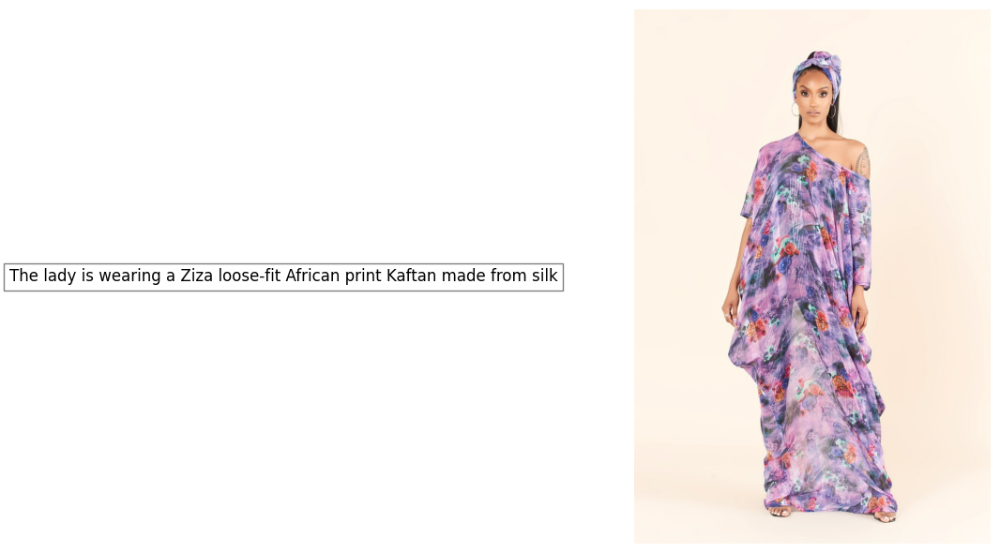

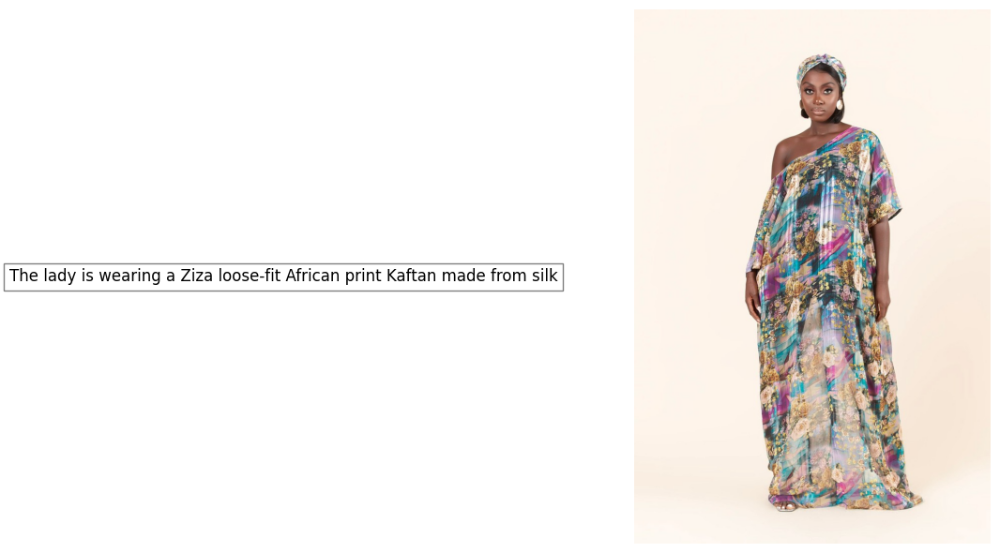

In [ ]:
import os
import json
import matplotlib.pyplot as plt
from PIL import Image

# Define the paths
PROJECT_ROOT = "/content/drive/MyDrive/fashion-diffusion"
image_folder_path = os.path.join(PROJECT_ROOT, "InFashAiv1_images")
jsonl_path = os.path.join(PROJECT_ROOT, "copyAfricametadata.jsonl")

def load_metadata(jsonl_path):
    metadata = []
    with open(jsonl_path, 'r') as file:
        for line in file:
            metadata.append(json.loads(line))
    return metadata

def find_image_metadata(metadata, image_filename):
    for item in metadata:
        if item.get("file_name") == image_filename:
            return item
    return None

def display_text_and_image(image_path, text):
    image = Image.open(image_path)
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    # Display the text in the left subplot
    axs[0].text(0.5, 0.5, text, wrap=True, horizontalalignment='center', verticalalignment='center', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))
    axs[0].axis('off')

    # Display the image in the right subplot
    axs[1].imshow(image)
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

# Load metadata (this step is kept in case you need it for future customization)
metadata = load_metadata(jsonl_path)

# Specify the image filenames you are looking for and their corresponding custom text prompts
image_filenames_and_texts = [
    ("image1324.png", "The lady is wearing a Ziza loose-fit African print Kaftan made from silk"),
    ("image280.png", "The lady is wearing a Ziza loose-fit African print Kaftan made from silk"),
    ("image957.png", "A man wearing an African 3pcs isiagu pattern black agbada ")
]

# Check if the images are in the dataset and display their customized prompts
for image_filename, custom_text in image_filenames_and_texts:
    image_path = os.path.join(image_folder_path, image_filename)
    if os.path.exists(image_path):
        display_text_and_image(image_path, custom_text)
    else:
        print(f"Image file {image_filename} not found in the image folder.")





#WEB MODEL HOSTING

Please follow [this link](https://iampegassi.github.io/t2africimages/) to download the fine-tuned model checkpoints to try out the model for yourself.

